# QEP: Supervised learning

(This notebook started April 2024; MIT license, (C) C. Wanjura and F. Marquardt 2024)

Performing Quantum Equilibrium Propagation (QEP), in a supervised-learning setting. This notebook demonstrates the basic functionalities. The actual production code used for creating the figures is provided separately.

Apart from standard numpy, we require optax (from the jax ecosystem), purely for doing the Adam adaptive gradient descent. We are not using any actual jax routines, since the gradients are obtained using QEP instead of automatic differentiation.

This notebook contains code to:

- create an arbitrary qubit or spin chain Hamiltonian out of Pauli matrices (see [produceXYZ](#scrollTo=Jc08_aQtxQOQ&line=36&uniqifier=1) )
- find the ground state and its energy (see [ground_state](#scrollTo=Jc08_aQtxQOQ&line=44&uniqifier=1))
- calculate expectation values (see [expectation](#scrollTo=Jc08_aQtxQOQ&line=20&uniqifier=1))
- produce the example phase diagram of the cluster Ising Hamiltonian (see [get_phase_diagram_CI](#scrollTo=S-30TemmRkNe&line=24&uniqifier=1))
- generate QEP Hamiltonians with input terms, trainable terms, and nudge terms (see [QEP_Hamiltonian](#scrollTo=lMTpBSr5ovBm&line=19&uniqifier=1) )
- obtain the gradient of some expectation value with respect to the trainable parameters (see [gradient_for_batch](#scrollTo=hE7HaWOYF3x-&line=18&uniqifier=1))
- some test code for all of the above (Hamiltonian generation and ground states, QEP gradients, phase diagram)
- Phase recognition in the cluster Ising Hamiltonian


In [1]:
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from tqdm import tqdm
import optax

# nice graphics
%config InlineBackend.figure_format = 'retina'

## General routines for constructing operators


In [2]:
Xop=sp.sparse.csr_array([[0.,1.],[1.,0.]]) # Pauli X as a sparse matrix
Yop=sp.sparse.csr_array([[0,-1j],[1j,0.]])
Zop=sp.sparse.csr_array([[1.,0.],[0.,-1]])

In [3]:
def operator(op,idx,N):
  """
  Produce an operator that has single-qubit operator op acting
  on qubit with index idx, and the rest is identity. N is the total number of qubits.
  idx count starts at 0 and runs up to N-1.

  Example: Z_3
  >> operator(Zop,3,10)

  Example: X_0 X_2
  >>  operator(Xop,0,10) @ operator(Xop,2,10)
  """
  return sp.sparse.kron( sp.sparse.identity(2**idx), sp.sparse.kron(op, sp.sparse.identity(2**(N-idx-1))) )

def get_identity(N):
  """
  Return identity operator for an N-qubit system
  """
  return sp.sparse.identity(2**N)

def expectation(psi,op):
  """
  Calculate the expectation value of observable operator op with respect to state psi.
  This takes the real part automatically, assuming op is Hermitean !
  """
  return np.real( np.sum( np.conj(psi) * (op @ psi) ) )

def fluctuating_expectation(psi,op, M):
  """
  Calculate the expectation value of op with respect to psi. Also
  calculate the variance of op. Then imagine M measurement shots
  are conducted and return a Gaussian-sampled value of the empirically
  observed average, i.e. for op=A:
      A_observed ~ NormalDist(mu=<A>,sigma=sqrt(Var(A)/M))
  This is a reasonable approximation for 'large' M, where in practice
  M=10 is already large. It is not OK for M=1.
  
  Note: we assume op is Hermitean.
  """
  op_avg=np.real( np.sum( np.conj(psi) * (op @ psi) ) )
  op2_avg=np.real( np.sum( np.conj(psi) * (op @ (op @ psi) ) ) )
  sigma=np.sqrt((op2_avg-op_avg**2)/M)
  return sigma*np.random.randn()+op_avg

def empty_matrix(n_dim):
  """
  Return the empty sparse matrix for a system of Hilbert space dimension n_dim.
  """
  return sp.sparse.csr_matrix((n_dim, n_dim), dtype='complex')

def produce_XYZ(N):
  """
  Return X,Y,Z = a list of all Pauli X operators, all Pauli Y, all Pauli Z,
  for given qubit number N
  """
  return ( [operator(Xop,idx,N) for idx in range(N)] ,
            [operator(Yop,idx,N) for idx in range(N)] ,
            [operator(Zop,idx,N) for idx in range(N)] )


def ground_state(H):
  """
  Return ground state of H, using sparse Lanczos.
  Returns eigenvalue, eigenvector
  """
  evals,evecs=sp.sparse.linalg.eigsh(H, k=1, which='SA')
  return evals[0], evecs[:,0]


## General routines for QEP


In [4]:
def QEP_Hamiltonian(H0,x,H_x_terms,theta,H_theta_terms,nu,H_nu_terms):
  """
  Construct a QEP Hamiltonian from the given components.

  H_0 - a parameter-independent Hamiltonian

  x   - a vector (list or array) of input values
  H_x_terms - a list of corresponding terms in the Hamiltonian

  theta - a vector (list or array) of trainable parameters
  H_theta_terms - a list of corresponding terms in the Hamiltonian

  nu - a vector (list or array) of nudge parameters, applied to output observables
  H_nu_terms - a list of corresponding terms in the Hamiltonian

  Note: nu may be None, in which case no H_nu_terms are added.

  Returns the Hamiltonian H as a sum of all these terms.
  """
  H=H0

  for x_term, H_term in zip(x,H_x_terms):
    H+= x_term * H_term

  for theta_term, H_term in zip(theta,H_theta_terms):
    H+= theta_term * H_term

  if nu is not None:
    for nu_term, H_term in zip(nu,H_nu_terms):
      H+= nu_term * H_term

  return H

In [5]:
def get_gradient_at_x(H, E, psi, error_signal, H_nu_terms, H_theta_terms, eta, 
                      nonsparse=False,finite_nudging=None,shot_noise=None,
                     symmetric_nudging=False):
  """
  Return the cost-function gradient, for updating the trainable theta parameters,
  for one fixed input x.

  Given:
    - full Hamiltonian H (provided for a particular input x)
    - its ground state energy E
    - its ground state psi
    - the H_nu_terms (list of output operators)
    - the H_theta_terms (list of trainable operators)
    - error_signal (vector of length len(H_nu_terms)
            entries given as error_j = d C / d <output_j>)
    - eta: regularization parameter for inverting E-H during perturbation
           theory (we will solve (E-H + 1j eta) x = b, with b orthogonal
           to the nullspace of E-H).
    - nonsparse: if True, use non-sparse matrix routine (is not useful)
    - finite_nudging: if not None, use this value for simulating the finite
            nudging (actual physical shift to a new ground state) instead
            of the linear response calculation
    - shot_noise: if not None, interpret this as the number of measurement
            shots and use fluctuating empirical expectation values instead
            of the idealized expectation values. Important: Can only be
            used together with finite_nudging! (see fluctuating_expectation
            for explanation of how it uses a Gaussian approximation; 
            shot_noise should be larger than say 5 to have a reasonable
            approximation to the underlying true distribution)
    - symmetric_nudging: if True, use symmetric nudging

  Return the derivative of the cost function C with respect to theta parameters,
  calculated via perturbation theory in the nudging terms (= output operators).

  gradient_k = sum_j (d C / d <output_j>) * (d <output_j> / d theta_k)

  This will be calculated via perturbation theory, using the output operators
  as perturbation. It reflects the result of the QEP procedure for
  infinitesimal nudging. For maximum efficiency, we consider the response to
  the linear superposition output operator that is
    OUT = sum_j dC/d<output_j> * output_j
  (instead of first calculating the response to each output_j operator and
  only then summing afterwards)

  Note the result returned here still has to be averaged over x, e.g. in a mini-batch.
  """
  n_dim = np.shape(H)[0] # Hilbert space dimension
  Out_operator = empty_matrix(n_dim)

  for weight,term in zip(error_signal,H_nu_terms):
    Out_operator += weight * term

  Out_expectation = expectation(psi, Out_operator)

  if finite_nudging is None:
      # Result will involve dpsi = (E-H)^(-1) @ Out_op @ psi
      # For efficiency, never invert a matrix when solving a linear system will do
      # Here, we try to subtract the projection of Out_operator @ psi onto
      # psi itself. Will it work?
      if nonsparse:
        M_full = ((E+1j*eta)*sp.sparse.identity(n_dim) - H).todense()
        dpsi = np.linalg.solve( M_full, Out_operator @ psi - Out_expectation * psi)
      else:
        dpsi = sp.sparse.linalg.spsolve( (E+1j*eta)*sp.sparse.identity(n_dim) - H ,
                                      Out_operator @ psi - Out_expectation * psi)

      # for any trainable coupling operator 'term', the response
      # will now be  <psi| term | dpsi> + c.c.
      # Thus, return the gradient dC/dtheta_j as follows:
      return np.array( [2*np.real( np.sum( np.conj(psi) *  (term @ dpsi) ) )
                          for term in H_theta_terms] )
  else: # simulate the actual physical nudging
    # first calculate old expectation values of theta terms:
    if shot_noise is None:
        get_expectation=expectation
    else:
        get_expectation=lambda psi,op: fluctuating_expectation(psi,op,shot_noise)
    
    def theta_expectations(state):
        return np.array([ get_expectation(state,term)
                            for term in H_theta_terms])
    old_expectations = theta_expectations(psi)
    H_new = H + finite_nudging * Out_operator # add the nudge
    _,psi_new = ground_state(H_new)
    new_expectations = theta_expectations(psi_new)
    if symmetric_nudging:
        H_new = H - finite_nudging * Out_operator # add the nudge
        _,psi_new = ground_state(H_new)
        negative_new_expectations = theta_expectations(psi_new)
        return (new_expectations - negative_new_expectations)/(2*finite_nudging)
    else:
        return (new_expectations - old_expectations)/finite_nudging
    

In [6]:
def gradient_for_batch(x_batch, y_batch, dC, theta, H0, H_x_terms, 
                       H_nu_terms, H_theta_terms,nonsparse=False,finite_nudging=None,
                      shot_noise=None,symmetric_nudging=False):
  """
  Get the gradient of the cost function with respect to theta, averaged
  over a mini-batch of input vectors x.

  - x_batch: batch of input vectors --
    array of shape (batchsize, x_dimension), where x_dimension equals len(H_x_terms)
  - y_batch: batch of output vectors --
    array of shape (batchsize, y_dimension), where y_dimension equals len(H_nu_terms)
  - dC: a function with two arguments dC(y,y_target) that is the derivative of the
    cost function C with respect to y, at given y_target. For a quadratic cost function,
    dC(y,y_target) = 2 * (y-y_target)
  - theta: current array of trainable parameters
  - H0: fixed part of Hamiltonian
  - H_x_terms: list (or array) of terms in Hamiltonian to be multiplied with x vector entries
  - H_nu_terms: list of output operators
  - H_theta_terms: list of terms that go along with trainable parameters (same length as theta array)
  - nonsparse: if True, use non-sparse matrix routine (is not useful)
  - finite_nudging: if not None, use this value for simulating the finite
        nudging (actual physical shift to a new ground state) instead
        of the linear response calculation
  - shot_noise: if not None, this is the number of measurement shots. Only
        valid together with finite_nuding. See get_gradient_at_x.
  - symmetric_nudging: see get_gradient_at_x
  """
  grad=np.zeros(len(theta))
  batchsize=np.shape(x_batch)[0]

  for idx in range(batchsize):
    H=QEP_Hamiltonian(H0, x_batch[idx], H_x_terms,
                      theta, H_theta_terms, None, None) # nu terms set to None
    E,psi=ground_state(H) # for this particular x
    y=np.array( [expectation(psi, out_op) for out_op in H_nu_terms] ) # all outputs
    error_signal=dC(y,y_batch[idx]) # gradient of C with respect to output
    grad+=get_gradient_at_x(H,E,psi,error_signal,H_nu_terms,H_theta_terms,
                            nonsparse,finite_nudging,shot_noise,symmetric_nudging=symmetric_nudging)

  return grad / len(x_batch)


## Small tests of operator machinery (without QEP stuff)

In [218]:
# generate all the single-qubit operators:
N = 10 # qubit number
X,Y,Z = produce_XYZ(N)

In [219]:
# test commutator:
A = X[1] @ Z[1] - Z[1] @ X[1]
B = -2j*Y[1]
np.max(np.abs(A-B)) # should be zero

0.0

In [220]:
# Example: Heisenberg chain with periodic boundary conditions, anti-ferromagnetic

# Hamiltonian
H = empty_matrix(2**N)
for j in range(N):
  H += X[j] @ X[(j+1)%N] + Y[j] @ Y[(j+1)%N] + Z[j] @ Z[(j+1)%N] # (j+1)%N makes it periodic

# Get the ground state
E0,psi0=ground_state(H)

In [221]:
print("Ground state energy per spin: ", E0/N)
print("Ground state <ZZ>: ", expectation( psi0, Z[0] @ Z[1]) )
print("Ground state H expectation: ", expectation( psi0, H ))

Ground state energy per spin:  -1.8061785417968181
Ground state <ZZ>:  -0.6020595139322724
Ground state H expectation:  -18.061785417968174


In [227]:
# testing fluctuating expectation values:
ZZop=Z[0] @ Z[1]
ZZ_avg=expectation( psi0, ZZop) 
ZZ2_avg=expectation( psi0, ZZop @ ZZop)
VarZZ=ZZ2_avg-ZZ_avg**2
M=10
print("<ZZ> and Var(<ZZ>):", ZZ_avg, VarZZ)
sigma=np.sqrt(VarZZ/M)
print("Expected spread for M msmts:", sigma)
print("A few samples:")
for j in range(5):
    print(fluctuating_expectation(psi0,ZZop,M))
n_msmt=1000
values=np.array([fluctuating_expectation(psi0,ZZop,M) for _ in range(n_msmt)])

print("Empirical spread after 1000 tries:", np.sqrt(np.average(values**2)-
                                                    np.average(values)**2))

<ZZ> and Var(<ZZ>): -0.6020595139322724 0.6375243416836358
Expected spread for M msmts: 0.2524924437846875
A few samples:
-0.4803256472200937
0.06441149143381086
-0.8498087882436723
-0.8535984437597148
-0.6109371315454045
Empirical spread after 1000 tries: 0.253796615872135


In [ ]:
# for N=10, this sparse approach is about 50 times faster (!) than the full non-sparse diagonalization
%timeit E,psi=ground_state(H)

32.7 ms ± 4.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Small tests of QEP routines

In [194]:
# Constructing a QEP Hamiltonian
N=3 # 3 qubits
X,Y,Z=produce_XYZ(N)

H0=X[0] @ X[1]
x=[0.5,2.0]
H_x_terms=[Z[0],Z[2]]
theta=[0.3,0.7]
H_theta_terms=[Z[0] @ Z[1], Z[1] @ Z[2]]
nu=[ 0.2 ]
H_nu_terms=[ Y[1]]

H=QEP_Hamiltonian(H0,x,H_x_terms,theta,H_theta_terms,nu,H_nu_terms)
# what we expect:
H_expected=H0 + 0.5*Z[0] + 2*Z[2] + 0.3 * Z[0] @ Z[1] + 0.7*Z[1] @ Z[2] + 0.2*Y[1]

print(np.max(np.abs(H-H_expected))) # should be zero!

0.0


In [197]:
# get the gradient
N=2
X,Y,Z=produce_XYZ(N)

H0=Z[0]+Z[1]+0.3*X[1]
x=[1.0]
H_x_terms=[X[0]]
theta=[0.5]
H_theta_terms=[Z[0] @ Z[1]]
nu=[0.0]
H_nu_terms=[X[1]]

H=QEP_Hamiltonian(H0,x,H_x_terms,theta,H_theta_terms,nu,H_nu_terms)
E,psi=ground_state(H)

error_signal = [ 1.0 ]
eta = 1e-7 # small fudge parameter for perturbation theory
the_gradient = get_gradient_at_x(H, E, psi, error_signal, H_nu_terms, H_theta_terms, eta)

# numerical gradient:
dtheta=1e-5
theta_prime=[theta[0]+dtheta]
H_prime=QEP_Hamiltonian(H0,x,H_x_terms,theta_prime,H_theta_terms,nu,H_nu_terms)
E_prime,psi_prime=ground_state(H_prime)

out_op=H_nu_terms[0]
numerical_gradient = ( expectation(psi_prime, out_op) - expectation(psi, out_op)) / dtheta

# gradient from physical simulation of QEP nudging:
nudge_gradient = get_gradient_at_x(H,E,psi,error_signal,H_nu_terms,H_theta_terms,eta,
                                  finite_nudging=0.01)

print("Gradient from perturbation theory: ", the_gradient[0])
print("Numerical gradient: ", numerical_gradient)
print("Nudge gradient: ", nudge_gradient)

Gradient from perturbation theory:  -0.24539988842421354
Numerical gradient:  -0.24540001514194995
Nudge gradient:  [-0.24740098]


In [ ]:
sp.sparse.linalg.spsolve( sp.sparse.csr_array([[1e-8j,0.],[0.,1.]]), np.array([0.,3.]) )

array([0.+0.j, 3.+0.j])

## Warmup: QEP for distinguishing a singlet state from a triplet state?

Note: This is of course too simple, since the singlet to triplet transition will produce a large change in the signal even when the Q learning machine Hamiltonian has random couplings !

In [ ]:
N_sys=2 # actual system qubits
N_rec=3 # recognition model qubits

N=N_sys + N_rec
X,Y,Z=produce_XYZ(N)

def C(i,j): # Heisenberg spin*spin coupling S_i * S_j
  return X[i]*X[j] + Y[i]*Y[j] + Z[i]*Z[j]

# the fixed part: (here slight symmetry breaking to pick one triplet state)
H0 = 0.01 * Z[0]

# the input part:
x = [0.3] # input variable
H_x_terms = [ C(0,1) ]

# tuneable terms:
H_theta_terms = [ C(0,2), C(0,3), C(0,4), C(1,2), C(1,3), C(1,4), C(2,3), C(3,4), C(2,4) ]
small=0.01
theta = small * np.random.randn(len(H_theta_terms))

# output nudging terms:
H_nu_terms = [ Z[4] ] # output observable
nu = [ 0.0 ]

# get full Hamiltonian
H = QEP_Hamiltonian( H0, x, H_x_terms, theta, H_theta_terms, nu, H_nu_terms )

In [ ]:
E,psi = ground_state(H)

print("Energy: ", E)
print("Ground state <Z_4>: ", expectation(psi,Z[4]))
print("Spin-spin correlator on H0 space: ", expectation(psi, C(0,1)) ) # -3*sign(x) if unperturbed

Energy:  -0.937229518920879
Ground state <Z_4>:  0.999683783151595
Spin-spin correlator on H0 space:  -2.9941882962674433


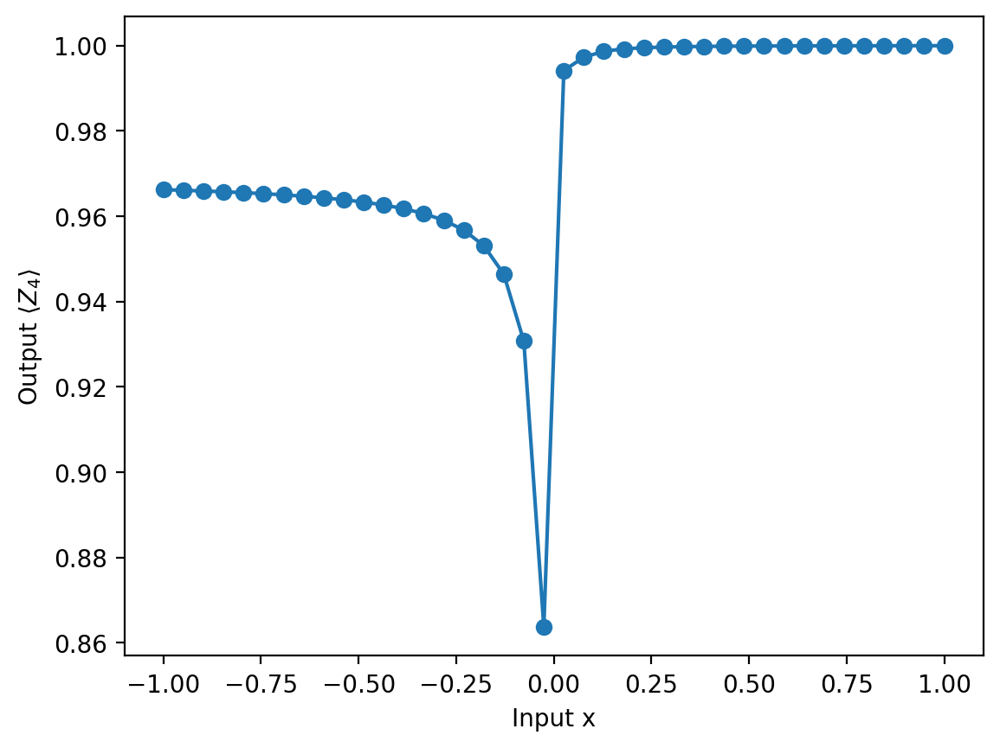

In [ ]:
# now plot 'outputs' vs. input x
#
# If this were a fully trained system, the outputs should
# all switch at x=0, when the system H0 state switches between
# triplet and singlet !
#
# In fact, even for a random system, it switches, simply
# because the change in H0 overwhelms every other effect!
#
# To really test QEP, we need a situation where the ground state
# changes more smoothly but the output signal should still
# recognize clearly distinct phases!

xs=np.linspace(-1.,1.,40)
outputs=[]

for x in xs:
  H = QEP_Hamiltonian( H0, [x], H_x_terms, theta, H_theta_terms, nu, H_nu_terms )
  E,psi = ground_state(H)
  outputs.append(expectation(psi,Z[4]))

plt.plot(xs,outputs, '-o')
plt.xlabel("Input x")
plt.ylabel(r"Output $\langle Z_4 \rangle$")
plt.show()

## Phase diagram of the cluster Ising Hamiltonian

We are trying to implement the Hamiltonian that was investigated by Pollmann et al when they tested a QCNN for phase identification (see https://arxiv.org/pdf/2211.11786.pdf , also earlier work by Lukin group, and earlier Pollmann paper https://arxiv.org/pdf/1910.05351.pdf)

$H = g_{\rm zxz} \sum_j Z_{j-1} X_j Z_{j+1} - g_{\rm zz} \sum_j Z_j Z_{j+1} - g_x \sum_j X_j$

The last two parts are the usual transverse-field Ising chain, the first part is some cluster Hamiltonian. The whole Hamiltonian is solvable by mapping to free fermions.

In [139]:
def HamiltonianCI(parameters,paulis,N,delta_H):
  """
  Return the Hamiltonian of the Cluster Ising model,
  for N qubits.

  H = gZXZ sum_j Z_{j-1} X_j Z_{j+1} - gZZ sum_j Z_j Z_{j+1} - gX sum_j X_j

  parameters=(gZXZ,gZZ,gX): the parameters
  paulis=(X,Y,Z): the lists of Pauli operators
  N: number of qubits
  delta_H: optional change in Hamiltonian
  """
  gZXZ,gZZ,gX=parameters
  X,Y,Z=paulis
  H=empty_matrix(2**N)

  for j in range(N):
    H += gZXZ * Z[j] @ X[(j+1)%N] @ Z[(j+2)%N] - gZZ * Z[j] @ Z[(j+1)%N] - gX * X[j]

  if delta_H is not None:
    H += delta_H
  return H

def getGroundStateCI(parameters,paulis,N,delta_H=None):
  """
  Return H,E,psi for the Hamiltonian, ground state energy, and ground state
  of the cluster Ising model.

  parameters=(gZXZ,gZZ,gX): the parameters
  paulis=(X,Y,Z): the lists of Pauli operators
  N: number of qubits
  delta_H: option for changing the Hamiltonian

  See HamiltonianCI.
  """
  H=HamiltonianCI(parameters,paulis,N,delta_H=delta_H)
  E,psi=ground_state(H)
  return H,E,psi

In [140]:
# Quick first test

N=10
X,Y,Z=produce_XYZ(N) # Paulis
paulis=(X,Y,Z)

gZXZ=0.4
gZZ=0.5
gX=0.3

parameters=(gZXZ,gZZ,gX)
H,E,psi=getGroundStateCI(parameters,paulis,N)
print("<ZZ> in ground state:", expectation(psi,Z[1] @ Z[2]))

<ZZ> in ground state: 0.5463052539059849


In [141]:
# Phase Diagram

# try to obtain the phase diagram
# we assume that the *sum* of all three couplings is set equal to 4
# this provides a kind of normalization, and it seems what Pollmann et al
# are always using when they plot their 'triangular' phase diagrams.

# for N=10, M=30 this takes about 30 sec on colab without GPU

def get_phase_diagram_CI(paulis,M=30,delta_H=None):
  """
  Get the cluster Ising phase diagram.

  paulis: (X,Y,Z) the Pauli operators
  M: number of pixels in phase diagram (M x M, but only a triangular part of that)
  delta_H: if you want to add something to the Hamiltonian (e.g. breaking integrability)

  Returns:
  pars, expectation_values

  where:
  pars=MxMx3 array that contains the (gZXZ,gZZ,gX) values at each location
  expectation_values=(E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ)

  where each of these is a MxM array itself.
  """
  X,Y,Z=paulis

  # operators we are interested in:
  Z01=Z[0] @ Z[1]
  Z05=Z[0] @ Z[5]
  Zstring04=Z[0] @ Z[1] @ Z[2] @ Z[3] @ Z[4]
  Zstring05=Zstring04 @ Z[5]
  X01=X[0] @ X[1]
  X05=X[0] @ X[5]
  ZXZ=Z[0] @ X[1] @ Z[2]

  # collecting them all:
  observables=(Z01,Z05,X01,X05,X[0],Z[0],Zstring04,Zstring05,ZXZ)

  # a place to store their expectation values while sweeping the phase diagram:
  E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ=[np.zeros((M,M)) for _ in range(9)]
  expectation_values=(E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ)

  # to save the parameters at each location in the phase diagram: pars[jX,jZXZ,:]=(gZXZ,gZZ,gX)
  pars=np.zeros((M,M,3))

  # helper function for storing all the expectation values at each location in
  # the phase diagram:
  def assign_values(expectation_values,observables,jX,jZXZ,psi):
    for value_array,the_operator in zip(expectation_values,observables):
      value_array[jX,jZXZ]=expectation(psi, the_operator)

  # sweep through the phase diagram:
  for jX,gX in enumerate(np.linspace(0,4,M)):
    for jZXZ,gZXZ in enumerate(np.linspace(0,4,M)):
      gZZ=4-gX-gZXZ
      if gZZ>=-1e-5: # only keep positive values of gZZ (following the original papers)
        parameters=(gZXZ,gZZ,gX)
        H,E,psi=getGroundStateCI(parameters,paulis,N,delta_H=delta_H) # get ground state
        assign_values(expectation_values,observables,jX,jZXZ,psi) # store expectation values
        pars[jX,jZXZ]=parameters
      else:
        pars[jX,jZXZ]=(np.nan,np.nan,np.nan) # points outside the triangle

  return pars, expectation_values

In [142]:
# code to eventually allow more flexible trajectories through the phase diagram:
#   parameter_trajectory: if provided, an array of M x 3, with the three parameters at each location
#    for 1D cuts through the phase diagram
# if parameter_trajectory is None:
#   parameter_trajectory=np.zeros((M,M,3))
#   parameter_trajectory[:,:,0]=np.linspace(0,4,M)[None,:] # gZXZ
#   parameter_trajectory[:,:,2]=np.linspace(0,4,M)[:,None] # gX
#   parameter_trajectory[:,:,1]=4-parameter_trajectory[:,:,0]-parameter_trajectory[:,:,2]
#   ...now set all invalid parameters to np.nan...
#   parameter_trajectory[:,:,0]=...

In [143]:
# helper function for plotting the phase diagram,
# in the triangular form shown in the Pollmann papers:
def plot_phasediagram(pars,value,title,size=3):
  """
  Plot the phase diagram of the cluster Ising (or related) Hamiltonian.

  pars is the array containing the tuples (gZXZ,gZZ,gX), and
  we plot gX to the right, gZZ vertically.

  value is the array of stored expectation values.

  title is the title.

  size determines the size of the individual circles.

  Phase boundaries according to the analytical calculation are included.
  """
  plt.figure(figsize=(3,2.5))
  plt.scatter(pars[:,:,2]+0.5*pars[:,:,1],pars[:,:,1],c=value,s=size**2)
  plt.axis('off')
  plt.plot([.95,3.05],[2,2],color="black",linewidth=1)
  plt.plot([2,2],[-0.05,2],color="black",linewidth=1)
  plt.text(1.8,-0.6,r"$g_X$")
  plt.text(3.3,2,r"$g_{ZZ}$")
  plt.title(title)
  plt.plot([0,4],[-0.2,-0.2],color="gray",linewidth=1)
  plt.text(-0.1,-0.6,"0")
  plt.text(3.9,-0.6,"4")
  plt.plot([4.2,2.2],[+0,4],color="gray",linewidth=1)
  plt.text(4.2,0.1,"0")
  plt.text(2.4,3.8,"4")
  plt.show()

In [144]:
N=10
X,Y,Z=produce_XYZ(N) # Paulis
paulis=(X,Y,Z)
pars,expectation_values=get_phase_diagram_CI(paulis,M=30)
E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ=expectation_values

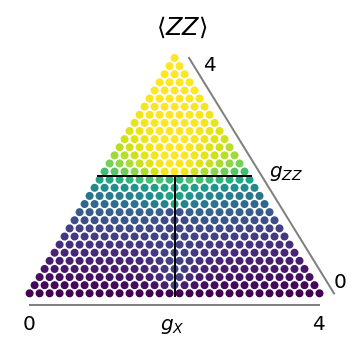

-3.608224830031759e-16 1.0000000000000007


In [146]:
# ZZ correlator is large when gZZ crosses the transition line towards the
# ferromagnetic phase
plot_phasediagram(pars,E_ZZ,r"$\langle ZZ \rangle$")
print(np.amin(E_ZZ), np.amax(E_ZZ))

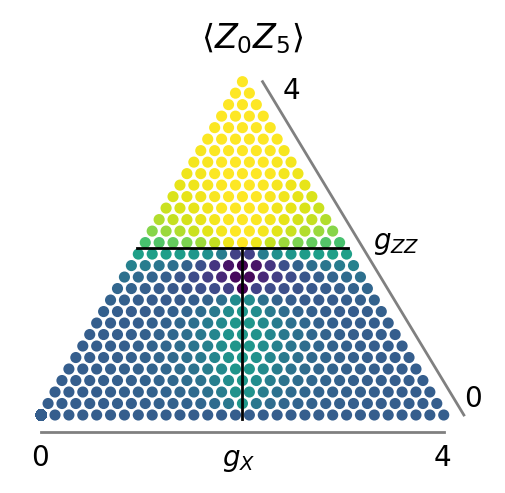

In [ ]:
# we expect long-range Z-order in the ferromagnetic phase,
# so we check not only nearest neighbor correlators, but also Z0Z5
# the jump seems(?) even more pronounced at the phase boundary, as it should
plot_phasediagram(pars,E_Z0Z5,r"$\langle Z_0 Z_5 \rangle$")

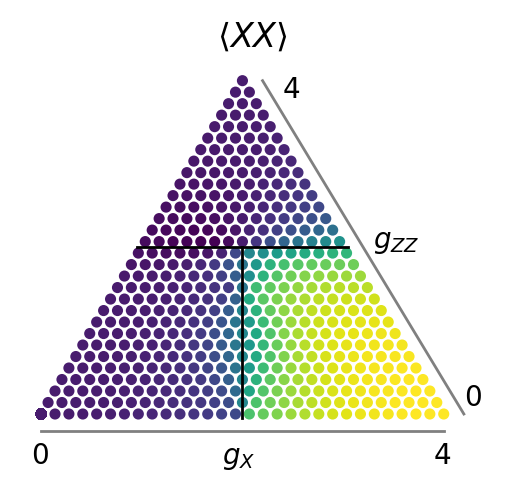

In [ ]:
# the XX correlator (and also E_X itself) should be large
# in the paramagnetic phase, where we apply a field in X direction
plot_phasediagram(pars,E_XX,r"$\langle XX \rangle$")

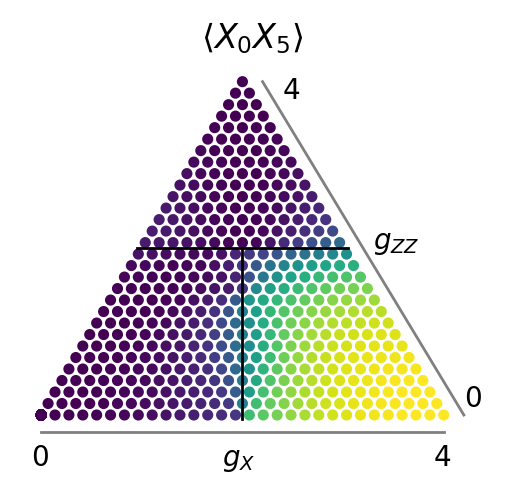

In [ ]:
plot_phasediagram(pars,E_X0X5,r"$\langle X_0 X_5 \rangle$")

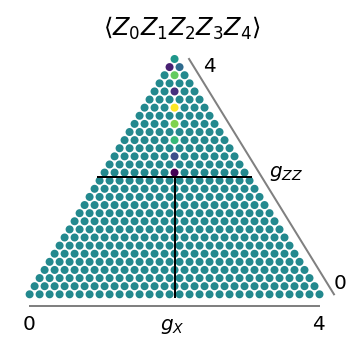

In [147]:
# DANGER: wrong definition

# I have no idea whether this string of Z is a useful observable...
plot_phasediagram(pars,E_Zstring04,r"$\langle Z_0 Z_1 Z_2 Z_3 Z_4\rangle$")

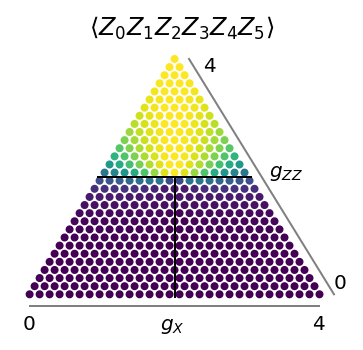

In [148]:
# DANGER: wrong definition
plot_phasediagram(pars,E_Zstring05,r"$\langle Z_0 Z_1 Z_2 Z_3 Z_4 Z_5\rangle$")

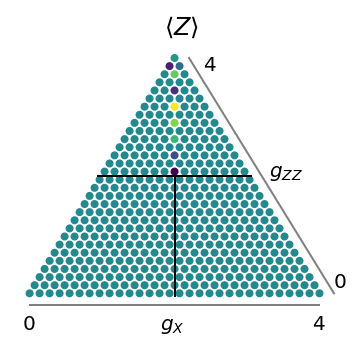

In [149]:
plot_phasediagram(pars,E_Z,r"$\langle Z \rangle$")
# apparently should be zero, except for some errors

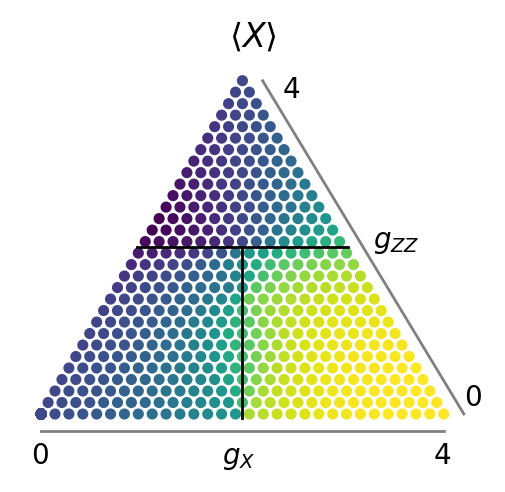

In [ ]:
plot_phasediagram(pars,E_X,r"$\langle X \rangle$")

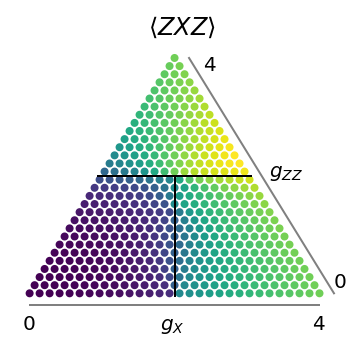

-1.0000000000000004 0.2780926482069461


In [150]:
# the ZXZ correlator should be suppressed in the lower-left corner,
# where gZXZ * ZXZ suppresses it (since gZXZ is positive and large!)
# I don't have any idea whether ideally this correlator should jump
# at the phase boundaries
plot_phasediagram(pars,E_ZXZ,r"$\langle ZXZ \rangle$")
print(np.amin(E_ZXZ), np.amax(E_ZXZ))

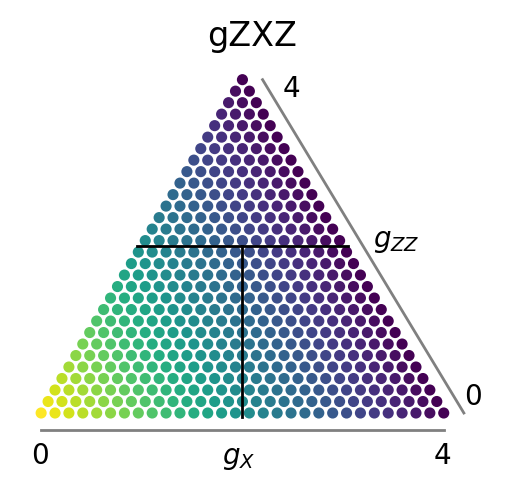

In [ ]:
# just checking that the parameters, e.g. g_ZXZ behave in the right way
# as we sweep across this funny triangular phase diagram
plot_phasediagram(pars,pars[:,:,0],"gZXZ")

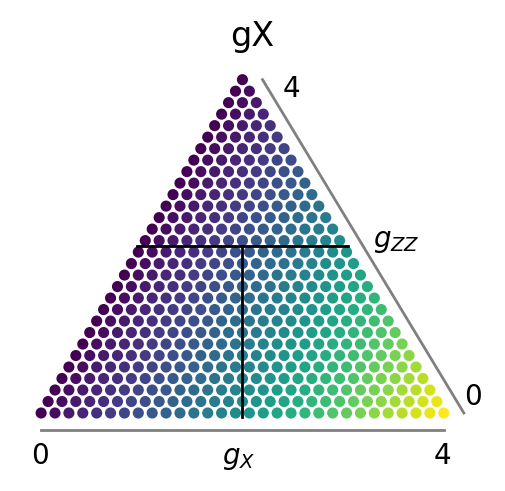

In [ ]:
plot_phasediagram(pars,pars[:,:,2],"gX")

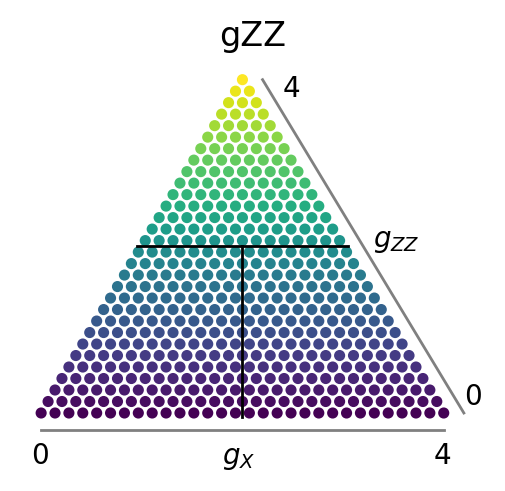

In [ ]:
plot_phasediagram(pars,pars[:,:,1],"gZZ")

In [ ]:
# Try a distorted Hamiltonian, to see whether
# the phase diagram changes!
# (this one produces a non-integrable H via Z terms)

N=10
X,Y,Z=produce_XYZ(N) # Paulis
paulis=(X,Y,Z)

delta_H=empty_matrix(2**N)
for j in range(N):
  delta_H+=1.0*Z[j]

pars,expectation_values=get_phase_diagram_CI(paulis,M=30,delta_H=delta_H)
E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ=expectation_values

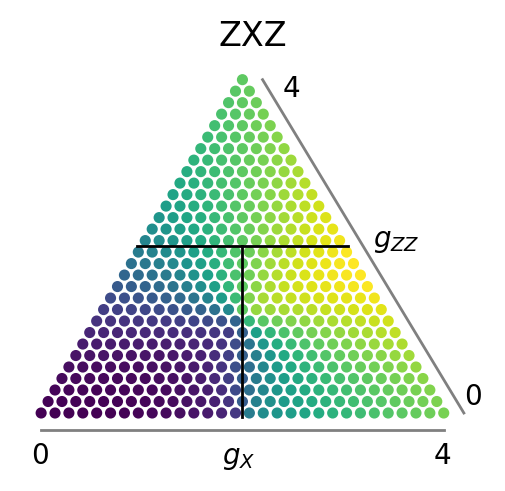

In [ ]:
plot_phasediagram(pars,E_ZXZ,"ZXZ")

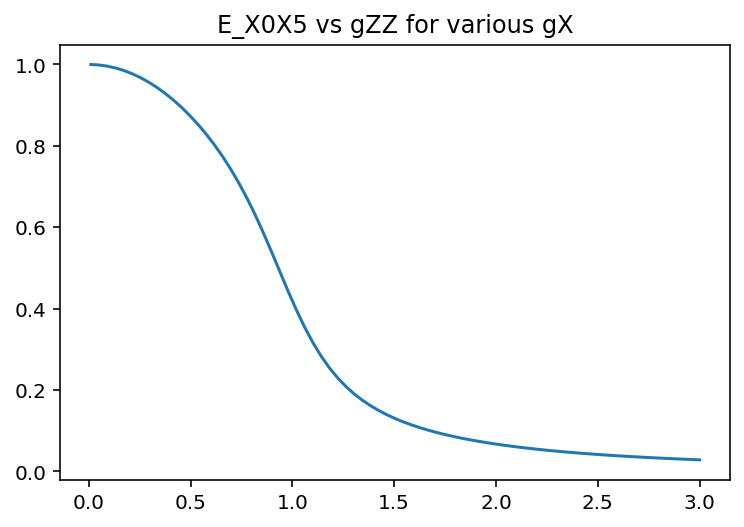

In [162]:
# some 1D sweep to see how things behave
# and whether the phase transition is nicely sharp
# (plot is still buggy for some reason....)

Z01=Z[0] @ Z[1]
Z05=Z[0] @ Z[5]
Zstring04=Z[0] @ Z[1] @ Z[2] @ Z[3] @ Z[4]
Zstring05=Zstring04 @ Z[5]
X01=X[0] @ X[1]
X05=X[0] @ X[5]
ZXZ=Z[0] @ X[1] @ Z[2]

# collecting them all:
observables=(Z01,Z05,X01,X05,X[0],Z[0],Zstring04,Zstring05,ZXZ)

def assign_values_sweep(expectation_values,observables,idx,psi):
  for value_array,the_operator in zip(expectation_values,observables):
    value_array[idx]=expectation(psi, the_operator)

M=100

for gX in [1.0]:
  # a place to store the expectation values while sweeping the phase diagram:
  E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ=[np.zeros((M,)) for _ in range(9)]
  expectation_values=(E_ZZ,E_Z0Z5,E_XX,E_X0X5,E_X,E_Z,E_Zstring04,E_Zstring05,E_ZXZ)
  pars=np.zeros((M,3))
  for idx,gZXZ in enumerate(np.linspace(0.,4.,M)):
    gZZ=4-gZXZ-gX
    if gZZ>=0:
        parameters=(0.0,gZZ,gX) # parameters=(gZXZ,gZZ,gX)
        H,E,psi=getGroundStateCI(parameters,paulis,N) # get ground state
        assign_values_sweep(expectation_values,observables,idx,psi) # store expectation values
        pars[idx]=parameters
    else:
        pars[idx]=(np.nan,np.nan,np.nan) # points outside the triangle
    # note: to understand this plot: it cuts diagonally
    # from lower left to upper right through the triangle,
    # see the triangle plot for gX (in the 1D plot here we keep gX=const,
    # which is not a vertical line in the triangle!)
  plt.plot(pars[:,1],E_X0X5, label="gX = "+str(gX))
plt.title("E_X0X5 vs gZZ for various gX")
plt.show()

In [152]:
pars[:,1]

array([3.5       , 3.28947368, 3.07894737, 2.86842105, 2.65789474,
       2.44736842, 2.23684211, 2.02631579, 1.81578947, 1.60526316,
       1.39473684, 1.18421053, 0.97368421, 0.76315789, 0.55263158,
       0.34210526, 0.13157895,        nan,        nan,        nan])

In [153]:
E_ZZ

array([0.99487827, 0.99800259, 0.99982378, 0.99940413, 0.99490932,
       0.98214528, 0.94763676, 0.81066241, 0.53852492, 0.40319104,
       0.30960246, 0.23653434, 0.1777013 , 0.12868788, 0.08677037,
       0.05030409, 0.01820411, 0.        , 0.        , 0.        ])

## Learning to recognize phases of a system via a trainable sensor

Setting: Given a system (like the cluster Ising model above), prescribe labels for different phases and perform supervised training. The 'sensor' couples to a few of the system observables.


```
- o - o - o - o - o - o -  <--- system
          |   |
          o - o   <--- sensor
```


In [7]:
def prepare_general_phase_sensing(N_sys,N_sens,H0_sys,H0_sens,H_sys_terms,
                                  sys_operators,sens_operators,
                                  H_sens_terms,output_terms,paulis):
  """
  Prepare all contributions for a phase recognition scenario.

  N_sys: number of qubits in system
  N_sens: number of qubits in sensor
  H0_sys: fixed part of system Hamiltonian (None if not present)
  H0_sens: fixed part of sensor Hamiltonian (None if not present)
  H_sys_terms: tuneable terms in system Hamiltonian (to move through phases)
  sys_operators: the system operators to which the sensor can couple
                (e.g. a few qubit operators in some region)
  sens_operators: the sensor operators that can couple to the system operators
                This routine will implement an all-to-all coupling, i.e.
                all pairs of sys_operators and sens_operators will be produced
  H_sens_terms: sensor operators that will enter the sensor Hamiltonian
  output_terms: the operators whose expectation values constitute the output
  paulis: tuple (X,Y,Z) containing all Pauli operators

  Returns a dictionary phase_sensor that keeps all the contributions and info.
  This can then be used to call QEP_Hamiltonian with parameter values
  to go along with the terms.

  Entries of phase_sensor:
  'N_sys': N_sys,
  'N_sens': N_sens,
  'paulis': paulis,
  'H0': H0,
  'H_x_terms': H_sys_terms,
  'H_sys_sens_terms': H_sys_sensor_terms,
  'H_sens_terms': H_sens_terms,
  'H_theta_terms': H_sys_sensor_terms + H_sens_terms,
  'output_terms': output_terms
  """

  H0 = 0*paulis[0][0] # just empty initialization
  if H0_sys is not None:
    H0 += H0_sys
  if H0_sens is not None:
    H0 += H0_sens

  # all pairwise combinations of system and sensor operators
  # -- 'fully connected' sensor
  H_sys_sensor_terms=[op_sys @ op_sens for op_sys in sys_operators
                        for op_sens in sens_operators]

  return {'N_sys': N_sys,
          'N_sens': N_sens,
          'paulis': paulis,
          'H0': H0,
          'H_x_terms': H_sys_terms,
          'H_sys_sens_terms': H_sys_sensor_terms,
          'H_sens_terms': H_sens_terms,
          'H_theta_terms': H_sys_sensor_terms + H_sens_terms,
          'output_terms': output_terms
          }

def get_H_sys_terms_for_cluster_Ising(N_sys,paulis):
  """
  Prepare all the terms needed for the cluster Ising Hamiltonian.

  N_sys: number of qubits (length of chain)
  paulis: (X,Y,Z) tuple containing previously prepared Pauli operators

  Returns a tuple containing all these terms (each of which can
  be controlled by a parameter):

  (H_ZXZ,H_ZZ,H_X)
  """
  X,Y,Z=paulis

  H_ZXZ=0*Z[0] # just to initialize proper shape
  H_ZZ=0*Z[0]
  H_X=0*Z[0]

  for j in range(N_sys):
    H_ZXZ += Z[j] @ X[(j+1)%N_sys] @ Z[(j+2)%N_sys]
    H_ZZ  -= Z[j] @ Z[(j+1)%N_sys]
    H_X   -= X[j]

  return (H_ZXZ,H_ZZ,H_X)


def QEP_Hamiltonian_for_phase_sensing(phase_sensor,x,theta):
  """
  Return the QEP Hamiltonian for the phase sensing scenario.

  phase_sensor: as returned from prepare_general_phase_sensing,
                contains all the required operators
  x: input values (i.e. the location in the phase diagram)
  theta: trainable parameters (i.e. sys-sensor coupling and sensor terms)
  """
  return QEP_Hamiltonian(phase_sensor['H0'],x,phase_sensor['H_x_terms'],
                         theta,
                         phase_sensor['H_theta_terms'],
                         None,None)

In [196]:

def initialize_phase_sensor_parameters(phase_sensor,use_optimizer=None, skip_random_init=False):
  """
  Initialize parameters for a given phase sensor model.

  phase_sensor:  dictionary
  returned by a routine like prepare_cluster_Ising_phase_sensor or
  prepare_general_phase_sensing.

  use_optimizer: optionally, an optax optimizer, as obtained from a call
        to optax.adam(1e-3) or similar. Its state will be stored inside
        phase_sensor and automatically used in the train routine.

  skip_random_init: if True, retain the current parameter values
  
  Returns: an updated phase_sensor dictionary that also contains
  trainable parameters, 'sys_sens_couplings' and 'sens_couplings'
  (both of them are viewed together as the trainable parameters theta).

  These are vectors initialized with normal Gaussian random numbers.
  """
  if not skip_random_init:
    phase_sensor['sys_sens_couplings']=np.random.randn(len(phase_sensor['H_sys_sens_terms']))
    phase_sensor['sens_couplings']=np.random.randn(len(phase_sensor['H_sens_terms']))
  if use_optimizer is None:
    phase_sensor['optimizer']=None
  else:
    optimizer=use_optimizer
    theta_init=np.concatenate((phase_sensor['sys_sens_couplings'],phase_sensor['sens_couplings']))
    opt_state=optimizer.init(theta_init)
    phase_sensor['optimizer']=optimizer
    phase_sensor['opt_state']=opt_state
  return phase_sensor

def evaluate_phase_sensor_on_batch(phase_sensor,x_batch,operators=None):
  """
  Evaluate phase_sensor on a batch of samples,
  x_batch of shape (batchsize,x_dim)

  Returns: y_batch of shape (batchsize,y_dim), where y_dim
      is the output dimension, and these are the expectation
      values of the output operators stored inside
      phase_sensor['output_terms']

  Optionally, operators is a list of operators whose expectation values should
  be evaluated. In that case, this function returns
    y_batch, op_values
  where op_values is of shape (batchsize,num_ops) and num_ops is the number
  of operators.
  """
  theta=np.concatenate((phase_sensor['sys_sens_couplings'],
                        phase_sensor['sens_couplings']))
  y_dim=len(phase_sensor['output_terms'])
  batch_size=np.shape(x_batch)[0]

  y_batch=np.zeros((batch_size,y_dim))
  if operators is not None:
    num_ops=len(operators)
    op_values=np.zeros((batch_size,num_ops))

  for idx,x_sample in enumerate(x_batch):
    if operators is None:
      _,_,_,y_pred_sample = evaluate_phase_sensor(phase_sensor,x_sample,theta)
    else:
      _,_,_,y_pred_sample,op_pred = evaluate_phase_sensor(phase_sensor,
                                      x_sample,theta,operators=operators)
      op_values[idx,:]=op_pred
    y_batch[idx,:] = y_pred_sample

  if operators is None:
    return y_batch
  else:
    return y_batch,op_values

def evaluate_phase_sensor(phase_sensor,x_sample,theta,operators=None):
  """
  Evaluate the phase_sensor on a single x_sample, with
  theta replacing the trainable parameters stored inside
  phase_sensor.

  Returns H,E,psi,y_pred

  If operators is a list of operators, then evaluate their expectation
  values, yielding a vector op_pred, and return H,E,psi,y_pred,op_pred
  """
  # prepare Hamiltonian for this sample:
  H=QEP_Hamiltonian_for_phase_sensing(phase_sensor,x_sample,theta)
  # get ground state:
  E,psi=ground_state(H)
  # obtain expectation values of output terms:
  y_pred=np.array([expectation(psi,op) for op in phase_sensor['output_terms']])

  if operators is None:
    return H,E,psi,y_pred
  else:
    op_pred=np.array([expectation(psi,op) for op in operators])
    return H,E,psi,y_pred,op_pred


def eval_test_phase_sensor(phase_sensor,theta,cost_function,test_samples,
                          alternative_accuracies=False):
    """
    Obtain measures of accuracy etc. 
    for a phase_sensor and a given set of test samples.
    
    phase_sensor: contains all the data of the phase sensor
    theta: can be set to None, to use the trainable parameters inside the phase sensor.
    cost_function: the cost function to be used
    alternative_accuracies: if True, 
        now also calculate the following three versions of the accuracy:
        (i) product-accuracy:
          assuming the phase indicators are independently measured (! which they
          are not in the present example !),
          what is the probability of getting the right answer in a single measurement,
          i.e. (1-P(phase1_indicator))*P(phase2_indicator)*(1-P(phase3_indicator)),
          if phase2 is the right phase!
        (ii) single-shot:
          assuming the phase indicators are measured in a single shot (as in the
          present example: ZZ is measured, and the different outcomes indicate
          different phases):
          what is the probability of getting the right answer in a single measurement,
          i.e. P(phase_j_indicator), where j was the correct choice
        (iii) max-choice:
          does one get the right answer for infinitely many measurements, where
          one simply checks that the probability for the correct outcome combination
          (e.g. 0,1,0) is higher than any other probability?
        accuracy(default),cost_value,accuracy(product),accuracy(single-shot),accuracy(max-choice)
    
    test_samples=(samples_input,samples_output), with 
    samples_input.shape=(batch_size,dim_input) and similar for samples_output.
    
    the default accuracy value is based on:
       counting probabilities>0.5 as "1" and else "0", then comparing against
       desired output pattern (e.g. 0,1,0 for phase 2) and checking whether
       the prediction matches the desired output pattern.
    
    Returns:
        accuracy,cost_value
    
    """
    correct_matches=0
    cost_value=0.0
    if alternative_accuracies:
        value_product_accuracy=0.0
        value_single_shot_accuracy=0.0
        correct_max_choice=0
        
    if theta is None:
        theta=np.concatenate((phase_sensor['sys_sens_couplings'],
                        phase_sensor['sens_couplings']))
    for x_sample,y_sample in zip(*test_samples):
      # "forward pass" (inference)
      H,E,psi,y_pred = evaluate_phase_sensor(phase_sensor,x_sample,theta)
      if alternative_accuracies:
        value_product_accuracy += np.prod(y_sample*y_pred + (1-y_sample)*(1-y_pred))
        value_single_shot_accuracy += np.prod(y_sample*y_pred + (1-y_sample))
        correct_max_choice += (np.argmax(y_sample)==np.argmax(y_pred))
      digitize_pred=y_pred>0.5
      correct_matches += (digitize_pred == y_sample).all()
      cost_value +=cost_function(y_pred,y_sample)
    n_test_samples=len(test_samples[0])
    correct_matches/=(1.0*n_test_samples)
    cost_value/=n_test_samples
    if alternative_accuracies:
      value_product_accuracy/=n_test_samples
      value_single_shot_accuracy/=n_test_samples
      correct_max_choice/=(1.0*n_test_samples)
      return correct_matches,cost_value,value_product_accuracy,value_single_shot_accuracy,correct_max_choice
    else:
      return correct_matches,cost_value
            
def train_phase_sensor(phase_sensor,training_data_sampler,
                       cost_function,grad_cost_function,
                       learning_rate,batch_size,num_batches,
                       test_samples=None,test_step=None,
                       SMALL_NUMBER=1e-8,nonsparse=False,
                      finite_nudging=None,shot_noise=None,
                      check_nudging_accuracy=False,
                      symmetric_nudging=False,
                      check_shot_noise_influence=False,
                      record_error_signal=False,
                      return_gradient=False,
                      provide_training_samples=None,
                      no_progress_bar=False,
                      alternative_accuracies=False):
  """
  Train a phase sensor via QEP. You can call this repeatedly.
  Returns the updated phase_sensor dictionary.

  phase_sensor: phase sensor dictionary as returned by a routine
      like prepare_cluster_Ising_phase_sensor or
      prepare_general_phase_sensing, and augmented with randomly initialized
      trainable parameters, via initialize_phase_sensor_parameters.

  training_data_sampler: a function of the type return_batch(batchsize)
      that will return two lists, x_samples and y_samples, that define
      the training data. Each training sample
      is of the form (x,y), where x are the input parameters (here: defining
      the location in the phase diagram) and y are the desired output values
      (here: related to the expectation values of the 'output_terms')

  cost_function: a function of the type cost(y_pred,y_target), see below.

  grad_cost_function: a function of the type grad_cost(y_pred,y_target), which
      returns a vector that is the gradient of the cost function with
      respect to y_pred. Both y_pred, y_target are vectors, of length given
      by the number of output terms, i.e. len(phase_sensor['output_terms']).

  test_samples (if not None) is equal to (test_x,test_y), where test_x
      are the inputs for the test samples and test_y the outputs
      
  test_step: number of training batches after which one test evaluation is performed.
  
  SMALL_NUMBER is used in evaluating linear response, in 1/(E-H+i SMALL_NUMBER)

  finite_nudging: if not None, use this value for simulating the finite
        nudging (actual physical shift to a new ground state) instead
        of the linear response calculation
        
  shot_noise: if not None, number of measurement shots. See get_gradient_at_x
        for explanation. Only valid together with finite_nudging.
        
  check_nudging_accuracy: if True, also record gradients evaluated at half the nudging
      parameter, for later inspection. They will be stored in training_history under
      the key 'theta_gradient_half'.
    
  symmetric_nudging: if True, use symmetric nudging
  
  check_shot_noise_influence: if True, also record what the ideal gradient without
      shot noise would have been. Record it under 'theta_gradient_no_shot_noise'.
  
  record_error_signal: if True, record norm of error vector as 'error_signal'
  
  return_gradient: if True, return only the gradient instead of performing the update
  
  provide_training_samples: if not None, this is (x_samples,y_samples); alternative to
      providing the training_data_sampler
      
  no_progress_bar: if True, do not show progress bar.
  
  alternative_accuracies: if True, also calculate three additional accuracy measures,
      adding them to training_history: product_accuracy, single_shot_accuracy, max_choice_accuracy
      (see eval_phase_sensor for their meaning)
  Returns:

  phase_sensor, training_history

  where phase_sensor is updated with the final trainable parameters,
  and training_history is a dictionary with the following entries, each a list of
  length num_batches:

  cost -- list of batch-averaged cost values
  theta -- list of theta vectors
  theta_gradient -- list of batch-averaged theta gradients
  accuracy -- list of batch-averaged default accuracies
  training_cost -- list of batch-averaged training costs (evaluated on training batches)
  
  if alternative_accuracies is True, also add:
  product_accuracy, single_shot_accuracy, max_choice_accuracy
  
  """

  # trainable parameters (all of them together):
  theta=np.concatenate((phase_sensor['sys_sens_couplings'],
                        phase_sensor['sens_couplings']))

  optimizer=phase_sensor['optimizer']
  if optimizer is not None:
    opt_state=phase_sensor['opt_state']

  output_terms=phase_sensor['output_terms']
  H_theta_terms=phase_sensor['H_theta_terms']
  num_theta_terms=len(phase_sensor['H_theta_terms'])

  # prepare training history:
  training_history={'cost': [], 'accuracy': [], 
                    'training_cost': [], 'theta': [], 'theta_gradient': []}

  if alternative_accuracies:
    training_history['single_shot_accuracy']=[]
    training_history['product_accuracy']=[]
    training_history['max_choice_accuracy']=[]
    
  if check_nudging_accuracy:
    training_history['theta_gradient_half']=[]
  if check_shot_noise_influence:
    training_history['theta_gradient_no_shot_noise']=[]
  if record_error_signal:
    training_history['error_signal']=[]
    
  if test_samples is not None:
    n_test_samples=len(test_samples[0])

  if no_progress_bar:
    training_range=range(num_batches)
  else:
    training_range=tqdm(range(num_batches))
    
  for training_step in training_range: # training loop
    theta_gradient=np.zeros((num_theta_terms,)) # set to zero initially
    if check_nudging_accuracy:
        theta_gradient_half=np.zeros((num_theta_terms,))
    if check_shot_noise_influence:
        theta_gradient_no_shot_noise=np.zeros((num_theta_terms,))
    if record_error_signal:
        abs_error_signal=0.0
        
    cost_value=0.0

    if provide_training_samples is None:
      training_samples = training_data_sampler(batch_size)
    else:
      training_samples = provide_training_samples
    
    for x_sample,y_sample in zip(*training_samples):
      # "forward pass" (inference)
      H,E,psi,y_pred = evaluate_phase_sensor(phase_sensor,x_sample,theta)
      cost_value +=cost_function(y_pred,y_sample)

      # "backward pass" (gradients)

      # obtain gradient:
      error_signal=grad_cost_function(y_pred,y_sample)
      theta_gradient+=get_gradient_at_x(H,E,psi,error_signal,output_terms,
                        H_theta_terms,SMALL_NUMBER,nonsparse,
                                       finite_nudging=finite_nudging,
                                       shot_noise=shot_noise, symmetric_nudging=symmetric_nudging)
      if check_nudging_accuracy:
            theta_gradient_half+=get_gradient_at_x(H,E,psi,error_signal,output_terms,
                        H_theta_terms,SMALL_NUMBER,nonsparse,
                                       finite_nudging=0.5*finite_nudging,
                                       shot_noise=shot_noise, symmetric_nudging=symmetric_nudging)
      if check_shot_noise_influence:
            theta_gradient_no_shot_noise+=get_gradient_at_x(H,E,psi,error_signal,output_terms,
                        H_theta_terms,SMALL_NUMBER,nonsparse,
                                       finite_nudging=0.5*finite_nudging,
                                       shot_noise=None, symmetric_nudging=symmetric_nudging)
      if record_error_signal:
        abs_error_signal+=np.sqrt(np.sum(error_signal**2))
        
    cost_value/=batch_size # average
    theta_gradient/=batch_size # average
        
    training_history['training_cost'].append(cost_value)
    training_history['theta'].append(theta)
    training_history['theta_gradient'].append(theta_gradient)

    if check_nudging_accuracy:
        theta_gradient_half/=batch_size
        training_history['theta_gradient_half'].append(theta_gradient_half)

    if check_shot_noise_influence:
        theta_gradient_no_shot_noise/=batch_size
        training_history['theta_gradient_no_shot_noise'].append(theta_gradient_no_shot_noise)
        
    if record_error_signal:
        abs_error_signal/=batch_size
        training_history['error_signal'].append(abs_error_signal)
    
    if test_samples is not None:
        if training_step%test_step==0:
            if alternative_accuracies:
                accuracy,cost_value,product_accuracy,single_shot_accuracy,max_choice_accuracy=eval_test_phase_sensor(phase_sensor,theta,
                                        cost_function,test_samples,alternative_accuracies=True)
                training_history['single_shot_accuracy'].append(single_shot_accuracy)
                training_history['product_accuracy'].append(product_accuracy)
                training_history['max_choice_accuracy'].append(max_choice_accuracy)
            else:
                accuracy,cost_value=eval_test_phase_sensor(phase_sensor,theta,
                                        cost_function,test_samples)
            training_history['cost'].append(cost_value)
            training_history['accuracy'].append(accuracy)
            training_range.set_description(f"Acc: {100*accuracy} %",refresh=True)

    # update trainable parameters:
    if return_gradient:
        return theta_gradient
    else:
        if optimizer is None:
          theta -= learning_rate * theta_gradient # standard SGD
        else:
          updates, opt_state = optimizer.update(theta_gradient, opt_state)
          theta = np.array(optax.apply_updates(theta, updates))

  num_sys_sens = len(phase_sensor['sys_sens_couplings'])

  # split parameters again into sys-sens couplings and sensor parameters:
  phase_sensor['sys_sens_couplings']=theta[:num_sys_sens]
  phase_sensor['sens_couplings']=theta[num_sys_sens:]

  if optimizer is not None:
    phase_sensor['opt_state']=opt_state # record the final opt_state

  return phase_sensor, training_history


### Cluster Ising Phase Sensor Example

In [9]:
def prepare_cluster_Ising_phase_sensor(N_sys,N_sens):
  N=N_sys+N_sens
  paulis=produce_XYZ(N)
  X,Y,Z=paulis

  # prepare Hamiltonian terms for cluster Ising
  H_sys_terms=get_H_sys_terms_for_cluster_Ising(N_sys,paulis)

  # the sensor may couple to these two neighboring spins:
  sys_operators=[X[0],Y[0],Z[0],X[1],Y[1],Z[1]]

  # the sensor can couple via all its single-qubit operators:
  sens1=[X[N_sys],Y[N_sys],Z[N_sys]] # all ops for sensor qubit 1
  sens2=[X[N_sys+1],Y[N_sys+1],Z[N_sys+1]]
  sens_operators=sens1 + sens2

  # the sensor itself can have arbitrary couplings for all possible
  # single- and two-qubit terms:
  H_sens_terms=sens_operators + [op1 @ op2 for op1 in sens1 for op2 in sens2]

  one=get_identity(N)

  # the two output 'variables' of the sensor:
  ZA=Z[N_sys]
  ZB=Z[N_sys+1]

  # output terms will be the PROJECTORS onto Z,Z=+1,+1 and
  # Z,Z=+1,-1 and Z,Z=-1,-1
  output_terms=[ 0.25*(one+ZA) @ (one+ZB),
                 0.25*(one+ZA) @ (one-ZB),
                 0.25*(one-ZA) @ (one-ZB)]

  # now get the dictionary that summarizes the sensor:
  phase_sensor=prepare_general_phase_sensing(N_sys,N_sens,None,None,H_sys_terms,
                                  sys_operators,sens_operators,
                                  H_sens_terms,output_terms,paulis)

  return phase_sensor


In [10]:
def visualize_cluster_Ising_phase_sensor_couplings(sys_sens_couplings,sens_couplings,
                                                   scale=1.0,titles=True,show=True,
                                                   savefig=None
                                                   ):
  """
  Visualize all the couplings. Scale is the cutoff for the
  color bar (at -scale...+scale).
  """
  A=sys_sens_couplings
  B=sens_couplings[6:]
  C=sens_couplings[:6]

  fig,ax=plt.subplots(ncols=3,width_ratios=[3,.5,1.5])
  img=ax[0].matshow(np.reshape(A,(6,6)),vmin=-scale,vmax=+scale,
                    cmap='seismic')
  ax[0].set_xticks(ticks=np.arange(6),labels=[r"$X_1'$",r"$Y_1'$",r"$Z_1'$",r"$X_2'$",r"$Y_2'$",r"$Z_2'$"])
  ax[0].set_yticks(ticks=np.arange(6),labels=[r"$X_1$",r"$Y_1$",r"$Z_1$",r"$X_2$",r"$Y_2$",r"$Z_2$"])
  if titles:
    ax[0].set_title("system-sensor couplings")
  ax[1].matshow(np.reshape(C,(6,1)),vmin=-scale,vmax=+scale,cmap='seismic')
  ax[1].set_xticks(ticks=[],labels=[])
  ax[1].set_yticks(ticks=(0,1,2,3,4,5),labels=(r"$X_1'$",r"$Y_1'$",r"$Z_1'$",r"$X_2'$",r"$Y_2'$",r"$Z_2'$"))
  ax[2].matshow(np.reshape(B,(3,3)),vmin=-scale,vmax=+scale,cmap='seismic')
  ax[2].set_xticks(ticks=(0,1,2),labels=(r"$X_2'$",r"$Y_2'$",r"$Z_2'$"))
  ax[2].set_yticks(ticks=(0,1,2),labels=(r"$X_1'$",r"$Y_1'$",r"$Z_1'$"))
  if titles:
    ax[2].set_title("sensor couplings")
  plt.colorbar(img,ax=ax[2],location='bottom',cmap='seismic')
  fig.tight_layout()
  if savefig is not None:
    fig.savefig(savefig)
  if show:
    plt.show()

In [11]:
# define training sampler: uniform sampling of the triangle
def sample_batch_cluster_Ising_phase_sensor(batch_size):
  """
  Returns tuple (x_samples, y_samples), for uniformly sampled
  locations x_samples inside the triangle, and denoting
  each of them with a 2D vector according to the phase it is in.
  """
  gX=np.random.uniform(high=4.0,size=batch_size)
  gZZ=np.random.uniform(high=4.0,size=batch_size)
  gZXZ=4.0-gX-gZZ
  # now flip around all parts that would yield negative gZXZ
  # (stay within triangle)
  neg=gZXZ<0
  gX_new=neg*(4-gZZ) + (1-neg)*gX
  gZZ_new=neg*(4-gX) + (1-neg)*gZZ
  gZXZ_new=4.0-gX_new-gZZ_new

  # the three phases, as they are known analytically:
  middle_boundary=(2*gX_new<4-gZZ_new)
  phaseI=(gZZ_new<2)*middle_boundary
  phaseII=gZZ_new>=2
  phaseIII=(gZZ_new<2)*(1-middle_boundary)

  output=np.stack([phaseI,phaseII,phaseIII],axis=-1)

  return (np.stack([gZXZ_new,gZZ_new,gX_new], axis=-1), output)

In [12]:
def cost_function_mse(y_pred,y_target):
  return np.sum( (y_pred-y_target)**2 )

def grad_cost_function_mse(y_pred,y_target):
  return 2*(y_pred-y_target)


In [13]:
def plot_cluster_Ising_results_inside_phase_triangle(params,values,title="",show=""):
  plt.figure(figsize=(3,2.5))
  plt.scatter(params[:,2]+0.5*params[:,1],params[:,1],c=values,s=5**2)
  plt.axis('off')
  plt.plot([.95,3.05],[2,2],color="black",linewidth=1)
  plt.plot([2,2],[-0.05,2],color="black",linewidth=1)
  plt.text(1.8,-0.6,r"$g_X$")
  plt.text(3.3,2,r"$g_{ZZ}$")
  plt.title(title)
  plt.plot([0,4],[-0.2,-0.2],color="gray",linewidth=1)
  plt.text(-0.1,-0.6,"0")
  plt.text(3.9,-0.6,"4")
  plt.plot([4.2,2.2],[+0,4],color="gray",linewidth=1)
  plt.text(4.2,0.1,"0")
  plt.text(2.4,3.8,"4")
  if show:
    plt.show()

#### Tests

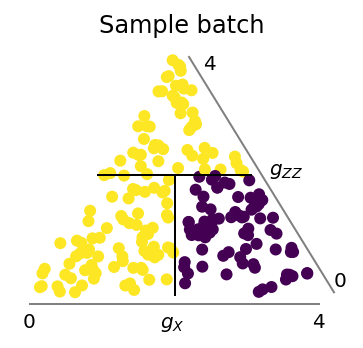

In [18]:
# test training sampler:

x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

plt.figure(figsize=(3,2.5))
value=0.1*(2+y_samples[:,0]+y_samples[:,1])
plt.scatter(x_samples[:,2]+0.5*x_samples[:,1],x_samples[:,1],c=value,s=5**2)
plt.axis('off')
plt.plot([.95,3.05],[2,2],color="black",linewidth=1)
plt.plot([2,2],[-0.05,2],color="black",linewidth=1)
plt.text(1.8,-0.6,r"$g_X$")
plt.text(3.3,2,r"$g_{ZZ}$")
plt.title("Sample batch")
plt.plot([0,4],[-0.2,-0.2],color="gray",linewidth=1)
plt.text(-0.1,-0.6,"0")
plt.text(3.9,-0.6,"4")
plt.plot([4.2,2.2],[+0,4],color="gray",linewidth=1)
plt.text(4.2,0.1,"0")
plt.text(2.4,3.8,"4")
plt.show()

#### First Ising phase sensor training run (SGD)

In [ ]:
# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor)


In [ ]:
# train !

learning_rate=0.1
batch_size=10
num_batches=100

phase_sensor,training_history=train_phase_sensor(phase_sensor,sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

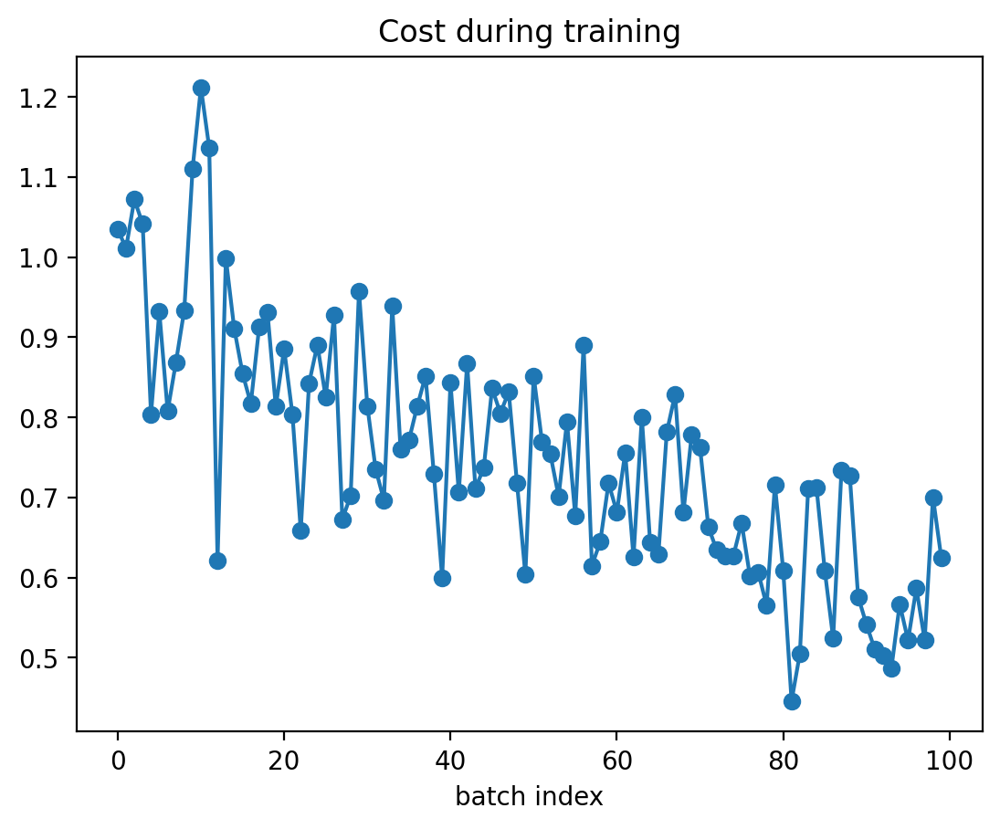

In [ ]:
# the cost evolution:
plt.plot(training_history['cost'],'-o')
plt.xlabel('batch index')
plt.title('Cost during training')
plt.show()

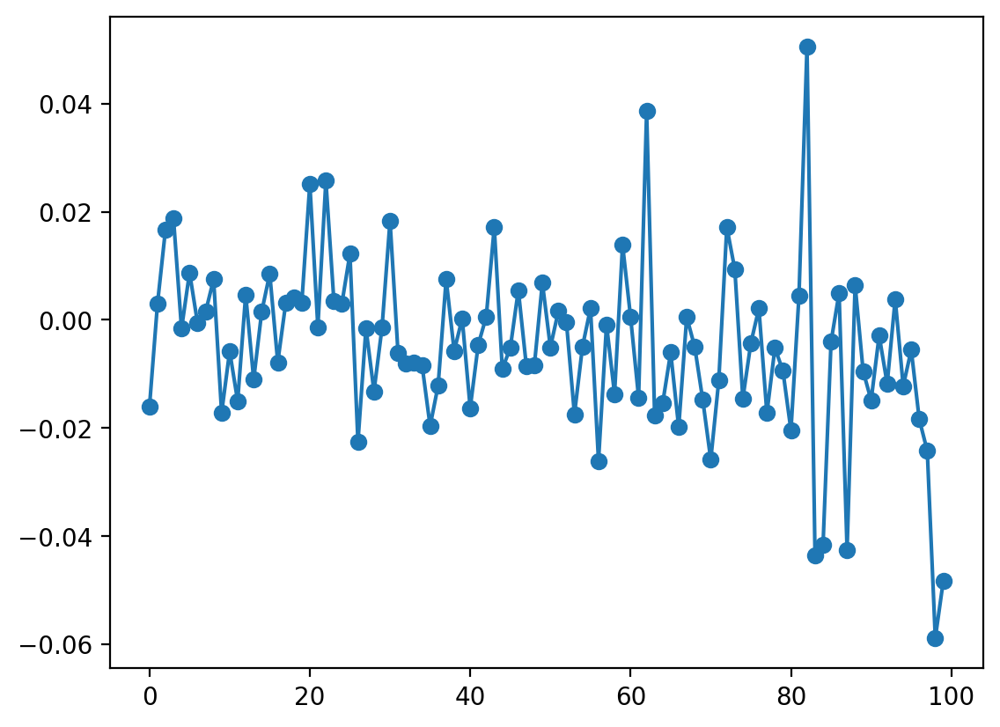

In [ ]:
# get an impression of how strongly the gradient estimate fluctuates:
plt.plot( [g[0] for g in training_history['theta_gradient']] , '-o')

In [ ]:
# continue training !

learning_rate=0.1
batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

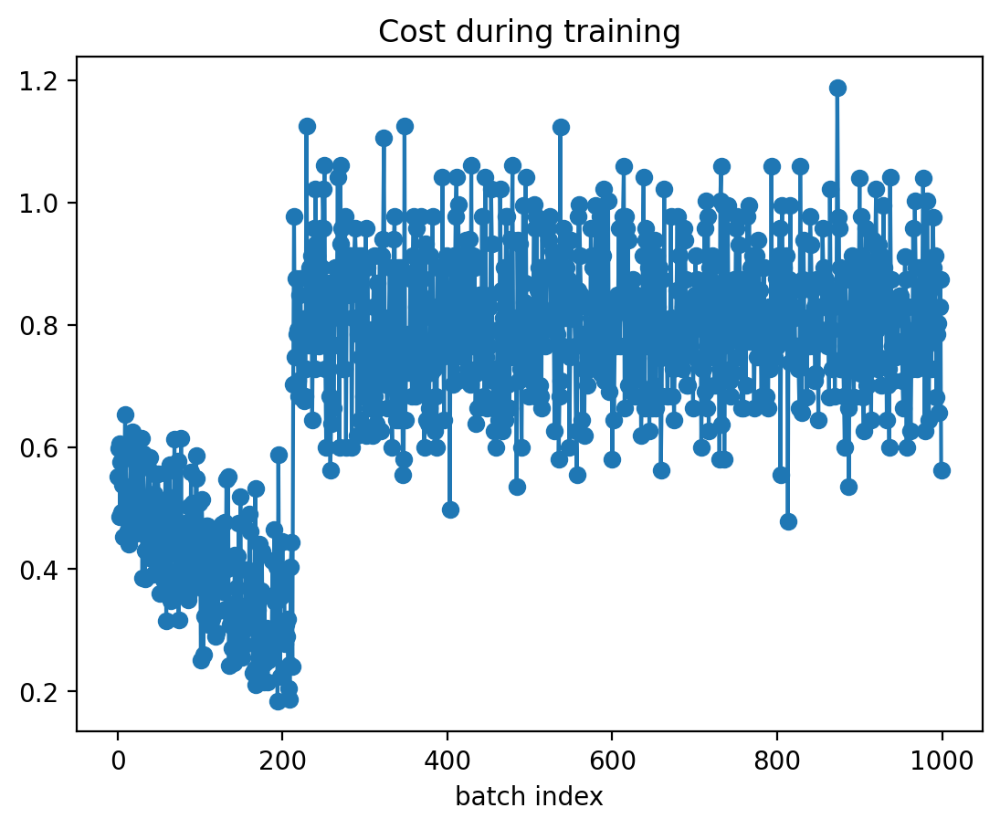

In [ ]:
# the cost evolution:
plt.plot(training_history['cost'],'-o')
plt.xlabel('batch index')
plt.title('Cost during training')
plt.show()

oops!

#### Train phase sensor using adam optimizer

In [ ]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


In [ ]:
# training !

batch_size=10
num_batches=100

phase_sensor,training_history=train_phase_sensor(phase_sensor,sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

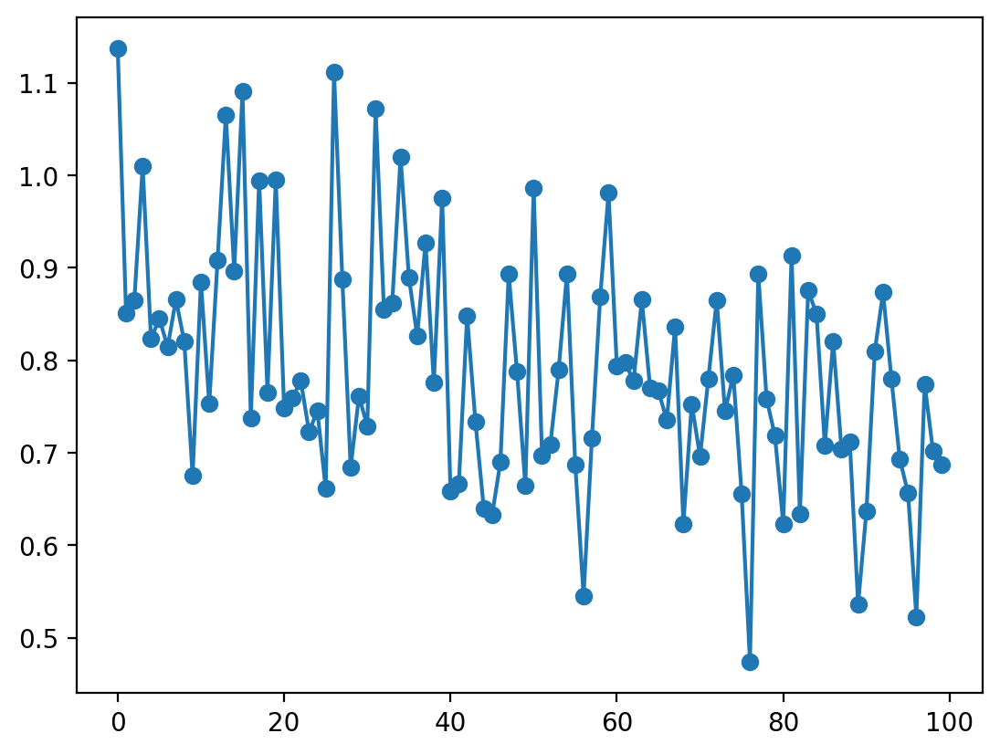

In [ ]:
plt.plot(training_history['cost'],'-o')

In [ ]:
# continue training !

batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

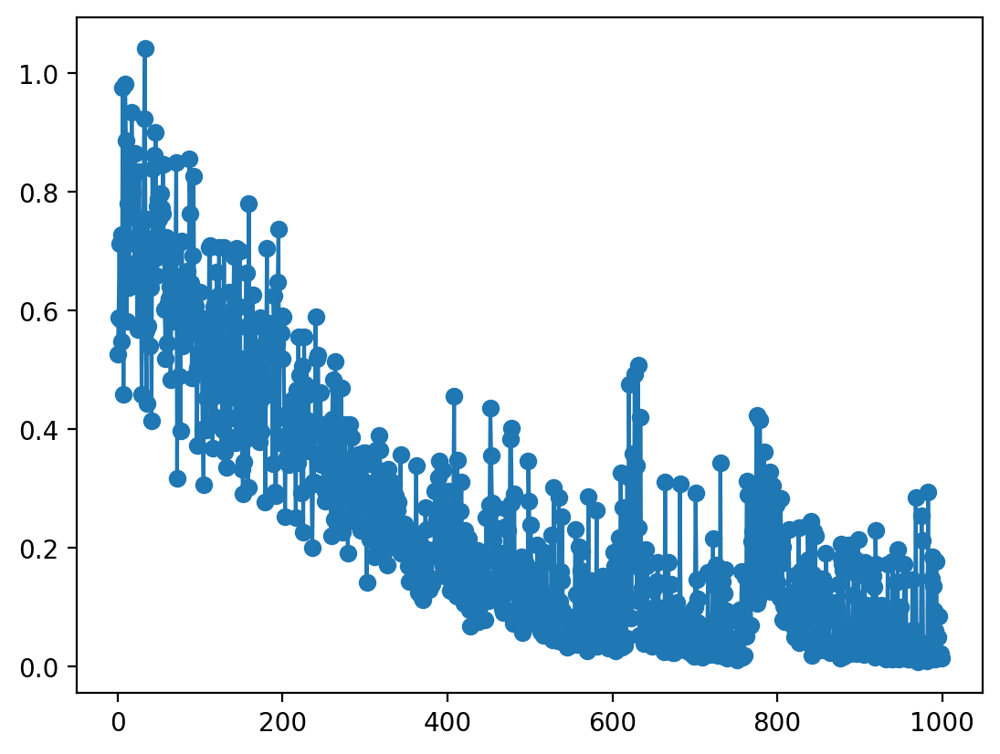

In [ ]:
plt.plot(training_history['cost'],'-o')

In [ ]:
phase_sensor['sys_sens_couplings']

array([ 3.5341409e-01, -3.4786388e-01,  3.1113684e-02, -1.2399227e-01,
       -3.0507249e-01, -4.3766463e-01,  3.4797862e-02, -2.6954234e-01,
       -1.9223846e+00, -1.4576998e+00, -4.2409497e-01,  1.9661576e-01,
        5.1329300e-02, -8.1208169e-02,  1.9338018e+00,  1.7533831e-03,
       -3.5965684e-01,  7.9169971e-01,  4.7403634e-02, -7.7469140e-01,
        1.9447229e+00, -1.1994157e-01, -1.4531334e-01,  1.5090830e+00,
        8.0844738e-02,  9.0246305e-02,  7.9150170e-02,  1.3950236e-01,
       -8.0722734e-02,  6.6171688e-01,  2.3645307e-01,  6.1050487e-01,
       -5.5035347e-01,  2.8933036e-01,  2.5400552e-01, -2.3168759e+00],
      dtype=float32)

In [ ]:
phase_sensor['sens_couplings']

array([-5.89033426e-01, -3.62441438e-01, -2.02687684e-01, -1.44703354e+00,
        5.46991364e-01,  2.25369113e-01, -8.87329971e-04, -7.84629715e-01,
       -1.65729560e+00, -1.02997967e+00,  3.48131793e-01,  5.62311305e-01,
        2.52290726e-02, -1.21699385e+00, -1.84619309e-01])

In [ ]:
# restore old values before kernel quit:
phase_sensor['sys_sens_couplings']=np.array([ 3.5341409e-01, -3.4786388e-01,  3.1113684e-02, -1.2399227e-01,
       -3.0507249e-01, -4.3766463e-01,  3.4797862e-02, -2.6954234e-01,
       -1.9223846e+00, -1.4576998e+00, -4.2409497e-01,  1.9661576e-01,
        5.1329300e-02, -8.1208169e-02,  1.9338018e+00,  1.7533831e-03,
       -3.5965684e-01,  7.9169971e-01,  4.7403634e-02, -7.7469140e-01,
        1.9447229e+00, -1.1994157e-01, -1.4531334e-01,  1.5090830e+00,
        8.0844738e-02,  9.0246305e-02,  7.9150170e-02,  1.3950236e-01,
       -8.0722734e-02,  6.6171688e-01,  2.3645307e-01,  6.1050487e-01,
       -5.5035347e-01,  2.8933036e-01,  2.5400552e-01, -2.3168759e+00])

In [ ]:
phase_sensor['sens_couplings']=np.array([-0.0557727 ,  0.16428922, -1.2250617 ,  0.5555793 ,  0.06681505,
        0.03496919, -0.57924074, -0.15686075,  0.28467014, -0.20337026,
       -0.01879715, -1.2097871 , -0.0294289 ,  0.23834272, -0.01097804])

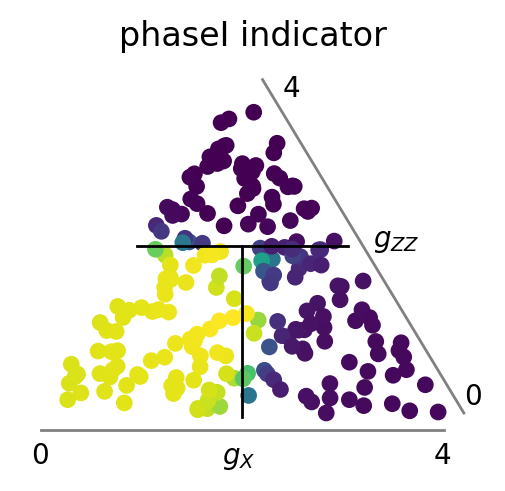

In [ ]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phaseI indicator")

Note: the 'phaseI indicator' is the expectation value of the projector onto a certain basis state (Z-basis) of the two sensor qubits. During training, this was targeted to yield 1 exactly in the "phase I", which we defined to be the SPT phase in the lower left corner.

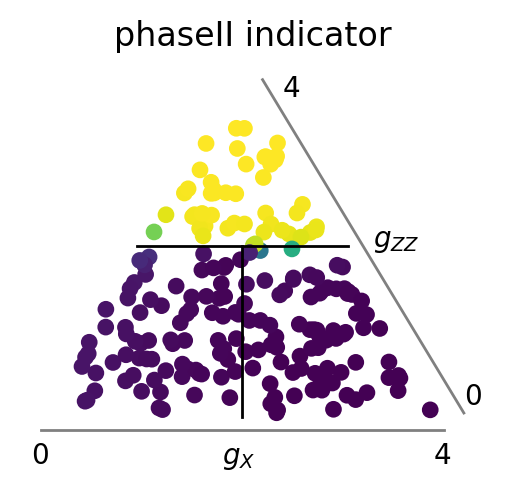

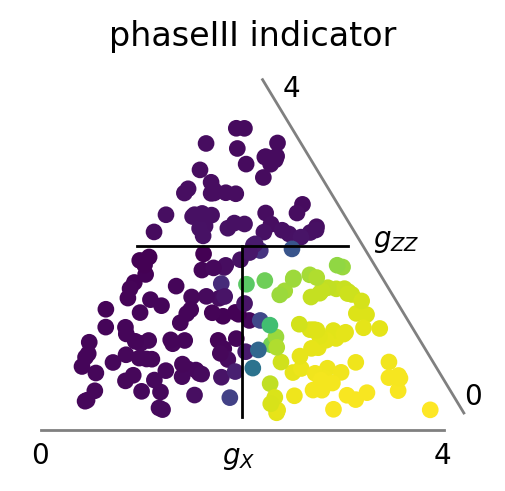

In [ ]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,1],"phaseII indicator")
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,2],"phaseIII indicator")

In [ ]:
def plot_sweep_gX_cluster_Ising(phase_sensor,N_sys,N_sens):
  X,Y,Z=phase_sensor['paulis']
  operators=[Z[j] for j in range(N_sys + N_sens)] # want to show all <Z[j]>

  # a linear sweep in gX
  gZZ_value=0.5
  n_sweep=20
  gX=np.linspace(0.,4-gZZ_value,n_sweep)
  gZZ=np.full(n_sweep,gZZ_value)
  gZXZ=4-gZZ-gX

  x_sweep=np.stack([gZXZ,gZZ,gX],axis=-1) # shape (n_sweep,3)

  y_pred,op_values=evaluate_phase_sensor_on_batch(phase_sensor,x_sweep,
                                                  operators=operators)

  plt.matshow(op_values,aspect=0.5)
  plt.xlabel("spin index (last two: sensor)")
  plt.ylabel("gX")
  plt.yticks(ticks=[0,n_sweep-1],labels=[gX[0],gX[-1]])
  plt.xticks(ticks=np.arange(N_sys+N_sens))
  plt.show()


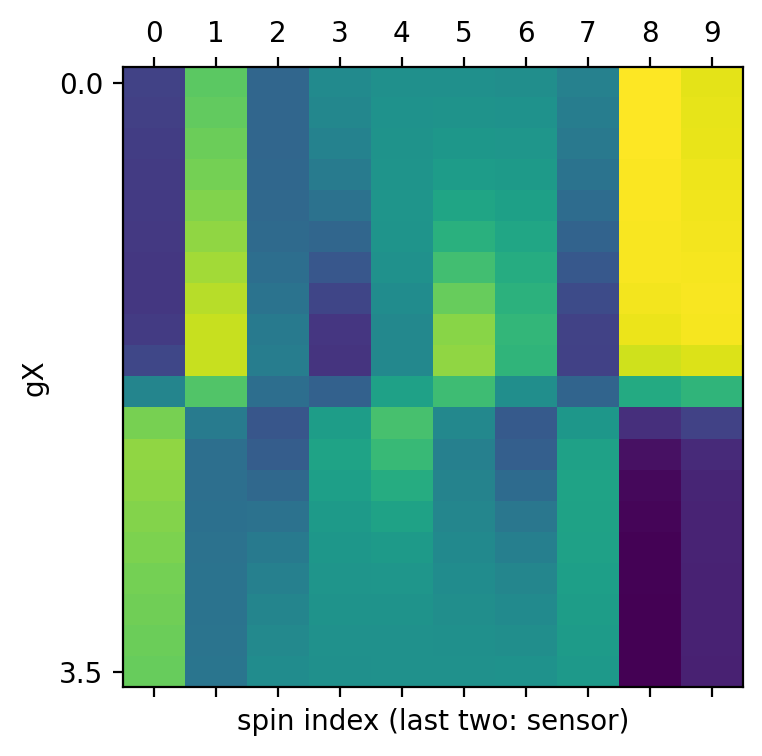

In [ ]:
# show how the Z expectation values evolve while sweeping through the phase diagram
plot_sweep_gX_cluster_Ising(phase_sensor,N_sys,N_sens)

Comment: In each row, the first 8 pixels show the <Z[j]> for the cluster Ising chain, the last 2 pixels show the sensor. gX sweeps through the transition as rows increase. As desired, the sensor switches at the transition. However, the **sensor strongly influences the system itself**, as can be seen from the difference between the observed values at spins 0 and 1, where the sensor couples to.

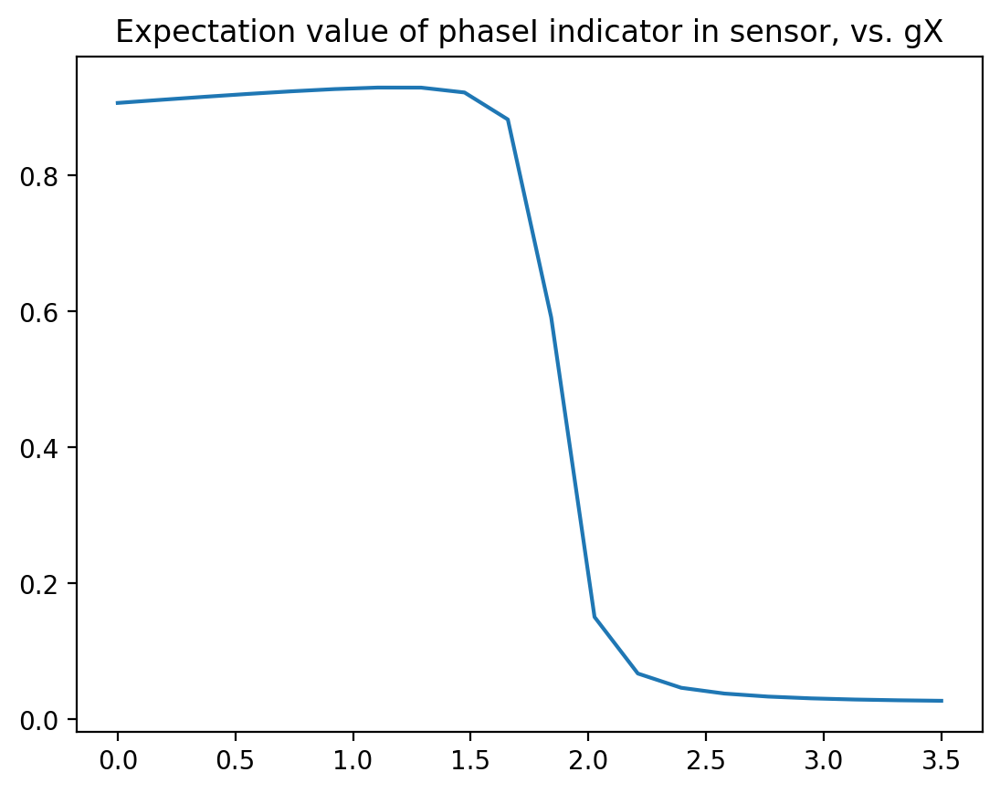

In [ ]:
plt.plot(gX,y_pred[:,0])
plt.title("Expectation value of phaseI indicator in sensor, vs. gX")
plt.show()

#### Second training run (different random initial conditions, otherwise the same): shows different outcome

In [ ]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


In [ ]:
# training !

batch_size=10
num_batches=1100

phase_sensor,training_history=train_phase_sensor(phase_sensor,sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

KeyboardInterrupt: 

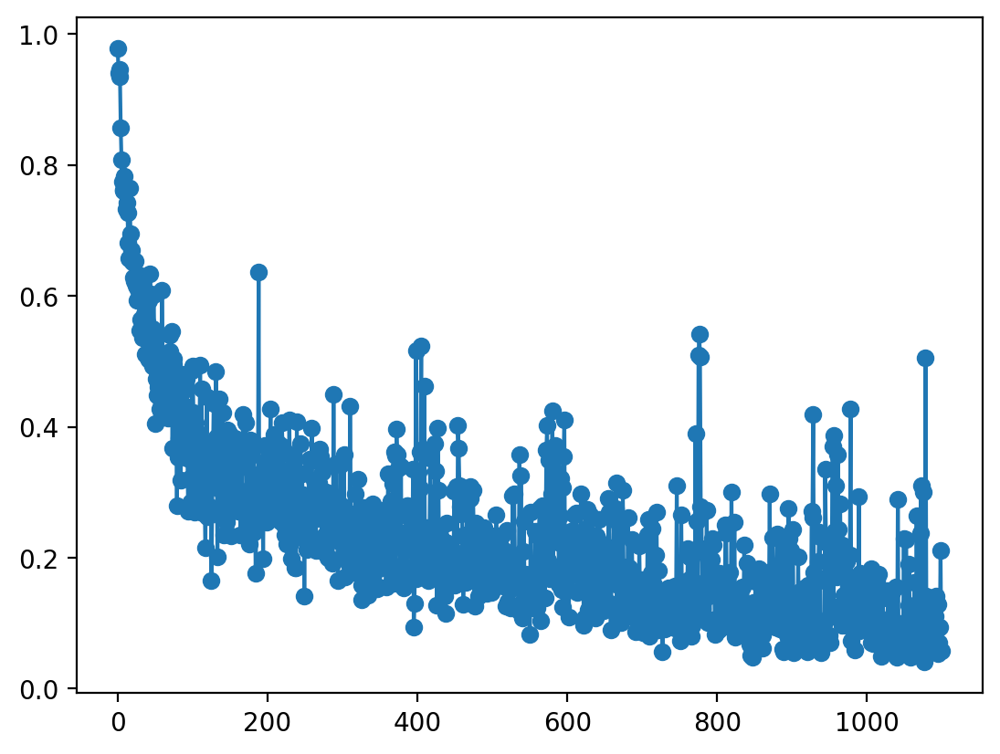

In [ ]:
plt.plot(training_history['cost'],'-o')
plt.show()

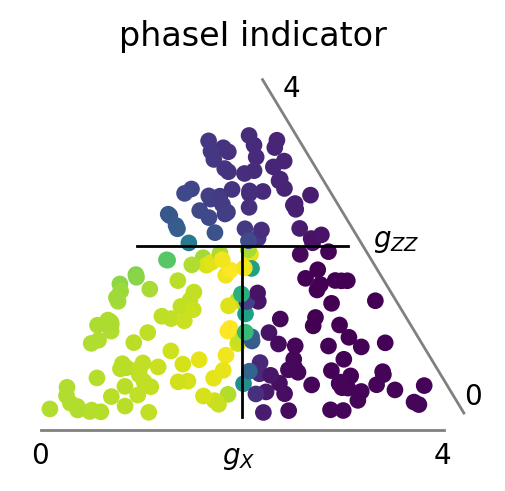

In [ ]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phaseI indicator")

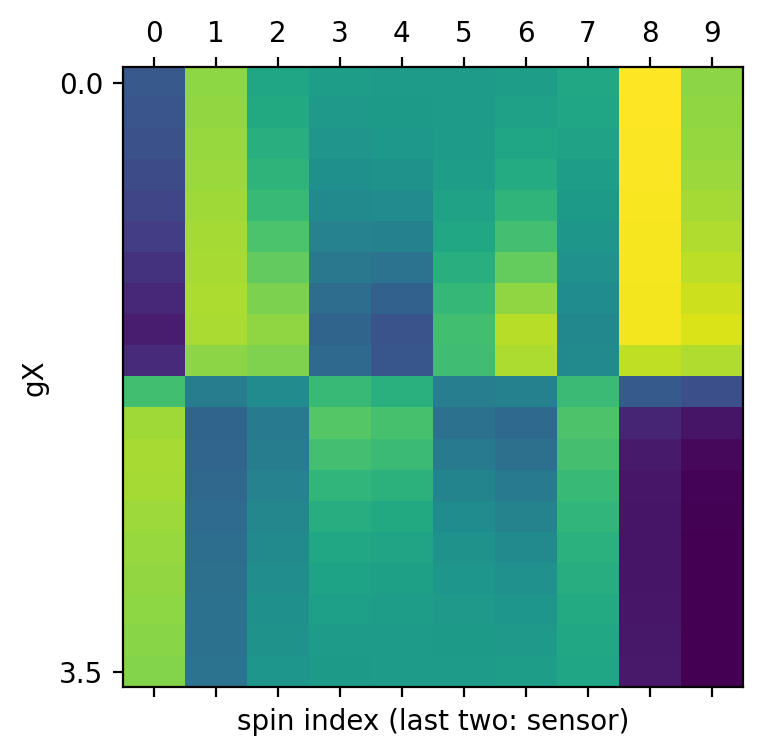

In [ ]:
plot_sweep_gX_cluster_Ising(phase_sensor,N_sys,N_sens)

Note: Indeed, this is different, at least in the details (the output is still mostly the same).

In [ ]:
old={}
old['sys_sens_couplings']=np.array([ 3.5341409e-01, -3.4786388e-01,  3.1113684e-02, -1.2399227e-01,
       -3.0507249e-01, -4.3766463e-01,  3.4797862e-02, -2.6954234e-01,
       -1.9223846e+00, -1.4576998e+00, -4.2409497e-01,  1.9661576e-01,
        5.1329300e-02, -8.1208169e-02,  1.9338018e+00,  1.7533831e-03,
       -3.5965684e-01,  7.9169971e-01,  4.7403634e-02, -7.7469140e-01,
        1.9447229e+00, -1.1994157e-01, -1.4531334e-01,  1.5090830e+00,
        8.0844738e-02,  9.0246305e-02,  7.9150170e-02,  1.3950236e-01,
       -8.0722734e-02,  6.6171688e-01,  2.3645307e-01,  6.1050487e-01,
       -5.5035347e-01,  2.8933036e-01,  2.5400552e-01, -2.3168759e+00])
old['sens_couplings']=np.array([-0.0557727 ,  0.16428922, -1.2250617 ,  0.5555793 ,  0.06681505,
        0.03496919, -0.57924074, -0.15686075,  0.28467014, -0.20337026,
       -0.01879715, -1.2097871 , -0.0294289 ,  0.23834272, -0.01097804])

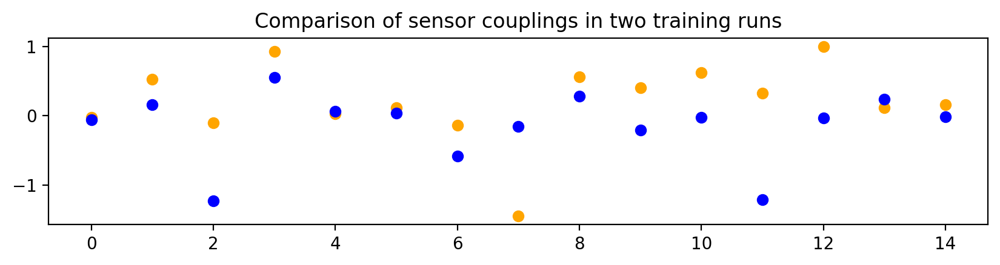

In [ ]:
plt.figure(figsize=(10,2))
for data,color in zip((phase_sensor,old),("orange","blue")):
  plt.plot(data['sens_couplings'],'o',color=color)
plt.title("Comparison of sensor couplings in two training runs")
plt.show()

#### Train only in the three corners of the triangle and check generalization everywhere

In [14]:
# define training sampler: sampling of the triangle at defined locations
def sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                              sampling_locations=np.array([[0.0,0.0,0.2],
                               [4.0,0.0,0.2],
                               [0.0,4.0,0.2]]) ):
  """
  Returns tuple (x_samples, y_samples), with random
  locations x_samples inside the triangle, where
  these are equally sampled from around each of the given
  sampling_locations, each of which denotes
      [gX,gZZ,extent]
  where extent denotes the extent of the sampling region around
  the given location.

  Each of the samples comes with a 3D vector according to the phase it is in.
  (one-hot encoding, for phases I, II, and III)
  """
  # pick the available sampling locations at random:
  loc=np.random.randint(low=0,high=len(sampling_locations),size=batch_size)

  # ascribe gX,gZZ according to the location:
  location=sampling_locations[loc]

  gX=location[:,0] + location[:,2]*np.random.uniform(-0.5,+0.5,size=batch_size)
  gZZ=location[:,1] + location[:,2]*np.random.uniform(-0.5,+0.5,size=batch_size)
  gZXZ=4.0-gX-gZZ

  # the three phases, as they are known analytically:
  middle_boundary=(2*gX<4-gZZ)
  phaseI=(gZZ<2)*middle_boundary
  phaseII=gZZ>=2
  phaseIII=(gZZ<2)*(1-middle_boundary)

  output=np.stack([phaseI,phaseII,phaseIII],axis=-1)

  return (np.stack([gZXZ,gZZ,gX], axis=-1), output)

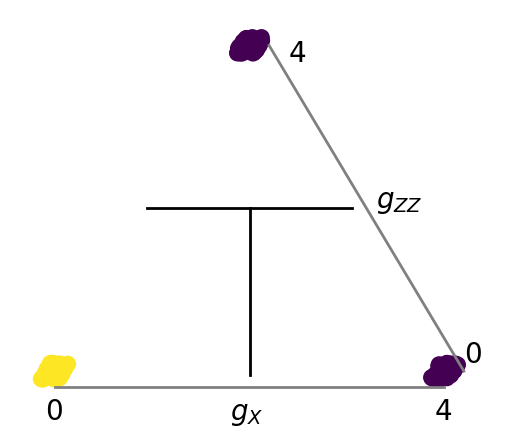

In [14]:
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor_around_corners(200)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_samples[:,0])

In [ ]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


In [ ]:
# training !

batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor_around_corners,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)


In [ ]:
# print results, so they are not lost!
print(training_history['cost'])
print(phase_sensor['sys_sens_couplings'])
print(phase_sensor['sens_couplings'])

[0.6981026509835299, 0.7525467162472778, 0.8472912379055669, 0.8337410827965426, 0.7720217395236423, 0.6609013422639832, 0.749040524918097, 0.9102385679754452, 0.7261529980835804, 1.007446398516768, 0.9204388921381701, 0.9353962196305272, 0.8733845883287165, 0.8919798948746621, 0.5784504799482145, 0.870286536463699, 0.7788181253964672, 0.7977047199690779, 0.6218274556423603, 0.693151354223268, 0.8268493239939495, 0.7354401948362553, 0.666839151404132, 0.703678428543647, 0.6899589620254032, 0.6634059586651179, 0.6841643989326452, 0.6439898411902998, 0.6304271813494106, 0.6287104866564012, 0.6238773330940062, 0.6466554025872517, 0.6040566990286369, 0.6201979647412733, 0.5692267662988619, 0.5657434895017406, 0.5315049576888017, 0.5798976039800955, 0.6164904162424042, 0.46623626145386476, 0.4763309553435394, 0.5354841682320057, 0.5538180212870988, 0.592566281819175, 0.38196546383857777, 0.5829253671579584, 0.42209193114945015, 0.5134212704791195, 0.5461849000096437, 0.5018518535177128, 0.4

In [ ]:
str="-0.23312119  0.47737002  2.5131574   0.64254636 -0.865662    0.97547245 0.15728915 -0.30043152 -0.89125156  0.00515464  0.9507489   0.44279408 0.30105624 -0.37756202 -2.384403    0.34441912  0.37545663  0.3850045  0.35936785 -0.34286195  0.90066725  0.44139856  0.34402487  0.6984294  0.17532715  0.74085873  0.69415504  0.18656917 -0.46585473 -3.4277954 -0.49212053  0.09845755 -1.5177193   0.16210489 -0.1638344   0.78054005"
numbers=[float(a) for a in str.split()]
phase_sensor['sys_sens_couplings']=numbers

In [ ]:
str="-0.5160996  -0.34549773 -1.6740236  -0.7371168   0.26953492 -0.01225248 1.5506457  -0.48949456 -0.3261298   0.63393945  0.8073575  -0.94239265 0.3417776  -1.0272135  -0.9877632"
numbers=[float(a) for a in str.split()]
phase_sensor['sens_couplings']=numbers

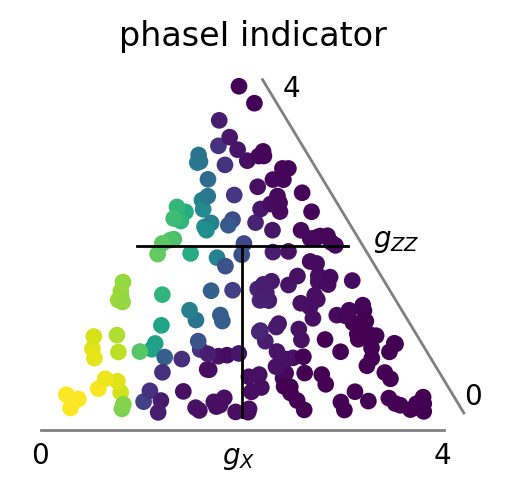

In [ ]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phaseI indicator")

Not that great: weak generalization! Apparently we need to train on larger areas, or on a spot more in the middle of the phase!

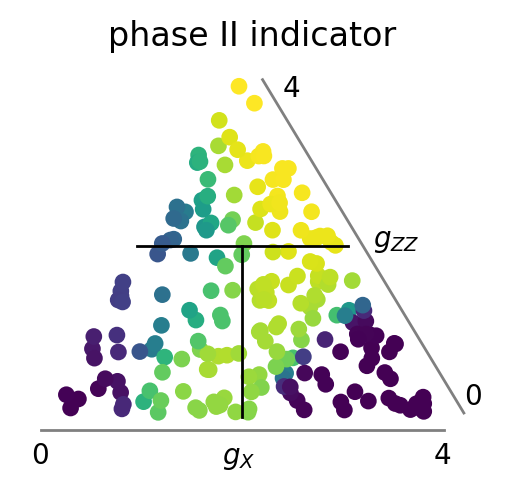

In [ ]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,1],"phase II indicator")

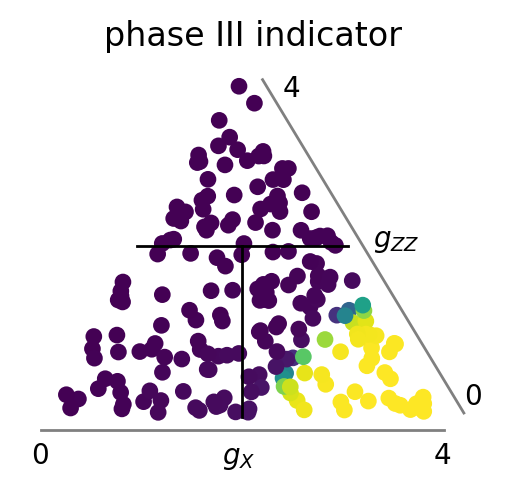

In [ ]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,2],"phase III indicator")

#### Train somewhere in the middle of the phases

##### Point-like patches

In [18]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


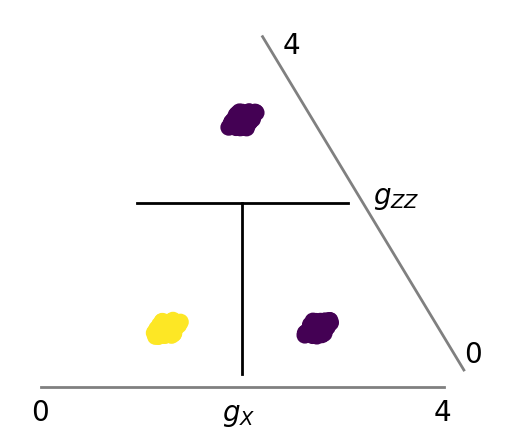

In [15]:
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor_around_corners(200,
                      sampling_locations=np.array([[1.0,.5,0.2],
                        [2.5,.5,0.2], [.5,3.0,0.2]]))

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_samples[:,0])

In [20]:
# training !

batch_size=10
num_batches=1000

def shifted_corners_sampler(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.2],
                        [2.5,.5,0.2], [.5,3.0,0.2]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],training_history['cost'])

(array([-0.40766627, -1.0798744 , -0.6167938 ,  1.182492  , -0.23753476,
        -0.07963008, -1.7644011 , -1.0137388 , -1.934194  , -2.2460082 ,
        -1.0172404 ,  2.0327063 ,  1.5660564 , -1.5400417 , -0.3293474 ],
       dtype=float32),
 array([-0.7361587 ,  0.3847507 ,  1.178328  , -0.5483442 ,  0.5115104 ,
         1.7465782 ,  0.07859731,  0.22414315, -0.2743588 , -0.01287932,
        -0.08541366,  0.00466006,  0.55011123,  0.6928117 ,  0.20656408,
        -0.93557763,  0.01844397,  2.6079283 , -0.9899015 ,  0.47838727,
         0.655717  ,  0.49791965,  0.452087  , -0.03839561, -0.20062338,
        -0.5791319 , -1.5014175 ,  0.43967885, -0.03502724,  0.92984873,
        -0.58484495, -0.10314927, -2.2018    , -0.22050507, -0.25912482,
        -0.35333773], dtype=float32),
 [0.8634677159400368,
  0.9784928198061322,
  0.5832418303557881,
  0.8601962909310401,
  0.8995981923522512,
  0.9769908359956613,
  0.8781593631538387,
  0.7530442462971507,
  1.0638512206843118,
  0.901577

In [15]:
phase_sensor['sens_couplings']=np.array([-0.40766627, -1.0798744 , -0.6167938 ,  1.182492  , -0.23753476,
        -0.07963008, -1.7644011 , -1.0137388 , -1.934194  , -2.2460082 ,
        -1.0172404 ,  2.0327063 ,  1.5660564 , -1.5400417 , -0.3293474 ])

In [16]:
phase_sensor['sys_sens_couplings']=np.array([-0.7361587 ,  0.3847507 ,  1.178328  , -0.5483442 ,  0.5115104 ,
         1.7465782 ,  0.07859731,  0.22414315, -0.2743588 , -0.01287932,
        -0.08541366,  0.00466006,  0.55011123,  0.6928117 ,  0.20656408,
        -0.93557763,  0.01844397,  2.6079283 , -0.9899015 ,  0.47838727,
         0.655717  ,  0.49791965,  0.452087  , -0.03839561, -0.20062338,
        -0.5791319 , -1.5014175 ,  0.43967885, -0.03502724,  0.92984873,
        -0.58484495, -0.10314927, -2.2018    , -0.22050507, -0.25912482,
        -0.35333773])

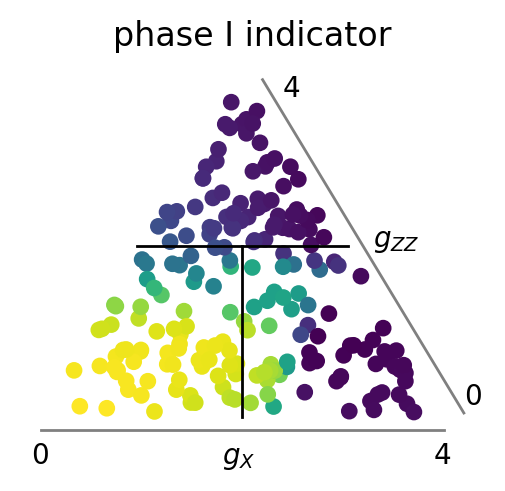

In [17]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phase I indicator")

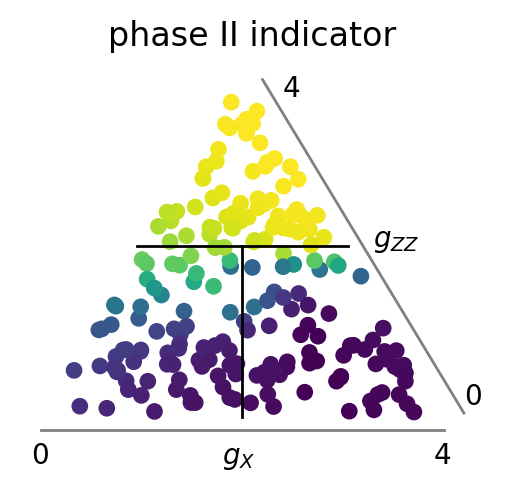

In [19]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,1],"phase II indicator")

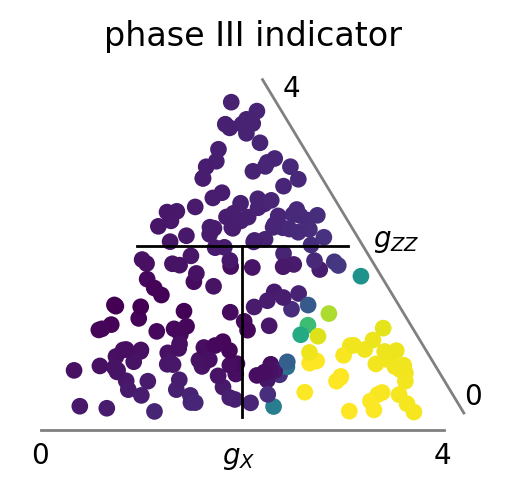

In [20]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,2],"phase III indicator")

##### Spread-out patches

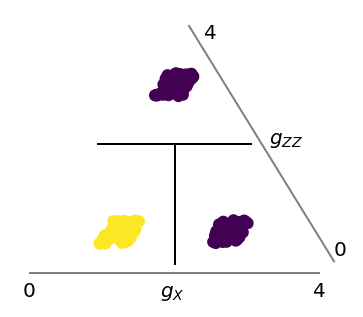

In [20]:
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor_around_corners(200,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_samples[:,0])

In [17]:
batch_size=10
num_batches=1000

def shifted_corners_sampler_large(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler_large,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],training_history['cost'])

NameError: name 'sample_batch_cluster_Ising_phase_sensor_around_corners' is not defined

In [39]:
# extended patches training:
phase_sensor['sens_couplings']=np.array([-0.14043546, -0.2968779 , -1.1784818 , -0.08900806,  0.08858289,
         0.29024383, -0.2317931 , -0.28703886, -0.5538061 ,  0.28326747,
        -0.24485053,  0.22838007, -0.02507335, -0.12761621, -1.690802  ])
phase_sensor['sys_sens_couplings']=np.array([ 0.38585857,  0.22318816,  0.55227166,  0.02114065,  0.06372932,
         0.65767723, -0.05591971,  0.08228629,  0.08276574, -0.00575222,
         0.07148502,  0.04499208,  0.15422885, -0.0156942 ,  0.04044104,
         0.04901959, -0.08192573,  1.5633419 , -0.4770192 ,  0.0349135 ,
        -0.09859782,  0.263962  , -0.19167918,  1.0152199 ,  0.6554026 ,
         0.02994699, -1.2008159 ,  0.5472995 , -0.17830192, -2.9366803 ,
        -0.2475181 ,  0.6919404 , -2.7629857 , -0.03923175,  0.01868125,
         0.9487739 ])
training_history={}
training_history['cost']=np.array([0.9312762663714309,
		  0.9117799855712712,
		  0.7254098472855934,
		  0.7434887454486351,
		  0.8936277432364712,
		  0.772377840206057,
		  0.7308362250720792,
		  0.8404373472011024,
		  0.7478048578043599,
		  0.6598555773346793,
		  0.7553153846903322,
		  0.6651956894184881,
		  0.6760720897560176,
		  0.8382838300960177,
		  0.520928346480221,
		  0.7973313265990434,
		  0.6972514136173018,
		  0.8483390804708598,
		  0.6147371223765007,
		  0.6999626354664225,
		  0.4183941964501384,
		  0.7863569874820411,
		  0.8024519002708056,
		  0.7080233989847639,
		  0.738144204863766,
		  0.5096207138833897,
		  0.4957728168994274,
		  0.367785070845981,
		  0.589756737422239,
		  0.6702248717154241,
		  0.6671367972984829,
		  0.4914230786252974,
		  0.5727080468916927,
		  0.4966111460731847,
		  0.491696111383037,
		  0.49039237122833335,
		  0.3886113703091022,
		  0.5634653039525573,
		  0.703829951125351,
		  0.5499349379353584,
		  0.5606141486355412,
		  0.405152602730907,
		  0.5486866468641657,
		  0.3960902266313384,
		  0.5462744400798696,
		  0.619859226375965,
		  0.3963173655636277,
		  0.46219231221509743,
		  0.30151572047735103,
		  0.7444080075338021,
		  0.5964976269976312,
		  0.44349096395118826,
		  0.3696553677951817,
		  0.5840523495896487,
		  0.5028572334178439,
		  0.4387616316280085,
		  0.4323492739208641,
		  0.5756141184902482,
		  0.35829008077389757,
		  0.4849287097109837,
		  0.4311214936286265,
		  0.5567958321143457,
		  0.27864195428523714,
		  0.4086412272645096,
		  0.27502933082716874,
		  0.5358327708257047,
		  0.4074730512804578,
		  0.34050503876559335,
		  0.3813088976658839,
		  0.5418268385837977,
		  0.4551716482737955,
		  0.3323437903677905,
		  0.3983344410840802,
		  0.4686369424122378,
		  0.3104940877304536,
		  0.5117742917506909,
		  0.23711990669990532,
		  0.23319840265637382,
		  0.49304855517451507,
		  0.3100543427930578,
		  0.35996673628966397,
		  0.45695750336507845,
		  0.35361670128991773,
		  0.5501040074210956,
		  0.39608042550791395,
		  0.3049909064263347,
		  0.23322593589294277,
		  0.4579839799051354,
		  0.3578183455410898,
		  0.4927054454258603,
		  0.2827491848167157,
		  0.37075170324757817,
		  0.4406049161628979,
		  0.3471548699121108,
		  0.22764424450750723,
		  0.4651406087076194,
		  0.27133289363132196,
		  0.2895942612046466,
		  0.4083281951395053,
		  0.44181848143563884,
		  0.4488194367840257,
		  0.26441000208464216,
		  0.3869467895600528,
		  0.4311394070683788,
		  0.29213126369935705,
		  0.3070935544645851,
		  0.47825749920452065,
		  0.44193748579221753,
		  0.23763424713328293,
		  0.260268636645484,
		  0.31119929863964046,
		  0.3325646557904627,
		  0.3390685671326622,
		  0.28835164914174183,
		  0.2658812564846976,
		  0.4125709892405732,
		  0.2893964131491455,
		  0.3473086089716722,
		  0.3667164776473562,
		  0.4825719807940452,
		  0.17959573976955617,
		  0.38057865532936896,
		  0.37615824515574814,
		  0.28059376426583355,
		  0.24676552679468472,
		  0.22838001002501856,
		  0.41284744478939583,
		  0.5109159719125026,
		  0.3111566828259087,
		  0.26297631861579174,
		  0.3963837643117979,
		  0.2397419692629666,
		  0.2587376421374028,
		  0.2768226933185257,
		  0.18876893575648196,
		  0.22389225873621102,
		  0.1855109993260852,
		  0.2500143360285635,
		  0.33334752023018926,
		  0.30937102984830595,
		  0.19299175132312857,
		  0.2171680477441848,
		  0.20922621858248913,
		  0.17658740061481856,
		  0.2501960536248821,
		  0.29080515232250786,
		  0.16945052925890963,
		  0.21924636715730675,
		  0.23608611415015085,
		  0.2313903447321865,
		  0.1983340975966659,
		  0.20749079048036595,
		  0.33471943694397177,
		  0.29741633018961117,
		  0.2754205988654819,
		  0.2685636335806262,
		  0.20824813939482317,
		  0.1396987816910375,
		  0.13372896528112502,
		  0.22981480858406717,
		  0.1746334983997882,
		  0.0966742103217921,
		  0.2069707355021749,
		  0.5943826606870497,
		  0.5942501480248048,
		  0.9852612499871892,
		  0.5922955301856003,
		  0.3398160434134171,
		  0.31137476499921574,
		  0.19569551537311486,
		  0.5774056332407238,
		  0.21202637444206304,
		  0.5750236949020986,
		  0.7000534387826002,
		  0.46392646907881663,
		  0.32644728549565444,
		  0.3031046686436489,
		  0.5887786960035567,
		  0.4435891948806763,
		  0.4245813581978418,
		  0.4488492210547833,
		  0.3253268307076324,
		  0.43821948954866086,
		  0.6973396535743837,
		  0.8082578491346999,
		  0.32573935300167245,
		  0.30723449448330137,
		  0.5563748773508335,
		  0.17223039561999043,
		  0.5703012163370701,
		  0.4286859599427687,
		  0.31963251589821506,
		  0.43421944130453005,
		  0.5674719140229799,
		  0.7809915435616287,
		  0.27971295880407665,
		  0.6289203928800586,
		  0.7709565846131248,
		  0.6540033156308469,
		  0.21097191972307755,
		  0.40482901510236824,
		  0.3097209814434037,
		  0.44644870376557744,
		  0.5149797757305684,
		  0.4106449773805285,
		  0.18837445889881616,
		  0.3161133307132052,
		  0.5297370597390378,
		  0.31376347596153015,
		  0.3708184204886091,
		  0.35723461805200174,
		  0.24673248460261604,
		  0.23693797912639894,
		  0.1631024275112612,
		  0.12861689599220408,
		  0.1338456455652242,
		  0.12499795175502589,
		  0.1284833255037097,
		  0.09997900886029601,
		  0.17389303647381565,
		  0.1524296235041785,
		  0.15050049615475014,
		  0.1891625082305694,
		  0.09881955893791985,
		  0.18263126281307118,
		  0.10388976735300537,
		  0.1408212274591424,
		  0.11374220229304977,
		  0.0784071655400192,
		  0.0803523117103424,
		  0.1545743706822747,
		  0.10139354160124585,
		  0.13208537843242543,
		  0.1400239439454405,
		  0.10080231396506845,
		  0.1407744718425037,
		  0.08470196103955747,
		  0.0819320145933771,
		  0.06600580691784692,
		  0.10514224171866493,
		  0.1246772011990757,
		  0.0964567445403676,
		  0.0753900218682528,
		  0.11231985037602484,
		  0.08942316702328243,
		  0.07760659687939697,
		  0.11033308948265755,
		  0.08676277386141287,
		  0.07751401592403791,
		  0.09832300134926217,
		  0.07282817093439879,
		  0.0643034257275546,
		  0.09107382703680114,
		  0.09333829244719524,
		  0.08149255771919987,
		  0.07104589760572347,
		  0.05101051641072758,
		  0.07122543475876102,
		  0.07140264764616613,
		  0.06667708938965708,
		  0.06427256328570151,
		  0.06741870093059554,
		  0.06718060081897625,
		  0.039559569452427355,
		  0.06447591697323031,
		  0.052346494953142954,
		  0.03620356573653395,
		  0.0445253842112748,
		  0.047003573154418894,
		  0.046037764546556156,
		  0.05366484476473391,
		  0.035178176650828064,
		  0.040019716669194266,
		  0.039780243660923864,
		  0.04540170431788533,
		  0.03086373189076313,
		  0.057332514362102724,
		  0.03338121159150806,
		  0.03875644309399578,
		  0.030976556031174586,
		  0.02821115766997989,
		  0.035289220325772655,
		  0.03862162697516265,
		  0.0420090009325769,
		  0.036647997290565865,
		  0.028076610021020902,
		  0.029439897962159962,
		  0.032135679097073065,
		  0.02807117628845438,
		  0.024919884061654456,
		  0.021636387873035547,
		  0.023113845570446764,
		  0.02465174943244584,
		  0.018924309057617685,
		  0.023205828912585186,
		  0.02842417555541944,
		  0.020884343215930697,
		  0.022758111630110676,
		  0.0198766669007306,
		  0.022730327545127743,
		  0.017968239820010962,
		  0.020152520956996746,
		  0.018324713496182313,
		  0.01513248021290966,
		  0.01554248114358007,
		  0.017845244836142655,
		  0.01477843536409433,
		  0.013469563664051951,
		  0.012900452455969625,
		  0.016021662927903017,
		  0.010943606777363231,
		  0.013718889764243597,
		  0.01148150884182566,
		  0.012291530924031544,
		  0.010008229610405348,
		  0.009727892815356689,
		  0.00976859619351966,
		  0.011421872826394763,
		  0.010673162114136225,
		  0.010071174288201895,
		  0.009828220256468588,
		  0.01055404700930758,
		  0.007917577584985411,
		  0.008635148162079578,
		  0.007535910524880893,
		  0.00820620486026583,
		  0.006121892709562943,
		  0.006790827215913453,
		  0.007592753311897507,
		  0.0066880181643221865,
		  0.006478415384690778,
		  0.00717047869892275,
		  0.006993142100084245,
		  0.005811910708012828,
		  0.006346534012413282,
		  0.006245063031075742,
		  0.006956705949087451,
		  0.006667408173012372,
		  0.0043047216710762025,
		  0.0050669624555731325,
		  0.0055043115700908855,
		  0.006396823843663546,
		  0.005197288114351261,
		  0.004143745665761056,
		  0.005237676260173678,
		  0.004670805722290861,
		  0.004473277119983114,
		  0.0043242020207589675,
		  0.004910984908151417,
		  0.004518865546977403,
		  0.004000892410104898,
		  0.004458035405638445,
		  0.0035029592186184956,
		  0.003855254913463643,
		  0.004037239264874726,
		  0.0032029236452873243,
		  0.003418238682636772,
		  0.003398606092240324,
		  0.003233799779739935,
		  0.003047497200531131,
		  0.003102921361965316,
		  0.0029755425472255165,
		  0.0031770900403131517,
		  0.002992614917986116,
		  0.0027558070686260535,
		  0.0031177712910488557,
		  0.0028055189887026912,
		  0.003110956315143955,
		  0.0025852690675483214,
		  0.00327876937615043,
		  0.002636828911471721,
		  0.0026591511826539677,
		  0.0029199809877834466,
		  0.003087277590630731,
		  0.002622407578532369,
		  0.00240983538328955,
		  0.00200175692727832,
		  0.002523642795098354,
		  0.0025345174687937495,
		  0.0018791053875432955,
		  0.0028543467318560348,
		  0.0027203510585098083,
		  0.0022677269142204392,
		  0.0027584326382598394,
		  0.0019121926661386454,
		  0.0019351788193917533,
		  0.002265384329385621,
		  0.0023806827478489254,
		  0.0022405588119093147,
		  0.002312221317816267,
		  0.0021320790717230197,
		  0.0020412205232224197,
		  0.0021814719168439752,
		  0.001991770083846063,
		  0.0018606091431045278,
		  0.002034230158642789,
		  0.0017865640440268983,
		  0.001565116073117961,
		  0.001863245506377184,
		  0.0015381000182948027,
		  0.0016097177654551217,
		  0.001665363048570783,
		  0.00172895561486055,
		  0.0018184314511026788,
		  0.0020192182734447032,
		  0.0019568817327254573,
		  0.001726062258519247,
		  0.0018283326398667397,
		  0.0021943119552373896,
		  0.0014491827555075114,
		  0.0014660274306911626,
		  0.0017375353726589208,
		  0.0015205254861822518,
		  0.0016713979833831941,
		  0.0014880659356727099,
		  0.0016562441415382538,
		  0.0015857944016069796,
		  0.0018477789636918884,
		  0.001269385290025217,
		  0.0014274743387626082,
		  0.00120885886252907,
		  0.0017230508843408363,
		  0.0013948537966276989,
		  0.001448053511116578,
		  0.0013119827800769901,
		  0.0012236678734082883,
		  0.0014167786544731834,
		  0.0013814602418412807,
		  0.0014318938798266957,
		  0.0010409831416649802,
		  0.0014013158254403994,
		  0.0010945373179336406,
		  0.00132656330724089,
		  0.0011846139921285327,
		  0.0011550498546159392,
		  0.0010433692846365005,
		  0.0011241932614397003,
		  0.0012793450328732203,
		  0.0011170484641119592,
		  0.0012291290983914838,
		  0.0011242839696767508,
		  0.0012413032671171995,
		  0.0010885191546991645,
		  0.000932411187919157,
		  0.0011298120278147052,
		  0.0011767297450264707,
		  0.001166010366981709,
		  0.0011924490327681059,
		  0.0009701710557773531,
		  0.0011839124671242564,
		  0.0011986381527999894,
		  0.0010582184439156597,
		  0.0009634405001479381,
		  0.0012701068640460073,
		  0.0010856858729843106,
		  0.0010719068472165277,
		  0.000817062423877035,
		  0.0010116825256943004,
		  0.0008419769430619665,
		  0.0009738894580945855,
		  0.0010989212240221033,
		  0.0009183262358475221,
		  0.0009137893659829021,
		  0.0009052100320534799,
		  0.0010277914818070187,
		  0.0007655803377513003,
		  0.00073118725561027,
		  0.0009919875295846781,
		  0.0010471016035688118,
		  0.0007943398281103544,
		  0.0006989135704715197,
		  0.0007454767335227181,
		  0.001012863422931778,
		  0.0007061785043431437,
		  0.0008946535826509922,
		  0.0008683166459834789,
		  0.0009451153882771898,
		  0.0007871713502808594,
		  0.0009124509709727039,
		  0.0007175795763417417,
		  0.0007657529318515716,
		  0.0007954928083288189,
		  0.0010112321308814042,
		  0.0007560205356566161,
		  0.0009097541732666517,
		  0.0008516580948239166,
		  0.000939777859841924,
		  0.0007881389119946319,
		  0.0009076873555058804,
		  0.0007162229781814861,
		  0.0006953810420678493,
		  0.0008455238670041935,
		  0.0006254112318944997,
		  0.0008564189704604149,
		  0.0008085884933222949,
		  0.0008015712806185148,
		  0.0007803696582970529,
		  0.0006473798707196035,
		  0.000762953130031689,
		  0.0006602651825169462,
		  0.0008366445832852842,
		  0.0007763289552985714,
		  0.0007510760097524023,
		  0.0007044037407485087,
		  0.0007507566970933546,
		  0.000765113732191282,
		  0.0007583925611324909,
		  0.0007388925118225079,
		  0.000765674746250588,
		  0.0007023457932837679,
		  0.0006931164629614508,
		  0.0006774197923644186,
		  0.0007536964152118351,
		  0.000708816180700421,
		  0.0006741766546643836,
		  0.0005848955567958503,
		  0.0007645872468132536,
		  0.0005604920611895481,
		  0.0006885666303440579,
		  0.0005050114705255501,
		  0.000790017676117307,
		  0.0005967305130641093,
		  0.0006815709059795156,
		  0.0006281913629656058,
		  0.0005050132509270902,
		  0.000511881683026018,
		  0.0006766600078409866,
		  0.0005583033996514499,
		  0.0006415647351705742,
		  0.0006474624895858557,
		  0.0006609904988351826,
		  0.0006170612594003551,
		  0.00070062081921406,
		  0.00059231988183739,
		  0.0006546737298652883,
		  0.0005149339463692323,
		  0.0006235711005545564,
		  0.0007012717180410804,
		  0.0006505205941117483,
		  0.0006113091836912503,
		  0.0005233623765588766,
		  0.0006109505878916799,
		  0.0005487496240161777,
		  0.0005252883568262965,
		  0.0005391656880806508,
		  0.0006046369818575564,
		  0.0006140863323479597,
		  0.0004307792836163014,
		  0.000531580495430547,
		  0.00045890645749550104,
		  0.00043525134382927576,
		  0.0005340326017043617,
		  0.00043844352525871717,
		  0.00045821787543506306,
		  0.000500923589511261,
		  0.0004993590366699419,
		  0.000515931479237215,
		  0.0005420086640711115,
		  0.0004117533595219986,
		  0.0005804975947771469,
		  0.00047727468150131347,
		  0.0006164127225345139,
		  0.000535373088387232,
		  0.00042981053666792606,
		  0.00043614156762413587,
		  0.000492360783980004,
		  0.00045485458520002665,
		  0.0005335235008382941,
		  0.000494035832255778,
		  0.00043786591403273227,
		  0.0005002232432413613,
		  0.0004862888499875641,
		  0.0005507334753162812,
		  0.00041738716273240857,
		  0.00047437677004592214,
		  0.0005339184955974455,
		  0.0005446710483075054,
		  0.0004797063556245576,
		  0.0004506824610803018,
		  0.0005038860540092135,
		  0.00044110952828203267,
		  0.00046024736947360406,
		  0.0004936239030341779,
		  0.0005297812477385195,
		  0.0005370887769512067,
		  0.0003425942963406042,
		  0.00046112096422953885,
		  0.0005267928767936981,
		  0.000472475632743376,
		  0.0004898310943578224,
		  0.0005051218756800531,
		  0.0003474806888274176,
		  0.0004700913183176013,
		  0.0003739376305548092,
		  0.0004245971478667964,
		  0.0004292321819082882,
		  0.00043532630927552824,
		  0.0004629384052647744,
		  0.00044009360948849745,
		  0.00038926793332727083,
		  0.0003847684153591833,
		  0.00043032771771291155,
		  0.00040266241615551296,
		  0.00043267104343238294,
		  0.0004213773550901099,
		  0.00042201206558028565,
		  0.00045758434304814054,
		  0.0004372157927434703,
		  0.00048062420289222524,
		  0.0003901205865386811,
		  0.0004774007449571231,
		  0.0004488853559602468,
		  0.00041414660272550617,
		  0.00036437865974064504,
		  0.0004525646531049212,
		  0.00040552501062017434,
		  0.0004541251545098294,
		  0.0003547593521141128,
		  0.0004964506314120292,
		  0.00035594117421945627,
		  0.00030245425976255604,
		  0.00038356924429271713,
		  0.00033728152139644266,
		  0.00032231905098740663,
		  0.00039867949951595636,
		  0.000387522576638053,
		  0.0003632781001398965,
		  0.00034887951743289397,
		  0.00041375163156810843,
		  0.0004610696638913966,
		  0.0003542764554024444,
		  0.00041253221970583687,
		  0.00036124607516818875,
		  0.00032957110144008877,
		  0.0004096702640889161,
		  0.0003629248270279116,
		  0.00046534656384863233,
		  0.00040011032973790724,
		  0.0004018702627375466,
		  0.00040321458560510607,
		  0.00041539488605543695,
		  0.00038796016395768447,
		  0.0003312659375086919,
		  0.0003797337917549718,
		  0.0002882564156519493,
		  0.0002939787883651366,
		  0.0003164826909637473,
		  0.0003340107515808829,
		  0.0003362773251379502,
		  0.00035182842434620633,
		  0.00032638468806717874,
		  0.00030562361288776244,
		  0.000360421054961329,
		  0.0003287056168398332,
		  0.0003248537962885014,
		  0.00036458400078270056,
		  0.00033311251209641247,
		  0.0003261799924438222,
		  0.0003749870973635543,
		  0.00038684042209731023,
		  0.0003123025513562087,
		  0.0003058795390592518,
		  0.0003313246809056765,
		  0.00034441222334769363,
		  0.0003078409102347739,
		  0.0003480001071426365,
		  0.0003490767909042461,
		  0.0003550979874048011,
		  0.00031440467689223146,
		  0.00027300415526554454,
		  0.0003546180514438141,
		  0.0003165761295189181,
		  0.00025393843287434395,
		  0.00029560637717693575,
		  0.0003365964594888144,
		  0.0002853321393512638,
		  0.0003321522964832621,
		  0.0002582042504594534,
		  0.00031345526262709116,
		  0.00026906876248743465,
		  0.0003329370152902049,
		  0.0002808237899671262,
		  0.00024690828496874386,
		  0.00029535588884699516,
		  0.0002862119907673252,
		  0.00028467160091340466,
		  0.0002991867875107712,
		  0.0003090528961614209,
		  0.0002791629527039499,
		  0.00036036591077516614,
		  0.00028788753012865876,
		  0.0002862668733505755,
		  0.0003413811470979998,
		  0.00030170952534874773,
		  0.0002979798822310824,
		  0.00023985136484506306,
		  0.00026327077754656795,
		  0.0002983323192575739,
		  0.0002970828921489433,
		  0.00027678760777749307,
		  0.0002930574674619146,
		  0.0003100025368649783,
		  0.00030223096657814376,
		  0.00027452378292252964,
		  0.00023877607230902395,
		  0.0002840593471462563,
		  0.0002741322051855974,
		  0.000278611935667923,
		  0.0002702595214547961,
		  0.00022068162061742407,
		  0.0002728664514115718,
		  0.00030477718169384053,
		  0.0002669530461155348,
		  0.00023430421606659554,
		  0.00026237593039348043,
		  0.00027453707073296304,
		  0.00026773972038062166,
		  0.00029165449220804285,
		  0.00026795334419397364,
		  0.00022634780583532485,
		  0.0002997167307352181,
		  0.0003006158733364388,
		  0.0002653361205823556,
		  0.0001993725452559537,
		  0.0002985849959782928,
		  0.0002516082105043113,
		  0.00023223382079993714,
		  0.0002617852522787194,
		  0.00024365435702513273,
		  0.00023919218750412065,
		  0.0002549724985932796,
		  0.0002724497595331398,
		  0.00026057276594078956,
		  0.00023725532187062175,
		  0.00027526035004408724,
		  0.00024604176035815053,
		  0.00029557349489069693,
		  0.00030296805864385776,
		  0.00024140643555100376,
		  0.000262500379089816,
		  0.00029095943984928886,
		  0.00028207255268234435,
		  0.0002736839194456179,
		  0.000261295795705271,
		  0.0002465391686737598,
		  0.00021304721012349167,
		  0.00024790794761284687,
		  0.000301716131630404,
		  0.0002455517691818271,
		  0.00025340221029789093,
		  0.00021551444741019595,
		  0.00023570807707436127,
		  0.0002737998274809859,
		  0.00025056960065542044,
		  0.00023145792364644147,
		  0.0002456130122902561,
		  0.00029446353313567554,
		  0.00024449576456196204,
		  0.000249209185001034,
		  0.00021183373887887882,
		  0.0002463911705712342,
		  0.00023607822783120692,
		  0.0002353184123532363,
		  0.00024570815941628174,
		  0.00024195821518895196,
		  0.00022152325342622995,
		  0.0002467855146065736,
		  0.00022489172567623575,
		  0.00022494511264527193,
		  0.00021842852011234024,
		  0.0002561601870508149,
		  0.00023064794268255214,
		  0.0002235715820273717,
		  0.00023458584494592173,
		  0.00019439927161439546,
		  0.0002430454238981958,
		  0.00022539821620108763,
		  0.00023121803076322876,
		  0.00018715945571529108,
		  0.00023854389582755772,
		  0.00022871381269245054,
		  0.00024998028945385706,
		  0.0002388019710214987,
		  0.00019108460895329876,
		  0.00024057759024779342,
		  0.00022035829909225444,
		  0.0001990633524787453,
		  0.00021006252793033696,
		  0.0002268443430453234,
		  0.00019102603141825923,
		  0.00021440174995977527,
		  0.00023096646677383723,
		  0.0002051247514546863,
		  0.00019457915887680327,
		  0.0002066216023421022,
		  0.00020042612002998876,
		  0.00022666096990608844,
		  0.00020030210391906302,
		  0.00021692373334353132,
		  0.00019501108857103064,
		  0.00022456085047307326,
		  0.00017113617218795157,
		  0.00023363670469954629,
		  0.00021767905605905112,
		  0.00022224380130624906,
		  0.00020741744324960493,
		  0.00020928099075297725,
		  0.00021258094752286548,
		  0.00019861518213825234,
		  0.00018009128547956648,
		  0.0002240220367812116,
		  0.00021639726460363608,
		  0.0002109783124016711,
		  0.0002297006137826786,
		  0.00020932601790041094,
		  0.0001455054809688817,
		  0.00021074664907497296,
		  0.0002095241006259802,
		  0.00021658388430088955,
		  0.000175024890698877,
		  0.0001801390279555558,
		  0.0001957957149858639,
		  0.00018831159212887727,
		  0.00020889344987186153,
		  0.00017834048679300592,
		  0.00021854948029399832,
		  0.00020714333089414766,
		  0.000192528340549688,
		  0.00019386886014796485,
		  0.0001925574546525157,
		  0.00020546957562603586,
		  0.00020484224100817964,
		  0.00021258574915339521,
		  0.00019091488087875252,
		  0.00016384862633934993,
		  0.00022249832891692612,
		  0.0002044566095377567,
		  0.00019412416213344746,
		  0.00018242454892939734,
		  0.00016495849985497505,
		  0.0001969835623548865,
		  0.00019868014676873675,
		  0.0001851806090086469,
		  0.0001959707558309526,
		  0.00018181308930984206,
		  0.0001807282622271311,
		  0.00018806133499308264,
		  0.00018349926951971666,
		  0.00018241233196119563,
		  0.00016978295372002886,
		  0.00016890235788116802,
		  0.0001958650535430917,
		  0.00019384498254464887,
		  0.00018368606827202772,
		  0.00015953850372088591,
		  0.00014957952470110057,
		  0.00017044268896019072,
		  0.00017717878226665277,
		  0.0001722402817313276,
		  0.0001700438211315799,
		  0.00016594701472729886,
		  0.00019945511081469097,
		  0.00016661808362922168,
		  0.0001654006484596962,
		  0.00016021898812204762,
		  0.00018549452563829726,
		  0.0001737897252686869,
		  0.00019707217500729795,
		  0.00018501292900752292,
		  0.00018755868970095823,
		  0.00018459791006768153,
		  0.00017931941773862762,
		  0.00015308675569859485,
		  0.00018537511563943755,
		  0.00016703293657675686,
		  0.0002052754917195552,
		  0.0001732986126600205,
		  0.0001764578783855513,
		  0.00018444942987778522,
		  0.00017566490206237224,
		  0.00016750665962347386,
		  0.00016531175075713218,
		  0.00018277762164279596,
		  0.00015934627581421456,
		  0.00016272881815431869,
		  0.00016437757002093825,
		  0.00014156462472837496,
		  0.0001764761979816145,
		  0.00015586902450079456,
		  0.0001718438587043537,
		  0.00016650124035708452,
		  0.00018691018098181293,
		  0.00017674717832492876,
		  0.0001542963900315919,
		  0.00018463015646140132,
		  0.00017858814093569416,
		  0.0001526281651278285,
		  0.0001652933635838198,
		  0.0001740091670173742,
		  0.00016662222858195686,
		  0.00015799599595800126,
		  0.0001826557286263793,
		  0.00015938920494629763,
		  0.00016705687300809887,
		  0.0001705754859475108,
		  0.00016715475575453708,
		  0.00015439549556867766,
		  0.00016486551056353816,
		  0.00015854847197474556,
		  0.00015643793159628175,
		  0.00016868369760343513,
		  0.00016468970437277046,
		  0.00013876482730714932,
		  0.00014110227781201508,
		  0.00015095751167471707,
		  0.00016182991067262574,
		  0.0001449591816073708,
		  0.00015782444172976373,
		  0.00016178690064169097,
		  0.00014839683971185373,
		  0.00015089524343554682,
		  0.00015758052361841218,
		  0.0001439595012067225,
		  0.00015236921984914227,
		  0.00013908298053579813,
		  0.00015113242855198364,
		  0.00015132184791930898,
		  0.00015321768673870728,
		  0.0001558848110704653,
		  0.00015478318941007278,
		  0.0001394942454865282,
		  0.00015098644370976374,
		  0.00015334634464114262,
		  0.00013041409330952916,
		  0.00015907205058242978,
		  0.00015897130173936903,
		  0.00015042610281693316,
		  0.00013994285131910952,
		  0.0001346424584025144,
		  0.00015176503065105295,
		  0.00016323076617664317,
		  0.0001578437389415123,
		  0.00015008292916234527,
		  0.000132546941538465,
		  0.00015186724202235021,
		  0.00016610855336740975,
		  0.00014408773201195565,
		  0.0001365799072386128,
		  0.00015052559945477937,
		  0.00015832299339013262,
		  0.00015057846314474232,
		  0.00014823238753112388,
		  0.000123992768321973,
		  0.00011824990556283225,
		  0.00015776583345965015,
		  0.00015476594915269463,
		  0.00012645811647589233,
		  0.0001270951697179493,
		  0.0001334898554892223,
		  0.00013572147013503095,
		  0.00013953887182145737,
		  0.0001335291135963086,
		  0.00013953108868798998,
		  0.0001361194483366298,
		  0.00013432891188044834,
		  0.000135160870496844,
		  0.00012987391673337462,
		  0.00014559678395206446,
		  0.00015245222019585962,
		  0.00014081674302441488,
		  0.00013819469656737817,
		  0.00013031082773524294,
		  0.00012688322348164253,
		  0.00013899554118953583,
		  0.00016083548341418478,
		  0.0001454272415274536,
		  0.00012814683012712838,
		  0.0001464166497763968,
		  0.00012289649580377837,
		  0.0001501442269722187,
		  0.0001457633375165365,
		  0.00013261063115393778,
		  0.000126876221930623,
		  0.00012323877599167886,
		  0.00014562351035237405,
		  0.0001379380893629476,
		  0.00013487718840600316,
		  0.0001284760756557461,
		  0.00014071544279890423,
		  0.00012485343879739793,
		  0.00012062969402242339,
		  0.00012390335218574402,
		  0.00012535070494959486,
		  0.0001303636811598233,
		  0.00011455359785299862,
		  0.00012975061133322193,
		  0.00011021819600214575,
		  0.00012976030002874488,
		  0.00012994534672266286,
		  0.00011876568698376768])

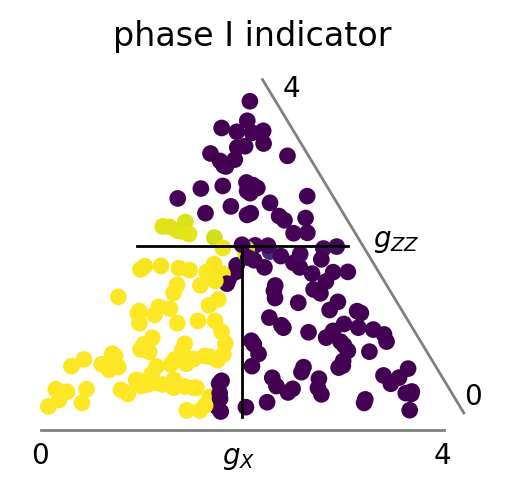

In [33]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phase I indicator",show=False)
plt.savefig("clusterIsingSpreadOutPhaseI.pdf")

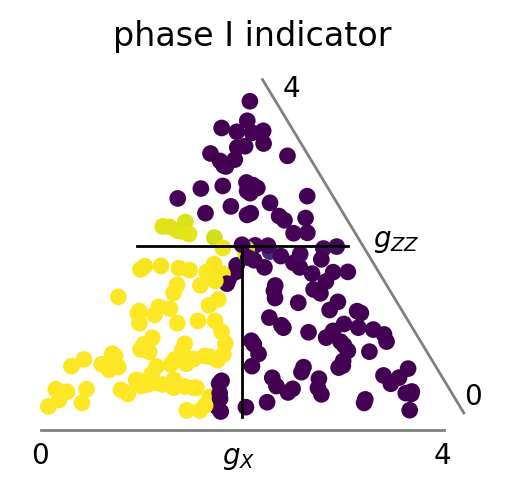

In [35]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phase I indicator",show=False)
plt.savefig("clusterIsingSpreadOutPhaseI.pdf")

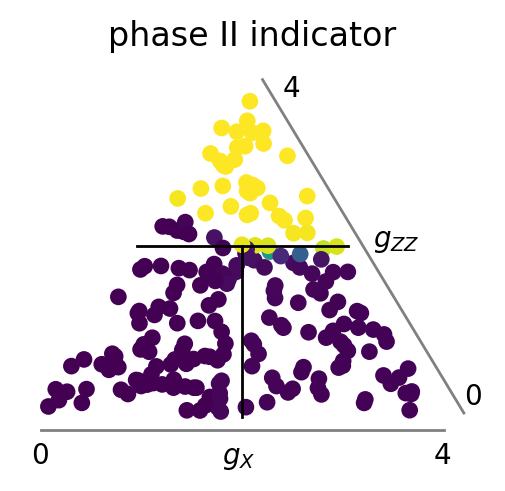

In [36]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,1],"phase II indicator",show=False)
plt.savefig("clusterIsingSpreadOutPhaseII.pdf")

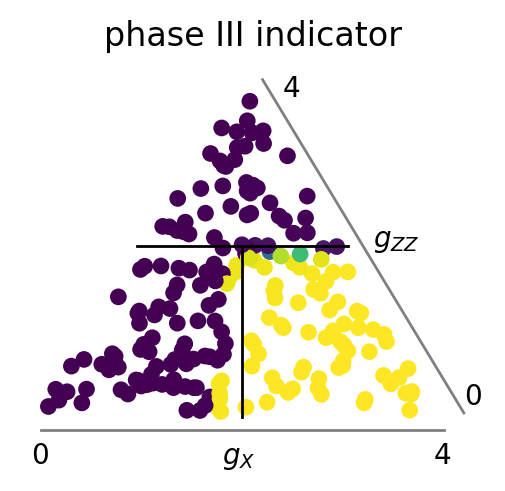

In [37]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,2],"phase III indicator",show=False)
plt.savefig("clusterIsingSpreadOutPhaseIII.pdf")

maximum sys-sens coupling: 1.5633419
maximum sens coupling: 0.29024383


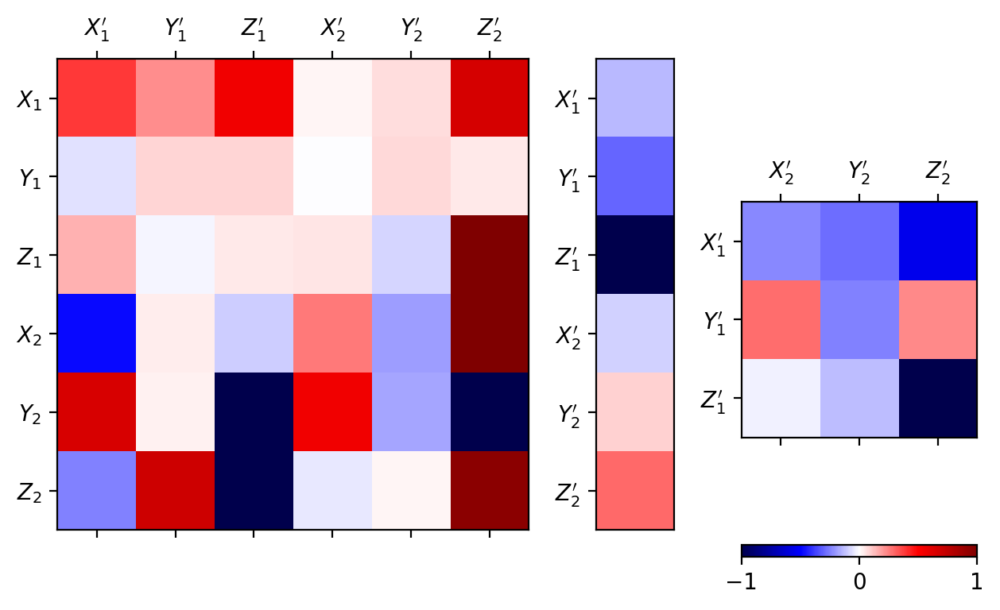

In [31]:
syse=phase_sensor['sys_sens_couplings']
se=phase_sensor['sens_couplings']

print("maximum sys-sens coupling:",np.amax(syse))
print("maximum sens coupling:",np.amax(se))
threshold=0.0

visualize_cluster_Ising_phase_sensor_couplings(syse*(np.abs(syse)>threshold),
                                               se*(np.abs(se)>threshold),
                                               titles=False, show=False,
                                               savefig="clusterIsingPatchesCouplings.pdf"
                                          )

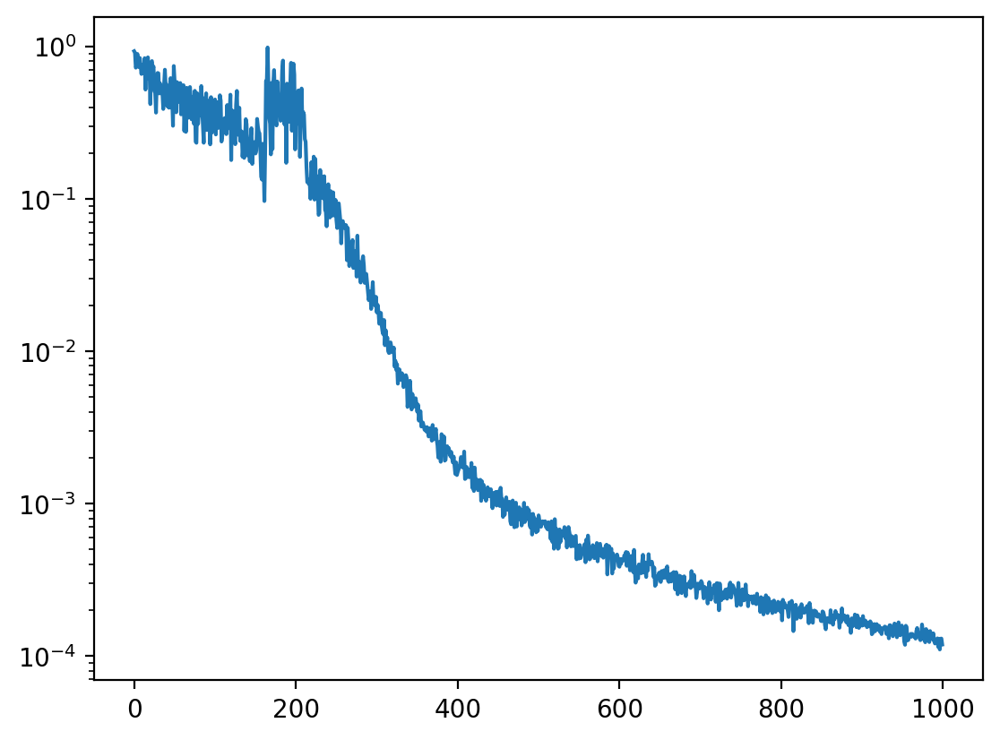

In [45]:
plt.semilogy(training_history['cost'])
plt.savefig("clusterIsingCost.pdf")

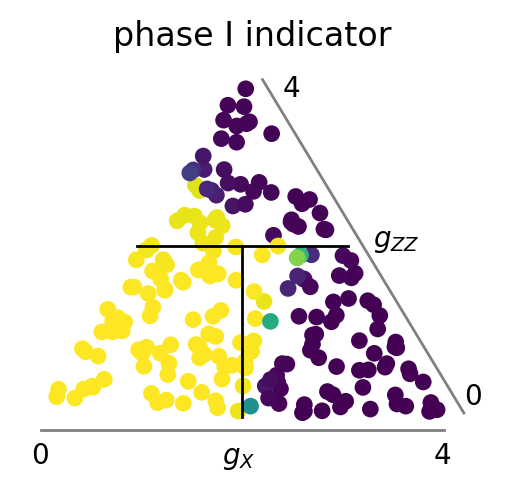

In [55]:
# try out a phase sensor where only the largest
# values of the couplings are kept:

syse=phase_sensor['sys_sens_couplings']
se=phase_sensor['sens_couplings']

import copy
new_phase_sensor=copy.deepcopy(phase_sensor)

new_phase_sensor['sys_sens_couplings']=syse*(np.abs(syse)>0.3)
new_phase_sensor['sens_couplings']=se*(np.abs(se)>0.3)

# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(new_phase_sensor,x_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phase I indicator")

In [29]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


In [30]:
batch_size=10
num_batches=1000

def shifted_corners_sampler_large(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler_large,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],training_history['cost'])

100%|██████████████████████████████████████████████████████████| 1000/1000 [33:34<00:00,  2.01s/it]


(array([ 0.30204135, -0.00705934, -2.7313342 , -0.24029265,  0.10442496,
         0.43262193, -1.0898517 , -0.55903405,  0.30889124, -0.17424406,
         0.63128483, -0.45644915,  0.43299812, -0.22780356,  0.04489357],
       dtype=float32),
 array([-0.27758807, -0.66961247,  3.2252092 ,  0.6726608 , -0.19944544,
         0.3505821 ,  0.14776501, -1.217925  , -1.4422277 , -0.10972105,
        -0.24794842,  0.1358609 , -1.2594452 ,  0.24495083, -0.9644467 ,
         0.52703327,  0.60411936, -0.1312596 ,  0.345218  , -0.71885496,
         1.6350944 , -0.10601825, -0.43989116,  0.03030147, -0.5990596 ,
        -1.1676743 ,  0.22815603,  0.6308367 , -0.11427439, -0.86973506,
        -1.2174135 , -0.21157913,  0.7814965 ,  0.46439475, -0.00987792,
         1.479254  ], dtype=float32),
 [0.6693037495096146,
  0.6808325955454221,
  0.6061275905382156,
  0.6190244735062577,
  0.5865855570991233,
  0.5958580328500729,
  0.6178875548866977,
  0.5589094677644141,
  0.5967465512000314,
  0.554698

maximum sys-sens coupling: 3.2252092
maximum sens coupling: 0.63128483


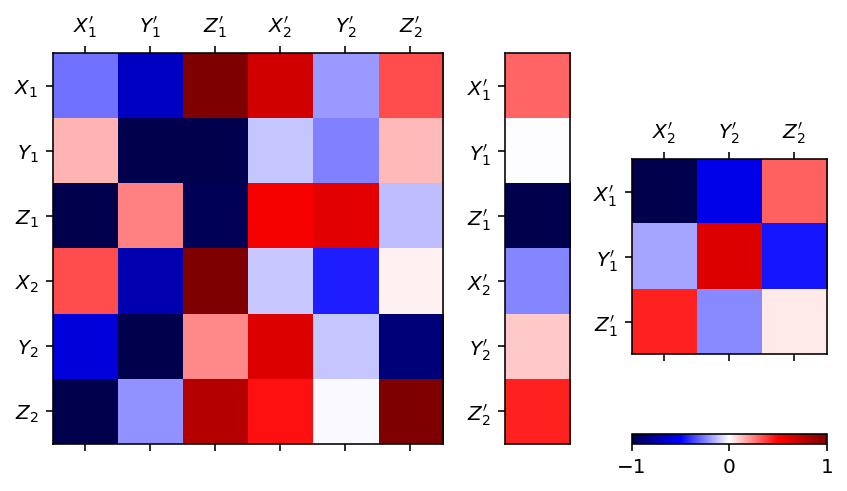

In [31]:
syse=phase_sensor['sys_sens_couplings']
se=phase_sensor['sens_couplings']

print("maximum sys-sens coupling:",np.amax(syse))
print("maximum sens coupling:",np.amax(se))
threshold=0.0

visualize_cluster_Ising_phase_sensor_couplings(syse*(np.abs(syse)>threshold),
                                               se*(np.abs(se)>threshold),
                                               titles=False, show=False,
                                               savefig="clusterIsingPatchesCouplings.pdf"
                                          )

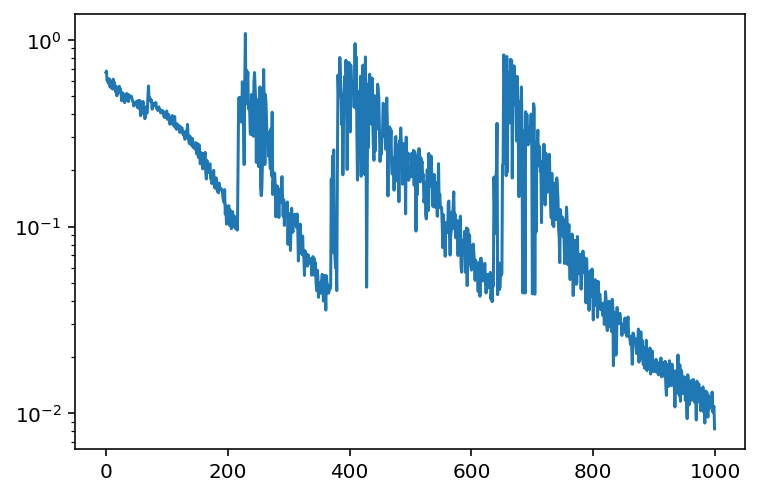

In [32]:
plt.semilogy(training_history['cost'])
plt.savefig("clusterIsingCost.pdf")

In [35]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)


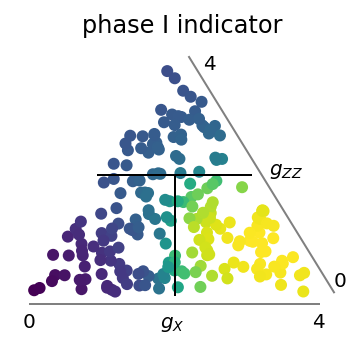

In [36]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,0],"phase I indicator",show=False)
plt.savefig("/tmp/clusterIsingSpreadOutPhaseI_second_run.pdf")

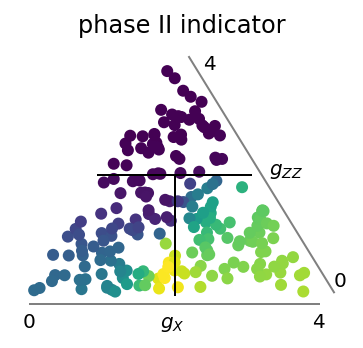

In [37]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,1],"phase II indicator",show=False)
plt.savefig("/tmp/clusterIsingSpreadOutPhaseII_second_run.pdf")

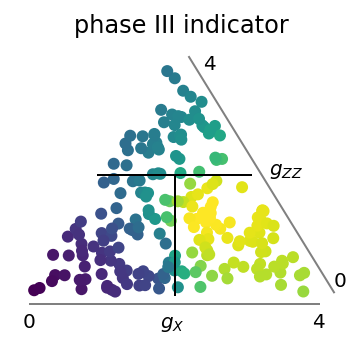

In [39]:
plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,2],"phase III indicator",show=False)
plt.savefig("/tmp/clusterIsingSpreadOutPhaseIII_second_run.pdf")

##### And a third time for the patches

In [40]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


In [41]:
batch_size=10
num_batches=1000

def shifted_corners_sampler_large(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler_large,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],np.array(training_history['cost']))

100%|██████████████████████████████████████████████████████████| 1000/1000 [33:39<00:00,  2.02s/it]


(array([-0.40548384,  0.3426585 , -1.7186044 , -0.1686486 ,  0.04245703,
         0.5432622 ,  0.3451963 , -0.9015996 ,  0.45760193,  0.63535225,
         0.00962772,  0.5077719 ,  0.18358745, -0.00313485, -0.16470346],
       dtype=float32),
 array([ 1.0493367 ,  0.28188792,  2.7119334 ,  0.06226122, -0.07940882,
         0.15665188, -0.31235695,  0.09365968, -1.2561578 , -0.22036065,
         0.0225998 ,  1.0400767 , -0.23719029, -0.09214073, -1.5735347 ,
        -0.06177076,  0.09745517, -1.4756271 ,  0.39419016, -0.02919098,
        -0.6632391 ,  0.5276977 , -0.43322915,  0.40650517, -0.07851831,
        -0.22055565,  0.30467153,  0.04341033,  0.06979476,  0.01977097,
        -0.05027029,  0.07851636,  2.4610853 , -0.02490505, -0.11858412,
         0.8357634 ], dtype=float32),
 array([6.54046966e-01, 6.40462988e-01, 6.35205152e-01, 6.38067614e-01,
        6.20610836e-01, 6.20536162e-01, 6.11055887e-01, 6.01105480e-01,
        5.98572715e-01, 5.93827669e-01, 5.62890973e-01, 5.799104

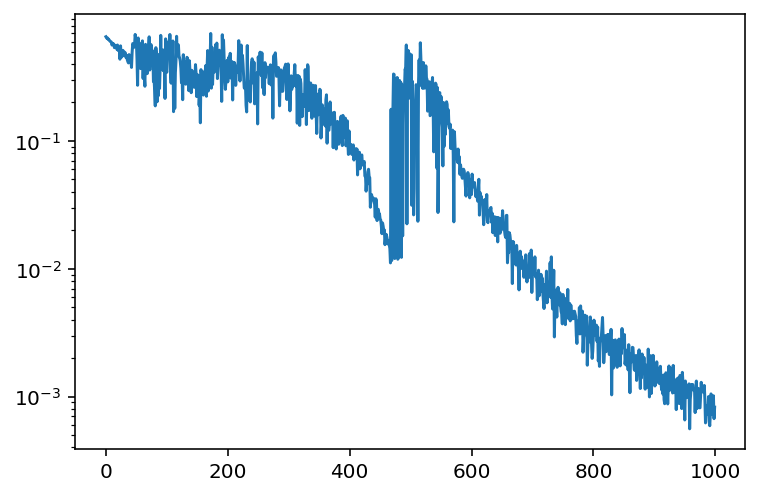

In [42]:
plt.semilogy(training_history['cost'])
plt.savefig("clusterIsingCost.pdf")

In [43]:
# now test and plot results in phase diagram
x_samples,y_samples=sample_batch_cluster_Ising_phase_sensor(200)

y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_samples)


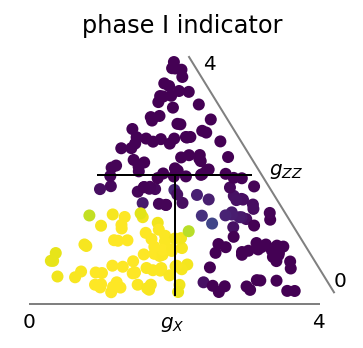

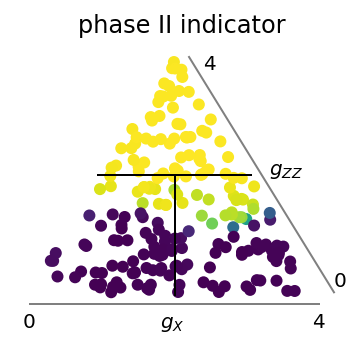

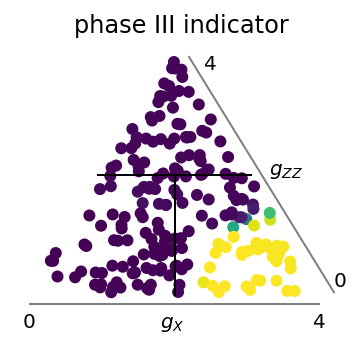

In [44]:
for j,name in [[0,"I"],[1,"II"],[2,"III"]]:
    plot_cluster_Ising_results_inside_phase_triangle(x_samples,y_pred[:,j],"phase "+name+" indicator",show=False)
plt.savefig("/tmp/clusterIsingSpreadOutPhase"+name+"I_third_run.pdf")

##### Now include test accuracy!

In [95]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))


In [96]:
n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)


In [97]:
batch_size=10
num_batches=1000

def shifted_corners_sampler_large(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler_large,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=2,test_samples=(x_test_samples,y_test_samples))

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

100%|████████████████████████████████████████████████████████| 1000/1000 [1:48:50<00:00,  6.53s/it]


(array([ 2.0590532e+00,  4.8984849e-01, -1.5248139e-03, -4.7845349e-01,
        -1.2263097e+00, -2.0528264e-01, -1.1642582e+00,  6.3207179e-01,
         1.3333737e+00, -2.2618709e+00, -1.0941418e+00, -3.5304224e-01,
        -2.0985933e-02,  7.2241265e-01, -1.4333481e+00], dtype=float32),
 array([-1.0919056 , -0.05390764,  0.04301971, -1.0101807 ,  0.9089654 ,
         0.26944354, -2.087087  , -1.9948902 , -0.9892164 ,  0.81521827,
         0.3305498 , -1.0344435 ,  1.0333788 , -0.269095  , -1.3857524 ,
         0.25553185,  1.5000384 , -1.0316279 ,  1.3880723 ,  1.6253285 ,
        -0.61418724,  0.3983395 , -0.22388265,  0.74452895, -0.76242566,
        -1.2571664 , -1.5935974 , -0.9865423 , -0.9636978 , -0.768702  ,
        -1.3268603 ,  0.5212588 ,  1.2224026 , -0.7496698 , -0.602838  ,
         0.92630893], dtype=float32),
 array([0.9150903 , 0.89216965, 0.87193555, 0.85423536, 0.8387096 ,
        0.82567422, 0.81400973, 0.8035034 , 0.79401366, 0.78527547,
        0.77705599, 0.7693

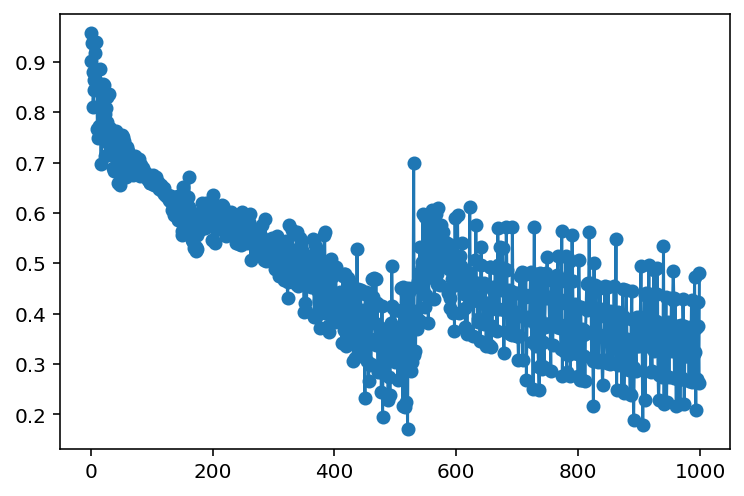

In [102]:
plt.plot(training_history['training_cost'],'-o')

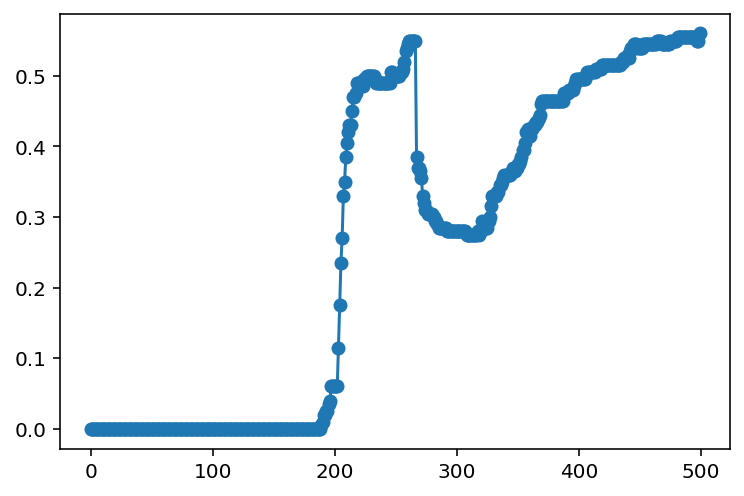

In [98]:
plt.plot(training_history['accuracy'],'-o')

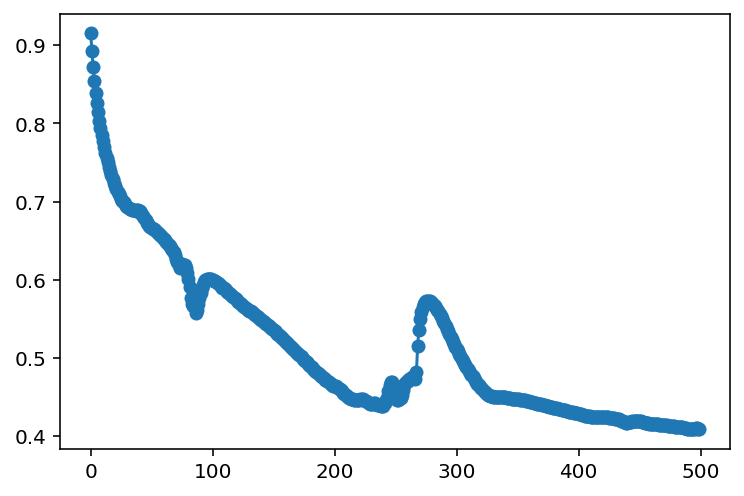

In [99]:
plt.plot(training_history['cost'],'-o')

In [100]:
y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_test_samples)


##### Second run with test accuracy...

In [104]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))

n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

batch_size=10
num_batches=1000

def shifted_corners_sampler_large(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler_large,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples))

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

100%|██████████████████████████████████████████████████████████| 1000/1000 [48:17<00:00,  2.90s/it]


(array([-0.34180686,  0.24026905, -1.3532134 ,  0.3857693 ,  0.30836302,
         0.3560567 , -0.37329552, -1.5594435 ,  0.7996385 ,  1.1029323 ,
         0.6921918 ,  1.7243484 ,  1.1960912 , -1.354991  , -1.2556673 ],
       dtype=float32),
 array([ 0.33502316,  0.346673  ,  0.92620736, -0.26732597, -0.05829778,
         1.4290587 ,  0.68852675, -0.7922074 ,  0.56362975, -0.08311028,
        -0.36235836,  0.47773483,  0.16089341,  0.65918684,  0.48367187,
        -0.5495072 , -0.01992987,  2.882362  ,  0.79393584,  0.39860797,
         1.7532393 ,  0.25096995, -0.0083574 , -1.177665  , -0.5613449 ,
         0.27722955,  2.9604177 ,  0.01063239, -0.83427405, -0.51720494,
         0.04605938,  0.8059096 , -2.4368448 , -0.26606438,  0.5841741 ,
        -1.2884563 ], dtype=float32),
 array([0.70709476, 0.61247852, 0.56405817, 0.53838594, 0.51345667,
        0.50905716, 0.49539794, 0.47524479, 0.45608366, 0.43019541,
        0.37929146, 0.35177518, 0.33451   , 0.29437633, 0.27238102,
    

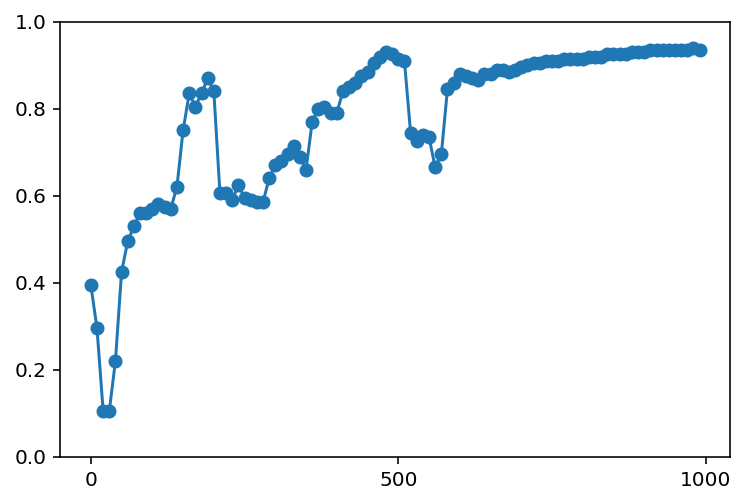

In [137]:
plt.plot(training_history['accuracy'],'-o')
plt.xticks([0,50,100],["0","500","1000"])
plt.ylim(0,1.)
plt.savefig("/tmp/cluster_Ising_fifth_run_accuracy.pdf")
plt.show()

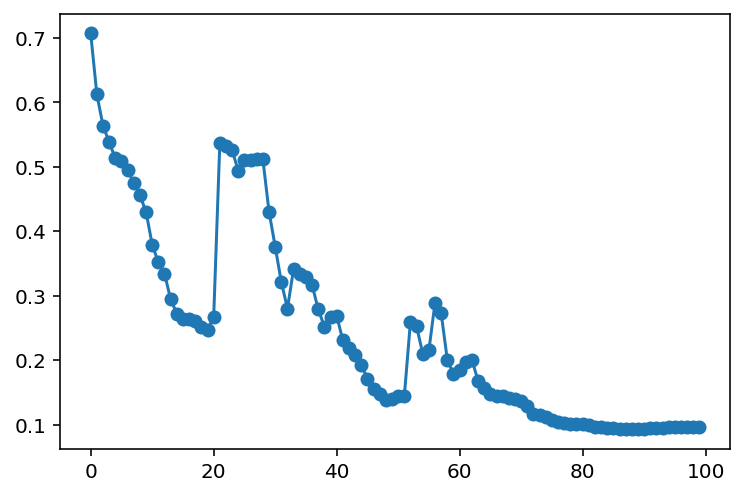

In [106]:
plt.plot(training_history['cost'],'-o')

In [107]:
y_pred=evaluate_phase_sensor_on_batch(phase_sensor,x_test_samples)


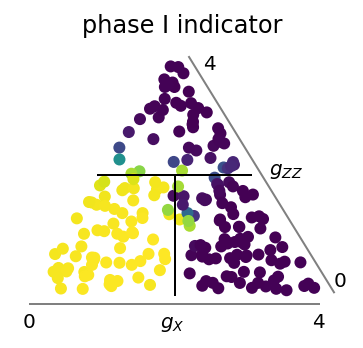

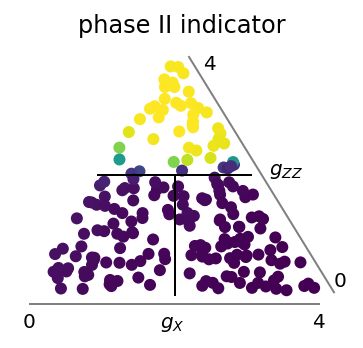

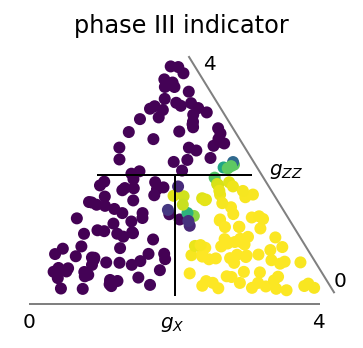

In [113]:
for j,name in [[0,"I"],[1,"II"],[2,"III"]]:
    plot_cluster_Ising_results_inside_phase_triangle(x_test_samples,y_pred[:,j],"phase "+name+" indicator",show=False)
plt.savefig("/tmp/clusterIsingSpreadOutPhase"+name+"I_fifth_run.pdf")

##### Evaluating on a grid in the phase diagram

In [62]:
def get_cluster_Ising_grid_samples(M):
    # sweep through the phase diagram:
    pars=[]
    for jX,gX in enumerate(np.linspace(0,4,M)):
        for jZXZ,gZXZ in enumerate(np.linspace(0,4,M)):
            gZZ=4-gX-gZXZ
            if gZZ>=-1e-5: # only keep positive values of gZZ (following the original papers)
                parameters=(gZXZ,gZZ,gX)
                pars.append(parameters)
    return np.array(pars)

In [127]:
x_grid_samples=get_cluster_Ising_grid_samples(20)

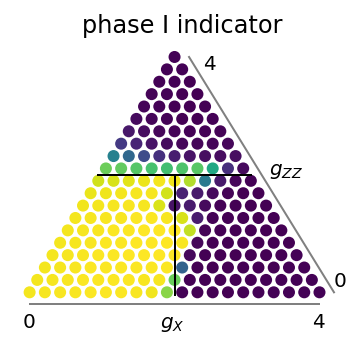

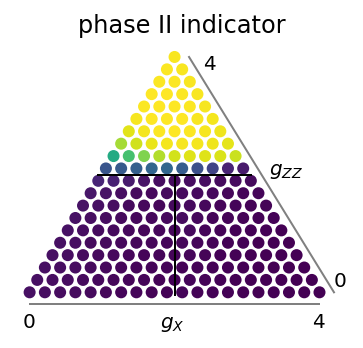

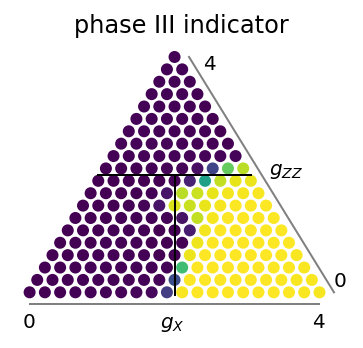

In [129]:
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

for j,name in [[0,"I"],[1,"II"],[2,"III"]]:
    plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,
                                        y_pred_grid[:,j],
                                "phase "+name+" indicator",show=False)
plt.savefig("/tmp/clusterIsingSpreadOutPhase"+name+"_grid_fifth_run.pdf")

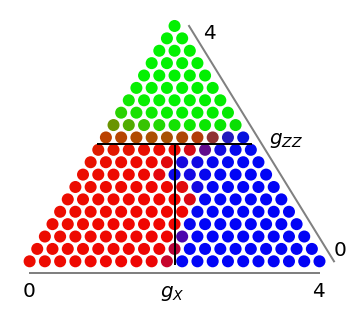

In [133]:
rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
plt.savefig("/tmp/results_grid_fifth_run.pdf")

maximum sys-sens coupling: 2.9604177
maximum sens coupling: 1.7243484


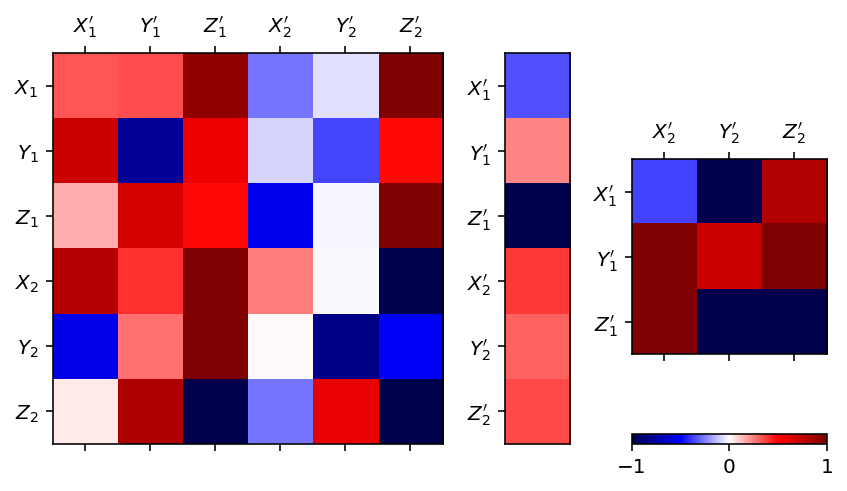

In [143]:
syse=phase_sensor['sys_sens_couplings']
se=phase_sensor['sens_couplings']

print("maximum sys-sens coupling:",np.amax(syse))
print("maximum sens coupling:",np.amax(se))
threshold=0.0

visualize_cluster_Ising_phase_sensor_couplings(syse*(np.abs(syse)>threshold),
                                               se*(np.abs(se)>threshold),
                                               titles=False, show=False,
                                               savefig="/tmp/clusterIsing_fifthrun_PatchesCouplings.pdf"
                                          )

##### Now again run with training everywhere!

In [144]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))

n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples))

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

100%|██████████████████████████████████████████████████████████| 1000/1000 [39:17<00:00,  2.36s/it]


(array([ 0.33213207, -0.09749582, -1.3665477 ,  0.13175853,  0.03630584,
         0.1761554 ,  0.82572985, -0.03782199, -0.46368447, -0.2756448 ,
         0.28879827,  0.03977543,  0.26853293, -0.26683536, -0.03837926],
       dtype=float32),
 array([ 6.6955291e-02,  2.1796365e-01,  1.1336423e+00,  3.7802842e-01,
         1.6274171e-01,  8.0263719e-02,  1.0051696e+00,  2.9012552e-01,
        -1.0081894e+00,  1.6642065e-01, -5.8754134e-01,  6.9686425e-01,
        -4.4449732e-01, -2.1272288e-01,  1.1166244e+00, -1.1364481e-01,
        -8.1249535e-02,  1.7696855e+00, -5.8568752e-01, -6.3684650e-02,
         1.1067156e+00, -7.9646538e-04, -1.0730006e+00,  8.3542429e-02,
        -5.2228607e-02, -2.1448655e-01,  8.7731451e-01,  1.4843483e+00,
        -2.0647371e-01,  3.3766988e-01,  9.0473431e-01, -1.1460653e-01,
        -1.2380054e+00,  4.3772042e-01,  2.1757010e-01, -1.7347051e+00],
       dtype=float32),
 array([0.68412301, 0.61081622, 0.53423895, 0.50554254, 0.48155162,
        0.4538087

In [146]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)


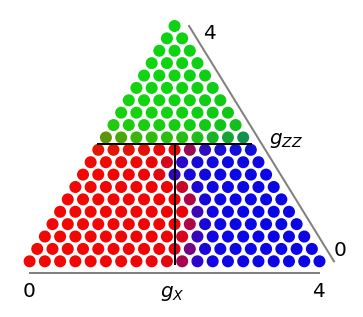

In [154]:
rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
plt.savefig("/tmp/results_clusterIsing_trainEverywhere_grid_.pdf")

In [152]:
train_patches_accuracy = np.array([0.395, 0.295, 0.105, 0.105, 0.22 , 0.425, 0.495, 0.53 , 0.56 ,
        0.56 , 0.57 , 0.58 , 0.575, 0.57 , 0.62 , 0.75 , 0.835, 0.805,
        0.835, 0.87 , 0.84 , 0.605, 0.605, 0.59 , 0.625, 0.595, 0.59 ,
        0.585, 0.585, 0.64 , 0.67 , 0.68 , 0.695, 0.715, 0.69 , 0.66 ,
        0.77 , 0.8  , 0.805, 0.79 , 0.79 , 0.84 , 0.85 , 0.86 , 0.875,
        0.885, 0.905, 0.92 , 0.93 , 0.925, 0.915, 0.91 , 0.745, 0.725,
        0.74 , 0.735, 0.665, 0.695, 0.845, 0.86 , 0.88 , 0.875, 0.87 ,
        0.865, 0.88 , 0.88 , 0.89 , 0.89 , 0.885, 0.89 , 0.895, 0.9  ,
        0.905, 0.905, 0.91 , 0.91 , 0.91 , 0.915, 0.915, 0.915, 0.915,
        0.92 , 0.92 , 0.92 , 0.925, 0.925, 0.925, 0.925, 0.93 , 0.93 ,
        0.93 , 0.935, 0.935, 0.935, 0.935, 0.935, 0.935, 0.935, 0.94 ,
        0.935])

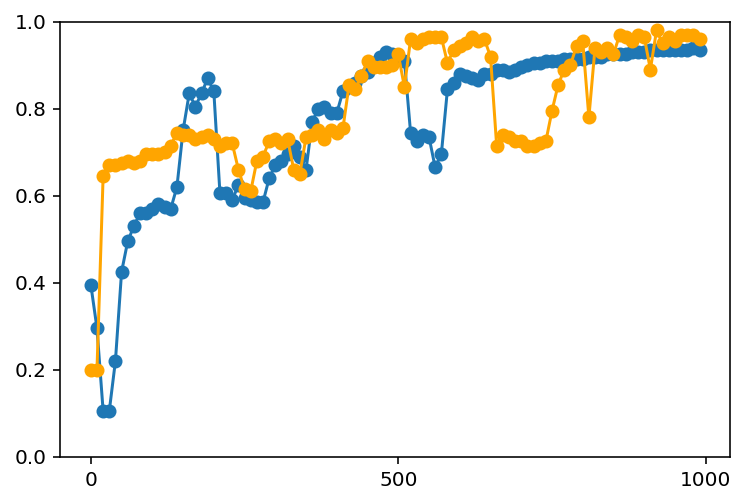

In [153]:
plt.plot(train_patches_accuracy,'-o')
plt.plot(training_history['accuracy'],'-o', color="orange")
plt.xticks([0,50,100],["0","500","1000"])
plt.ylim(0,1.)
plt.savefig("/tmp/cluster_Ising_trainEverywhere_accuracy.pdf")
plt.show()

##### Some timing experiments: 30 msec for ground state, 240 msec for gradient

In [155]:
theta=np.concatenate((phase_sensor['sys_sens_couplings'],
                    phase_sensor['sens_couplings']))

In [160]:
%%timeit
H,E,psi,y_pred = evaluate_phase_sensor(phase_sensor,np.random.randn(3),theta)


30.1 ms ± 3.98 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [166]:
H,E,psi,y_pred = evaluate_phase_sensor(phase_sensor,np.random.randn(3),theta)


In [163]:
output_terms=phase_sensor['output_terms']
H_theta_terms=phase_sensor['H_theta_terms']
SMALL_NUMBER=1e-8

In [167]:
%%timeit
error_signal=grad_cost_function_mse(y_pred,np.random.randn(3))
theta_gradient=get_gradient_at_x(H,E,psi,error_signal,output_terms,
                H_theta_terms,SMALL_NUMBER)

241 ms ± 32 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [178]:
%%timeit
sp.sparse.linalg.spsolve( H , psi)

283 ms ± 41.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [183]:
%%timeit
H_full = H.todense()

507 µs ± 8.44 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [176]:
psi_full = np.array(psi)

In [179]:
%%timeit
np.linalg.solve( H_full , psi)

70.1 ms ± 4.54 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [181]:
%%timeit 
np.linalg.eigh( H_full )

1.16 s ± 197 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


##### New training: with finite nudging - training everywhere (works really well!)

In [189]:
import optax

learning_rate=0.01

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))

n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples),
                                                nonsparse=False)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

100%|██████████████████████████████████████████████████████████| 1000/1000 [57:53<00:00,  3.47s/it]


(array([ 0.4039548 ,  0.11191425, -0.922842  , -0.3086301 ,  0.6481128 ,
         0.22957842,  0.5727833 , -0.3966106 ,  1.8308562 ,  1.6183784 ,
        -1.2818185 ,  0.43271232, -0.7525067 , -0.6454635 , -1.0595936 ],
       dtype=float32),
 array([-1.5015048 ,  0.6312425 ,  0.6513274 , -0.23454224, -0.24192075,
        -0.14129478, -0.79225874,  0.5792829 , -1.9308604 , -0.27425498,
        -1.3605722 , -1.115356  ,  0.7326464 ,  1.6232567 ,  0.10666678,
         1.3067994 , -0.5555507 , -2.4950209 ,  0.8998432 ,  0.12163281,
         0.7308256 ,  0.64399195,  0.25737944,  0.5570274 ,  0.2572059 ,
        -0.06732537,  0.51095104, -0.6026221 , -0.3641204 ,  0.35859907,
         0.53367865,  0.43301606,  0.5309498 ,  0.73155755, -0.9263789 ,
         1.0169276 ], dtype=float32),
 array([0.75125607, 0.68845719, 0.61628049, 0.54665813, 0.4949027 ,
        0.45910787, 0.42708937, 0.38953542, 0.49441358, 0.48382155,
        0.46762876, 0.45721209, 0.3494843 , 0.34202739, 0.3349085 ,
    

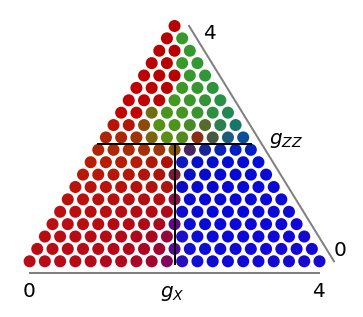

In [190]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
plt.savefig("/tmp/results_clusterIsing_trainEverywhere_grid_secondRun.pdf")

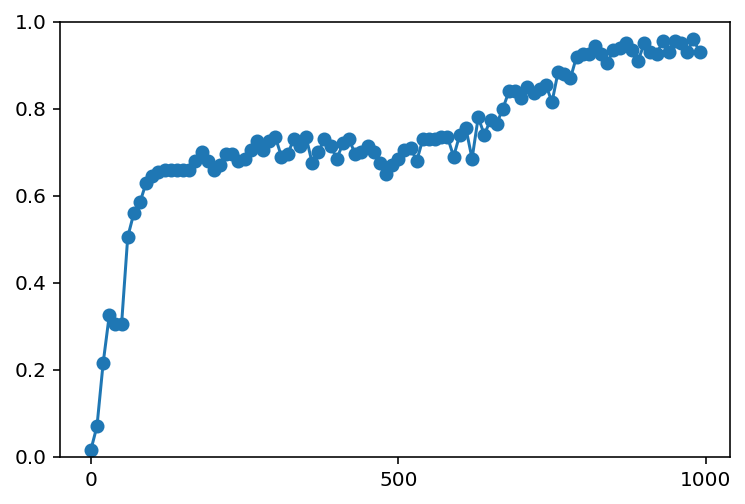

In [191]:
plt.plot(training_history['accuracy'],'-o')
plt.xticks([0,50,100],["0","500","1000"])
plt.ylim(0,1.)
plt.savefig("/tmp/cluster_Ising_trainEverywhere_secondrun_accuracy.pdf")
plt.show()

##### Training with real nudging!

In [202]:
import optax

learning_rate=0.01
finite_nudging=0.1

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))

n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples),
                                                nonsparse=False,
                                                finite_nudging=finite_nudging)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

100%|██████████████████████████████████████████████████████████| 1000/1000 [19:47<00:00,  1.19s/it]


(array([-0.72409815,  0.13361044, -1.2278023 , -0.23840915, -0.34486133,
         0.9616242 , -0.36160976,  0.22029133, -0.4727352 , -0.17914465,
        -0.5347069 ,  0.34962335,  0.5396543 ,  0.07494976, -1.4591793 ],
       dtype=float32),
 array([ 0.35675517,  0.04082463,  1.5253701 , -0.00945119, -0.01447352,
         0.63034874,  0.45206785,  0.5270429 ,  0.5116578 , -0.20654808,
        -0.12500209, -0.8324649 ,  0.64224327, -0.01931623,  0.71782416,
        -0.02047032,  0.5561105 ,  0.2355093 , -0.87676615, -0.68635577,
        -0.8949578 ,  0.20799667,  0.586686  , -0.23261307, -1.0705415 ,
        -0.5875825 , -0.68197066, -0.02554226, -0.18870065, -2.0603201 ,
        -0.2983112 , -0.21890749,  0.7560498 ,  0.4405442 , -0.5765182 ,
        -1.8238018 ], dtype=float32),
 array([0.84482115, 0.77102884, 0.71303158, 0.66789212, 0.6195318 ,
        0.57788894, 0.51928517, 0.47826171, 0.41942909, 0.38177175,
        0.34869826, 0.31781383, 0.28873724, 0.25833201, 0.23755289,
    

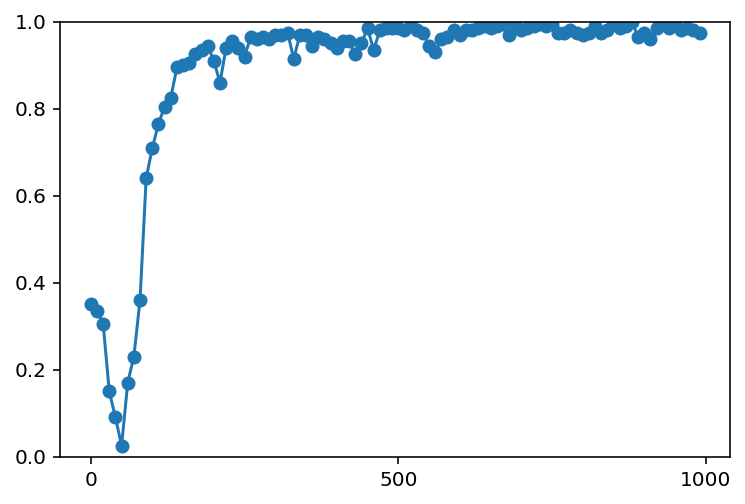

In [204]:
plt.plot(training_history['accuracy'],'-o')
plt.xticks([0,50,100],["0","500","1000"])
plt.ylim(0,1.)
plt.savefig("/tmp/cluster_Ising_trainEverywhere_finite_nudging_accuracy.pdf")
plt.show()

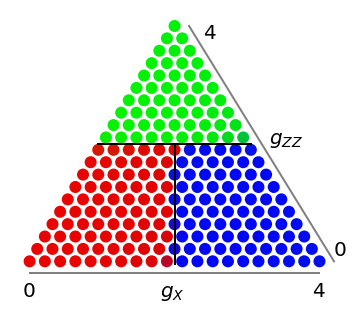

In [205]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
plt.savefig("/tmp/results_clusterIsing_trainEverywhere_grid_finite_nudging.pdf")

##### Train on patches, with nudging

In [207]:
import optax

learning_rate=0.01
finite_nudging=0.1

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate))

n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

batch_size=10
num_batches=1000

def shifted_corners_sampler_large(batch_size):
  return sample_batch_cluster_Ising_phase_sensor_around_corners(batch_size,
                      sampling_locations=np.array([[1.0,.5,0.4],
                        [2.5,.5,0.4], [.5,3.0,0.4]]))

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            shifted_corners_sampler_large,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples),
                                                nonsparse=False,
                                                finite_nudging=finite_nudging)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

100%|██████████████████████████████████████████████████████████| 1000/1000 [24:00<00:00,  1.44s/it]


(array([ 0.22535612,  0.19549091, -1.6913873 ,  0.27440652, -0.07679006,
         0.69995385,  0.25492024, -0.4263214 ,  0.99005866,  0.66690254,
         0.11670199, -0.04823729, -0.2572618 , -0.4697633 , -1.6395789 ],
       dtype=float32),
 array([-0.8468584 , -0.05127075,  0.08279916, -0.1653462 ,  0.9208121 ,
         0.17810707,  0.744649  , -0.8449823 , -0.21264264,  1.1479161 ,
         0.19788675,  2.7922964 ,  0.16801119, -0.7440857 , -1.9305041 ,
        -0.7998468 ,  0.02219222,  1.3238096 , -0.28677544, -0.768121  ,
         1.9807066 , -1.3570749 ,  0.6749619 ,  0.5514168 , -0.55820376,
        -0.23234457, -3.1197782 ,  0.18593894,  0.655122  , -2.335557  ,
        -0.21549717,  1.0275118 , -0.40363616,  0.64668846,  0.8429062 ,
         1.9653995 ], dtype=float32),
 array([0.86407442, 0.78119436, 0.70562063, 0.64427988, 0.59137743,
        0.54528076, 0.50724207, 0.4666359 , 0.44465071, 0.44033385,
        0.44637203, 0.44429051, 0.43231277, 0.4206899 , 0.40897493,
    

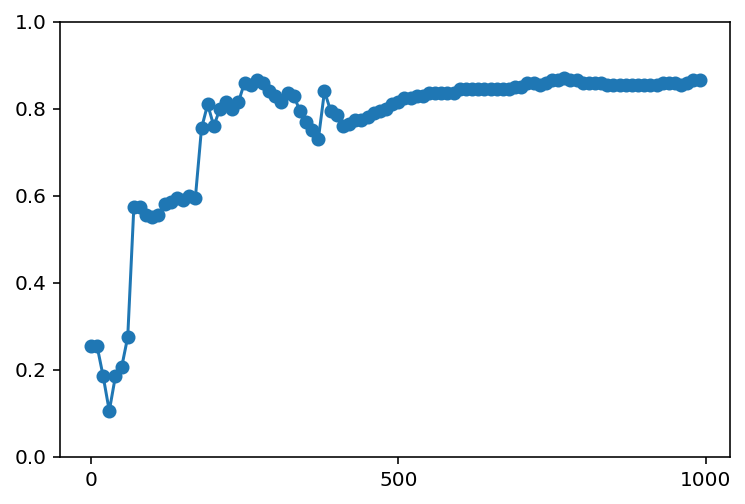

In [208]:
plt.plot(training_history['accuracy'],'-o')
plt.xticks([0,50,100],["0","500","1000"])
plt.ylim(0,1.)
plt.savefig("/tmp/cluster_Ising_trainPatches_finite_nudging_accuracy.pdf")
plt.show()

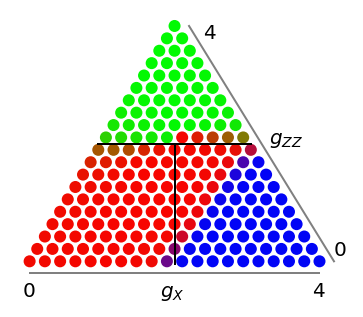

In [209]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

##### Learn with shot noise, for training everywhere and sgd

In [19]:
def try_phase_sensor_training(learning_rate=0.01,finite_nudging=0.1,
                    M_msmt_samples=None,N_sys=8,N_sens=2,
                    n_test_samples=200,batch_size=10,num_batches=1000,
                    test_step=10,optimizer=optax.adam,**kwargs):
# check_nudging_accuracy=False,
#                             symmetric_nudging=False,record_error_signal=False,
#                             check_shot

    # set up phase sensor (Hamiltonian terms etc)    
    phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
    phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optimizer(learning_rate))

    
    x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

    phase_sensor,training_history=train_phase_sensor(phase_sensor,
                                sample_batch_cluster_Ising_phase_sensor,
                                cost_function_mse,grad_cost_function_mse,
                                    learning_rate,batch_size,num_batches,
                                test_step=test_step,test_samples=(x_test_samples,y_test_samples),
                                nonsparse=False,
                                finite_nudging=finite_nudging,
                                shot_noise=M_msmt_samples,
                                **kwargs)

    # output to preserve it for later:
    return (phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
         np.array(training_history['cost']), np.array(training_history['accuracy']),
         np.array(training_history['training_cost'])) , phase_sensor, training_history

In [242]:
import optax

learning_rate=0.01
finite_nudging=0.1

M_msmt_samples=10 # number of msmt shots to get expectation values

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)
phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.sgd(learning_rate))

n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)

batch_size=10
num_batches=1000

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples),
                                                nonsparse=False,
                                                finite_nudging=finite_nudging,
                                                shot_noise=M_msmt_samples)

# output to preserve it for later:
(phase_sensor['sens_couplings'],phase_sensor['sys_sens_couplings'],
     np.array(training_history['cost']), np.array(training_history['accuracy']),
     np.array(training_history['training_cost']))

Acc: 19.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [23:51<00:00,  1.43s/it]


(array([ 0.25647262, -0.40202934, -0.299648  , -1.5183188 ,  0.3082977 ,
        -0.61214995, -1.0412081 ,  0.75802577,  0.568412  , -0.10305685,
        -2.6452665 , -0.77063024, -0.86422986,  1.6054366 , -0.9286334 ],
       dtype=float32),
 array([ 1.8186074 ,  1.1644142 ,  0.15391545,  0.610321  ,  0.03763529,
         0.04622161,  1.7931412 , -2.411504  , -0.82915306, -0.43780017,
         1.0163157 ,  0.178854  ,  0.04464871, -0.6449176 ,  0.0938645 ,
        -0.59345305,  0.7718243 , -0.5345356 , -0.5655349 ,  1.0514165 ,
         0.9109078 , -2.933848  , -1.5088204 ,  1.3839521 ,  0.6825456 ,
        -0.59685165,  2.2949235 ,  0.41055936, -1.3519717 , -0.6587038 ,
         0.58636475, -0.5863355 ,  0.03011641, -0.35426292, -0.3728869 ,
         0.42578   ], dtype=float32),
 array([0.71305096, 0.71415435, 0.7366037 , 0.72731237, 0.73776462,
        0.73231618, 0.70770049, 0.69498568, 0.63653787, 0.61906313,
        0.6324493 , 0.61312188, 0.61015602, 0.60679964, 0.60724403,
    

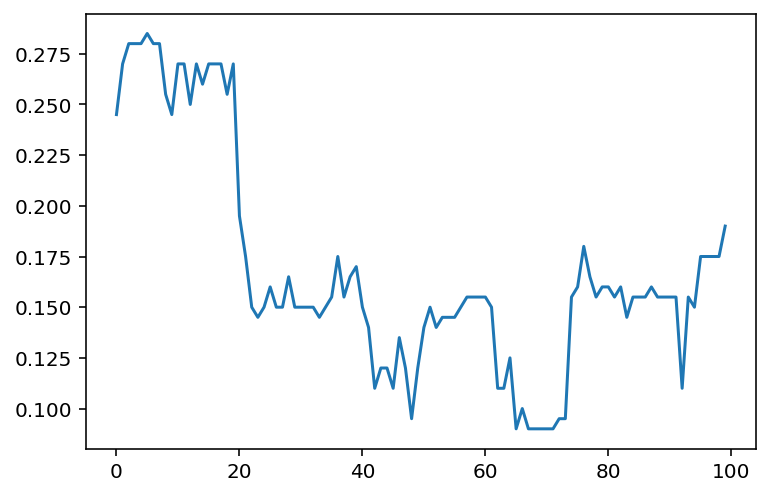

In [245]:
plt.plot(training_history['accuracy'])

In [248]:
# comparison, without shot noise, but still sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50)
summaries # print to keep for later

Acc: 2.5 %: 100%|██████████████████████████████████████████████| 1000/1000 [09:30<00:00,  1.75it/s]


(array([ 1.9740279e+00,  1.6959920e+00, -6.6736108e-01, -4.9851590e-01,
        -8.0608088e-01, -2.1674283e-01,  7.0278418e-01,  5.7295257e-01,
         1.4751086e+00,  1.5241970e+00,  9.0156174e-01, -5.3522074e-01,
        -1.9598678e-01, -2.9925613e-02, -1.7050523e-03], dtype=float32),
 array([ 0.28901318,  0.44522277,  0.17982611, -0.34871083, -1.4510224 ,
        -0.94236404,  0.247755  ,  0.7582969 ,  0.7492048 ,  1.4741641 ,
        -1.6445509 ,  0.7939576 ,  0.06412802, -0.04707668,  0.40817487,
         0.6655999 ,  0.56318444, -2.4100873 , -0.12465764, -0.94674516,
        -0.1406082 , -0.2916924 , -1.1590395 ,  1.2394744 ,  2.37661   ,
         0.9880637 ,  0.5054901 , -1.2474582 ,  1.0433867 , -0.30629238,
        -0.03788029, -0.6135829 , -1.6060783 , -1.7112195 ,  0.9677199 ,
        -0.874718  ], dtype=float32),
 array([0.83099407, 0.8264166 , 0.82140291, 0.8166291 , 0.81224032,
        0.80748463, 0.80286676, 0.79793229, 0.79277174, 0.78817342,
        0.78281606, 0.7777

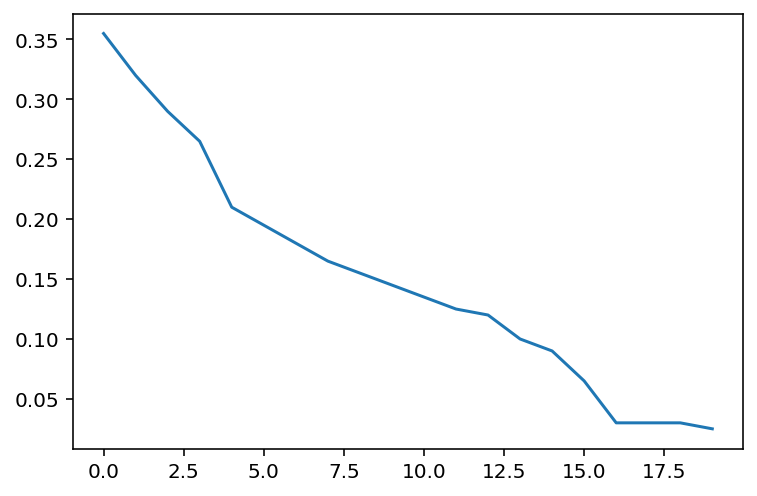

In [249]:
plt.plot(training_history['accuracy'])
plt.show()

In [250]:
# comparison, without shot noise, but now adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50)
summaries # print to keep for later

Acc: 98.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [11:26<00:00,  1.46it/s]


(array([ 0.9312318 ,  0.2737692 , -0.6218706 , -0.21926843,  1.111594  ,
         0.12081275, -0.65998036,  1.6054562 , -0.28243285,  0.1035825 ,
         0.3724191 ,  0.76918745, -1.2165895 ,  0.408031  ,  0.11735328],
       dtype=float32),
 array([ 0.03766216, -0.13637902,  1.304537  ,  1.4985895 , -0.05911604,
         1.4468099 , -0.05663167, -1.2754056 ,  0.74349236, -0.34964308,
        -0.98343694, -1.7063503 , -0.23810232,  0.24582212,  2.0931861 ,
        -0.55600893, -0.7868284 ,  0.11752428, -0.31658185,  0.19549678,
        -1.6274269 , -0.33797967, -1.1022979 , -2.3143795 ,  1.6090964 ,
        -1.0485412 ,  4.343661  ,  0.08834505,  0.48390067,  2.8086665 ,
         0.90537184, -0.42770132,  0.6320486 , -0.46378183,  0.63087696,
        -4.2450995 ], dtype=float32),
 array([0.80647489, 0.62916904, 0.55752256, 0.50764022, 0.45193964,
        0.41069765, 0.39712419, 0.33996563, 0.27151195, 0.19946114,
        0.18299092, 0.13192227, 0.23987169, 0.16951729, 0.10022403,
    

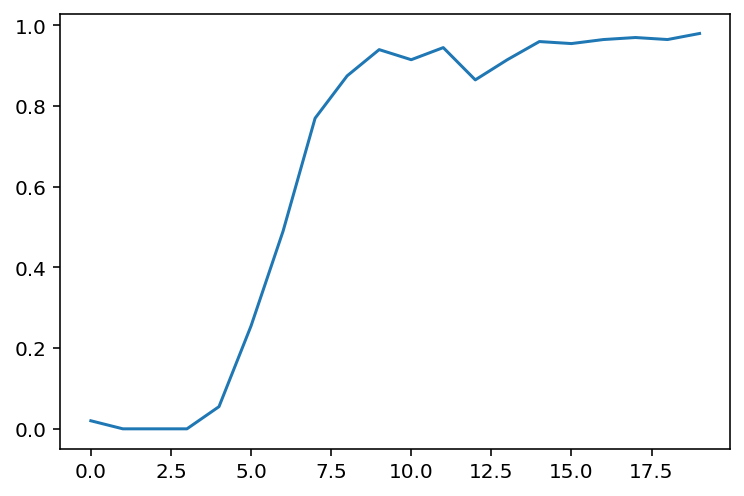

In [251]:
plt.plot(training_history['accuracy'])
plt.show()

In [252]:
# comparison, without shot noise, but again sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50)
summaries # print to keep for later

Acc: 55.00000000000001 %: 100%|████████████████████████████████| 1000/1000 [09:48<00:00,  1.70it/s]


(array([-1.3456312 , -0.3856241 , -0.47534811,  0.17460893,  1.9213822 ,
         0.45248652,  0.03073942, -1.0906978 , -1.5749145 , -0.765525  ,
        -0.4971726 , -2.185177  ,  0.3018891 , -0.09702797, -0.02879407],
       dtype=float32),
 array([ 0.8797673 , -0.46774605, -1.3645885 ,  0.76416546,  1.4875476 ,
        -0.06181939,  1.9244292 , -0.24304959, -0.7944503 ,  0.32210338,
         0.8887251 ,  0.10533735, -2.0320842 ,  0.019673  , -0.26642564,
        -0.27184623,  0.74388814,  0.8882317 , -0.28063288,  0.50573814,
        -1.7674844 , -1.8120646 , -1.349493  , -0.43888235,  1.2587506 ,
        -1.9863243 ,  1.8346814 ,  1.240608  , -0.26380104, -0.17892745,
         1.236302  ,  1.3143414 ,  0.08398302, -0.10686286, -0.50166005,
         1.8200694 ], dtype=float32),
 array([0.92838257, 0.76521983, 0.71238513, 0.69731436, 0.68997096,
        0.6831889 , 0.67365875, 0.66687812, 0.6599555 , 0.65489012,
        0.65185254, 0.64544532, 0.64248249, 0.63911087, 0.6306986 ,
    

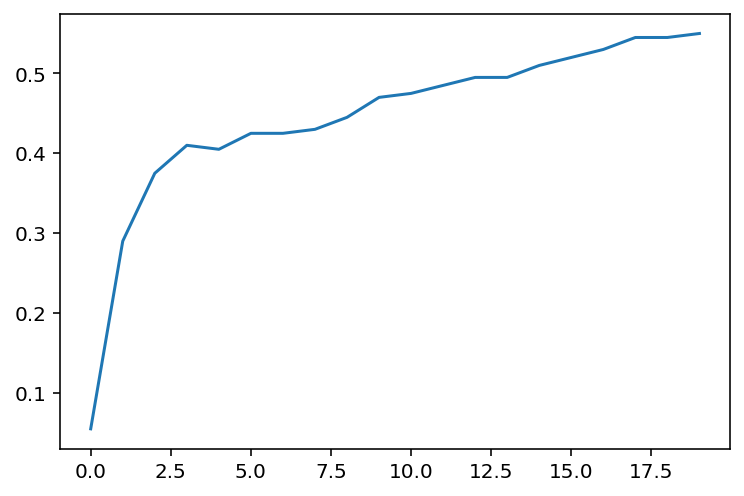

In [253]:
plt.plot(training_history['accuracy'])
plt.show()

In [254]:
# comparison, with shot noise, and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50,
                                                                 M_msmt_samples=10)
summaries # print to keep for later

Acc: 18.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [09:51<00:00,  1.69it/s]


(array([ 1.0357285 , -0.22898139, -0.02213775,  0.22296782,  1.7713326 ,
         0.64859885,  0.03433274, -0.3790438 , -0.6508662 , -1.4457326 ,
         0.1781576 , -0.60437655, -0.13466229,  0.903357  ,  0.13866013],
       dtype=float32),
 array([ 0.47350907, -0.77274096, -1.1805581 , -0.05882305, -0.28503916,
        -1.9157472 , -2.2139313 ,  1.6068999 ,  0.42059568, -0.50742835,
        -0.8777755 , -0.5847777 , -0.3723653 ,  0.5606704 , -0.6094131 ,
         0.51912   , -1.6886413 ,  0.28890675,  2.0410476 ,  1.132758  ,
        -0.2648956 ,  0.68692565,  0.31227767,  1.049994  , -1.6151005 ,
        -0.18888399, -0.42019165,  0.32661593, -0.46370137,  1.5887724 ,
         0.24801952, -1.418664  , -1.2757981 ,  0.24944368,  1.1495028 ,
         0.6573621 ], dtype=float32),
 array([0.68810206, 0.67133779, 0.66368756, 0.65824617, 0.65821636,
        0.65393977, 0.64561686, 0.6457957 , 0.65300197, 0.66294709,
        0.66739772, 0.66753032, 0.66628539, 0.66039712, 0.66317763,
    

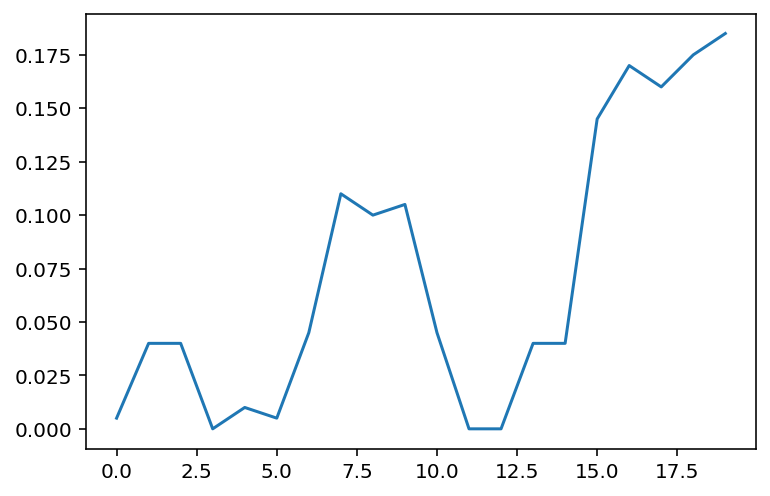

In [255]:
plt.plot(training_history['accuracy'])
plt.show()

In [256]:
# comparison, with shot noise, and sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 M_msmt_samples=10)
summaries # print to keep for later

Acc: 20.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [10:00<00:00,  1.66it/s]


(array([ 2.0773833 ,  0.08021134, -0.65009826,  0.40178162, -0.11560596,
        -0.25816926, -1.6649847 , -0.9459308 ,  0.6456228 , -0.7026555 ,
         0.16172107,  0.13909385,  0.07564375,  0.22286773,  1.1934143 ],
       dtype=float32),
 array([ 1.8188353 , -0.72908044,  0.22528541, -0.77133167, -0.24406476,
         0.62677586,  1.2501513 , -0.73854196, -0.99218386,  1.368813  ,
         1.0866134 ,  1.0942805 ,  0.09586597, -2.5596166 ,  1.4738978 ,
         2.2242985 , -1.0328041 , -1.5390589 , -0.36725432, -0.6710757 ,
         1.4229349 , -0.05271632,  1.0717858 , -0.33169192, -1.2383099 ,
        -0.66265255, -1.5572858 , -1.2485163 ,  0.05957231, -0.91375965,
        -0.8749461 ,  0.5882084 , -0.08012307, -1.3662113 , -0.14647152,
        -0.2556142 ], dtype=float32),
 array([0.95019632, 0.89527268, 0.81660024, 0.75853213, 0.73504419,
        0.69995109, 0.71072857, 0.6973696 , 0.68057055, 0.654091  ,
        0.64204062, 0.63959819, 0.64189574, 0.6440304 , 0.64001888,
    

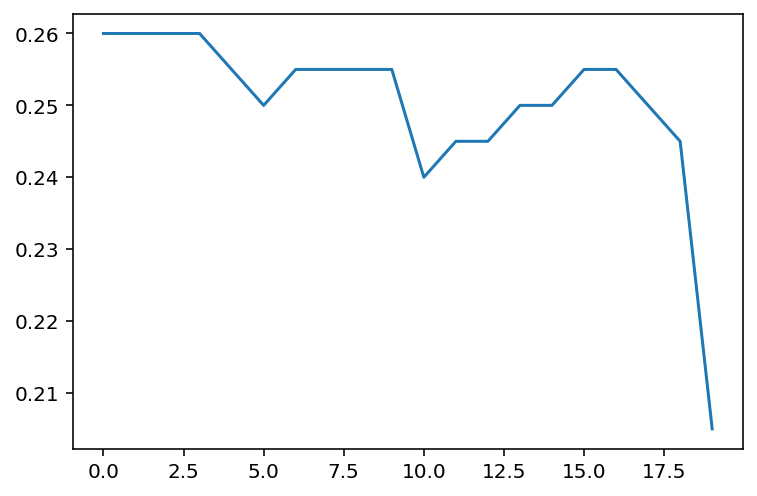

In [257]:
plt.plot(training_history['accuracy'])
plt.show()

In [258]:
# comparison, with shot noise, and sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 M_msmt_samples=10)
summaries # print to keep for later

Acc: 30.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [10:35<00:00,  1.57it/s]


(array([-1.0014524 ,  1.0787047 ,  0.5107937 , -2.1720362 ,  1.1701723 ,
        -0.46703532, -1.2900621 ,  0.08181731, -0.3119497 , -1.3285152 ,
         2.7829595 , -1.36599   , -0.39956298,  4.365244  ,  0.6925048 ],
       dtype=float32),
 array([ 0.42714003,  1.1275665 , -0.26958302,  0.4654821 , -0.9692058 ,
         0.749096  , -1.0843681 , -1.0193877 ,  0.8878412 ,  1.6258588 ,
        -0.14660566,  1.3802681 , -1.2063552 , -2.1123724 ,  0.6428723 ,
         0.49022073, -0.32372996,  1.5471334 , -1.3594011 , -0.56273985,
        -0.03934594,  0.66908294,  0.06294056,  1.786674  ,  0.1330986 ,
        -0.07190853,  1.5008539 , -1.1969941 , -2.1954713 ,  1.1225646 ,
         0.26356828,  0.4943309 ,  0.47161117,  0.33836058, -0.51950556,
        -1.2326969 ], dtype=float32),
 array([0.55263132, 0.54657955, 0.51878724, 0.51404586, 0.53392421,
        0.54132212, 0.53808689, 0.53776756, 0.50256815, 0.47999616,
        0.47525076, 0.47264712, 0.46188569, 0.49573818, 0.44475469,
    

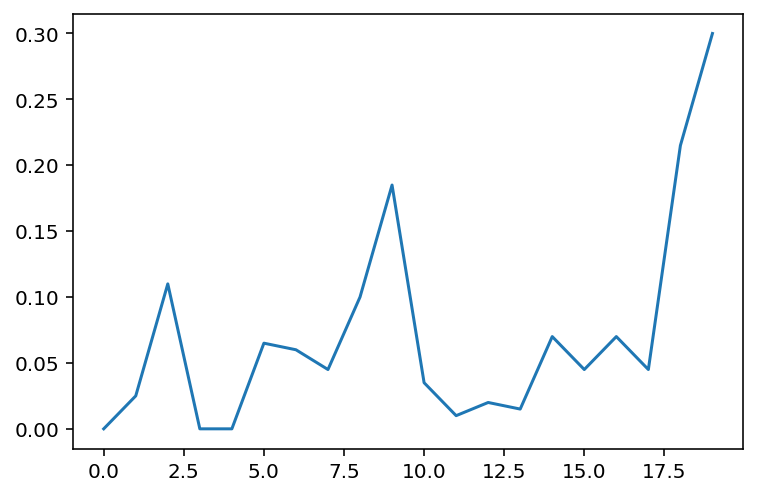

In [259]:
plt.plot(training_history['accuracy'])
plt.show()

In [260]:
# comparison, without shot noise, but again sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50)
summaries # print to keep for later

Acc: 19.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [09:45<00:00,  1.71it/s]


(array([-1.76370418e+00, -1.77041972e+00,  1.21723115e-01,  3.81150573e-01,
        -1.41139550e-04, -3.35850388e-01,  9.78949010e-01,  3.73577207e-01,
        -5.69402277e-01, -5.44448853e-01, -3.67849708e-01,  9.05308127e-01,
        -7.19854951e-01,  4.03094172e-01,  2.15063706e-01], dtype=float32),
 array([ 0.8649375 , -0.9565677 ,  0.29063734,  1.0292381 ,  0.6671997 ,
        -0.6108739 , -0.17901783, -0.49598378,  1.258636  , -0.49109432,
        -0.6503614 ,  0.25679508, -1.2618402 , -0.30907226, -0.7805112 ,
        -0.38041475, -0.55504423,  0.04085624, -0.31190613, -0.7227468 ,
         0.6537353 ,  0.5167436 ,  0.47964785, -0.18887365, -1.3395509 ,
         0.5540944 , -1.012528  , -1.1509937 , -0.5717804 ,  0.39010823,
         1.1498013 , -0.60175246, -1.5881393 ,  0.7736379 ,  0.879148  ,
         0.61938494], dtype=float32),
 array([0.67878863, 0.67528217, 0.67214318, 0.66854935, 0.66534314,
        0.66186099, 0.65850889, 0.65478807, 0.65113882, 0.64729585,
        0.6

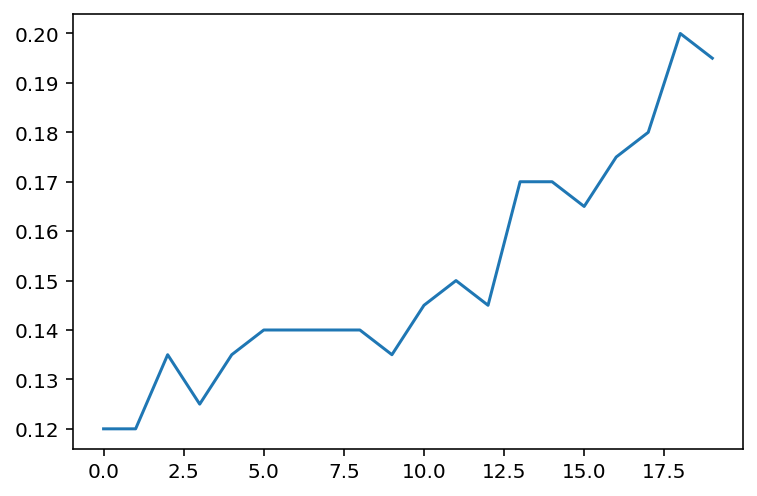

In [261]:
plt.plot(training_history['accuracy'])
plt.show()

In [262]:
# comparison, with shot noise, and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50,
                                                                 M_msmt_samples=10)
summaries # print to keep for later

Acc: 0.0 %: 100%|████████████████████████████████████████████| 1000/1000 [2:15:31<00:00,  8.13s/it]


(array([ 1.2864637 , -1.4566622 ,  0.33716446,  0.79922384, -0.3468865 ,
         0.9186365 , -1.1931845 ,  0.37152877, -1.9210279 , -0.3547293 ,
         0.35634667,  1.175205  ,  0.05542934, -0.02363589, -0.64031583],
       dtype=float32),
 array([ 0.8621453 ,  0.7632594 , -0.44710734, -0.93106997,  0.5588363 ,
        -0.38759756,  0.22378826, -0.67945874,  0.26263192,  0.22294788,
        -0.2394143 , -0.4773075 ,  1.3728756 , -0.7433682 , -0.04055537,
         1.337867  ,  0.12731318,  0.3732294 ,  0.28393894,  1.6807535 ,
         0.26257926,  1.5264158 , -0.6191309 , -0.7410124 ,  1.4386308 ,
        -0.03643295,  0.10816342,  0.23250008, -0.22865975,  0.22448273,
        -1.2164587 ,  0.17406897,  0.21444316, -1.2584488 , -0.29596305,
         0.14939788], dtype=float32),
 array([0.84722814, 0.84673557, 0.82859792, 0.82490907, 0.82224316,
        0.81349375, 0.81228883, 0.81158185, 0.79430142, 0.8014121 ,
        0.80236343, 0.78851077, 0.78877353, 0.79657594, 0.7908035 ,
    

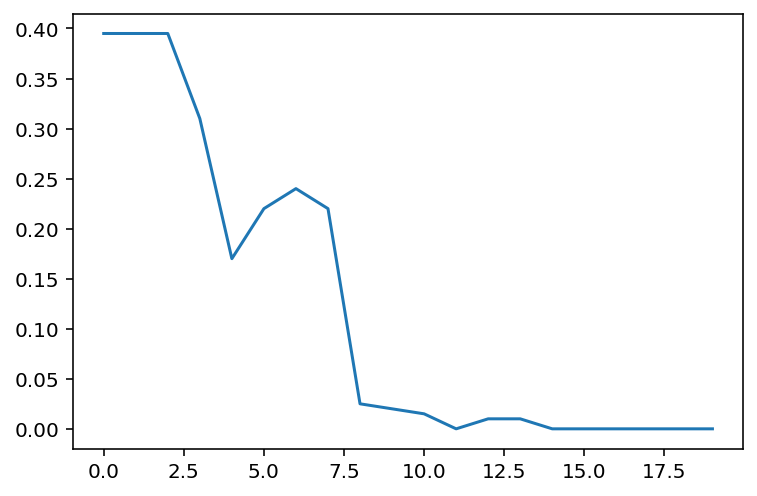

In [263]:
plt.plot(training_history['accuracy'])
plt.show()

In [264]:
# comparison, with much less shot noise (M=100), and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50,
                                                                 M_msmt_samples=100)
summaries # print to keep for later

Acc: 21.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [14:57<00:00,  1.11it/s]


(array([-0.51830596,  0.08752511,  0.845265  ,  0.151646  ,  3.8646421 ,
         0.9949277 , -0.5251431 , -0.9560473 , -0.02912325, -1.6576991 ,
        -1.273175  ,  0.7031146 ,  1.8526796 ,  0.989486  ,  1.7572494 ],
       dtype=float32),
 array([ 0.29672   , -0.87178284,  0.44481707, -2.2223728 , -0.7318194 ,
         0.19361092,  0.176904  , -0.11525928,  0.05585352, -2.6198604 ,
         0.22401653,  0.11676674,  2.175579  , -0.16059588,  1.6690114 ,
        -0.18014547,  0.32593033,  0.07254575,  1.257341  , -0.4989044 ,
         1.3285246 , -0.4538168 , -0.74441737,  0.3544733 ,  0.768581  ,
        -0.34137544,  0.06773546, -1.3479276 , -0.957643  ,  0.47200912,
        -1.0985911 ,  0.08194252, -0.61603564,  0.20936732, -0.8662302 ,
        -1.1078012 ], dtype=float32),
 array([0.69257878, 0.69216022, 0.68545801, 0.68544943, 0.68064296,
        0.66983093, 0.66197867, 0.66215022, 0.65718822, 0.65753197,
        0.6517953 , 0.63522104, 0.62688216, 0.62054426, 0.61242791,
    

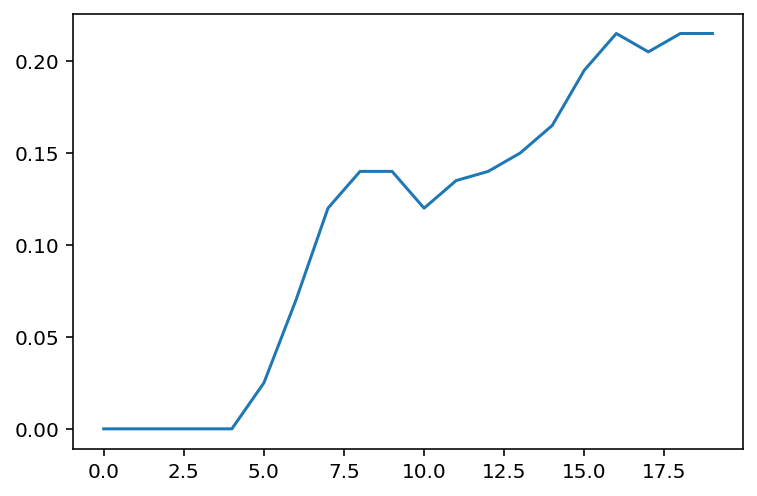

In [265]:
plt.plot(training_history['accuracy'])
plt.show()

In [266]:
# no shot noise, and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50)
summaries # print to keep for later

Acc: 97.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [15:03<00:00,  1.11it/s]


(array([-0.12849309, -1.5274365 , -0.35344094,  0.6293312 , -0.09626544,
        -1.0667512 , -2.7593071 ,  0.8442219 , -0.775358  , -1.0613979 ,
        -0.9458625 ,  2.3126051 , -1.1578068 , -1.5503943 , -0.8552171 ],
       dtype=float32),
 array([-0.18450113, -1.3677589 ,  2.4790583 , -0.63838786, -0.3188792 ,
         0.37725663, -1.1184216 , -0.3636705 ,  0.9998481 , -0.63954824,
        -0.8627868 , -1.3242928 , -0.14258686,  0.9049532 ,  2.3255506 ,
        -0.32577252,  1.1122614 ,  0.30268514,  0.48779708,  0.23213325,
        -1.3291519 ,  0.6754007 ,  0.2097533 , -1.262362  ,  0.39764875,
        -2.933733  ,  1.9361776 ,  0.03765066,  1.6971314 ,  1.4792594 ,
         0.9867895 ,  0.8871706 , -0.13600716, -0.8420025 , -0.21603209,
        -1.7460543 ], dtype=float32),
 array([0.97174042, 0.63450394, 0.55471593, 0.42958453, 0.3071852 ,
        0.25442979, 0.25541158, 0.2158255 , 0.20275689, 0.28246808,
        0.19587747, 0.21614864, 0.17738761, 0.22267637, 0.31757241,
    

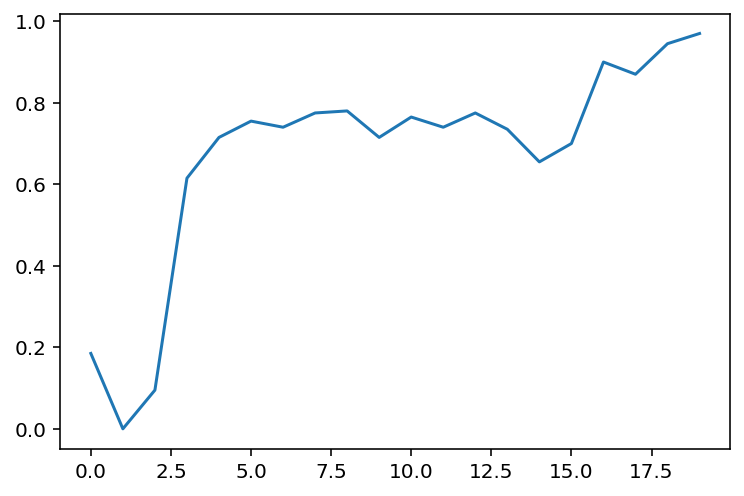

In [267]:
plt.plot(training_history['accuracy'])
plt.show()

In [268]:
# no shot noise, and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50,
                                                                 M_msmt_samples=1000)
summaries # print to keep for later

Acc: 95.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [13:07<00:00,  1.27it/s]


(array([-0.19963956, -1.0220336 , -0.6250733 ,  0.17495644,  0.40516698,
         0.18142101,  0.4408959 , -0.08415662, -1.2959545 ,  0.29740986,
        -1.1559722 , -0.39392203,  0.7597375 ,  0.33113056, -0.7632285 ],
       dtype=float32),
 array([-0.6143923 ,  0.05681343, -1.4420538 , -0.5138622 , -1.2734975 ,
         1.1585174 ,  0.13895023,  0.07613572, -2.0418606 ,  0.49261516,
        -0.03304505, -1.0640675 , -0.50518554, -0.9735862 ,  0.3837065 ,
        -0.18404879, -0.20761463, -2.969072  , -1.1020106 , -0.4358568 ,
         2.359971  , -0.790378  ,  1.53653   ,  1.0646719 ,  0.02335674,
         0.0616876 , -0.33808303,  1.1695834 , -0.93051785,  0.73565584,
         0.01604707,  1.2392955 ,  2.0061696 , -0.08766624, -0.7935726 ,
         0.5643065 ], dtype=float32),
 array([0.61646494, 0.56609359, 0.51352619, 0.47135909, 0.44523765,
        0.42430935, 0.37556399, 0.3549508 , 0.32556262, 0.29059213,
        0.25652363, 0.22554146, 0.19182302, 0.18453407, 0.15176937,
    

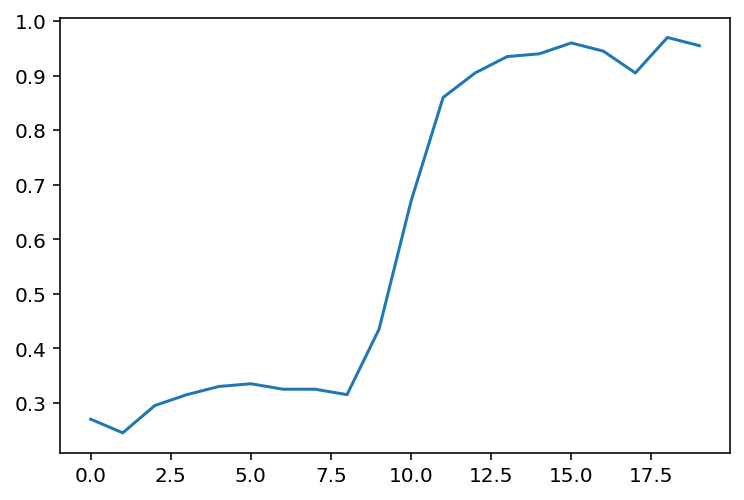

In [269]:
plt.plot(training_history['accuracy'])
plt.show()

In [270]:
# no shot noise, and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50,
                                                                 M_msmt_samples=1000)
summaries # print to keep for later

Acc: 0.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [10:27<00:00,  1.59it/s]


(array([ 0.3453429 , -1.4605403 , -0.920792  ,  2.4232838 ,  0.3430573 ,
        -0.1852802 , -1.2051497 , -0.47113436, -0.27986947, -0.7688454 ,
         1.55455   ,  1.1519758 , -0.35437095, -2.0197036 ,  0.33070448],
       dtype=float32),
 array([-0.71712804, -0.41020855,  1.3220192 , -0.35839766,  0.9496773 ,
        -0.52442306, -2.9503336 ,  1.2511572 , -1.5875764 , -0.9583078 ,
        -2.0852427 , -0.28117636, -0.04338453, -0.7936386 ,  0.7716953 ,
        -1.5858991 , -0.40163296,  0.87720305, -0.5645442 , -0.98815703,
         0.92171615, -1.2255304 ,  0.8347352 , -0.65559703,  0.11313324,
         0.17931275, -1.2973132 , -0.47365713,  1.5961418 ,  0.9107469 ,
        -0.05807758,  0.06087787,  0.8333913 , -3.125452  ,  0.6322937 ,
         0.94542617], dtype=float32),
 array([0.8093163 , 0.76247666, 0.73260825, 0.71583166, 0.70520101,
        0.69983401, 0.69421597, 0.68813757, 0.68858429, 0.68638042,
        0.67881506, 0.67603886, 0.66746963, 0.65467437, 0.63973429,
    

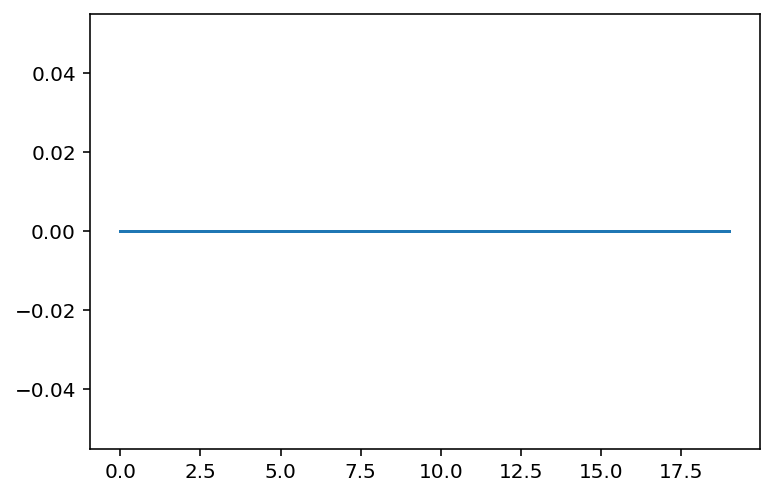

In [272]:
plt.plot(training_history['accuracy'])
plt.show()

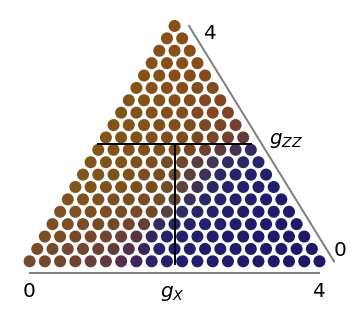

In [273]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

In [274]:
# no shot noise, and adam:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.adam,
                                                                 test_step=50,
                                                                 M_msmt_samples=1000)
summaries # print to keep for later

Acc: 94.0 %: 100%|███████████████████████████████████████████| 1000/1000 [2:35:06<00:00,  9.31s/it]


(array([-0.02520479, -0.6143127 , -0.947699  ,  0.3524686 , -0.5050188 ,
         0.9458918 , -0.17842638,  0.5076461 , -0.6487841 , -0.85265124,
         0.5522687 ,  0.21993662, -0.8586993 , -0.24690615, -0.93453217],
       dtype=float32),
 array([-0.50706345,  1.1864085 ,  0.18234283, -0.5492223 , -0.07165179,
        -0.6588527 ,  1.48008   ,  0.44000274,  0.27706766, -0.36579084,
         1.5905029 ,  0.87010103,  0.76921237,  0.80424917,  3.0030427 ,
        -1.0919784 ,  0.37153962,  1.2473811 ,  0.2255323 , -0.3016035 ,
         0.49593002,  1.0900357 ,  0.93671405,  0.28418735,  1.1686413 ,
         0.12518457,  0.22991274, -0.17276351,  0.47229266, -0.14447276,
         0.5041033 , -0.75986606, -0.73568547, -0.49684337, -1.1101948 ,
        -2.831144  ], dtype=float32),
 array([0.8347726 , 0.76024977, 0.71628772, 0.62990046, 0.51880866,
        0.42214287, 0.36891152, 0.32604961, 0.28989578, 0.27647592,
        0.25538443, 0.23166379, 0.29544941, 0.19777987, 0.19671081,
    

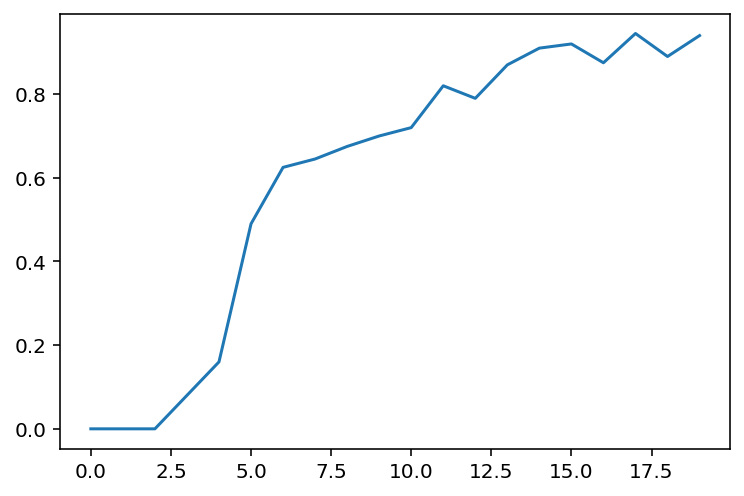

In [275]:
plt.plot(training_history['accuracy'])
plt.show()

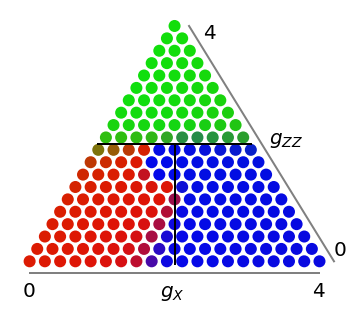

In [276]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

In [295]:
# analyze effect of nudging:
# comparison, without shot noise, but still sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=True,
                                                             num_batches=200)
summaries # print to keep for later

Acc: 21.0 %: 100%|███████████████████████████████████████████████| 200/200 [02:39<00:00,  1.25it/s]


(array([ 0.01838996,  0.8897049 , -1.3112931 , -0.6413121 , -0.9432168 ,
        -0.68587846,  0.35802943, -1.0272601 ,  0.61496186,  2.2527947 ,
         0.19325553,  1.0069046 , -0.06111828,  0.7839534 ,  0.18926173],
       dtype=float32),
 array([ 0.36019105,  0.61688405, -1.4253684 ,  0.31027213, -1.8914447 ,
         0.268638  , -0.67538327,  0.6569921 , -0.27343902, -1.143057  ,
        -0.5741828 ,  1.0201683 ,  0.63650906, -0.31904992, -0.7931024 ,
        -1.2327142 ,  1.4188744 ,  0.47393277, -0.11350199, -1.2587386 ,
        -1.2306539 , -0.9030707 , -0.927117  , -1.2554272 , -0.8576795 ,
        -2.4889417 , -0.03536658,  0.00257342, -0.84841126, -0.50356615,
        -0.7397086 ,  0.67445666,  1.1501353 ,  0.14722203,  0.4683066 ,
         1.3179516 ], dtype=float32),
 array([0.87270364, 0.74158514, 0.73010465, 0.727671  ]),
 array([0.325, 0.235, 0.215, 0.21 ]),
 array([0.78429398, 1.05564023, 0.78182745, 1.07256116, 1.14330643,
        0.86268492, 0.54742607, 1.07080522, 

In [296]:
(training_history['theta_gradient'],training_history['theta_gradient_half'])

([array([ 1.72858624e-03, -4.88357661e-03,  3.93838193e-03, -1.71203295e-03,
          8.73469699e-03,  8.73274520e-03,  6.97049169e-04, -1.26516228e-02,
         -4.54412471e-03,  1.34297326e-02,  4.59592917e-03,  1.93014675e-03,
         -2.89756920e-02,  2.57343647e-03,  4.36435174e-03, -9.85495954e-03,
         -1.93591165e-02,  4.59864225e-02,  1.61392390e-02, -8.19805738e-03,
         -5.72285761e-03, -6.18895464e-03,  3.15055943e-03, -2.19879934e-03,
          5.34272497e-03,  1.73489638e-02,  2.78972099e-03, -6.80019897e-03,
         -7.46365303e-03, -1.07426365e-03, -9.88267972e-03,  5.27666180e-03,
         -1.87630938e-02, -7.90019115e-03, -2.10524909e-02,  1.71924180e-03,
          1.93674102e-02,  3.86852675e-05, -4.68818588e-03, -1.30449590e-02,
          1.85105179e-02,  3.76364412e-03, -4.14837892e-03, -2.58030641e-03,
          1.42068177e-02,  5.86390659e-03, -1.51321334e-03,  5.40026307e-04,
         -1.36460316e-02,  1.56397632e-02,  1.39162093e-02]),
  array([ 0.03

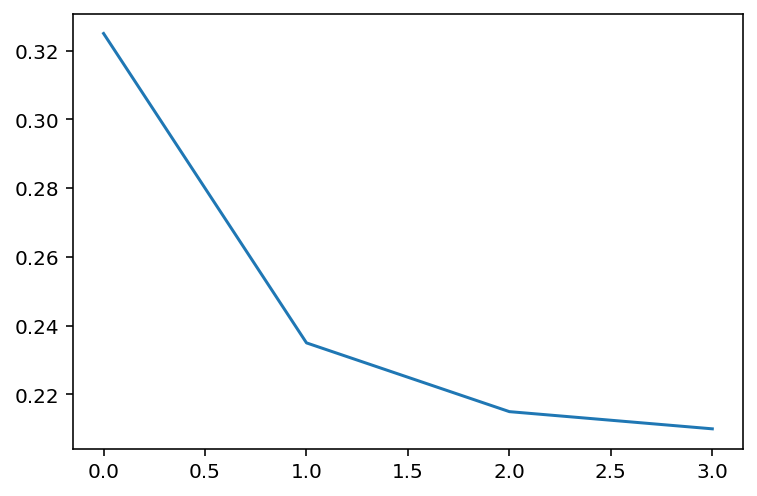

In [298]:
plt.plot(training_history['accuracy'])
plt.show()

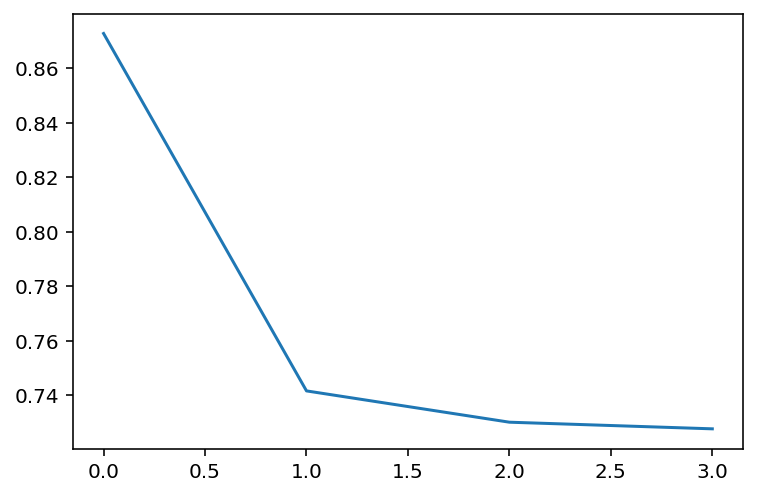

In [300]:
plt.plot(training_history['cost'])
plt.show()

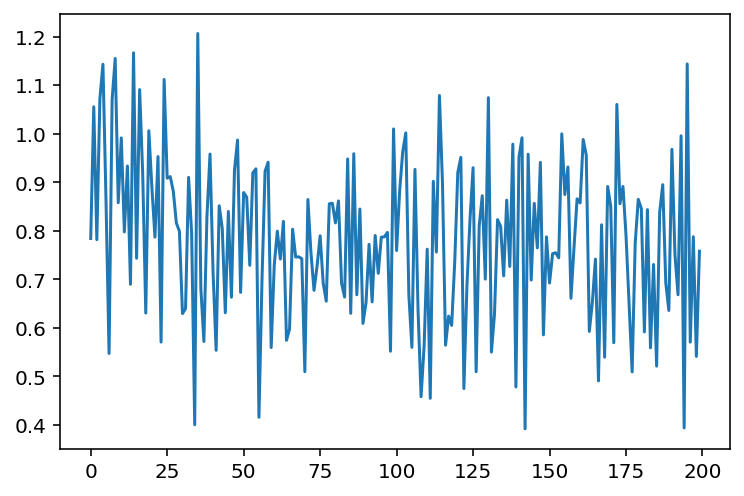

In [303]:
plt.plot(training_history['training_cost'])
plt.show()

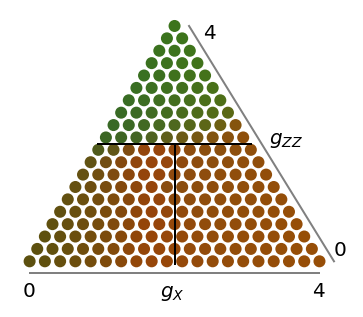

In [304]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

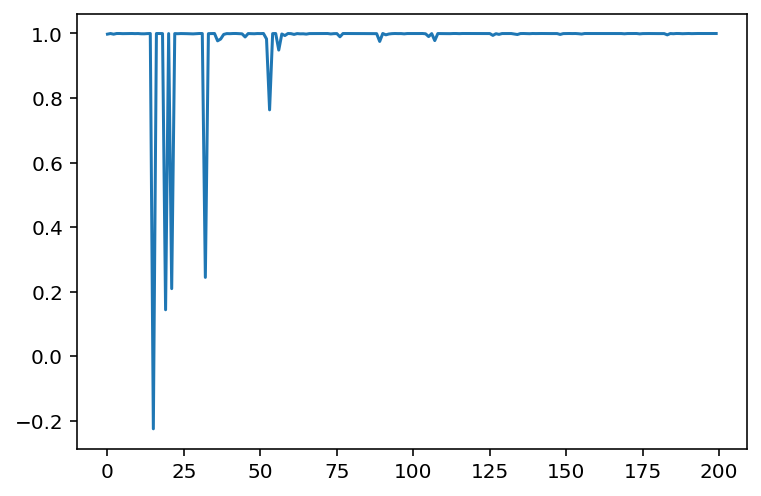

In [299]:
grad=np.array(training_history['theta_gradient'])
grad_2=np.array(training_history['theta_gradient_half'])

scalar_prod=np.sum(grad*grad_2,axis=-1)/np.sqrt(np.sum(grad**2,axis=-1) * np.sum(grad_2**2,axis=-1))

plt.plot(scalar_prod)

In [305]:
# analyze effect of SYMMETRIC nudging:
# comparison, without shot noise, but still sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=True,
                                                             num_batches=200,
                                                                 symmetric_nudging=True)
summaries # print to keep for later

Acc: 6.0 %: 100%|████████████████████████████████████████████████| 200/200 [05:55<00:00,  1.78s/it]


(array([-0.7009339 , -0.7166434 , -0.58747965, -1.5606543 ,  0.7724409 ,
        -0.611762  , -0.9561824 ,  0.36243767,  0.7958965 , -0.4250607 ,
         0.8838685 , -0.01136553,  0.2543631 ,  0.64213556, -0.8879566 ],
       dtype=float32),
 array([-0.04544333, -2.6012094 , -2.0299563 ,  0.6212119 ,  2.179853  ,
         0.8711275 , -0.30425304,  0.1326387 , -0.81398785, -0.81090647,
        -0.4655905 ,  0.48691794, -1.5291038 , -1.1074165 , -0.2164762 ,
        -0.30643508,  0.68408835, -0.7076689 , -0.01970904, -0.80345654,
         1.3578984 ,  1.1236172 ,  0.39114785,  0.5758888 , -0.530455  ,
         0.26139   , -0.3945221 ,  0.50229454, -0.19374676, -1.3229549 ,
         0.76518583, -1.0949787 ,  0.55556804,  0.30149108, -0.13048825,
        -0.45018795], dtype=float32),
 array([0.68467175, 0.68018175, 0.67486666, 0.66984863]),
 array([0.125, 0.115, 0.075, 0.06 ]),
 array([0.62941759, 0.61372851, 0.57816276, 0.7199553 , 0.6846773 ,
        0.58507593, 0.67078749, 0.58813048, 

In [306]:
(training_history['theta_gradient'],training_history['theta_gradient_half'])

([array([-2.41295602e-03,  5.37829531e-03, -2.58781850e-02,  2.87555396e-03,
          3.74753054e-03, -8.02336364e-04,  1.10640207e-03, -4.24772915e-03,
         -2.79902745e-04,  9.99645093e-04, -6.39373079e-04,  3.28365517e-03,
          3.00404738e-06,  3.25171740e-03, -2.71704786e-03,  7.96950013e-03,
         -4.83139320e-03, -8.38588886e-03, -2.70445603e-03,  1.19628893e-03,
         -3.13397603e-02, -8.69086428e-03,  1.17006947e-02, -1.49595024e-02,
          2.00256740e-03, -7.72823265e-03, -1.73827305e-03,  3.07856328e-04,
          6.57047800e-03,  3.09318096e-03,  1.12453645e-02,  1.45112841e-02,
         -9.20059483e-04,  7.83016250e-03, -2.22385906e-02, -2.39005195e-02,
         -1.26088831e-02,  2.03875455e-03, -1.12760029e-02,  1.08832424e-03,
          2.18244413e-03,  1.36922918e-02,  6.72079837e-03,  3.31210678e-03,
          4.26518434e-03, -9.89582610e-04, -7.85412058e-03, -3.29972892e-03,
          9.73993420e-03,  1.74015132e-02,  2.33354453e-02]),
  array([-2.26

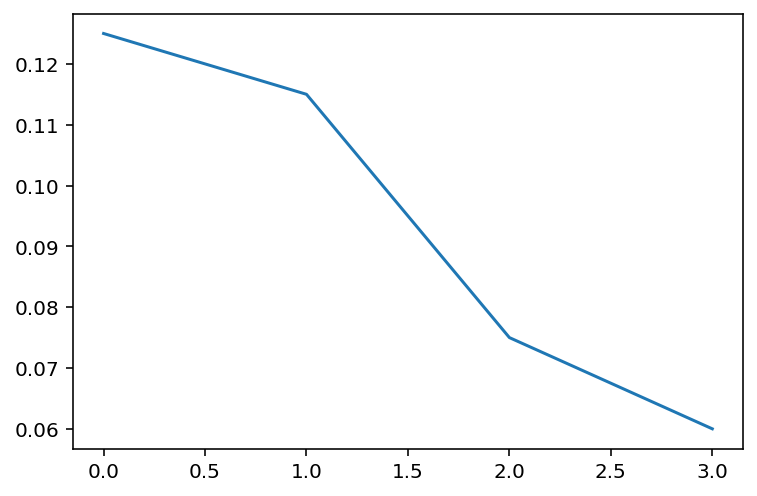

In [307]:
plt.plot(training_history['accuracy'])
plt.show()

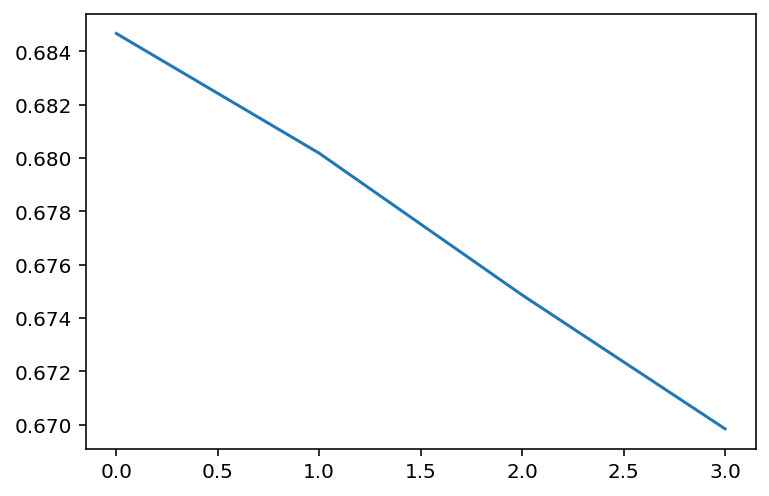

In [308]:
plt.plot(training_history['cost'])
plt.show()

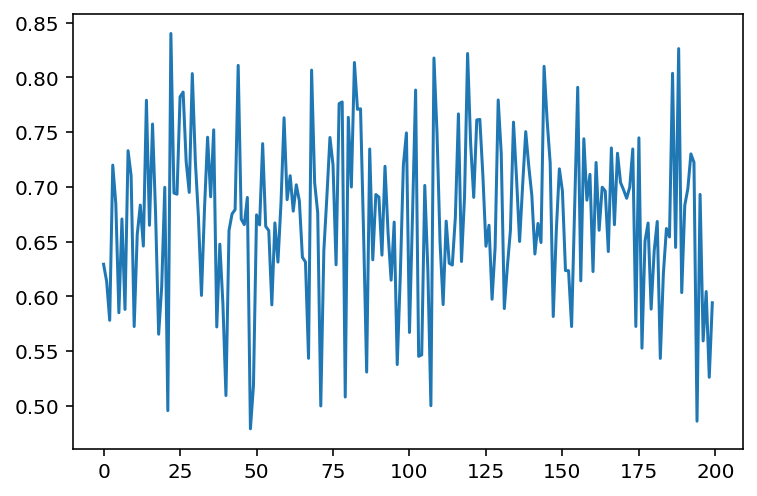

In [309]:
plt.plot(training_history['training_cost'])
plt.show()

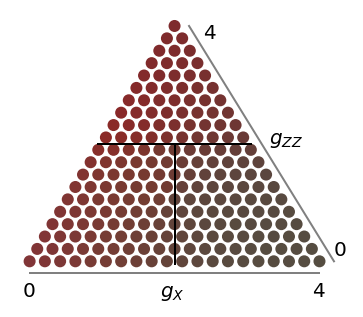

In [310]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

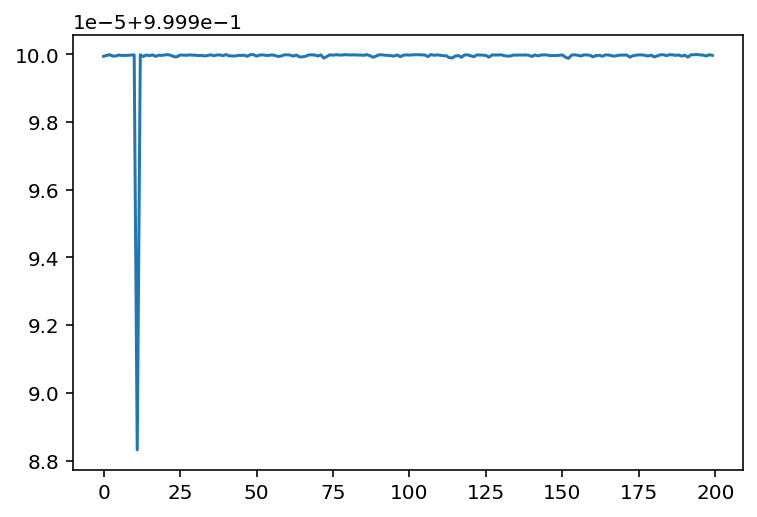

In [311]:
grad=np.array(training_history['theta_gradient'])
grad_2=np.array(training_history['theta_gradient_half'])

scalar_prod=np.sum(grad*grad_2,axis=-1)/np.sqrt(np.sum(grad**2,axis=-1) * np.sum(grad_2**2,axis=-1))

plt.plot(scalar_prod)

(0.0, 1.2)

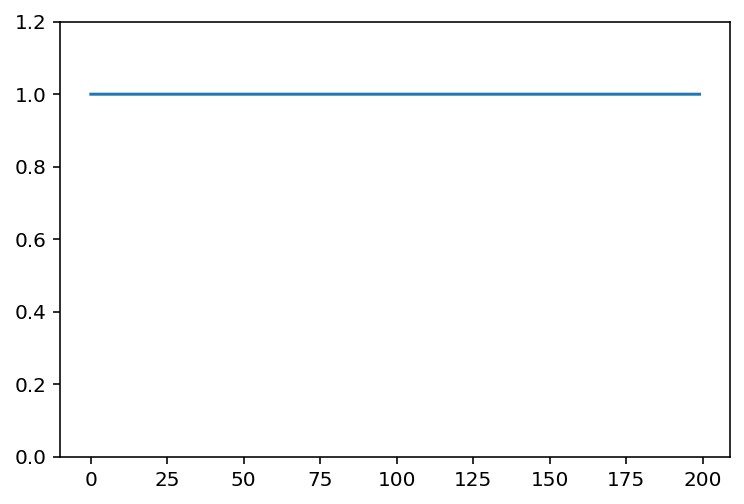

In [314]:
plt.plot(scalar_prod)
plt.ylim(0,1.2)

In [317]:
# analyze effect of SYMMETRIC nudging:
# comparison, without shot noise, but still sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=True,
                                                             num_batches=200,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1)
summaries # print to keep for later

Acc: 26.5 %: 100%|███████████████████████████████████████████████| 200/200 [05:26<00:00,  1.63s/it]


(array([-0.35765243,  0.49527654, -0.27926537,  0.6026288 , -1.2788802 ,
         0.21586004,  0.1953073 ,  0.5556439 , -0.5534395 , -1.2538028 ,
        -0.33523917,  0.829967  ,  0.36717284, -0.03958324, -0.01050127],
       dtype=float32),
 array([ 1.3803521 , -1.3395122 ,  2.4300835 , -0.79296076, -0.46354344,
         1.7315286 , -0.22098549, -1.090768  ,  1.6707519 ,  0.54424375,
         0.06248672, -1.0609752 ,  0.04084729,  0.98116046, -0.27800784,
        -0.02699297,  0.40252692, -1.3207692 ,  0.523859  , -0.2521174 ,
        -0.78843874, -1.0558736 , -0.11840824, -2.1411505 , -0.8645057 ,
         0.5135783 , -0.28882638, -0.7967204 , -1.9647951 ,  1.0822879 ,
        -0.15448287,  0.41227973,  1.5398022 ,  0.03307402,  1.0058844 ,
         0.6197488 ], dtype=float32),
 array([0.87485882, 0.77994739, 0.67731135, 0.48306089]),
 array([0.39 , 0.39 , 0.39 , 0.265]),
 array([1.16020867, 1.1318035 , 0.6317726 , 0.83699571, 0.67897603,
        0.56267371, 0.82668313, 0.87480578, 

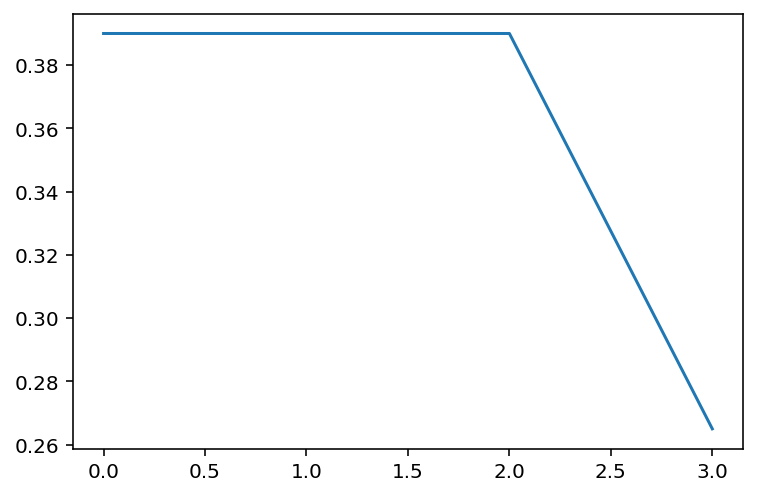

In [318]:
plt.plot(training_history['accuracy'])
plt.show()

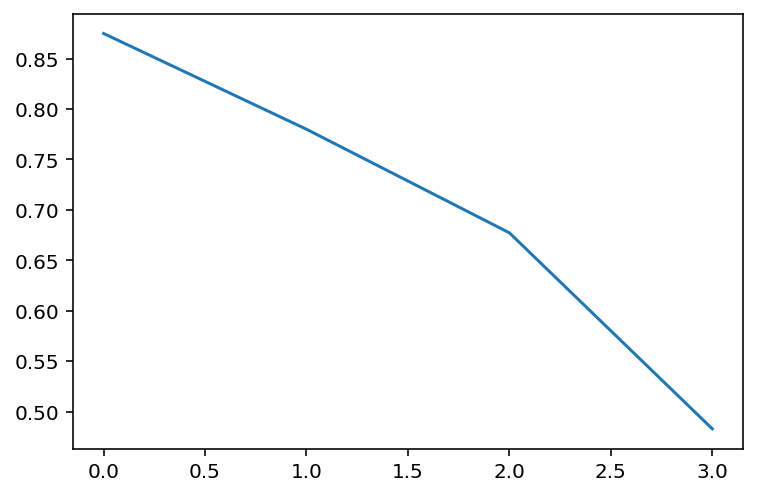

In [319]:
plt.plot(training_history['cost'])
plt.show()

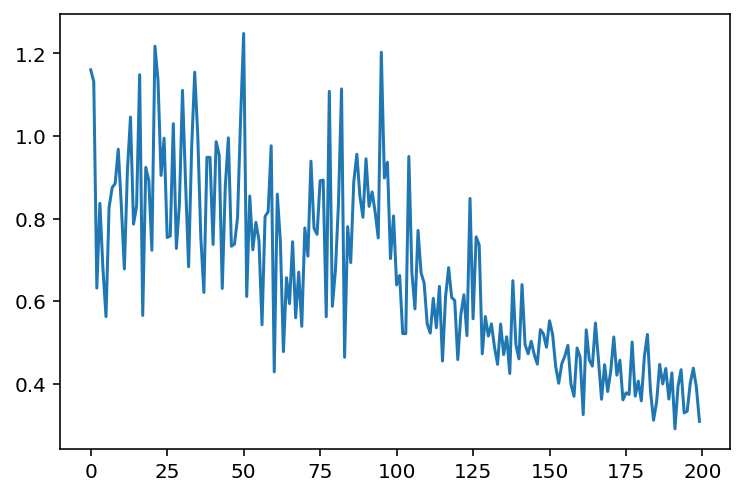

In [320]:
plt.plot(training_history['training_cost'])
plt.show()

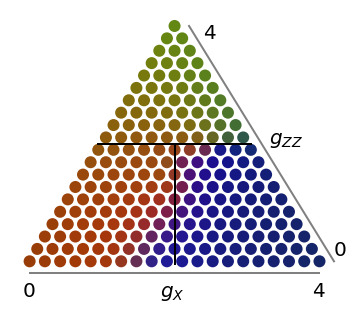

In [321]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

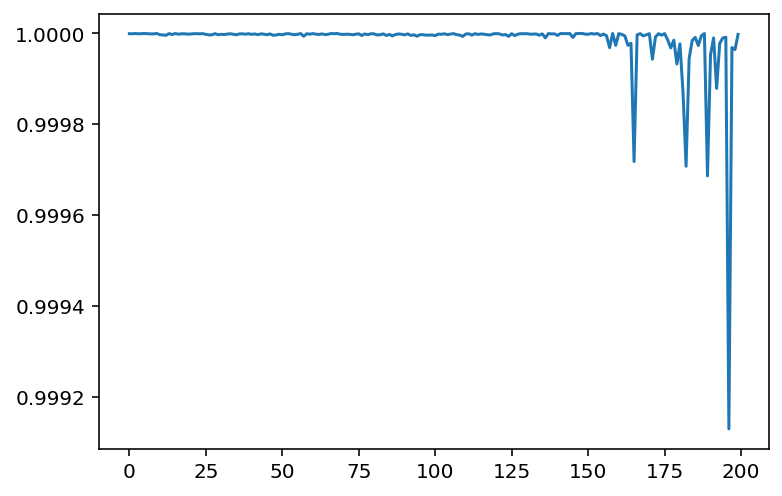

In [322]:
grad=np.array(training_history['theta_gradient'])
grad_2=np.array(training_history['theta_gradient_half'])

scalar_prod=np.sum(grad*grad_2,axis=-1)/np.sqrt(np.sum(grad**2,axis=-1) * np.sum(grad_2**2,axis=-1))

plt.plot(scalar_prod)

In [325]:
# analyze effect of SYMMETRIC nudging:
# comparison, without shot noise, but still sgd:
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                             num_batches=200,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=True)
summaries # print to keep for later

Acc: 68.5 %: 100%|███████████████████████████████████████████████| 200/200 [02:59<00:00,  1.11it/s]


(array([-0.14002585, -0.32056305,  0.12837437,  1.3598421 ,  0.6308995 ,
        -1.3030299 , -0.7062563 , -0.92441756,  0.94549304,  1.8199877 ,
         0.7807093 , -0.66600055,  0.3407771 ,  1.5578406 , -2.0748565 ],
       dtype=float32),
 array([-1.3683808 ,  1.5732517 ,  2.141168  ,  0.09384911, -0.62194616,
        -0.0409346 , -0.19628085, -0.7492172 , -0.68510246, -0.70923275,
         0.11321149, -0.6047568 ,  0.00508466,  1.166791  ,  0.08961353,
         1.5894796 ,  0.45948926, -2.0614653 , -1.1538823 , -0.39680868,
        -0.89793336,  0.8550684 , -0.485205  ,  1.4437529 , -0.12135395,
        -1.0338321 ,  0.04904817,  0.3128542 , -0.14123029,  0.8641982 ,
        -0.46130815,  0.39427683,  0.39679638, -1.2443893 ,  0.917913  ,
         0.9727889 ], dtype=float32),
 array([0.96495505, 0.5498609 , 0.48232694, 0.43577714]),
 array([0.365, 0.23 , 0.6  , 0.685]),
 array([0.51628929, 0.66701047, 0.64507713, 1.04152267, 1.15402279,
        0.90258626, 1.13954092, 0.89160373, 

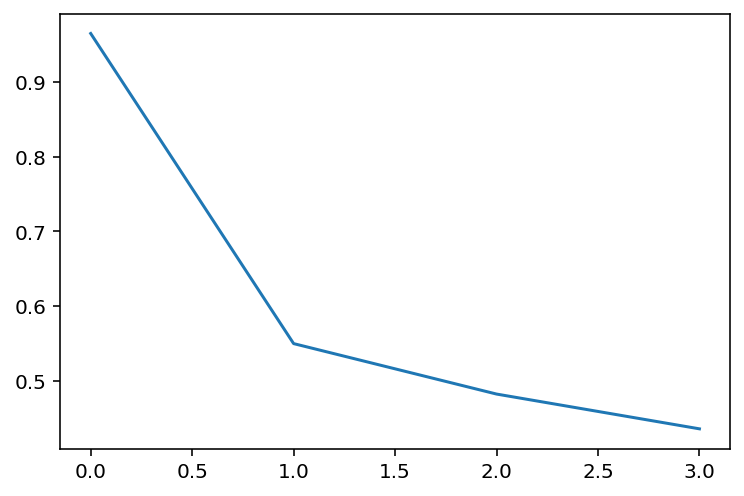

In [326]:
plt.plot(training_history['cost'])
plt.show()

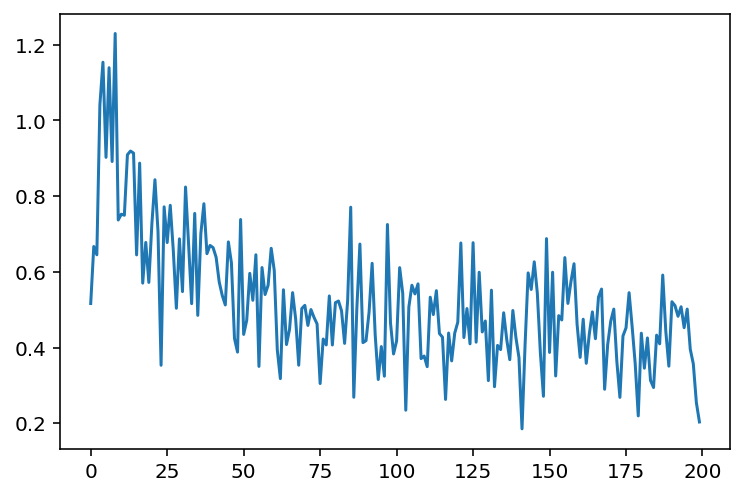

In [327]:
plt.plot(training_history['training_cost'])
plt.show()

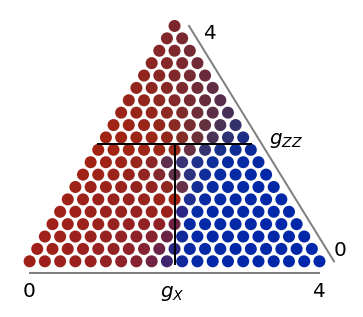

In [328]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

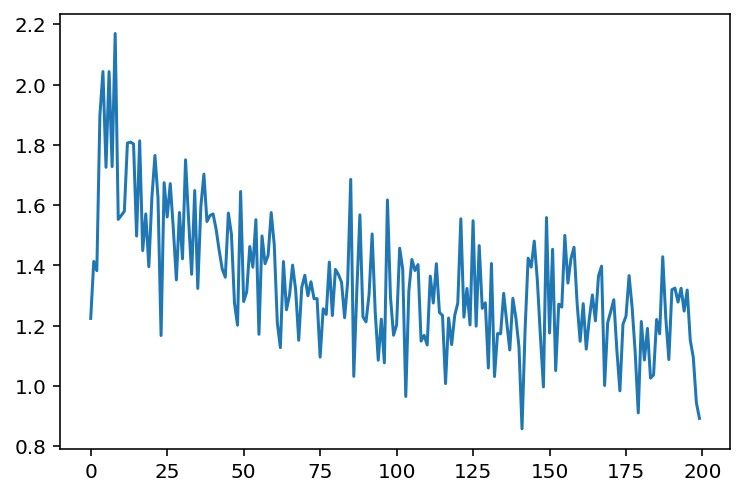

In [329]:
plt.plot(training_history['error_signal'])
plt.show()

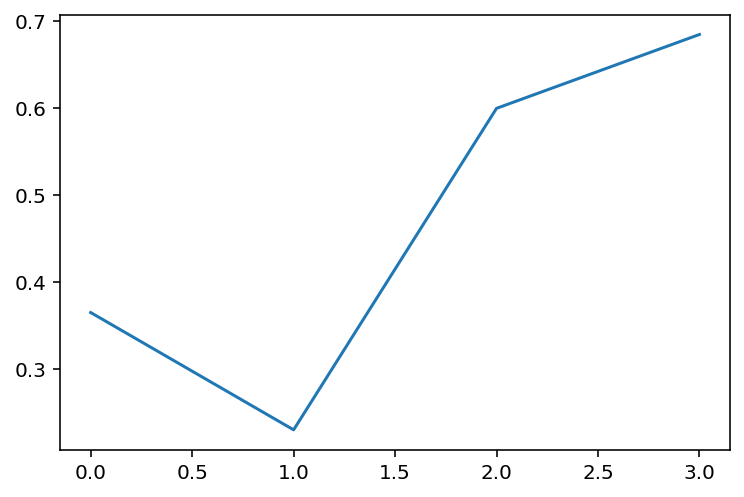

In [330]:
plt.plot(training_history['accuracy'])
plt.show()

In [334]:
# shot noise effects:
np.random.seed(42)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=True,
                                                             num_batches=200,
                                                                  M_msmt_samples=10,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=True)
summaries # print to keep for later

Acc: 0.0 %: 100%|████████████████████████████████████████████████| 200/200 [05:04<00:00,  1.52s/it]


(array([-0.11797868, -2.7550294 , -2.2330897 , -0.8773896 ,  1.086199  ,
        -0.12596974, -0.9959488 , -0.97900224, -1.463341  , -1.6332698 ,
         0.5020806 ,  0.9294405 ,  0.76260096, -2.6791496 ,  0.03181531],
       dtype=float32),
 array([-0.3815372 ,  1.3309252 ,  0.06497958,  2.9920745 , -1.3872628 ,
         0.45618317,  4.183075  ,  1.720471  , -1.2763005 ,  1.2185237 ,
        -1.8145206 , -0.6498725 , -0.6712998 , -1.3244431 , -2.457493  ,
        -1.7480569 , -1.9572179 ,  0.9308636 , -1.6934282 , -1.0802363 ,
         2.1289995 ,  0.18704608,  2.1715243 ,  0.01183775,  1.5840343 ,
         1.3782597 , -1.0484203 , -0.05154264,  1.1980207 ,  0.06516062,
        -0.12978734,  1.5243703 ,  0.32552683, -2.0057027 ,  1.8929685 ,
         0.23957273], dtype=float32),
 array([0.88062469, 0.72926401, 0.60373812, 0.5846329 ]),
 array([0.065, 0.   , 0.   , 0.   ]),
 array([0.93353769, 0.88900426, 0.86832685, 0.85751656, 0.84474595,
        0.8298388 , 0.64925459, 0.89022452, 

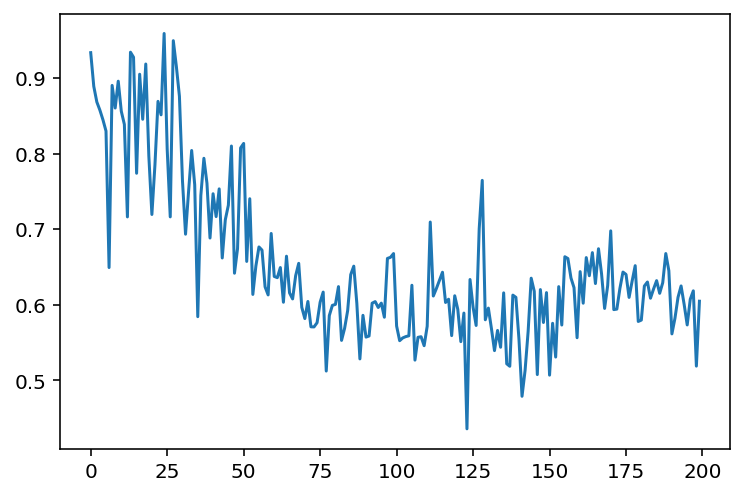

In [335]:
plt.plot(training_history['training_cost'])
plt.show()

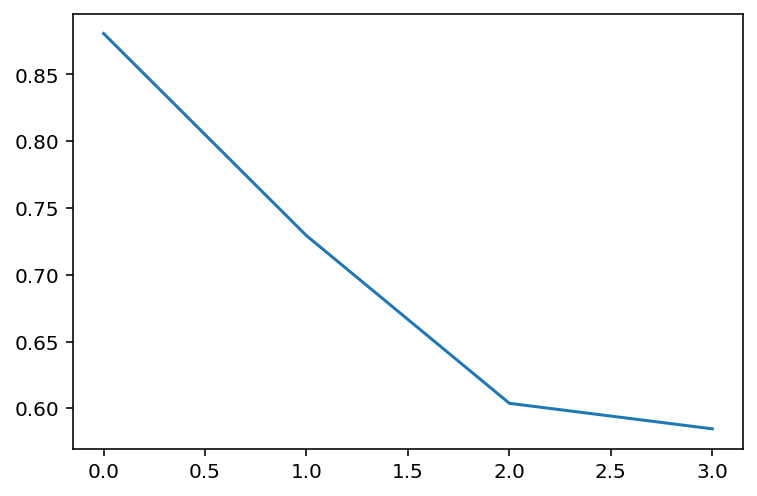

In [336]:
plt.plot(training_history['cost'])
plt.show()

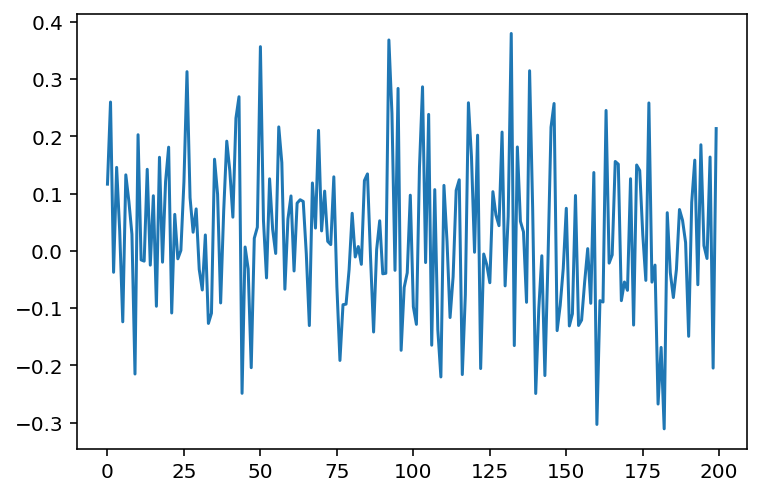

In [337]:
grad=np.array(training_history['theta_gradient'])
grad_noshot=np.array(training_history['theta_gradient_no_shot_noise'])

scalar_prod=np.sum(grad*grad_noshot,axis=-1)/np.sqrt(np.sum(grad**2,axis=-1) * np.sum(grad_noshot**2,axis=-1))

plt.plot(scalar_prod)

In [338]:
np.average(scalar_prod)

0.024658282800011016

In [339]:
(grad,grad_noshot)

(array([[-0.46995929, -0.13984978,  1.04941927, ...,  0.01036361,
          0.20545235,  1.21334813],
        [ 0.47791902,  0.67150871,  0.38412899, ...,  0.6537577 ,
          0.48516583,  0.25890109],
        [ 0.29983706, -0.29595737,  0.43049913, ...,  0.31097291,
          0.12136949, -0.00282216],
        ...,
        [ 0.35337535,  0.15425151,  0.81576076, ...,  0.78160748,
          0.03869812, -0.19658211],
        [-0.12627465, -0.09145168,  1.01629943, ..., -0.42798365,
         -1.10388843,  1.33385991],
        [-0.66597949,  0.11239793, -0.13384481, ...,  1.46777143,
          1.02494911, -0.24898802]]),
 array([[ 0.01106602,  0.02360587, -0.05009452, ...,  0.03154933,
          0.09424683,  0.04829232],
        [ 0.00261373,  0.02743379, -0.05931523, ...,  0.05420616,
          0.03940172,  0.04901463],
        [ 0.00011812,  0.03333108, -0.06121239, ...,  0.0503864 ,
          0.04674226,  0.05100644],
        ...,
        [-0.00148885,  0.00815088, -0.01011709, ...,  

In [340]:
# shot noise effects:
np.random.seed(42)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=True,
                                                             num_batches=200,
                                                                  M_msmt_samples=100,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=True)
summaries # print to keep for later

Acc: 0.0 %: 100%|████████████████████████████████████████████████| 200/200 [04:42<00:00,  1.41s/it]


(array([ 0.15355976, -1.9514055 , -1.4250838 , -0.11765577,  0.56605476,
         0.05954397, -0.25904536, -0.4499561 , -1.164031  , -1.0173298 ,
        -0.46260667,  0.85814196,  0.21568356, -2.5753982 , -0.3850333 ],
       dtype=float32),
 array([ 0.43147805,  0.31135127,  0.86931044,  1.9640677 , -0.25603104,
         0.28760016,  2.343206  ,  0.9119345 , -0.74341977,  0.64062   ,
        -0.94580245, -0.7952945 , -0.1070109 , -1.5916444 , -2.0555792 ,
        -1.0379869 , -1.5975617 ,  0.11497133, -0.8992064 , -1.2390121 ,
         1.967715  ,  0.03418124,  1.0750213 , -0.35458824,  0.14329837,
         0.57629997, -1.2951673 ,  0.25671208, -0.05626703, -0.35728684,
        -0.2891433 ,  1.5545468 , -0.00292144, -1.4023222 ,  1.3031234 ,
         0.06329127], dtype=float32),
 array([0.88062469, 0.70893445, 0.58129366, 0.52698777]),
 array([0.065, 0.105, 0.09 , 0.   ]),
 array([0.93353769, 0.89047354, 0.87194443, 0.84319961, 0.83156976,
        0.80052784, 0.57722024, 0.87842383, 

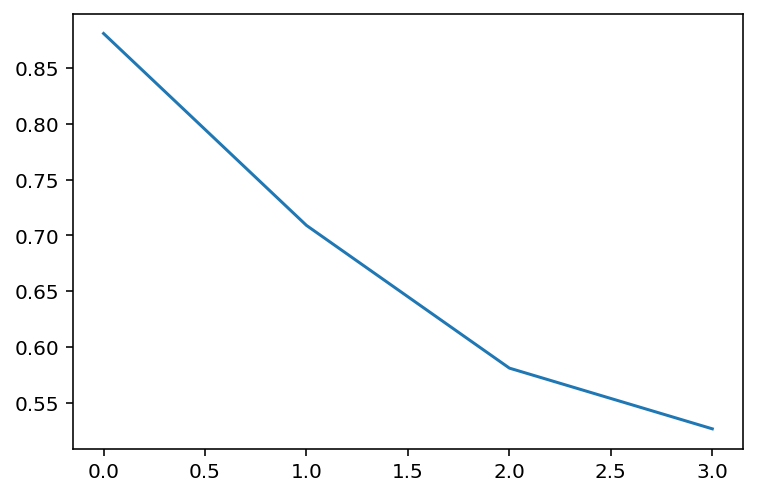

In [344]:
plt.plot(training_history['cost'])
plt.show()

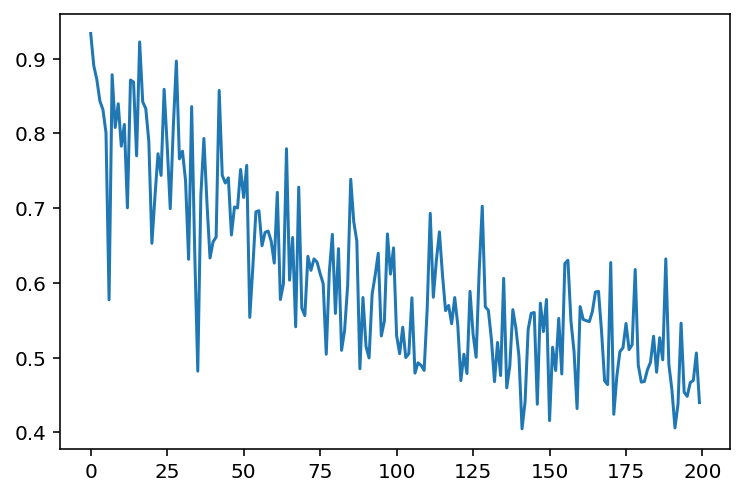

In [341]:
plt.plot(training_history['training_cost'])
plt.show()

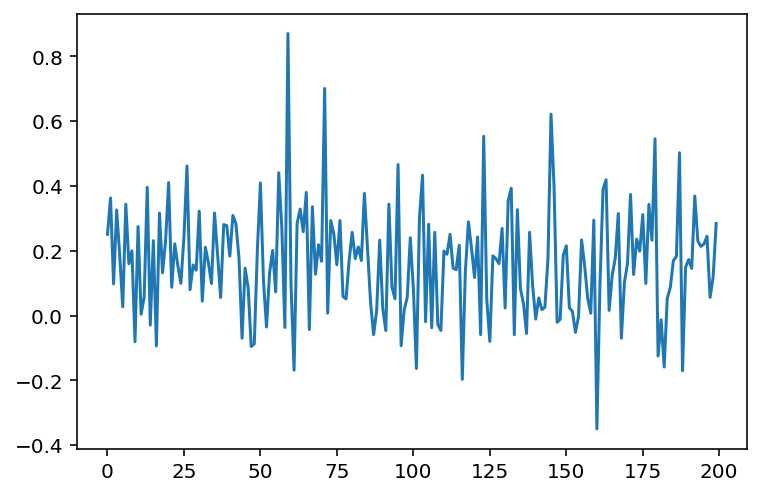

In [342]:
grad=np.array(training_history['theta_gradient'])
grad_noshot=np.array(training_history['theta_gradient_no_shot_noise'])

scalar_prod=np.sum(grad*grad_noshot,axis=-1)/np.sqrt(np.sum(grad**2,axis=-1) * np.sum(grad_noshot**2,axis=-1))

plt.plot(scalar_prod)

In [343]:
np.average(scalar_prod)

0.1620385741048243

In [345]:
# shot noise effects:
np.random.seed(42)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=100,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)
summaries # print to keep for later

Acc: 92.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [21:04<00:00,  1.26s/it]


(array([ 0.0752429 , -1.7837883 , -1.549184  ,  0.3317031 ,  0.7320683 ,
         0.44022682, -0.8179245 , -0.89544964, -0.881427  , -0.30753005,
        -0.3299605 ,  1.46661   ,  0.8798614 , -2.069864  , -1.0299518 ],
       dtype=float32),
 array([ 0.49658266,  0.508816  ,  2.0134199 ,  2.7011342 , -0.6450665 ,
         1.2163    ,  1.8975964 , -0.23867819, -1.518009  ,  0.06007588,
         0.0886724 , -1.5736605 ,  0.14995527, -1.8595868 , -2.1870575 ,
        -0.5899205 , -1.2517438 , -0.52841777, -1.0542803 , -0.969547  ,
         0.66856563,  0.03400135,  0.9975313 , -0.0331396 ,  0.05713167,
         0.49128938, -1.3041272 , -0.09894875, -0.3760217 , -0.29434305,
        -0.53698504,  1.7799847 , -0.12204687, -0.23117045,  1.6642138 ,
         3.3244588 ], dtype=float32),
 array([0.88062469, 0.70893445, 0.58129366, 0.52698777, 0.46225476,
        0.45503169, 0.37389914, 0.35115533, 0.31796679, 0.28795326,
        0.28215853, 0.24696904, 0.22749369, 0.23492147, 0.20271198,
    

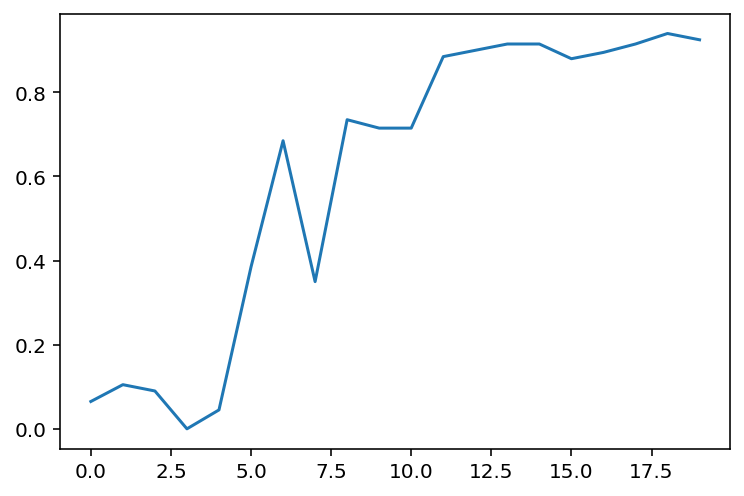

In [346]:
plt.plot(training_history['accuracy'])
plt.show()

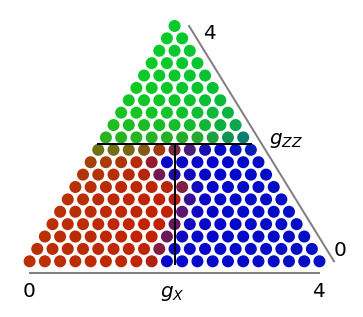

In [347]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

In [348]:
# shot noise effects:
np.random.seed(42)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=10,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)
summaries # print to keep for later

Acc: 0.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [23:39<00:00,  1.42s/it]


(array([-0.50752604, -4.6961937 ,  1.3786011 , -0.49985012, -0.04387441,
        -0.65207314, -2.813115  , -3.4881146 ,  2.0872712 , -2.124316  ,
        -0.42947462,  4.799039  ,  2.488115  , -5.230771  , -0.40669188],
       dtype=float32),
 array([-0.39275345,  2.7439826 ,  1.7983412 ,  6.6655197 , -2.2386203 ,
        -0.06029022,  3.9768631 , -1.6638043 , -4.1537232 , -0.2856105 ,
        -0.29992366, -2.5293787 , -0.44610623, -2.6297274 , -0.17737389,
        -2.4690666 , -3.1521432 , -0.9799134 , -2.2203438 , -0.22071207,
        -1.2725782 , -0.62387574,  4.945086  , -1.2867777 ,  1.8237953 ,
         0.9853891 , -2.0273972 , -1.7369077 , -1.3244075 , -0.39807922,
        -2.38416   ,  3.2947233 , -0.14477383, -0.17228872,  3.8728478 ,
         1.8386557 ], dtype=float32),
 array([0.88062469, 0.72926401, 0.60373812, 0.5846329 , 0.58968674,
        0.5843396 , 0.56052728, 0.51703928, 0.49270254, 0.51703774,
        0.49966617, 0.48889061, 0.57001475, 0.53976259, 0.48907904,
    

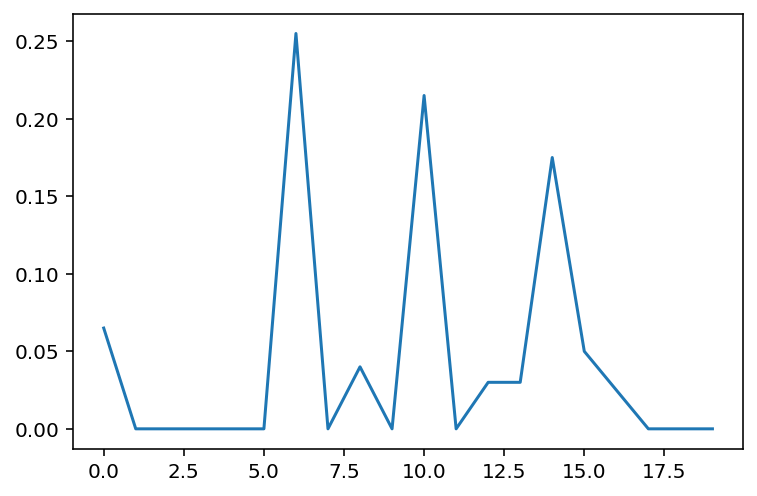

In [349]:
plt.plot(training_history['accuracy'])
plt.show()

In [350]:
# shot noise effects:
np.random.seed(42)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=10,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.01,
                                                                 record_error_signal=False)
summaries # print to keep for later

Acc: 2.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [13:47<00:00,  1.21it/s]


(array([ 1.7398964e-01, -1.9087212e+00, -9.5605665e-01, -1.9304838e-04,
         5.5885297e-01, -1.3622724e-01, -2.1654442e-01, -5.4137069e-01,
        -9.3463492e-01, -9.8591501e-01, -6.1357260e-01,  1.3626215e+00,
         3.1992871e-01, -2.4951663e+00, -8.6113727e-03], dtype=float32),
 array([ 0.53681886,  0.24902396,  0.9612665 ,  2.04834   , -0.23695691,
        -0.19324046,  1.8054364 ,  0.36778796, -0.7934848 ,  0.38877854,
        -0.4436767 , -0.70261765,  0.14425017, -1.8864635 , -1.6995517 ,
        -0.9171421 , -1.5138892 ,  0.08945958, -0.8548622 , -1.2054999 ,
         1.3627236 , -0.18703465,  0.9301636 , -1.3578175 , -0.36496574,
         0.27931297, -1.3443545 ,  0.17019486, -0.75480294, -0.46636194,
        -0.666513  ,  1.6319014 , -0.26802084, -1.0942606 ,  1.0582534 ,
        -0.37239358], dtype=float32),
 array([0.88062469, 0.86052469, 0.81326564, 0.79602865, 0.79979045,
        0.77049203, 0.72623869, 0.71146541, 0.70158554, 0.67212682,
        0.65493069, 0.6473

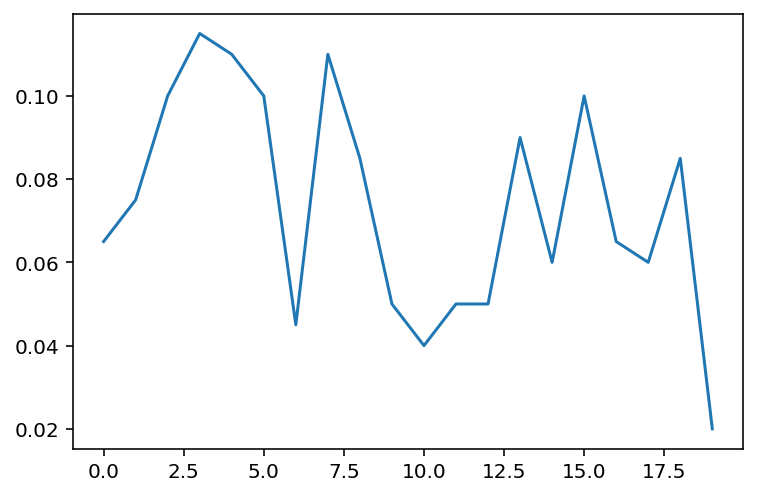

In [351]:
plt.plot(training_history['accuracy'])
plt.show()

In [352]:
# shot noise effects:
training_seed=43
np.random.seed(training_seed)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=100,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)
summaries # print to keep for later

Acc: 80.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [16:11<00:00,  1.03it/s]


(array([-1.3107513 ,  0.28809157, -1.5584456 ,  0.41799504,  0.11752415,
         0.8586102 ,  0.32315388,  1.2967688 , -1.6196584 , -0.7091352 ,
         0.05198956,  1.9028275 , -2.3894122 ,  0.64898664, -2.335923  ],
       dtype=float32),
 array([ 0.22305554, -0.97791374,  0.6248521 , -0.3189678 ,  0.3994042 ,
         0.87373424,  0.91442907,  3.2362237 ,  1.8306589 , -0.3221211 ,
         0.3586568 , -0.30156714, -1.6734294 , -0.00856537, -1.8633004 ,
        -0.9386085 ,  0.8514015 , -0.6639962 ,  0.23207629, -1.909101  ,
         0.31162316,  0.62975764,  1.144382  , -0.37325737, -0.23511009,
         2.2276    , -1.6635101 ,  1.8448493 ,  0.6589784 ,  0.68746847,
        -0.29233715,  0.25004926,  0.621571  , -0.4882676 , -0.98474115,
         3.1943529 ], dtype=float32),
 array([0.71109656, 0.70171831, 0.68815004, 0.68643825, 0.67603702,
        0.67020516, 0.65982448, 0.65447617, 0.63795071, 0.61992225,
        0.61569915, 0.59062323, 0.56184459, 0.51918273, 0.4669719 ,
    

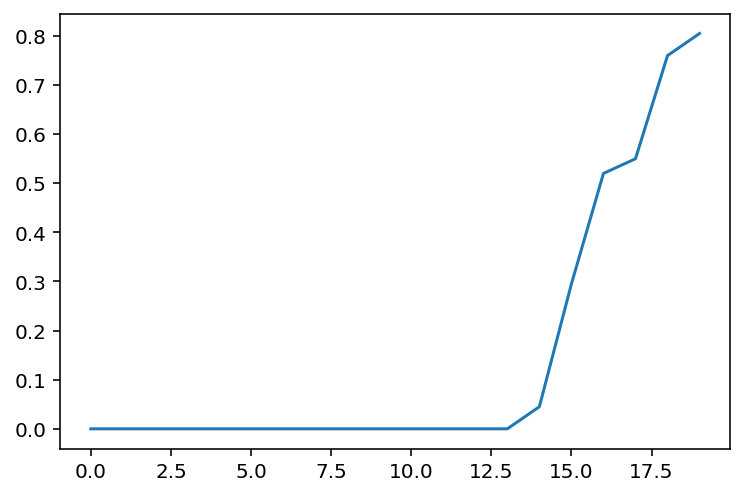

In [353]:
plt.plot(training_history['accuracy'])
plt.show()

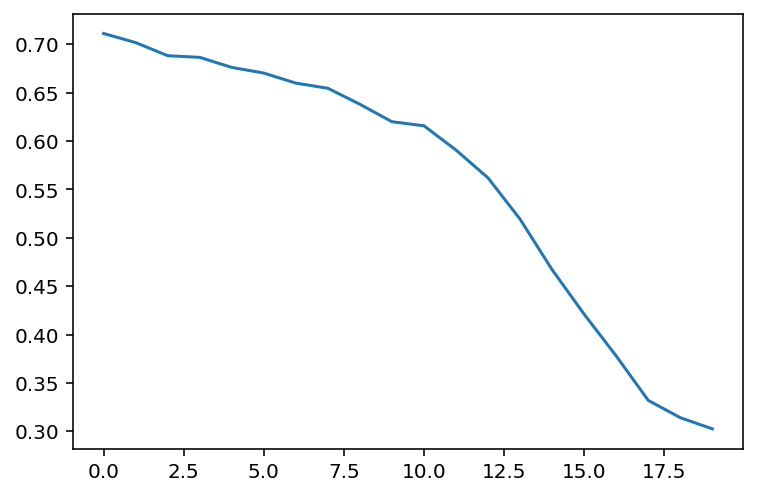

In [354]:
plt.plot(training_history['cost'])
plt.show()

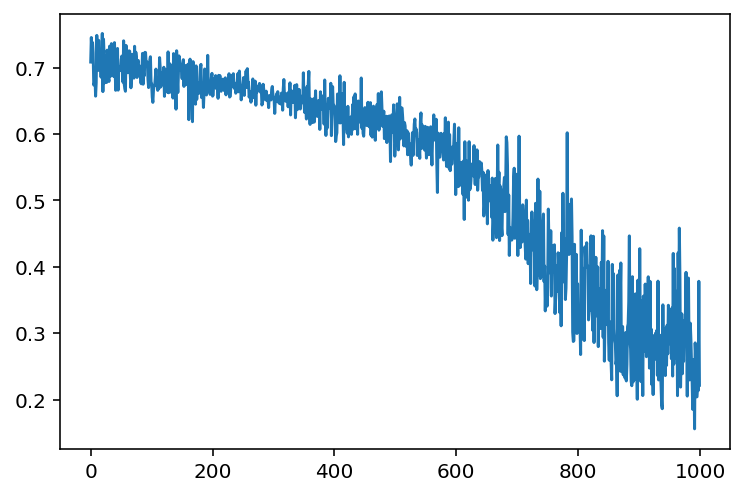

In [355]:
plt.plot(training_history['training_cost'])
plt.show()

In [358]:
histories={}

In [359]:
histories[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

In [360]:
# shot noise effects:
training_seed=44
np.random.seed(training_seed)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=100,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)
summaries # print to keep for later

Acc: 89.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [30:21<00:00,  1.82s/it]


(array([-0.15253893, -1.6152081 , -2.3156493 , -0.83882886, -1.0391575 ,
        -0.15502733,  0.43462932, -1.7189403 ,  0.44565877,  0.1348177 ,
         0.14945067,  1.300376  ,  2.0864067 ,  1.5314952 , -0.76625764],
       dtype=float32),
 array([-1.1084203 ,  1.0789376 ,  1.7431858 , -1.0896603 , -1.6442772 ,
         0.6657419 ,  1.7221099 ,  0.51436955, -0.43302253,  0.5774101 ,
        -0.7586462 , -1.9073452 , -0.9744637 ,  0.04809623, -0.8549806 ,
        -0.36793482,  0.2860245 , -2.6592567 ,  0.04300336, -1.1580304 ,
        -0.07211192, -0.8843403 , -1.4817778 , -0.49132106, -1.3362666 ,
         2.5102391 , -1.8226204 ,  0.23103556,  0.1716162 , -0.34827968,
        -0.141049  ,  0.11923026,  3.0386133 ,  0.23548128,  0.71436596,
         0.3277897 ], dtype=float32),
 array([0.78921332, 0.75890475, 0.73587751, 0.68095933, 0.59214436,
        0.51896376, 0.51560587, 0.4622124 , 0.41825311, 0.36700715,
        0.35577416, 0.29928258, 0.32011681, 0.26336046, 0.23911485,
    

In [361]:
histories[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

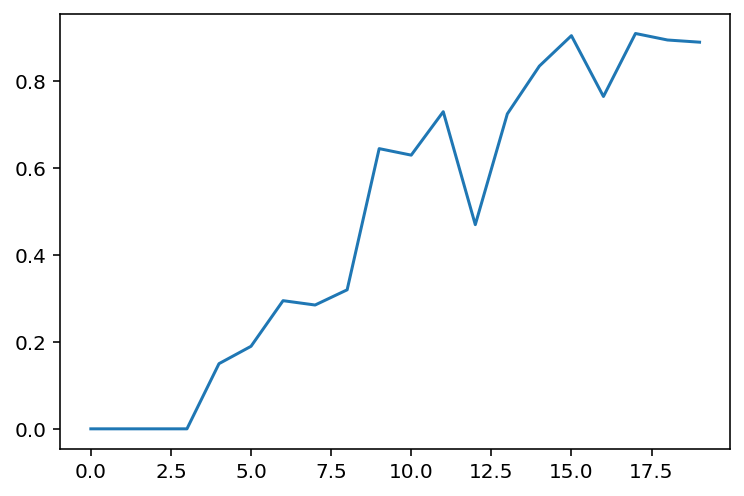

In [362]:
plt.plot(training_history['accuracy'])
plt.show()

In [363]:
histories.keys()

dict_keys([43, 44])

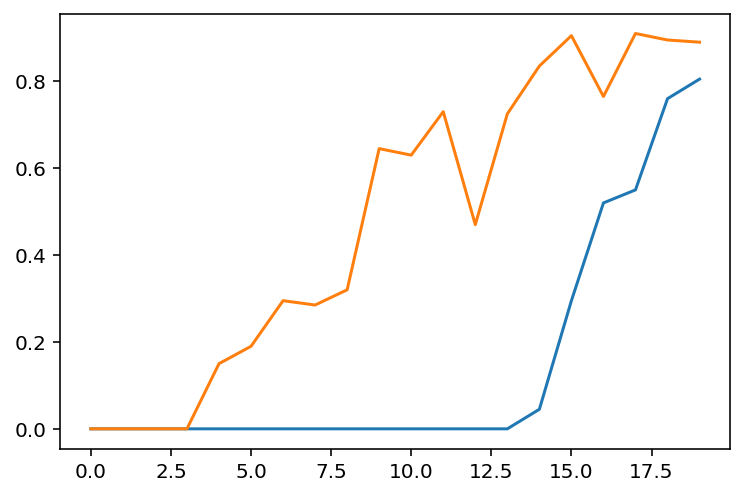

In [364]:
for idx in histories:
    plt.plot(histories[idx][1])
plt.show()

In [365]:
# shot noise effects:
training_seed=45
np.random.seed(training_seed)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=100,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)

Acc: 92.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [16:47<00:00,  1.01s/it]


In [366]:
histories[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

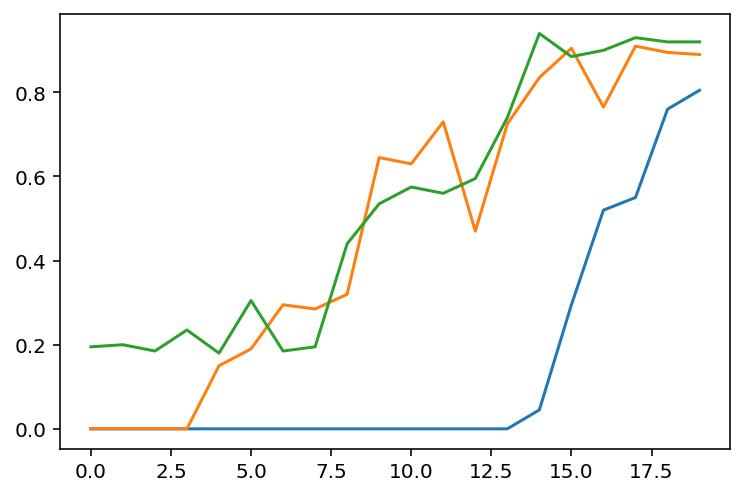

In [367]:
for idx in histories:
    plt.plot(histories[idx][1])
plt.show()

In [368]:
# shot noise effects:
training_seed=48
np.random.seed(training_seed)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=100,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)

Acc: 60.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [16:30<00:00,  1.01it/s]


In [369]:
histories[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

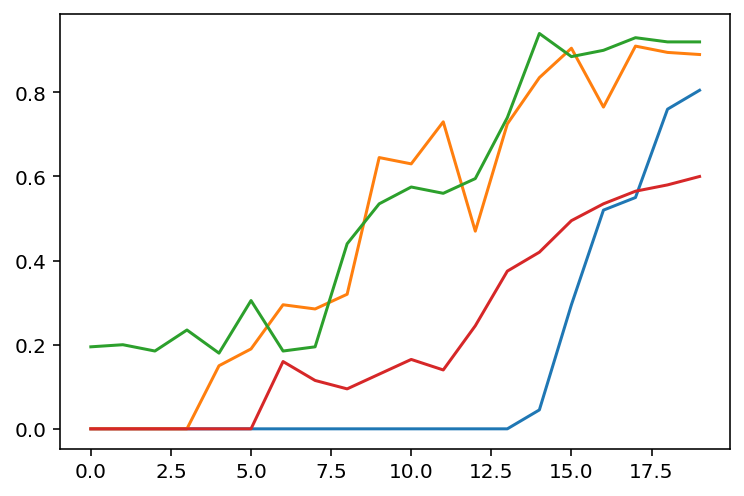

In [370]:
for idx in histories:
    plt.plot(histories[idx][1])
plt.show()

In [371]:
histories # print to save for later

{43: ([0.711096564563647,
   0.7017183132735854,
   0.6881500430207912,
   0.6864382540692336,
   0.6760370165102729,
   0.6702051589380802,
   0.6598244783382693,
   0.6544761707884877,
   0.6379507052434493,
   0.6199222494539137,
   0.6156991472924358,
   0.5906232275412923,
   0.5618445906739694,
   0.5191827283596978,
   0.46697189836081365,
   0.42097389491691417,
   0.3778777425754044,
   0.33194830700718225,
   0.3140802555728441,
   0.3025466621480011],
  [0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.045,
   0.295,
   0.52,
   0.55,
   0.76,
   0.805],
  [0.7083143107247855,
   0.7452105277241606,
   0.7220113012341357,
   0.7376103705671453,
   0.7219280508748734,
   0.6736081575459734,
   0.6759179677192031,
   0.6873900471331191,
   0.6569321601715888,
   0.6770735240644905,
   0.7483984986041199,
   0.7016361703322185,
   0.6955150425230832,
   0.7410169911846335,
   0.7100519522785605,
   0.7014087200322

###### Now several training runs for M=10

In [372]:
histories_M10={}

In [373]:
# shot noise effects:
training_seed=48
np.random.seed(training_seed)
summaries,phase_sensor,training_history=try_phase_sensor_training(optimizer=optax.sgd,
                                                                 test_step=50,
                                                                 finite_nudging=0.1,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=1000,
                                                                  M_msmt_samples=10,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=0.1,
                                                                 record_error_signal=False)


Acc: 19.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [14:33<00:00,  1.14it/s]


In [374]:
histories_M10[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

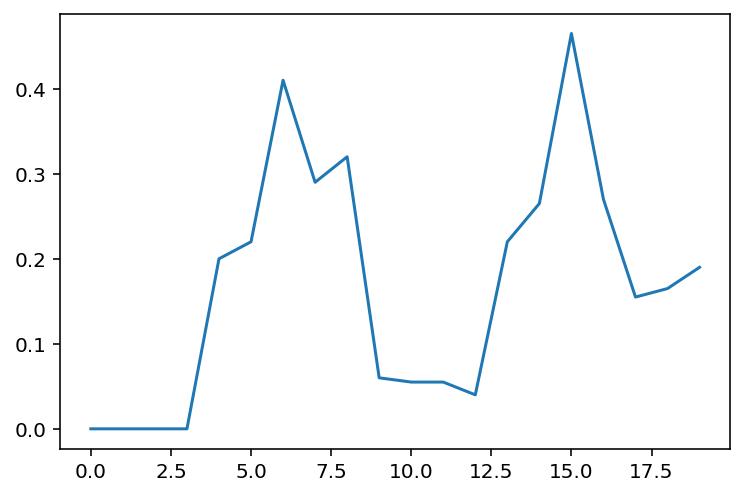

In [375]:
for idx in histories_M10:
    plt.plot(histories_M10[idx][1])
plt.show()

In [57]:
# shot noise effects:
def try_run_shotnoise(training_seed,M,optimizer=optax.sgd, learning_rate=0.1,
                     num_batches=1000,finite_nudging=0.1):
    np.random.seed(training_seed)
    return try_phase_sensor_training(optimizer=optimizer,
                                                                 test_step=50,
                                                                 finite_nudging=finite_nudging,
                                                                 check_nudging_accuracy=False,
                                                                  check_shot_noise_influence=False,
                                                             num_batches=num_batches,
                                                                  M_msmt_samples=M,
                                                                 symmetric_nudging=True,
                                                                 learning_rate=learning_rate,
                                                                 record_error_signal=False)


In [377]:
summaries,phase_sensor,training_history=try_run_shotnoise(47,10)

Acc: 0.5 %: 100%|██████████████████████████████████████████████| 1000/1000 [14:34<00:00,  1.14it/s]


In [378]:
histories_M10[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

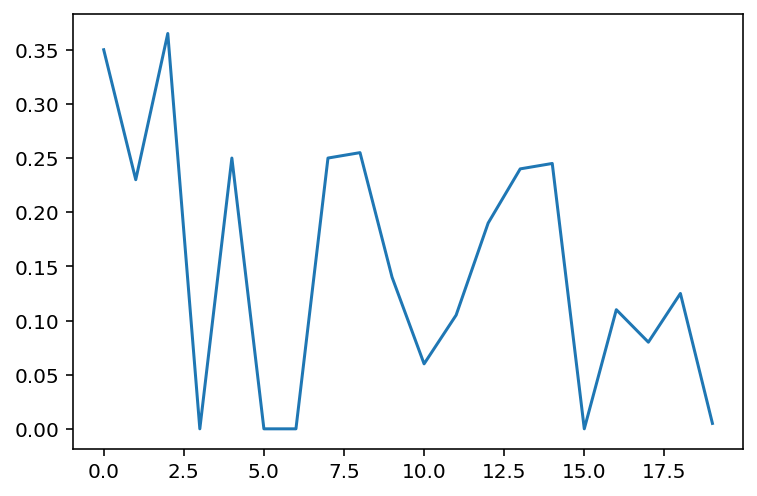

In [379]:
for idx in histories_M10:
    plt.plot(histories_M10[idx][1])
plt.show()

In [380]:
summaries,phase_sensor,training_history=try_run_shotnoise(46,10)

Acc: 47.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [13:58<00:00,  1.19it/s]


In [381]:
histories_M10[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

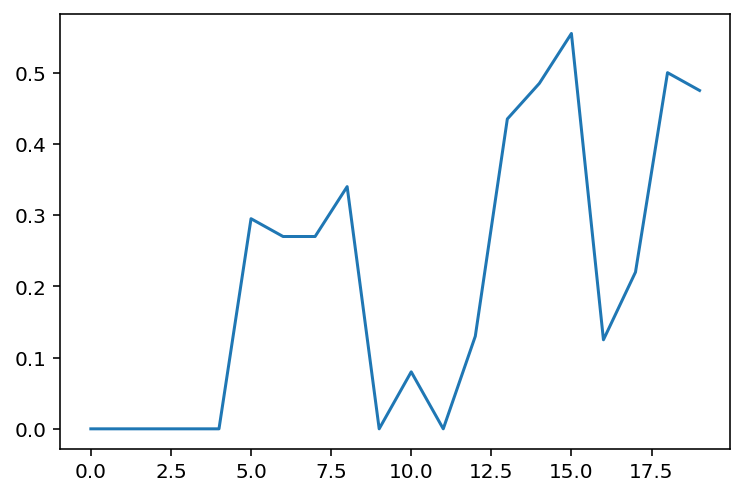

In [382]:
for idx in histories_M10:
    plt.plot(histories_M10[idx][1])
plt.show()

In [383]:
summaries,phase_sensor,training_history=try_run_shotnoise(45,10)

Acc: 0.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [13:06<00:00,  1.27it/s]


In [384]:
histories_M10[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

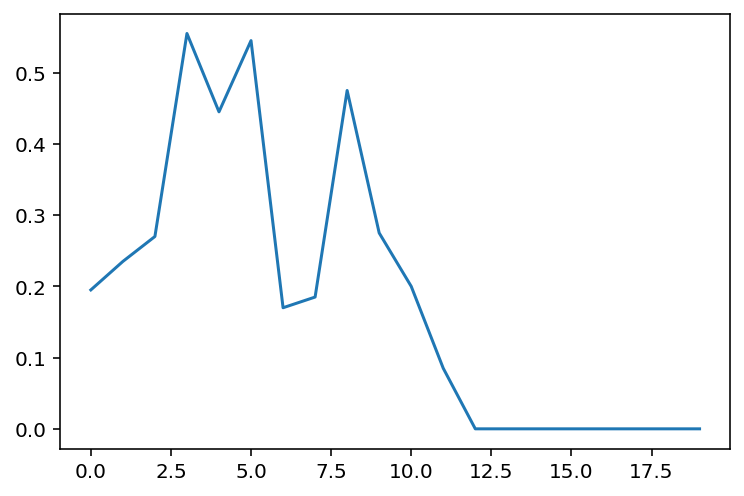

In [385]:
for idx in histories_M10:
    plt.plot(histories_M10[idx][1])
plt.show()

Acc: 30.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [13:31<00:00,  1.23it/s]


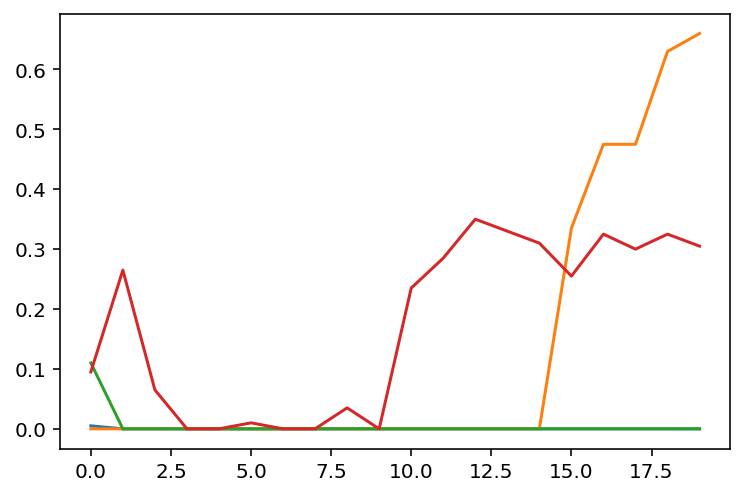

In [386]:
histories_M25={}
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,25)
    histories_M25[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in histories_M25:
    plt.plot(histories_M25[idx][1])
plt.show()

Acc: 30.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [13:11<00:00,  1.26it/s]


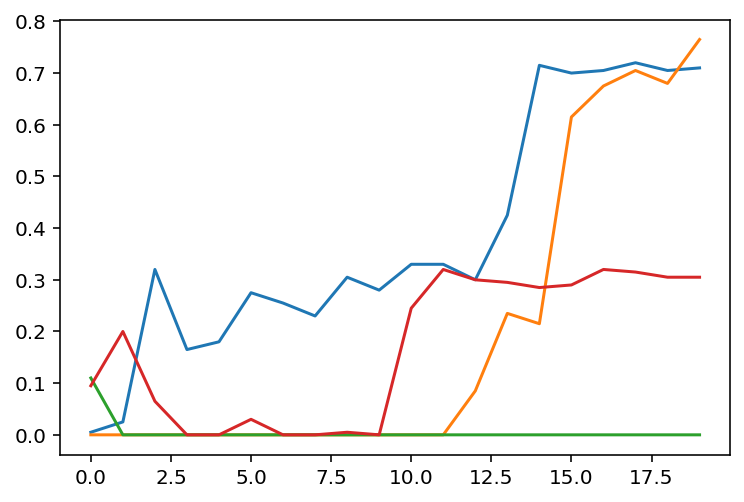

In [387]:
histories_M100={}
current_hist=histories_M100
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,100)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 89.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [15:11<00:00,  1.10it/s]


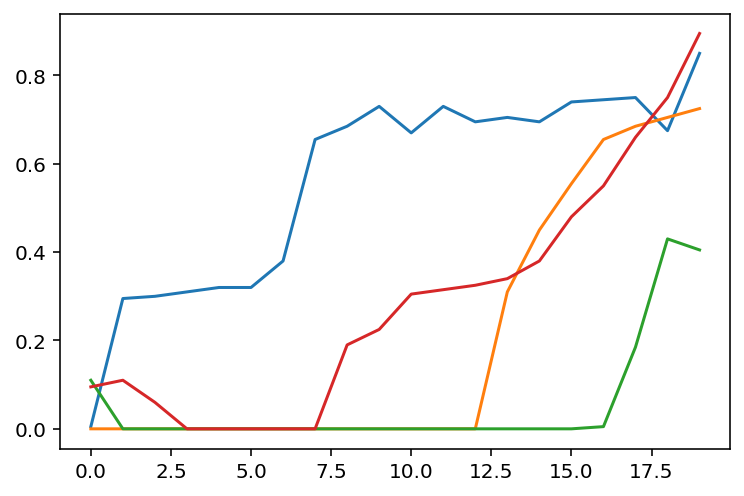

In [388]:
histories_M1000={}
current_hist=histories_M1000
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,1000)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 67.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [13:13<00:00,  1.26it/s]


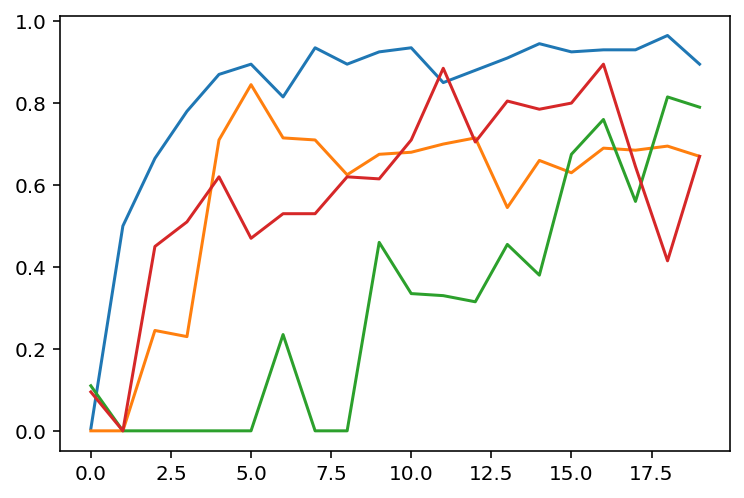

In [392]:
histories_adam_M1000={}
current_hist=histories_adam_M1000
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,1000,optimizer=optax.adam)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 32.0 %: 100%|█████████████████████████████████████████████| 1000/1000 [13:07<00:00,  1.27it/s]


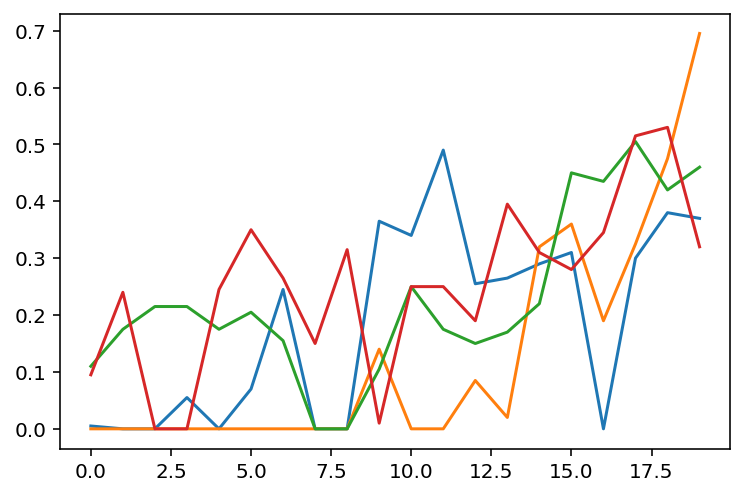

In [393]:
histories_adam_M100={}
current_hist=histories_adam_M100
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,100,optimizer=optax.adam)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 0.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [13:11<00:00,  1.26it/s]


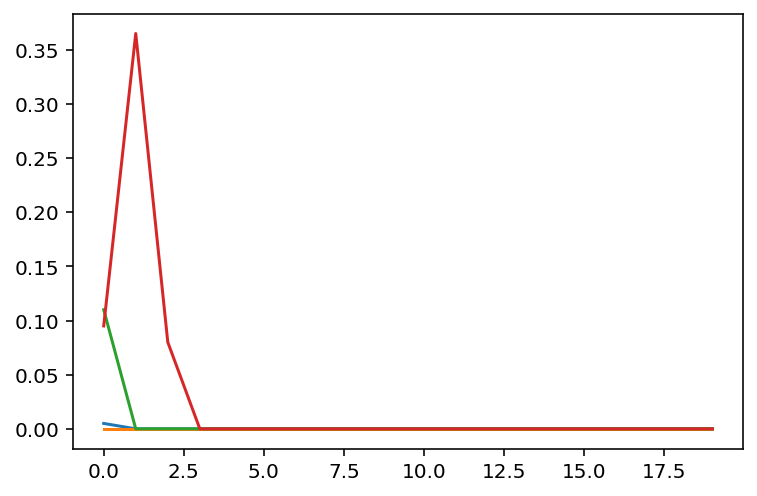

In [394]:
histories_adam_M10={}
current_hist=histories_adam_M10
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,10,optimizer=optax.adam)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 0.0 %: 100%|███████████████████████████████████████████| 1000/1000 [12:43:46<00:00, 45.83s/it]


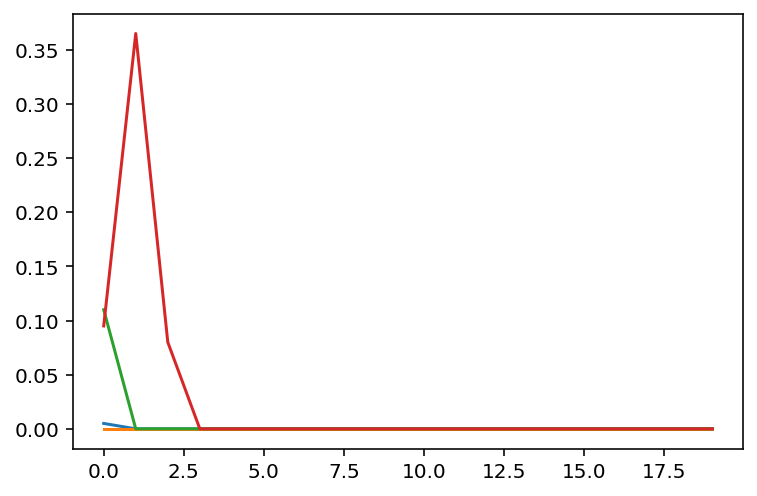

In [395]:
histories_adam_M25={}
current_hist=histories_adam_M25
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,10,optimizer=optax.adam)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 0.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [16:36<00:00,  1.00it/s]


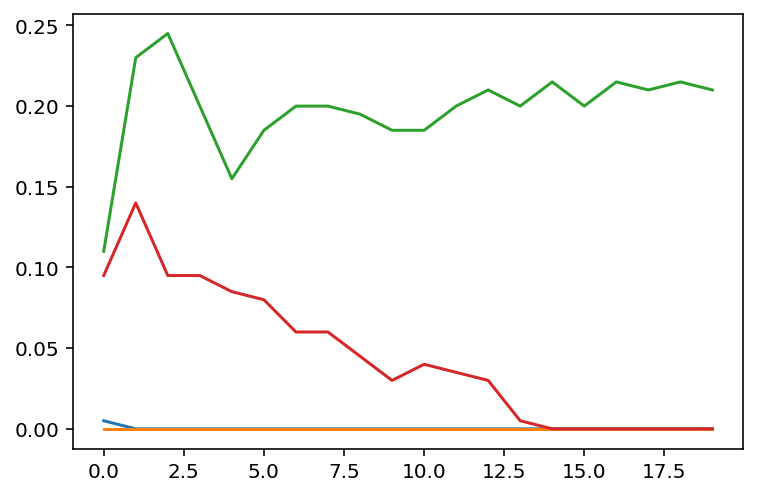

In [398]:
histories_adam_M25_lr01={}
current_hist=histories_adam_M25_lr01
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,10,optimizer=optax.adam, learning_rate=0.01)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 22.5 %: 100%|█████████████████████████████████████████████| 1000/1000 [11:58<00:00,  1.39it/s]


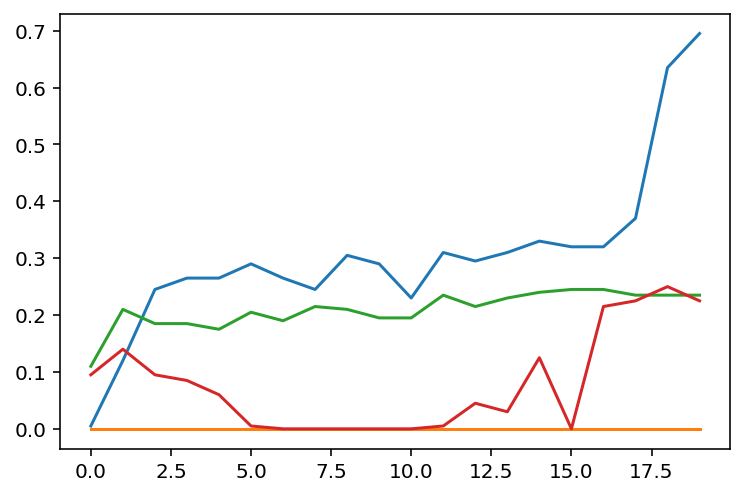

In [399]:
histories_adam_M100_lr01={}
current_hist=histories_adam_M100_lr01
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,100,optimizer=optax.adam, learning_rate=0.01)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 0.0 %: 100%|██████████████████████████████████████████████| 1000/1000 [33:03<00:00,  1.98s/it]


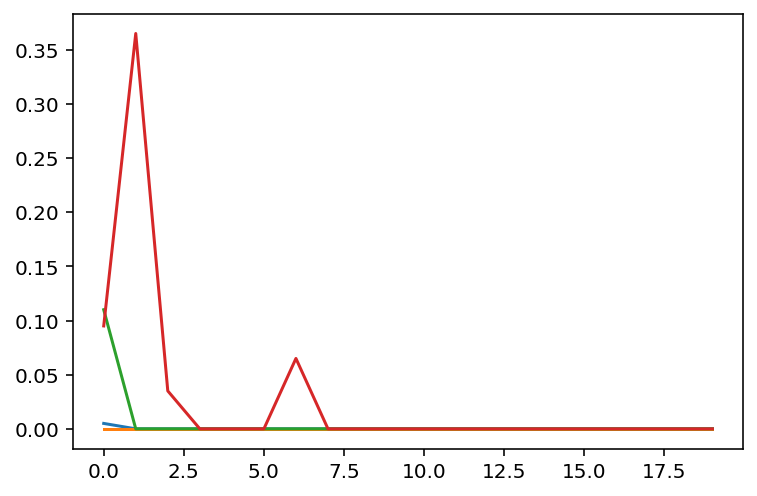

In [400]:
histories_adam_M25={}
current_hist=histories_adam_M25
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,25,optimizer=optax.adam)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 61.5 %: 100%|██████████████████████████| 1000/1000 [22:07<00:00,  1.33s/it]


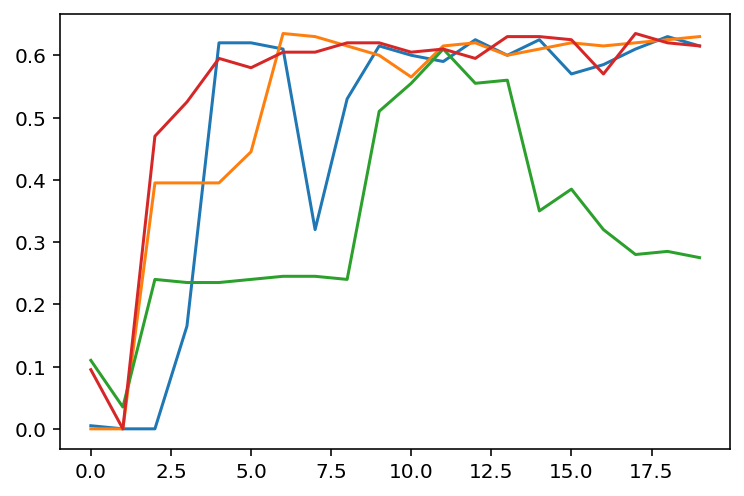

In [60]:
histories_adam_M25_nudge_0_2={}
current_hist=histories_adam_M25_nudge_0_2
for training_seed in np.arange(4):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,25,
                                                              optimizer=optax.adam,finite_nudging=0.2)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

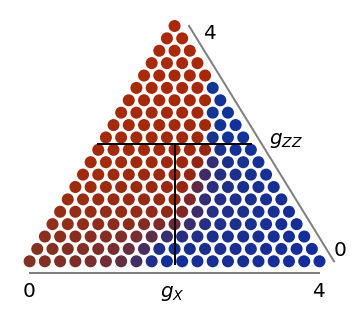

In [63]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

rgb_values=y_pred_grid
plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,rgb_values,show=False)
#plt.savefig("/tmp/results_clusterIsing_trainPatches_grid_finite_nudging.pdf")

In [65]:
histories_adam_M1000_nudge_0_2={}
current_hist=histories_adam_M1000_nudge_0_2
for training_seed in np.arange(1):
    summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,1000,
                                                              optimizer=optax.adam,finite_nudging=0.2)
    current_hist[training_seed]=(training_history['cost'],training_history['accuracy'],training_history['training_cost'])

for idx in current_hist:
    plt.plot(current_hist[idx][1])
plt.show()

Acc: 0.5 %:   1%|▏                           | 8/1000 [00:52<1:49:30,  6.62s/it]


KeyboardInterrupt: 

## Testing shot noise influence on gradients

In [20]:
training_seed=42
summaries,phase_sensor,training_history=try_run_shotnoise(training_seed,25,
                                                          optimizer=optax.adam, num_batches=20)


2024-05-25 13:34:21.316159: W pjrt_plugin/src/mps_client.cc:535] WARNING: JAX Apple GPU support is experimental and not all JAX functionality is correctly supported!


Metal device set to: Apple M1


Acc: 6.5 %: 100%|███████████████████████████████| 20/20 [00:22<00:00,  1.12s/it]


In [29]:
batch_size=10
training_samples=sample_batch_cluster_Ising_phase_sensor(batch_size)

def get_grad(M,nudge):
    return train_phase_sensor(phase_sensor,None,
                       cost_function_mse,grad_cost_function_mse,
                       learning_rate=0.1,batch_size=batch_size,num_batches=1,
                       test_samples=None,test_step=None,
                       SMALL_NUMBER=1e-8,nonsparse=False,
                      finite_nudging=nudge,shot_noise=M,
                      check_nudging_accuracy=False,
                      symmetric_nudging=True,
                      check_shot_noise_influence=False,
                      record_error_signal=False,
                      return_gradient=True,
                      training_samples=training_samples,
                      no_progress_bar=True)

In [37]:
nudge=0.1
grads=[]
for M in [10,25,100,1000]:
    print(M)
    reference_grad=get_grad(None,nudge)
    for shot in range(10):
        thegrad=get_grad(M,nudge)
        overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
        grads.append([M,overlap])

10
25
100
1000


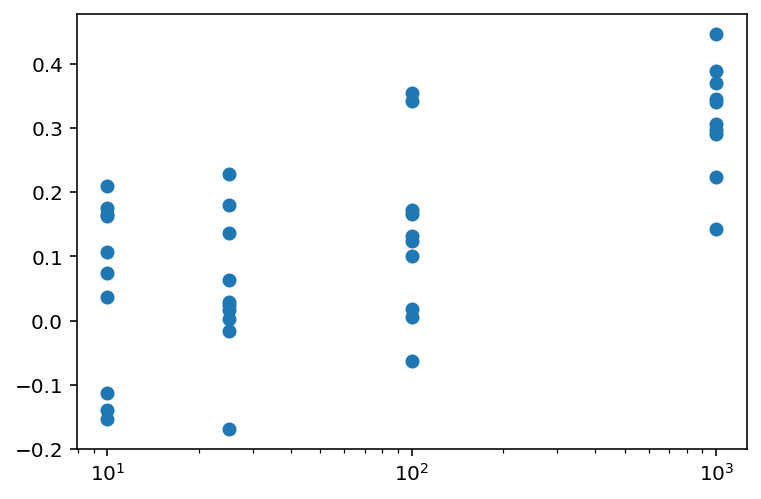

In [36]:
grads_array=np.array(grads)
plt.scatter(grads_array[:,0],grads_array[:,1])
plt.xscale('log')
plt.show()

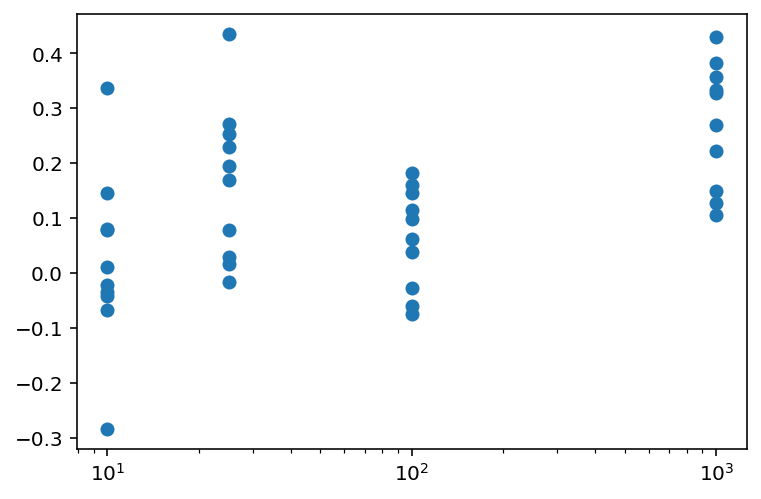

In [38]:
grads_array=np.array(grads)
plt.scatter(grads_array[:,0],grads_array[:,1])
plt.xscale('log')
plt.show()

In [39]:
nudge=0.1
grads=[]
for M in [25]:
    print(M)
    reference_grad=get_grad(None,nudge)
    for shot in range(50):
        thegrad=get_grad(M,nudge)
        overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
        grads.append([M,overlap])

25


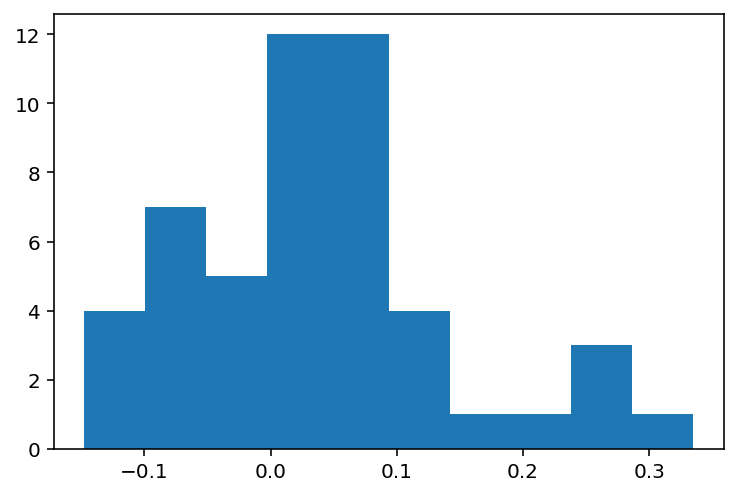

In [40]:
grads_array=np.array(grads)
plt.hist(grads_array[:,1])
plt.show()

In [41]:
nudge=0.1
grads=[]
for M in [25]:
    print(M)
    reference_grad=get_grad(None,nudge)
    for shot in range(200):
        thegrad=get_grad(M,nudge)
        overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
        grads.append([M,overlap])

25


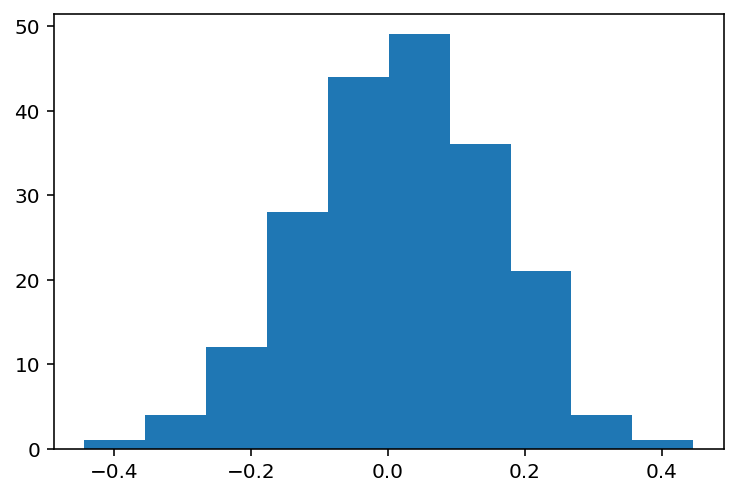

In [42]:
grads_array=np.array(grads)
plt.hist(grads_array[:,1])
plt.show()

In [43]:
nudge=0.1
grads=[]
for M in [25]:
    print(M)
    reference_grad=get_grad(None,nudge)
    for shot in range(200):
        thegrad=get_grad(M,nudge)
        overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
        grads.append([M,overlap])

25


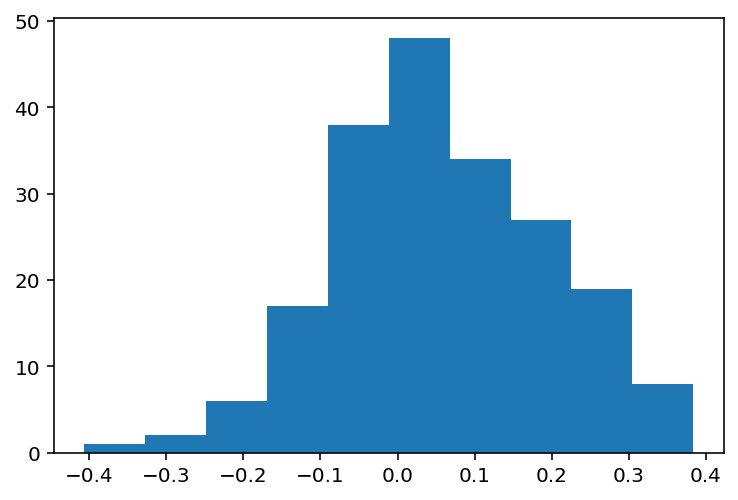

In [44]:
grads_array=np.array(grads)
plt.hist(grads_array[:,1])
plt.show()

In [45]:
nudge=0.1
grads=[]
for M in [100]:
    print(M)
    reference_grad=get_grad(None,nudge)
    for shot in range(200):
        thegrad=get_grad(M,nudge)
        overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
        grads.append([M,overlap])

100


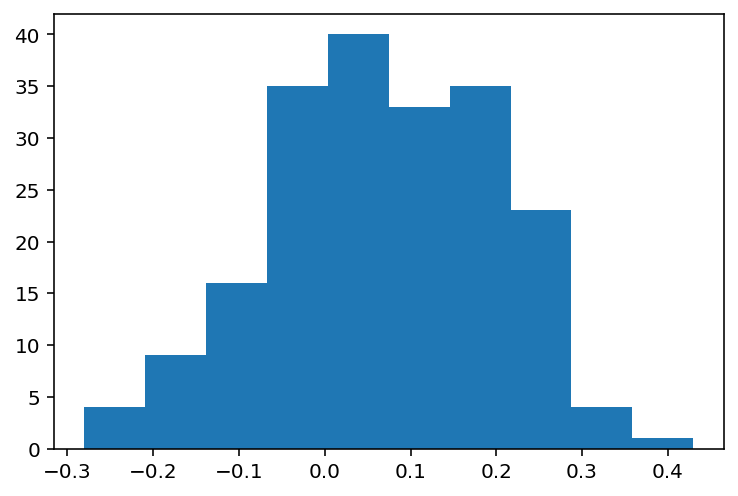

In [46]:
grads_array=np.array(grads)
plt.hist(grads_array[:,1])
plt.show()

In [50]:
nudges=[0.05,0.1,0.2]
Ms=[10,25,100,250,1000]
n_shots=200
overlaps=np.zeros((len(nudges),len(Ms),n_shots))

for idx_nudge,nudge in enumerate(nudges):
    print(nudge)
    for idx_M,M in tqdm(enumerate(Ms)):
        reference_grad=get_grad(None,nudge)
        for idx_shot in range(n_shots):
            thegrad=get_grad(M,nudge)
            overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
            overlaps[idx_nudge,idx_M,idx_shot]=overlap
        

0.05


5it [15:52, 190.48s/it]


0.1


5it [15:18, 183.67s/it]


0.2


5it [14:02, 168.52s/it]


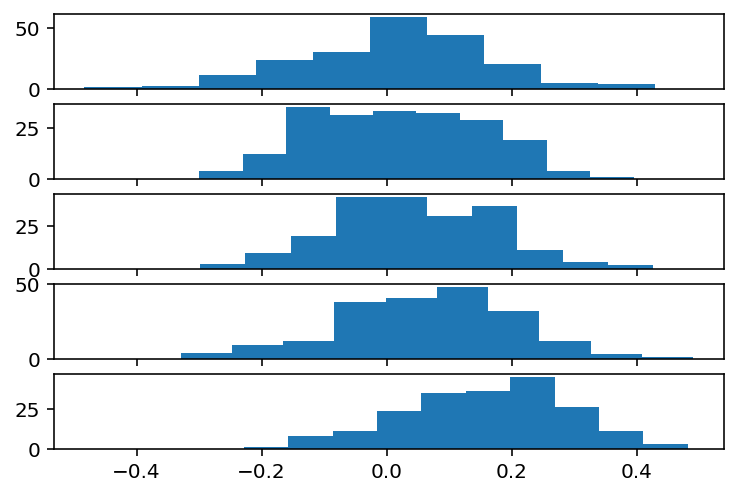

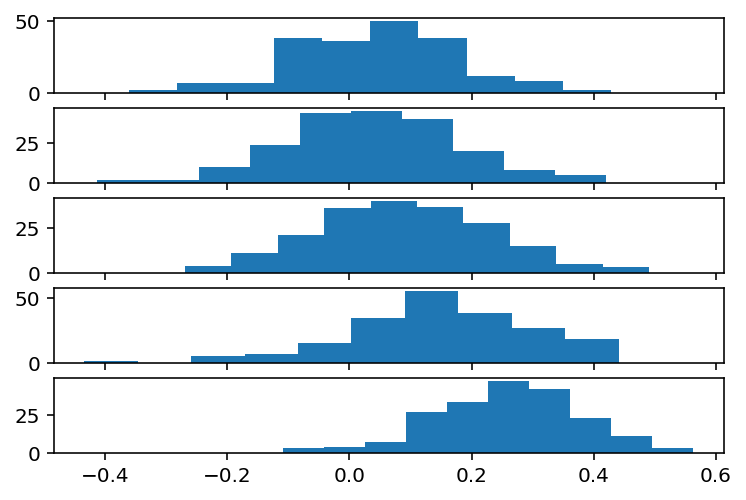

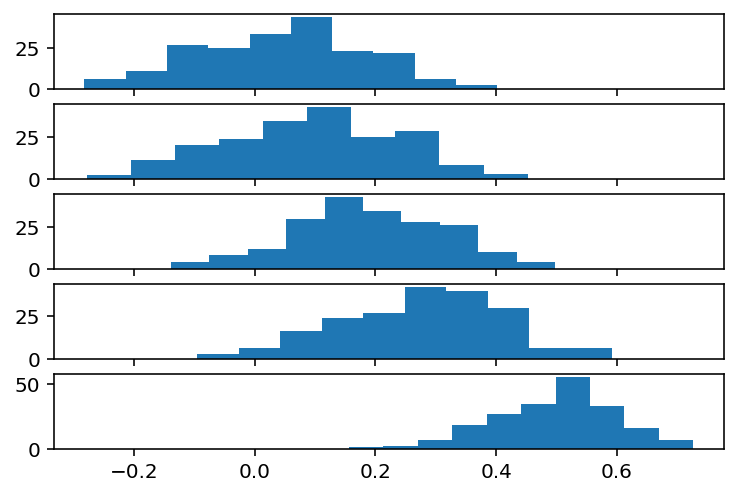

In [56]:
for n_idx in range(len(nudges)):
    fig,ax=plt.subplots(nrows=len(Ms),sharex=True)
    for m_idx in range(len(Ms)):
        ax[m_idx].hist(overlaps[n_idx,m_idx,:])
    plt.show()

In [58]:
phase_sensor

{'N_sys': 8,
 'N_sens': 2,
 'paulis': ([<1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class 'numpy.float64'>'
   	with 1024 stored elements in COOrdinate format>,
   <1024x1024 sparse matrix of type '<class

In [59]:
phase_sensor_old=phase_sensor.copy()

In [66]:
phase_sensor.keys()

dict_keys(['N_sys', 'N_sens', 'paulis', 'H0', 'H_x_terms', 'H_sys_sens_terms', 'H_sens_terms', 'H_theta_terms', 'output_terms', 'sys_sens_couplings', 'sens_couplings', 'optimizer', 'opt_state'])

In [69]:
len(phase_sensor['sys_sens_couplings']) + len(phase_sensor['sens_couplings'])

51

In [ ]:
plt.hist()

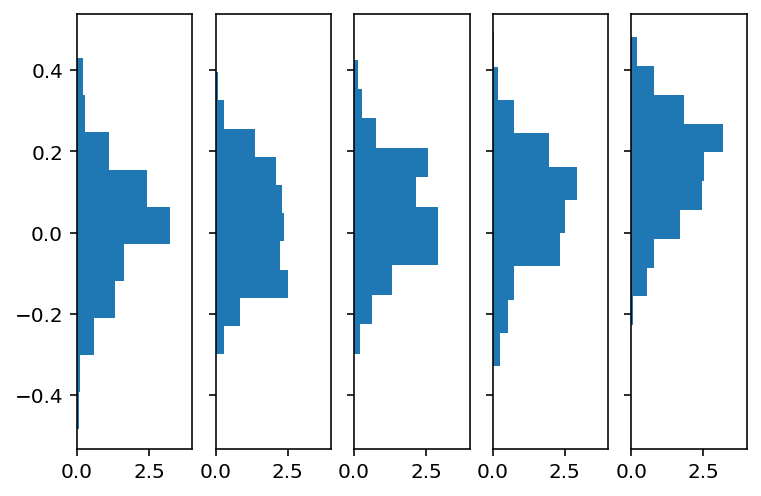

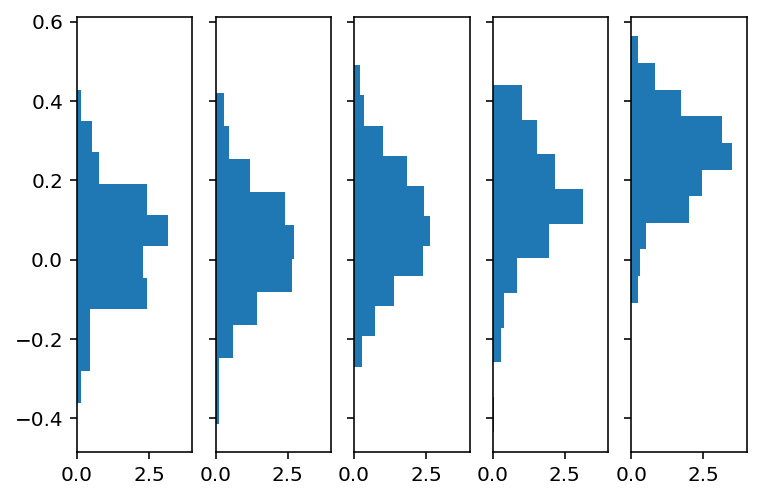

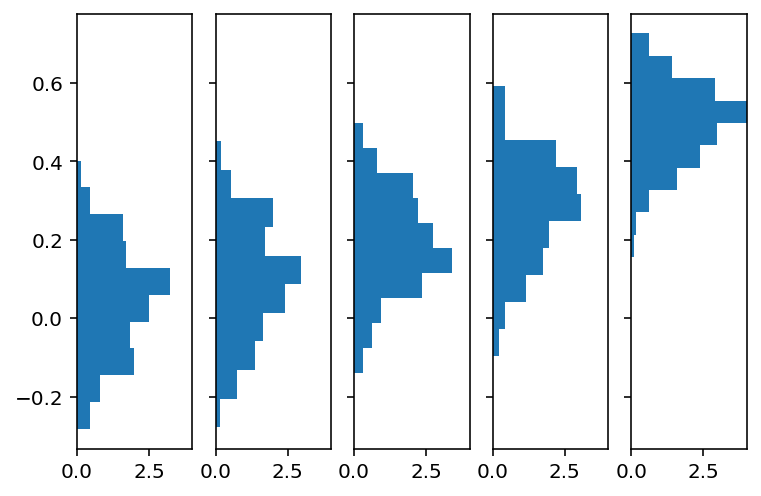

In [83]:
for n_idx in range(len(nudges)):
    fig,ax=plt.subplots(ncols=len(Ms),sharey=True)
    for m_idx in range(len(Ms)):
        ax[m_idx].hist(overlaps[n_idx,m_idx,:], orientation='horizontal', density=True)
        ax[m_idx].set_xlim(0,4.0)
    plt.show()

['10', '25', '100', '250', '1000']
['10', '25', '100', '250', '1000']


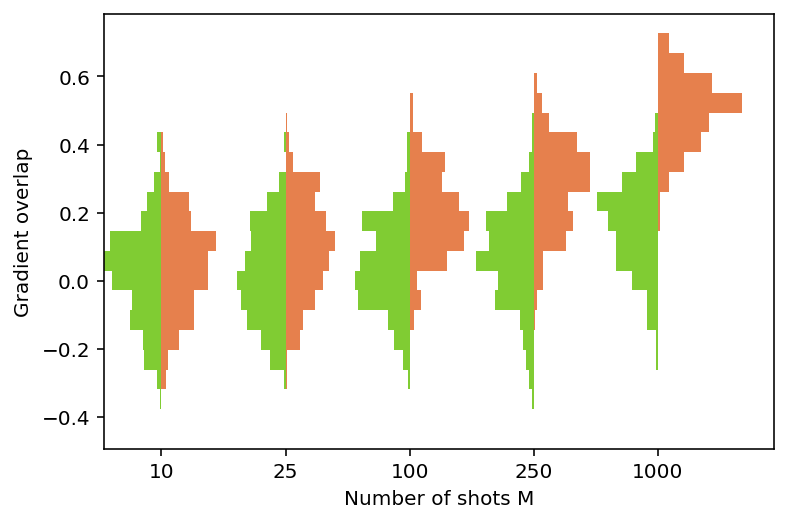

In [107]:
# compare two different nudgings, for all values of M
number_of_bins = 20

x_spacing = 80

# one range for everything
hist_range = (np.min(overlaps[1:,:,:]),np.max(overlaps[1:,:,:]))

x_locations = np.arange(len(Ms)) * x_spacing

fig, ax = plt.subplots()

color=[(0.5,0.8,0.2),(0.9,0.5,0.3)]

for idx,n_idx in enumerate([0,2]):
    data_sets = [overlaps[n_idx,m_idx,:] for m_idx in range(len(Ms))]
    labels = [str(m) for m in Ms]
    print(labels)
    
    # Computed quantities to aid plotting
    binned_data_sets = [
        np.histogram(d, range=hist_range, bins=number_of_bins)[0]
        for d in data_sets
    ]
    binned_maximums = np.max(binned_data_sets, axis=1)
    
    # The bin_edges are the same for all of the histograms
    bin_edges = np.linspace(hist_range[0], hist_range[1], number_of_bins + 1)
    heights = np.diff(bin_edges)
    centers = bin_edges[:-1] + heights / 2

    # Cycle through and plot each histogram
    for x_loc, binned_data in zip(x_locations, binned_data_sets):
        if idx==0:
              lefts = x_loc - binned_data
        else:
              lefts = x_loc
        ax.barh(centers, binned_data, height=heights, left=lefts,
               color=color[idx])

ax.set_xticks(x_locations, labels)

ax.set_ylabel("Gradient overlap")
ax.set_xlabel("Number of shots M")

plt.savefig("shot_noise_vs_nudge.pdf")

plt.show()

In [119]:
def get_overlap_vs_nudge(num_nudges=40,space_nudges=0.02):
    nudges=(1+np.arange(num_nudges))*space_nudges
    overlaps_pure_nudge=np.zeros((len(nudges),))

    reference_grad=get_grad(None,None)

    for idx_nudge,nudge in tqdm(enumerate(nudges)):
        thegrad=get_grad(None,nudge)
        overlap=np.sum(thegrad * reference_grad)/(np.linalg.norm(thegrad) * np.linalg.norm(reference_grad))
        overlaps_pure_nudge[idx_nudge]=overlap
    return nudges, overlaps_pure_nudge

In [113]:
nudges, overlaps_pure_nudge = get_overlap_vs_nudge()

0.02
0.04
0.06
0.08
0.1
0.12
0.14
0.16
0.18
0.2
0.22
0.24
0.26
0.28
0.3
0.32
0.34
0.36
0.38
0.4
0.42
0.44
0.46
0.48
0.5
0.52
0.54
0.56
0.58
0.6
0.62
0.64
0.66
0.68
0.7000000000000001
0.72
0.74
0.76
0.78
0.8


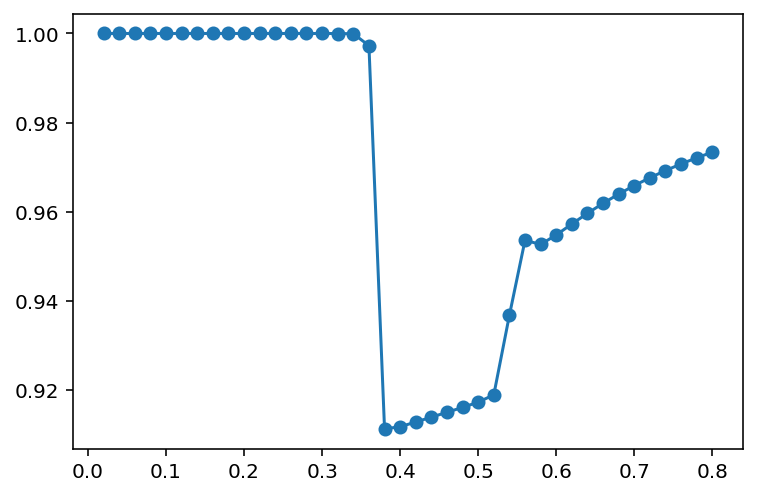

In [114]:
plt.plot(nudges,overlaps_pure_nudge,'-o')
plt.show()

In [116]:
batch_size=10
training_samples=sample_batch_cluster_Ising_phase_sensor(batch_size)

nudges, overlaps_pure_nudge = get_overlap_vs_nudge()

0.02
0.04
0.06
0.08
0.1
0.12
0.14
0.16
0.18
0.2
0.22
0.24
0.26
0.28
0.3
0.32
0.34
0.36
0.38
0.4
0.42
0.44
0.46
0.48
0.5
0.52
0.54
0.56
0.58
0.6
0.62
0.64
0.66
0.68
0.7000000000000001
0.72
0.74
0.76
0.78
0.8


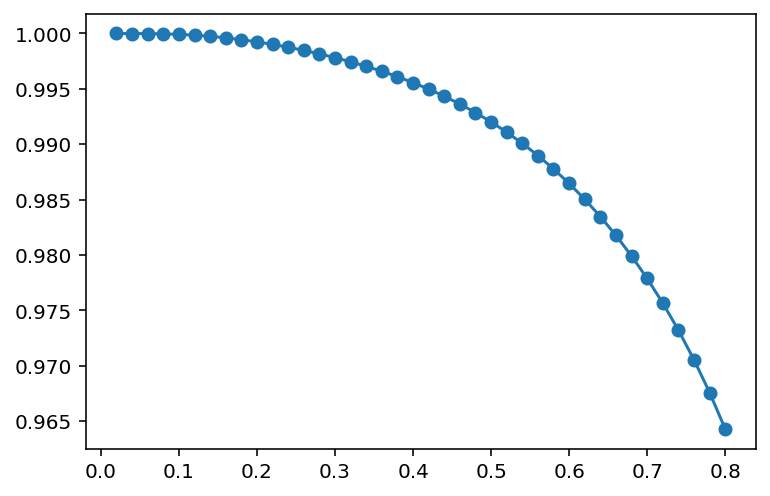

In [117]:
plt.plot(nudges,overlaps_pure_nudge,'-o')
plt.show()

In [120]:
batch_size=10
num_seeds=10
num_nudges=40
space_nudges=0.02
overlaps_pure_nudge=np.zeros((num_seeds,num_nudges))
for batch_seed in np.arange(num_seeds):
    np.random.seed(batch_seed)
    training_samples=sample_batch_cluster_Ising_phase_sensor(batch_size)

    nudges, overlaps_pure_nudge[batch_seed] = get_overlap_vs_nudge(num_nudges=num_nudges,
                                                                  space_nudges=space_nudges)
    

40it [00:31,  1.25it/s]
40it [00:33,  1.20it/s]
40it [00:30,  1.29it/s]
40it [00:40,  1.00s/it]
40it [00:33,  1.19it/s]
40it [00:33,  1.21it/s]
40it [00:32,  1.22it/s]
40it [00:28,  1.40it/s]
40it [00:32,  1.22it/s]
40it [00:28,  1.39it/s]


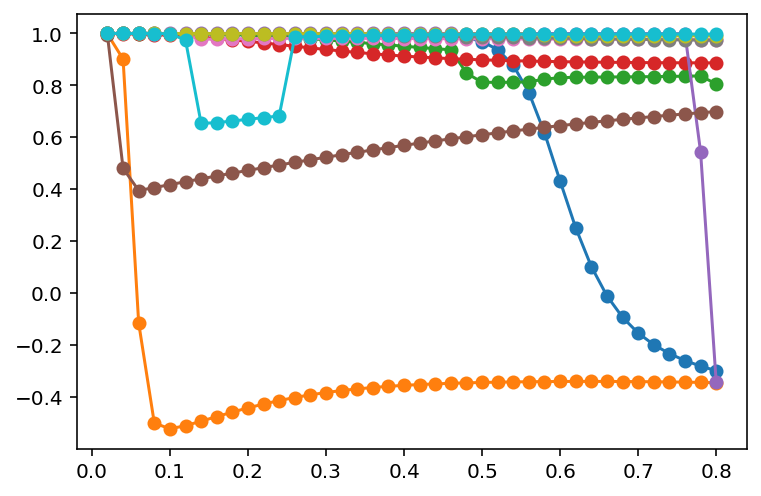

In [121]:
for batch_seed in np.arange(num_seeds):
    plt.plot(nudges,overlaps_pure_nudge[batch_seed],'-o')
plt.show()

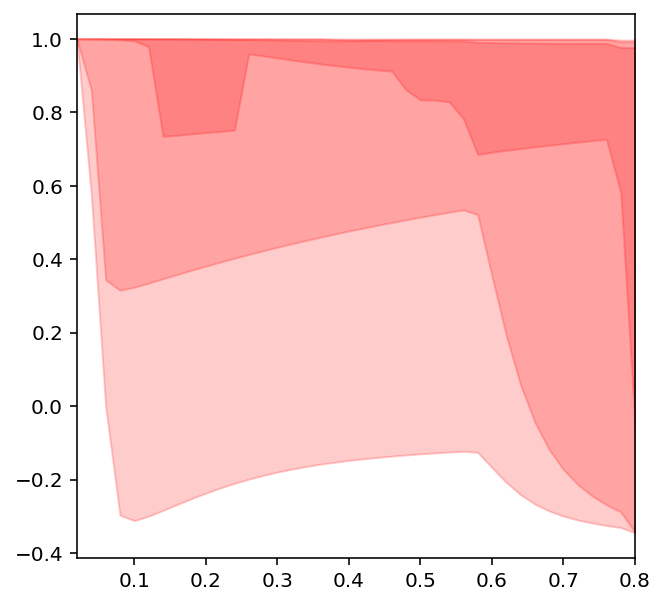

In [133]:
plt.figure(figsize=(5,5))

confidence_interval1 = 95
confidence_interval2 = 80
confidence_interval3 = 50
x = nudges

for ci in [confidence_interval1, confidence_interval2, confidence_interval3]:
    low = np.percentile(overlaps_pure_nudge, 50 - ci / 2, axis=0)
    high = np.percentile(overlaps_pure_nudge, 50 + ci / 2, axis=0)
    plt.fill_between(x, low, high, color='r', alpha=0.2)
plt.margins(x=0)
plt.savefig("overlap_dist_vs_nudge.pdf")
plt.show()

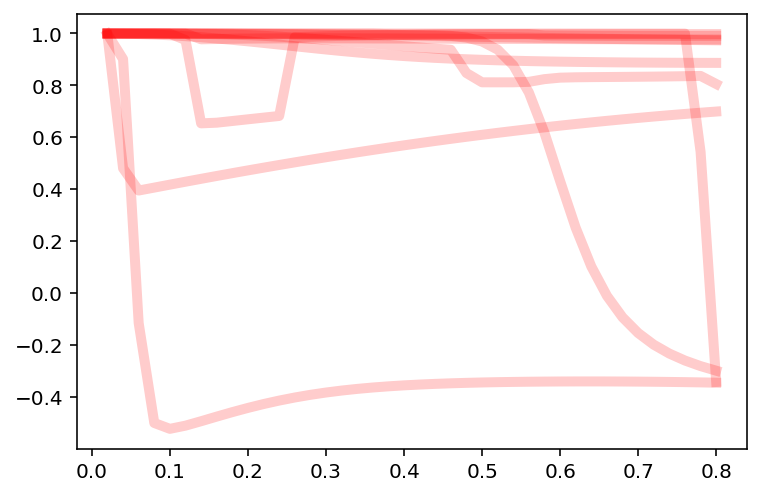

In [125]:
for batch_seed in np.arange(num_seeds):
    plt.plot(nudges,overlaps_pure_nudge[batch_seed], color='r', 
             linewidth=5,alpha=0.2)
plt.show()

# plotting some numerical results from cluster 

## 05_26_M1000_nudge0_2

In [127]:
array=np.array
accuracies_05_26=[array([0.005, 0.625, 0.71 , 0.85 , 0.91 , 0.905, 0.93 , 0.92 , 0.865,
       0.93 , 0.91 , 0.915, 0.895, 0.93 , 0.91 , 0.925, 0.9  , 0.87 ,
       0.905, 0.875]), array([0.   , 0.395, 0.385, 0.63 , 0.63 , 0.625, 0.64 , 0.94 , 0.85 ,
       0.855, 0.92 , 0.905, 0.935, 0.94 , 0.935, 0.9  , 0.8  , 0.8  ,
       0.955, 0.865]), array([0.11 , 0.52 , 0.86 , 0.92 , 0.935, 0.93 , 0.945, 0.93 , 0.935,
       0.925, 0.92 , 0.925, 0.87 , 0.9  , 0.925, 0.92 , 0.925, 0.93 ,
       0.9  , 0.885]), array([0.095, 0.505, 0.675, 0.9  , 0.89 , 0.925, 0.925, 0.88 , 0.895,
       0.93 , 0.89 , 0.905, 0.93 , 0.915, 0.94 , 0.905, 0.915, 0.91 ,
       0.895, 0.92 ]), array([0.   , 0.57 , 0.75 , 0.785, 0.73 , 0.74 , 0.745, 0.785, 0.77 ,
       0.81 , 0.715, 0.765, 0.745, 0.72 , 0.875, 0.865, 0.81 , 0.765,
       0.855, 0.745]), array([0.   , 0.705, 0.715, 0.74 , 0.745, 0.725, 0.755, 0.915, 0.945,
       0.915, 0.9  , 0.93 , 0.91 , 0.895, 0.9  , 0.92 , 0.93 , 0.915,
       0.92 , 0.945]), array([0.   , 0.615, 0.37 , 0.52 , 0.75 , 0.77 , 0.81 , 0.88 , 0.89 ,
       0.85 , 0.86 , 0.83 , 0.715, 0.915, 0.795, 0.775, 0.91 , 0.885,
       0.81 , 0.885]), array([0.25 , 0.695, 0.7  , 0.7  , 0.7  , 0.7  , 0.7  , 0.7  , 0.69 ,
       0.69 , 0.7  , 0.7  , 0.7  , 0.695, 0.7  , 0.7  , 0.7  , 0.69 ,
       0.7  , 0.7  ]), array([0.   , 0.64 , 0.65 , 0.895, 0.925, 0.92 , 0.895, 0.935, 0.915,
       0.915, 0.915, 0.935, 0.92 , 0.915, 0.9  , 0.915, 0.915, 0.905,
       0.925, 0.9  ]), array([0.   , 0.7  , 0.7  , 0.705, 0.705, 0.705, 0.705, 0.705, 0.69 ,
       0.89 , 0.795, 0.92 , 0.93 , 0.895, 0.93 , 0.925, 0.805, 0.83 ,
       0.89 , 0.93 ])]

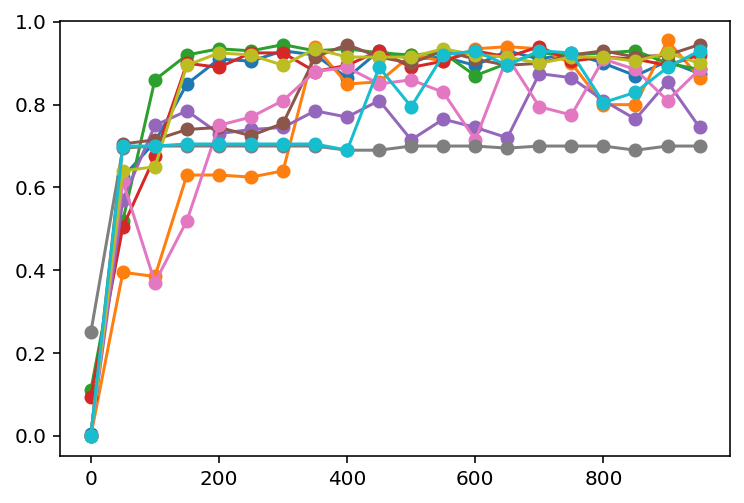

In [129]:
batch_axis=np.arange(20)*50

for acc in accuracies_05_26:
    plt.plot(batch_axis,acc, '-o')
    

## 05_27_test_gradient2

In [165]:
ov=np.array([[ 9.99999992e-01,  9.99999870e-01,  9.99999341e-01,
         9.99997900e-01,  9.99994820e-01,  9.99989116e-01,
         9.99979500e-01,  9.99964305e-01,  9.99941352e-01,
         9.99907714e-01,  9.99859249e-01,  9.99789600e-01,
         9.99687845e-01,  9.99532253e-01,  9.99271343e-01,
         9.98755054e-01,  9.97414915e-01,  9.92116626e-01,
         9.51279965e-01,  4.97915527e-01,  2.71674396e-01,
         2.69196530e-01,  2.70449130e-01,  2.72201330e-01,
         2.74134766e-01,  2.76180740e-01,  2.78322088e-01,
         2.80558173e-01,  2.82895798e-01,  2.85346405e-01,
         2.87925280e-01,  2.90651588e-01,  2.93548874e-01,
         2.96645914e-01,  2.99977948e-01,  3.03588345e-01,
         3.07530830e-01,  3.11872455e-01,  3.16697516e-01,
         3.22112678e-01],
       [ 9.99118331e-01,  9.87446518e-01,  9.54369373e-01,
         9.22217805e-01,  9.07855796e-01,  9.02442595e-01,
         9.00205403e-01,  8.99089822e-01,  8.98251109e-01,
         8.97236468e-01,  8.95721053e-01,  8.93405762e-01,
         8.89969379e-01,  8.85044325e-01,  8.78209578e-01,
         8.69004530e-01,  8.56971945e-01,  8.41736059e-01,
         8.23109742e-01,  8.01202680e-01,  7.76482229e-01,
         7.49741327e-01,  7.21965618e-01,  6.94144494e-01,
         6.67097574e-01,  6.41369226e-01,  6.17200142e-01,
         5.94550394e-01,  5.73137472e-01,  5.52458174e-01,
         5.31771159e-01,  5.10018932e-01,  4.85661689e-01,
         4.56387973e-01,  4.18693649e-01,  3.67513813e-01,
         2.96780400e-01,  2.02984153e-01,  9.23278188e-02,
        -1.72545759e-02],
       [ 9.86656463e-01,  9.73435540e-01,  6.31373860e-01,
         7.00638334e-01,  8.70909733e-01,  9.50471659e-01,
         9.48966606e-01,  9.45547869e-01,  9.45128069e-01,
         9.45042894e-01,  9.45104814e-01,  9.45221912e-01,
         9.45343615e-01,  9.45438801e-01,  9.45485064e-01,
         9.45463572e-01,  9.45356739e-01,  9.45147457e-01,
         9.44819350e-01,  9.44357758e-01,  9.43751134e-01,
         9.42992494e-01,  9.42080452e-01,  9.41019441e-01,
         9.39818949e-01,  9.38491898e-01,  9.37052536e-01,
         9.35514348e-01,  9.33888331e-01,  9.32181850e-01,
         9.30398030e-01,  9.28535593e-01,  9.26588962e-01,
         9.24548517e-01,  9.22400924e-01,  9.20129558e-01,
         9.17717994e-01,  9.65593943e-01,  9.64343902e-01,
         9.62951862e-01],
       [ 9.99993662e-01,  9.99901296e-01,  9.99517888e-01,
         9.98412146e-01, -1.58761885e-01, -9.24699238e-02,
        -3.18400291e-02, -8.94336874e-03,  4.08663892e-03,
         1.35315225e-02,  2.13578516e-02,  2.83419892e-02,
         3.49752322e-02,  4.16740623e-02,  4.88715212e-02,
         5.70857891e-02,  6.69884885e-02,  7.94670635e-02,
         9.56310896e-02,  1.16623154e-01,  1.43008934e-01,
         1.73753074e-01,  2.05701653e-01,  2.34874129e-01,
         2.58703998e-01,  2.76807247e-01,  2.90113114e-01,
         2.99851267e-01,  3.07070317e-01,  3.12538975e-01,
         3.16789133e-01,  3.20182928e-01,  3.22968026e-01,
         3.25316478e-01,  3.27350569e-01,  3.29159784e-01,
         3.30812051e-01,  3.32361371e-01,  3.33853250e-01,
         3.35328848e-01],
       [ 9.98275952e-01,  7.44465588e-01,  1.04770678e-02,
         1.02767723e-02,  1.35289887e-02,  1.67010722e-02,
         1.97241211e-02,  2.26421777e-02,  2.54927037e-02,
         2.82995019e-02,  3.10763994e-02,  3.38308908e-02,
         3.65666313e-02,  3.92850019e-02,  4.19860640e-02,
         4.46691352e-02,  4.73331336e-02,  4.99767839e-02,
         5.25987376e-02,  5.51976440e-02,  5.77721901e-02,
         6.03211221e-02,  6.28432566e-02,  6.53374844e-02,
         6.78027717e-02,  7.02381583e-02,  7.26427549e-02,
         7.50157393e-02,  7.73563534e-02,  7.96638982e-02,
         8.19377303e-02,  8.41772572e-02,  8.63819333e-02,
         8.85512550e-02,  9.06847559e-02,  9.27820026e-02,
         9.48425888e-02,  9.68661307e-02,  9.88522611e-02,
         1.00800623e-01],
       [ 9.99982282e-01,  9.99246950e-01,  9.08026809e-01,
         2.21117193e-01,  1.89537402e-01, -9.80740101e-02,
        -7.40492512e-02, -4.80121117e-02, -1.84021929e-02,
         2.11045369e-02,  8.35029008e-02,  1.60135034e-01,
         1.81768012e-01,  1.80236770e-01,  1.79254960e-01,
         1.79796698e-01,  1.81152905e-01,  1.82888353e-01,
         1.84780823e-01,  1.86717010e-01,  1.88638076e-01,
         1.90513282e-01,  1.92326935e-01,  1.94071676e-01,
         1.95744867e-01,  1.97346591e-01,  1.98878492e-01,
         2.00343092e-01,  2.01743381e-01,  2.03082564e-01,
         2.04363903e-01,  2.05590626e-01,  2.06765864e-01,
         2.07892621e-01,  2.08973752e-01,  2.10011959e-01,
         2.11009784e-01,  2.11969617e-01,  2.12893697e-01,
         2.13784118e-01],
       [ 9.68704658e-01,  4.74034786e-01,  5.39411472e-01,
         3.05658176e-01,  3.83578266e-01,  4.25740562e-01,
         4.48001213e-01,  4.60711755e-01,  4.68676824e-01,
         4.74093235e-01,  4.78031533e-01,  4.81055138e-01,
         4.83483011e-01,  4.85507947e-01,  4.87253545e-01,
         4.88803452e-01,  4.90217294e-01,  4.91539839e-01,
         4.92806568e-01,  4.94047271e-01,  4.95288524e-01,
         4.96555575e-01,  4.97873919e-01,  4.99270819e-01,
         5.00776938e-01,  5.02428298e-01,  5.04268799e-01,
         5.06353642e-01,  5.08754147e-01,  5.11564686e-01,
         5.14912853e-01,  5.18974445e-01,  5.23995405e-01,
         5.30322910e-01,  5.38445496e-01,  5.49031998e-01,
         5.62927871e-01,  5.80996426e-01,  6.03610756e-01,
         6.29765436e-01],
       [ 6.53441457e-01,  6.48581916e-01,  6.47455686e-01,
         6.46744323e-01,  6.46136744e-01,  6.45559954e-01,
         6.44988790e-01,  6.44412147e-01,  6.43824054e-01,
         6.43220698e-01,  6.42599248e-01,  6.41957329e-01,
         6.41292771e-01,  6.40603468e-01,  6.39887295e-01,
         6.39142059e-01,  6.38365466e-01,  6.37555091e-01,
         6.36708368e-01,  6.35822576e-01,  6.34894838e-01,
         6.33922134e-01,  6.32901318e-01,  6.31829166e-01,
         6.30702454e-01,  6.29518072e-01,  6.28273209e-01,
         6.26965624e-01,  6.25594041e-01,  6.24158718e-01,
         6.22662256e-01,  6.21110709e-01,  6.19515090e-01,
         6.17893321e-01,  6.16272613e-01,  6.14692103e-01,
         6.13205220e-01,  6.11880756e-01,  6.10800878e-01,
         6.10053903e-01],
       [ 8.42496041e-01,  5.95035474e-01,  5.76003825e-01,
         5.81129004e-01,  5.85521252e-01,  5.89176454e-01,
         5.92154381e-01,  5.94415468e-01,  5.95729143e-01,
         5.95471528e-01,  5.92103433e-01,  5.81940251e-01,
         5.58853474e-01,  5.27820208e-01,  5.09487498e-01,
         5.04386159e-01,  5.04989888e-01,  5.07708539e-01,
         5.11151239e-01,  5.14667981e-01,  5.17908159e-01,
         5.20713935e-01,  5.23063989e-01,  5.25011387e-01,
         5.26633142e-01,  5.28002607e-01,  5.29179607e-01,
         5.30209617e-01,  5.31126141e-01,  5.31953603e-01,
         5.32709829e-01,  5.33407923e-01,  5.34057618e-01,
         5.34666229e-01,  5.35239318e-01,  5.35781157e-01,
         5.36295058e-01,  5.36783594e-01,  5.37248765e-01,
         5.37692105e-01],
       [ 9.99003160e-01,  3.58099441e-01,  6.91225821e-02,
         1.03137978e-01,  1.09348208e-01,  4.57256792e-02,
         5.82930668e-02,  6.92291795e-02,  8.16585019e-02,
         1.05256399e-01,  1.43094839e-01,  1.48801111e-01,
         1.51780937e-01,  1.54732173e-01,  1.57670769e-01,
         1.60554754e-01,  1.63361402e-01,  1.66080333e-01,
         1.68707546e-01,  1.71242335e-01,  1.73685753e-01,
         1.76039812e-01,  1.78307064e-01,  1.80490350e-01,
         1.82592667e-01,  1.84617076e-01,  1.86566646e-01,
         1.88444418e-01,  1.90253378e-01,  1.91996440e-01,
         1.93676431e-01,  1.95296087e-01,  1.96858038e-01,
         1.98364816e-01,  1.99818841e-01,  2.01222431e-01,
         2.02577794e-01,  2.03887037e-01,  2.05152159e-01,
         2.06375064e-01],
       [ 9.98559694e-01,  3.19856349e-01,  3.39645930e-01,
         3.62072550e-01,  3.80846637e-01,  3.94540498e-01,
         3.84134754e-01,  1.95192690e-01,  1.16192158e-01,
         2.43645644e-01,  2.47100274e-01,  2.51692063e-01,
         2.56536926e-01,  2.61369807e-01,  2.66100277e-01,
         2.70698289e-01,  2.75158540e-01,  2.79487993e-01,
         2.83701891e-01,  2.87824012e-01,  2.91890489e-01,
         2.95958782e-01,  3.00126569e-01,  3.04572051e-01,
         3.09642318e-01,  3.16041773e-01,  3.25129194e-01,
         3.38594774e-01,  3.54924015e-01,  3.67808266e-01,
         3.75349317e-01,  3.79774399e-01,  3.82717855e-01,
         3.84906284e-01,  3.86650158e-01,  3.88088663e-01,
         3.89285885e-01,  3.90269202e-01,  3.91045432e-01,
         3.91607834e-01],
       [ 9.48013532e-01,  8.05643507e-01,  9.58273333e-01,
         9.58495831e-01,  9.59522515e-01,  9.60293563e-01,
         9.55862528e-01,  7.83837653e-01,  7.59394424e-01,
         7.55838156e-01,  7.54169218e-01,  7.52978150e-01,
         7.51965498e-01,  7.51028863e-01,  7.50121205e-01,
         7.49215631e-01,  7.48293553e-01,  7.47338299e-01,
         7.46277085e-01,  4.70496893e-01,  4.70169112e-01,
         4.69843121e-01,  4.69487907e-01,  4.69097381e-01,
         4.68666472e-01,  4.68189913e-01,  4.67662058e-01,
         4.67076921e-01,  4.66428364e-01,  4.65710511e-01,
         4.64918469e-01,  4.64049510e-01,  4.63104829e-01,
         4.62091949e-01,  4.61027585e-01,  4.59940317e-01,
         4.58871713e-01,  4.57874017e-01,  4.57002973e-01,
         4.56306462e-01],
       [ 6.47626937e-01,  6.45097221e-01,  6.24584881e-01,
         6.20050889e-01,  6.18875886e-01,  6.18436598e-01,
         6.18264218e-01,  6.18212759e-01,  6.18223056e-01,
         6.18267027e-01,  6.18329844e-01,  6.18403045e-01,
         6.18481507e-01,  6.18561975e-01,  6.18642300e-01,
         6.18721009e-01,  6.18797063e-01,  6.18869701e-01,
         6.18938349e-01,  6.19002557e-01,  6.19061957e-01,
         6.19116233e-01,  6.19165105e-01,  6.19208307e-01,
         6.19245582e-01,  6.19276665e-01,  6.19301282e-01,
         6.19319138e-01,  6.19329909e-01,  6.19333239e-01,
         6.19328728e-01,  6.19315925e-01,  6.19294318e-01,
         6.19263324e-01,  6.19222271e-01,  6.19170387e-01,
         6.19106777e-01,  6.19030401e-01,  6.18940043e-01,
         6.18834272e-01],
       [ 9.99998529e-01,  9.99975461e-01,  9.99866665e-01,
         9.99533155e-01,  9.98691950e-01,  9.96759119e-01,
         9.92483664e-01,  9.83065066e-01,  9.62030302e-01,
         9.14777240e-01,  8.14613136e-01,  6.43397489e-01,
         4.50498310e-01,  3.22005598e-01,  2.78337828e-01,
         2.88079672e-01,  3.17863366e-01,  3.49138795e-01,
         3.75422854e-01,  3.96008208e-01,  4.11974555e-01,
         4.24570000e-01,  4.34774710e-01,  4.43275603e-01,
         4.50537374e-01,  4.56873832e-01,  4.62500051e-01,
         4.67566959e-01,  4.72183477e-01,  4.76430602e-01,
         4.80370396e-01,  4.84051806e-01,  4.87514485e-01,
         4.90791357e-01,  4.93910371e-01,  4.96895728e-01,
         4.99768763e-01,  5.02548595e-01,  5.05252615e-01,
         5.07896868e-01],
       [ 4.55549331e-02,  4.06457528e-01,  4.28793911e-01,
         4.64291734e-01,  5.14316894e-01,  3.33799038e-01,
         3.50973720e-01,  3.73139717e-01,  3.85223254e-01,
         3.92807600e-01,  3.98137874e-01,  4.02191733e-01,
         4.05449000e-01,  4.08171906e-01,  4.10516841e-01,
         4.12583653e-01,  4.14439519e-01,  4.16131482e-01,
         4.17693521e-01,  4.19150780e-01,  4.20522225e-01,
         4.21822380e-01,  4.23062512e-01,  4.24251450e-01,
         4.25396170e-01,  4.26502230e-01,  4.27574077e-01,
         4.28615290e-01,  4.29628758e-01,  4.30616819e-01,
         4.31581365e-01,  4.32523923e-01,  4.33445724e-01,
         4.34347746e-01,  4.35230758e-01,  4.36095346e-01,
         4.36941934e-01,  4.37770803e-01,  4.38582095e-01,
         4.39375818e-01],
       [ 9.99999994e-01,  9.99999907e-01,  9.99999526e-01,
         9.99998500e-01,  9.99996330e-01,  9.99992365e-01,
         9.99985798e-01,  9.99975647e-01,  9.99960706e-01,
         9.99939338e-01,  9.99907477e-01,  9.99048351e-01,
         2.89689853e-01,  2.94116017e-01,  2.98505406e-01,
         3.02849270e-01,  3.07149146e-01,  3.11407426e-01,
         3.15626636e-01,  3.19809307e-01,  3.23957949e-01,
         3.28075045e-01,  3.32163054e-01,  3.36224418e-01,
         3.40261566e-01,  3.44276924e-01,  3.48272919e-01,
         3.52251990e-01,  3.56216586e-01,  3.60169149e-01,
         3.64112056e-01,  3.68047353e-01,  3.71975587e-01,
         3.75888595e-01,  3.79677711e-01,  3.57075914e-01,
         3.47681384e-01,  3.48844169e-01,  3.50079168e-01,
         3.51325795e-01],
       [ 9.43468600e-01,  8.69957469e-01,  8.85780395e-01,
         8.98282239e-01,  9.07724183e-01,  9.13221485e-01,
         8.78860221e-01,  8.02214486e-01,  7.99601035e-01,
         8.06726984e-01,  8.13900896e-01,  8.19086954e-01,
         8.22443194e-01,  8.24623030e-01,  8.26120601e-01,
         8.27223715e-01,  8.28091536e-01,  8.28814341e-01,
         8.29446622e-01,  8.30024274e-01,  8.30573628e-01,
         8.31116385e-01,  8.31672410e-01,  8.32261163e-01,
         8.32901904e-01,  8.33612213e-01,  8.34404128e-01,
         8.35277500e-01,  8.36212273e-01,  8.37165040e-01,
         8.38076863e-01,  8.38892454e-01,  8.39578840e-01,
         8.40130600e-01,  8.40561870e-01,  8.40894766e-01,
         8.41151323e-01,  8.41349991e-01,  8.41504995e-01,
         8.41626882e-01],
       [ 9.99118016e-01,  9.93884721e-01,  9.90129844e-01,
         9.88752379e-01,  9.88334581e-01,  9.88308297e-01,
         9.88454048e-01,  9.88664889e-01,  9.88867598e-01,
         9.88996824e-01,  9.88998642e-01,  9.88851073e-01,
         9.88573727e-01,  9.88222107e-01,  9.87868590e-01,
         9.87566261e-01,  9.87335661e-01,  9.87177201e-01,
         9.87084538e-01,  9.87051231e-01,  9.87072958e-01,
         9.87147703e-01,  9.87274890e-01,  9.87453241e-01,
         9.87676280e-01,  9.87923837e-01,  9.88150080e-01,
         9.88279132e-01,  9.88234450e-01,  9.88001594e-01,
         9.87648020e-01,  9.87263655e-01,  9.86906270e-01,
         9.86597250e-01,  9.86337921e-01,  9.86122241e-01,
         9.85942789e-01,  9.85792903e-01,  9.85667195e-01,
         9.85561507e-01],
       [ 9.99990903e-01,  9.99855185e-01,  9.99274012e-01,
         9.97742817e-01,  9.94632122e-01,  9.89320679e-01,
         9.81459359e-01,  9.71400290e-01,  9.60548351e-01,
         9.50855309e-01,  9.43456795e-01,  9.38258314e-01,
         9.34672547e-01,  9.32166368e-01,  9.30374605e-01,
         9.29064476e-01,  9.28088109e-01,  9.27349676e-01,
         9.26785388e-01,  9.26351599e-01,  9.26017669e-01,
         9.25761582e-01,  9.25567188e-01,  9.25422418e-01,
         9.25318112e-01,  9.25247218e-01,  9.25204241e-01,
         9.25184855e-01,  9.25185628e-01,  9.25203817e-01,
         9.25237221e-01,  9.25284068e-01,  9.25342937e-01,
         9.25412687e-01,  9.25492414e-01,  9.25581411e-01,
         9.25679140e-01,  9.25785211e-01,  9.25899363e-01,
         9.26021452e-01],
       [ 8.84883185e-01,  9.84586576e-01,  9.87379603e-01,
         9.84565755e-01,  9.81523419e-01,  9.79685672e-01,
         9.78890069e-01,  9.78635706e-01,  9.78624609e-01,
         9.78728716e-01,  9.78882470e-01,  9.78906722e-01,
         9.77166102e-01,  9.56376650e-01,  8.87851140e-01,
         8.46914228e-01,  8.32072472e-01,  8.25699856e-01,
         8.22394062e-01,  8.20435766e-01,  8.19168291e-01,
         8.18299033e-01,  8.17681155e-01,  8.17233905e-01,
         8.16909613e-01,  8.16678543e-01,  8.16521359e-01,
         8.16425101e-01,  8.16380917e-01,  8.16382728e-01,
         8.16426402e-01,  8.16509240e-01,  8.16629640e-01,
         8.16786880e-01,  8.16980976e-01,  8.17212596e-01,
         8.17483012e-01,  8.17794080e-01,  8.18148239e-01,
         8.18548537e-01],
       [ 1.00000000e+00,  9.99999997e-01,  9.99999983e-01,
         9.99999947e-01,  9.99999870e-01,  9.99999731e-01,
         9.99999501e-01,  9.99999147e-01,  9.99998632e-01,
         9.99997913e-01,  9.99996941e-01,  9.99995662e-01,
         9.99994017e-01,  9.99991941e-01,  9.99989363e-01,
         9.99986208e-01,  9.99982394e-01,  9.99977832e-01,
         9.99972430e-01,  9.99966086e-01,  9.99958696e-01,
         9.99950145e-01,  9.99940317e-01,  9.99929085e-01,
         9.99916319e-01,  9.99901879e-01,  9.99885620e-01,
         9.99867393e-01,  9.99847038e-01,  9.99824391e-01,
         9.99799281e-01,  9.99771532e-01,  9.99740961e-01,
         9.99707380e-01,  9.99670594e-01,  9.99630406e-01,
         9.99586615e-01,  9.99539015e-01,  9.99487401e-01,
         9.99431564e-01],
       [ 9.99847902e-01,  2.08436949e-01,  2.16476572e-01,
         2.23817566e-01,  2.30612778e-01,  2.36973886e-01,
         2.42981077e-01,  2.48692806e-01,  2.54152436e-01,
         2.59392706e-01,  2.64438772e-01,  2.69310298e-01,
         2.74022921e-01,  2.78589280e-01,  2.83019756e-01,
         2.87323012e-01,  2.91506382e-01,  2.95576165e-01,
         2.99537846e-01,  3.03396255e-01,  3.07155700e-01,
         3.10820061e-01,  3.14392866e-01,  3.17877351e-01,
         3.21276504e-01,  3.24593107e-01,  3.27829761e-01,
         3.30988910e-01,  3.34072865e-01,  3.37083815e-01,
         3.40023841e-01,  3.42894929e-01,  3.45698976e-01,
         3.48437799e-01,  3.51113143e-01,  3.53726681e-01,
         3.56280026e-01,  3.58774730e-01,  3.61212287e-01,
         3.63594140e-01],
       [ 5.12652624e-01,  5.29122076e-01,  5.49495720e-01,
         6.15641839e-01,  6.15341457e-01,  6.01757416e-01,
         5.82797201e-01,  5.76927654e-01,  5.77674673e-01,
         5.80358022e-01,  5.83625760e-01,  5.87063494e-01,
         5.90526438e-01,  5.93960187e-01,  5.97345123e-01,
         6.00676610e-01,  6.03957098e-01,  6.07192690e-01,
         6.10391543e-01,  6.13563088e-01,  6.16717650e-01,
         6.19866267e-01,  6.23020607e-01,  6.26192954e-01,
         6.29396207e-01,  6.32643893e-01,  6.35950155e-01,
         6.39329707e-01,  6.42797721e-01,  6.46369620e-01,
         6.50060728e-01,  6.53885733e-01,  6.57857900e-01,
         6.61987988e-01,  6.66282814e-01,  6.70743475e-01,
         6.75363281e-01,  6.80125590e-01,  6.85001874e-01,
         6.89950502e-01],
       [ 9.87734996e-01,  9.87117023e-01,  9.82980978e-01,
         8.78222709e-01,  8.70015448e-01,  8.66818393e-01,
         8.64408915e-01,  8.62356826e-01,  8.60534094e-01,
         8.58877244e-01,  8.57346753e-01,  8.55915422e-01,
         8.54563578e-01,  8.53276567e-01,  8.52043251e-01,
         8.50855035e-01,  8.49705194e-01,  8.48588408e-01,
         8.47500427e-01,  8.46437819e-01,  8.45397790e-01,
         8.44378042e-01,  8.43376665e-01,  8.42392055e-01,
         8.41422801e-01,  8.40466074e-01,  5.77823690e-01,
         5.76805862e-01,  5.75809382e-01,  5.74833682e-01,
         5.73878650e-01,  5.72944175e-01,  5.72030118e-01,
         5.71136311e-01,  5.70262559e-01,  5.69408640e-01,
         5.68574309e-01,  5.67759298e-01,  5.66963317e-01,
         5.66186060e-01],
       [ 9.98683214e-01,  9.90102227e-01,  9.81572793e-01,
         9.74850568e-01,  9.70580871e-01,  9.67481809e-01,
         9.59131733e-01,  7.79344803e-01,  7.45172420e-01,
         7.32318472e-01,  7.19186591e-01,  7.04044506e-01,
         6.86518914e-01,  6.66638961e-01,  6.44747594e-01,
         6.21465324e-01,  5.97586001e-01,  5.73908180e-01,
         5.51065242e-01,  5.29421396e-01,  5.09056960e-01,
         4.89819180e-01,  4.71397410e-01,  4.53388730e-01,
         4.35323208e-01,  4.16552695e-01,  3.95324285e-01,
         3.58087810e-01,  2.54274513e-01,  2.24723968e-01,
         2.10821313e-01,  1.99048199e-01,  1.88448915e-01,
         1.78956322e-01,  1.70573905e-01,  1.63265558e-01,
         1.56951849e-01,  1.51527243e-01,  1.46877400e-01,
         1.42891207e-01],
       [-8.22918102e-01, -8.70428463e-01, -4.15611943e-01,
        -3.07288613e-01, -2.30839018e-01, -1.85663053e-01,
        -1.63184243e-01, -1.54777993e-01, -1.56932059e-01,
        -1.69794614e-01, -1.66789425e-01, -1.58016482e-01,
        -1.55057236e-01, -1.54874723e-01, -1.56240693e-01,
        -1.57774775e-01, -7.24335726e-02, -7.21995794e-02,
        -7.55152996e-02, -7.86575913e-02, -8.15097663e-02,
        -8.40671820e-02, -8.63504449e-02, -8.83878698e-02,
        -9.02089302e-02, -9.18414729e-02, -9.33106412e-02,
        -9.46386206e-02, -9.58447668e-02, -9.69458935e-02,
        -9.79566071e-02, -9.88896346e-02, -9.97561225e-02,
        -1.00565900e-01, -1.01327705e-01, -1.02049378e-01,
        -1.02738028e-01, -1.03400176e-01, -1.04041877e-01,
        -1.04668828e-01],
       [ 9.99901370e-01,  9.99855187e-01,  9.99806704e-01,
         9.99712573e-01,  9.99552013e-01,  9.99298354e-01,
         9.98905955e-01,  9.98286167e-01,  9.97234331e-01,
         9.95077449e-01,  9.87028582e-01,  9.30358531e-01,
         8.66341198e-01,  8.42869262e-01,  8.31410419e-01,
         8.24493678e-01,  8.19873458e-01,  8.16602862e-01,
         8.14196279e-01,  8.12374935e-01,  8.10966918e-01,
         8.09860783e-01,  8.08981525e-01,  8.08277174e-01,
         8.07710885e-01,  8.07256073e-01,  8.06893322e-01,
         8.06608360e-01,  8.06390712e-01,  8.06232798e-01,
         8.06129308e-01,  8.06076793e-01,  8.06073398e-01,
         8.06118703e-01,  8.06213662e-01,  8.06360617e-01,
         8.06563387e-01,  8.06827449e-01,  8.07160197e-01,
         8.07571327e-01],
       [ 9.99941105e-01,  9.92955505e-01,  1.07437569e-02,
         2.18099608e-02,  2.82083838e-02,  3.38294932e-02,
         3.88861268e-02,  4.34679280e-02,  4.76383978e-02,
         5.14487090e-02,  5.49417537e-02,  5.81540656e-02,
         6.11170328e-02,  6.38577806e-02,  6.63998584e-02,
         6.87637933e-02,  7.09675432e-02,  7.30268731e-02,
         7.49556685e-02,  7.67661992e-02,  7.84693410e-02,
         8.00747639e-02,  8.15910916e-02,  8.30260375e-02,
         8.43865211e-02,  8.56787673e-02,  8.69083927e-02,
         8.80804787e-02,  8.91996363e-02,  9.02700611e-02,
         9.12955817e-02,  9.22797018e-02,  9.32256373e-02,
         9.41363483e-02,  9.50145681e-02,  9.58628282e-02,
         9.66834806e-02,  9.74787179e-02,  9.82505908e-02,
         9.90010243e-02],
       [ 9.99999968e-01,  9.99999492e-01,  9.99997392e-01,
         9.99991584e-01,  9.99978884e-01,  9.99954695e-01,
         9.99912544e-01,  9.99843385e-01,  9.99734578e-01,
         9.99568345e-01,  9.99319442e-01,  9.98951564e-01,
         9.98411700e-01,  9.97621057e-01,  9.96460120e-01,
         9.94743354e-01,  9.92175118e-01,  9.88270292e-01,
         9.82206587e-01,  9.72540871e-01,  9.56650957e-01,
         9.29636107e-01,  8.82289675e-01,  7.98332146e-01,
         6.55335070e-01,  4.43945345e-01,  2.04113158e-01,
         8.96482016e-03, -1.04065060e-01, -1.50167067e-01,
        -1.64407998e-01, -1.68039830e-01, -1.68234535e-01,
        -1.67129039e-01, -1.65433759e-01, -1.63421345e-01,
        -1.61209302e-01, -1.58852248e-01, -1.56376205e-01,
        -1.53792787e-01],
       [ 9.99540885e-01,  9.92480683e-01,  9.63571613e-01,
         5.86517474e-01,  6.12349415e-01,  6.39233733e-01,
         6.46301171e-01,  6.48377807e-01,  6.49043874e-01,
         6.49204834e-01,  6.49110126e-01,  6.48817398e-01,
         6.48317843e-01,  6.47575063e-01,  6.46538150e-01,
         6.45146154e-01,  6.43329511e-01,  6.41010623e-01,
         6.38104654e-01,  6.34521354e-01,  6.30168641e-01,
         6.24958675e-01,  6.18817028e-01,  6.11694998e-01,
         6.03584210e-01,  5.94531138e-01,  5.84647703e-01,
         5.74113387e-01,  5.63165397e-01,  5.52076663e-01,
         5.41125817e-01,  5.30566476e-01,  5.20603320e-01,
         5.11379494e-01,  5.02975699e-01,  4.95418035e-01,
         4.88690405e-01,  4.82747795e-01,  4.77528031e-01,
         4.72960954e-01],
       [ 9.97790431e-01, -9.31453738e-01, -9.16726980e-01,
        -8.36417053e-01, -5.87334282e-01, -3.77422920e-01,
        -2.77254563e-01, -2.29173382e-01, -2.03897930e-01,
        -1.89800903e-01, -1.81906844e-01, -1.77861313e-01,
        -1.76447194e-01, -1.76986210e-01, -1.79073526e-01,
        -1.82449587e-01, -1.86933386e-01, -1.92385415e-01,
        -1.98685989e-01, -2.05722092e-01, -2.13379208e-01,
        -2.21536197e-01, -2.30062213e-01, -2.38815292e-01,
        -2.47642827e-01, -2.56384390e-01, -2.64875430e-01,
         6.96629367e-02,  5.75018641e-02,  4.51829491e-02,
         3.34956399e-02,  2.26521677e-02,  1.27859850e-02,
         3.95360265e-03, -3.85281050e-03, -1.06875927e-02,
        -1.66336152e-02, -2.17872923e-02, -2.62477163e-02,
        -3.01097243e-02],
       [ 9.99999934e-01,  9.99998950e-01,  9.99994675e-01,
         9.99983087e-01,  9.99958420e-01,  9.99913021e-01,
         9.99837158e-01,  9.99718776e-01,  9.99543187e-01,
         9.99292687e-01,  9.98946090e-01,  9.98478152e-01,
         9.97858885e-01,  9.97052723e-01,  9.96017529e-01,
         9.94703407e-01,  9.93051309e-01,  9.90991409e-01,
         9.88441254e-01,  9.85303715e-01,  9.81464858e-01,
         9.76791927e-01,  9.71131880e-01,  9.64311234e-01,
         9.56138522e-01,  9.46411506e-01,  9.34932366e-01,
         9.21535248e-01,  9.06130831e-01,  8.88769851e-01,
         8.69718016e-01,  8.49515334e-01,  8.28969645e-01,
         8.09034191e-01,  7.90577650e-01,  7.74152024e-01,
         7.59893682e-01,  7.47597644e-01,  7.36888277e-01,
         7.27384587e-01],
       [ 7.70752259e-01,  7.70934991e-01,  7.77773769e-01,
         7.85362966e-01,  7.94408014e-01,  8.05780618e-01,
         8.20482265e-01,  8.39152993e-01,  8.60785171e-01,
         8.81923438e-01,  8.99156282e-01,  9.11965174e-01,
         9.21521427e-01,  9.28796996e-01,  9.34288635e-01,
         9.38338854e-01,  9.41286915e-01,  9.43447091e-01,
         9.45070758e-01,  9.46341425e-01,  9.47388788e-01,
         9.48305815e-01,  9.49162654e-01,  9.50016542e-01,
         9.50918237e-01,  9.51915271e-01,  9.53051324e-01,
         9.54360161e-01,  9.55852895e-01,  9.57501263e-01,
         9.59227867e-01,  9.60918832e-01,  9.62460881e-01,
         9.63779742e-01,  9.64853622e-01,  9.65700641e-01,
         9.66357738e-01,  9.66864799e-01,  9.67256896e-01,
         9.67562087e-01],
       [ 9.64259818e-01,  9.63390789e-01,  9.63150907e-01,
         9.62993460e-01,  9.62852256e-01,  9.62711076e-01,
         9.62564404e-01,  9.62409963e-01,  9.62246679e-01,
         9.62073996e-01,  9.61891603e-01,  9.61699309e-01,
         9.61496991e-01,  9.61284558e-01,  9.61061937e-01,
         9.60829061e-01,  9.60585865e-01,  9.60332282e-01,
         9.60068236e-01,  9.59793644e-01,  9.59508414e-01,
         9.59212440e-01,  9.58905603e-01,  9.58587770e-01,
         9.58258791e-01,  9.57918494e-01,  9.57566690e-01,
         9.57203164e-01,  9.56827676e-01,  9.56439958e-01,
         9.56039708e-01,  9.55626588e-01,  9.55200220e-01,
         9.54760181e-01,  9.54305997e-01,  9.53837136e-01,
         9.53353002e-01,  9.52852925e-01,  9.52336158e-01,
         9.51801861e-01],
       [ 9.99859751e-01,  9.99742780e-01,  9.99691741e-01,
         9.99644124e-01,  9.99584421e-01,  9.99508152e-01,
         9.99413815e-01,  9.99300923e-01,  9.99169422e-01,
         9.99019492e-01,  9.98851492e-01,  9.98665951e-01,
         9.98463604e-01,  9.98245451e-01,  9.98012858e-01,
         9.97767713e-01,  9.97512653e-01,  9.97251426e-01,
         9.96989439e-01,  9.96734595e-01,  9.96498506e-01,
         9.96297997e-01,  9.96156113e-01,  9.96099905e-01,
         9.96149536e-01,  9.96296417e-01,  9.96488152e-01,
         9.96651228e-01,  9.96736487e-01,  8.29997729e-01,
         8.37707284e-01,  8.42891288e-01,  8.46415529e-01,
         8.48851330e-01,  8.50561912e-01,  8.51778668e-01,
         8.52651217e-01,  8.53278275e-01,  8.53726398e-01,
         8.54041432e-01],
       [ 9.99979722e-01,  9.99669037e-01,  9.98273581e-01,
         9.94356664e-01,  9.85852307e-01,  9.70597073e-01,
         9.47851156e-01,  9.20060677e-01,  8.91549426e-01,
         8.51189829e-01,  6.43159630e-01,  4.94012272e-01,
         4.63887561e-01,  4.54641104e-01,  4.50539348e-01,
         4.48288076e-01,  4.46887987e-01,  4.45949168e-01,
         4.45290084e-01,  4.44814529e-01,  4.44466290e-01,
         4.44209983e-01,  4.44022017e-01,  4.43885939e-01,
         4.43789871e-01,  4.43724993e-01,  4.43684606e-01,
         4.43663537e-01,  4.43657725e-01,  4.43663951e-01,
         4.43679632e-01,  4.43702685e-01,  4.43731415e-01,
         4.43764441e-01,  4.43800626e-01,  4.43839042e-01,
         4.43878920e-01,  4.43919632e-01,  4.43960660e-01,
         4.44001582e-01],
       [ 9.99999872e-01,  9.99997959e-01,  9.99989627e-01,
         9.99967026e-01,  9.99918887e-01,  9.99830241e-01,
         9.99682051e-01,  9.99450749e-01,  9.99107681e-01,
         9.98618459e-01,  9.97942209e-01,  9.97030732e-01,
         9.95827593e-01,  9.94267148e-01,  9.92273566e-01,
         9.89759907e-01,  9.86627338e-01,  9.82764637e-01,
         9.78048155e-01,  9.72342456e-01,  9.65501929e-01,
         9.57373685e-01,  9.47802074e-01,  9.36635122e-01,
         9.23733108e-01,  9.08979256e-01,  8.92292269e-01,
         8.73639992e-01,  8.53053058e-01,  8.30636968e-01,
         8.06580827e-01,  7.81161012e-01,  7.54738454e-01,
         7.27748947e-01,  7.00686788e-01,  6.74082797e-01,
         6.48478205e-01,  6.24395750e-01,  6.02308823e-01,
         5.82608989e-01],
       [ 8.93551506e-01,  9.14800710e-01,  9.77059749e-01,
         9.90543743e-01,  8.69906215e-01,  8.70160166e-01,
         8.72023066e-01,  8.74239998e-01,  8.76426355e-01,
         8.78459942e-01,  8.80309626e-01,  8.81978208e-01,
         8.83481193e-01,  8.84838335e-01,  8.86070195e-01,
         8.87196785e-01,  8.88237132e-01,  8.89209242e-01,
         8.90130238e-01,  8.91016550e-01,  8.91884092e-01,
         8.92748362e-01,  8.93624399e-01,  8.94526516e-01,
         8.95467686e-01,  8.96458481e-01,  8.97505487e-01,
         8.98609298e-01,  8.99762464e-01,  9.00948140e-01,
         9.02140361e-01,  9.03306601e-01,  9.04412374e-01,
         9.05426625e-01,  9.06326157e-01,  9.07097829e-01,
         9.07738329e-01,  9.08252235e-01,  9.08649404e-01,
         9.08942487e-01],
       [ 9.98978948e-01,  9.83063080e-01,  9.82115406e-01,
         9.81034257e-01,  9.79458021e-01,  9.77106911e-01,
         9.55971101e-01,  9.51799333e-01,  9.48631554e-01,
         9.45800765e-01,  9.43250779e-01,  9.40972307e-01,
         9.38951083e-01,  9.37165065e-01,  9.35588106e-01,
         9.34193319e-01,  9.32955169e-01,  9.31850472e-01,
         9.30858700e-01,  9.29961862e-01,  9.29144183e-01,
         9.28391660e-01,  9.27691561e-01,  9.27031862e-01,
         9.26400586e-01,  9.25784967e-01,  9.25170299e-01,
         9.24538238e-01,  9.23864077e-01,  9.23112174e-01,
         9.22227794e-01,  9.21121829e-01,  9.19640571e-01,
         9.17502616e-01,  9.14160839e-01,  9.08496445e-01,
         8.98215198e-01,  8.79358154e-01,  8.49313029e-01,
         8.15202689e-01],
       [ 9.98934738e-01,  9.87150538e-01,  9.66886472e-01,
         9.55927262e-01,  9.51400803e-01,  9.49296572e-01,
         9.48180825e-01,  9.47507744e-01,  9.47032152e-01,
         9.46625031e-01,  9.46206731e-01,  9.45718900e-01,
         9.45110734e-01,  9.44330877e-01,  9.43321399e-01,
         9.42012078e-01,  9.40313857e-01,  9.38110414e-01,
         9.35246648e-01,  9.31512398e-01,  9.26618991e-01,
         9.20165052e-01,  9.11586229e-01,  9.00080830e-01,
         8.84499451e-01,  8.63181207e-01,  8.33712727e-01,
         7.92584165e-01,  7.34743709e-01,  6.53193661e-01,
         5.39243938e-01,  3.85075923e-01,  1.90840084e-01,
        -2.61381616e-02, -2.33126552e-01, -4.01376891e-01,
        -5.21996331e-01, -6.02227962e-01, -6.54094874e-01,
        -6.87755521e-01],
       [ 9.99447521e-01,  9.97749906e-01,  9.97353487e-01,
         9.97361863e-01,  8.67369129e-01,  8.70507796e-01,
         8.73057220e-01,  8.75197909e-01,  8.77120198e-01,
         8.79003021e-01,  8.81093622e-01,  8.83864298e-01,
         8.88435131e-01,  8.97644096e-01,  9.15399949e-01,
         9.32790009e-01,  9.39947546e-01,  9.42402228e-01,
         9.43434828e-01,  9.43968162e-01,  9.44287369e-01,
         9.44498319e-01,  9.44646966e-01,  9.44755896e-01,
         9.44837381e-01,  9.44898666e-01,  9.44944333e-01,
         9.44977454e-01,  9.45000194e-01,  9.45014141e-01,
         9.45020502e-01,  9.45020215e-01,  9.45014029e-01,
         9.45002549e-01,  9.44986265e-01,  9.44965582e-01,
         9.44940826e-01,  9.44912259e-01,  9.44880086e-01,
         9.44844454e-01],
       [ 9.99999990e-01,  9.99999845e-01,  9.99999215e-01,
         9.99997512e-01,  9.99993905e-01,  9.99987306e-01,
         9.99976357e-01,  9.99959407e-01,  9.99934475e-01,
         9.99899168e-01,  9.99850380e-01,  9.99781838e-01,
         9.99404168e-01,  3.17017918e-01,  3.19686055e-01,
         3.22352717e-01,  3.24997938e-01,  3.27625756e-01,
         3.30242591e-01,  3.32856079e-01,  3.35475102e-01,
         3.38110062e-01,  3.40773309e-01,  3.43479735e-01,
         3.46247573e-01,  3.49099505e-01,  3.52064189e-01,
         3.55178415e-01,  3.58490152e-01,  3.62062942e-01,
         3.65982254e-01,  3.70364775e-01,  3.75371940e-01,
         3.81229403e-01,  3.88253867e-01,  3.96886163e-01,
         4.07719593e-01,  4.21483553e-01,  4.38876337e-01,
         4.60057580e-01],
       [ 9.17347292e-01,  9.10770738e-01,  9.09824121e-01,
         9.09531777e-01,  9.09413265e-01,  9.09356946e-01,
         9.09325625e-01,  9.09304079e-01,  9.09285178e-01,
         9.09265264e-01,  9.09242332e-01,  9.09215230e-01,
         9.09183282e-01,  9.09146082e-01,  9.09103390e-01,
         9.09055067e-01,  9.09001041e-01,  9.08941279e-01,
         9.08875778e-01,  9.08804552e-01,  9.08727626e-01,
         9.08645032e-01,  9.08556806e-01,  9.08462988e-01,
         9.08363617e-01,  9.08258731e-01,  9.08148369e-01,
         9.08032567e-01,  9.07911359e-01,  9.07784778e-01,
         9.07652852e-01,  9.07515609e-01,  9.07373072e-01,
         9.07225264e-01,  9.07072202e-01,  9.06913902e-01,
         9.06750377e-01,  9.06581636e-01,  9.06407685e-01,
         9.06228529e-01],
       [ 1.00000000e+00,  9.99999995e-01,  9.99999974e-01,
         9.99999918e-01,  9.99999799e-01,  9.99999582e-01,
         9.99999225e-01,  9.99998677e-01,  9.99997878e-01,
         9.99996763e-01,  9.99995255e-01,  9.99993271e-01,
         9.99990719e-01,  9.99987498e-01,  9.99983499e-01,
         9.99978602e-01,  9.99972680e-01,  9.99965596e-01,
         9.99957203e-01,  9.99947344e-01,  9.99935851e-01,
         9.99922548e-01,  9.99907247e-01,  9.99889747e-01,
         9.99869839e-01,  9.99847300e-01,  9.99821896e-01,
         9.99793379e-01,  9.99761490e-01,  9.99725955e-01,
         9.99686486e-01,  9.99642782e-01,  9.99594526e-01,
         9.99541386e-01,  9.99483014e-01,  9.99419044e-01,
         9.99349094e-01,  9.99272762e-01,  9.99189628e-01,
         9.99099253e-01],
       [ 7.59116679e-01,  7.53586794e-01,  7.54788578e-01,
         7.55830316e-01,  7.56704443e-01,  7.57436535e-01,
         7.58048418e-01,  7.58557859e-01,  7.58979268e-01,
         7.59324200e-01,  7.59601686e-01,  7.59818411e-01,
         7.59978737e-01,  7.60084528e-01,  7.60134669e-01,
         7.60124104e-01,  7.60042014e-01,  7.59868361e-01,
         7.59567141e-01,  7.59072425e-01,  7.58257279e-01,
         7.56857612e-01,  7.54261978e-01,  7.48843066e-01,
         7.35551165e-01,  6.99203236e-01,  6.35668129e-01,
         5.99862916e-01,  5.88506814e-01,  5.84429689e-01,
         5.82646204e-01,  5.81749371e-01,  5.81255530e-01,
         5.80967585e-01,  5.80794189e-01,  5.80688682e-01,
         5.80625381e-01,  5.80589298e-01,  5.80571269e-01,
         5.80565484e-01],
       [ 9.99963552e-01,  9.99771135e-01,  9.99013369e-01,
         9.93832281e-01,  9.40560610e-01,  7.28482619e-01,
         5.26638928e-01,  4.24799943e-01,  3.75949398e-01,
         3.51343607e-01,  3.38840602e-01,  3.33062392e-01,
         3.31387958e-01,  3.32415399e-01,  3.35329894e-01,
         3.39622605e-01,  3.44956274e-01,  3.51095901e-01,
         3.57869090e-01,  3.65139970e-01,  3.72789782e-01,
         3.80702217e-01,  3.88754077e-01,  3.96812460e-01,
         4.04738543e-01,  4.12395072e-01,  4.19640819e-01,
         4.25628948e-01,  9.01417406e-02,  1.00574883e-01,
         1.10158736e-01,  1.18855775e-01,  1.26719482e-01,
         1.33832431e-01,  1.40292283e-01,  1.46203230e-01,
         1.51670842e-01,  1.56799543e-01,  1.61692061e-01,
         1.66450320e-01],
       [ 9.89401857e-01,  8.03453313e-01,  4.17255644e-01,
         2.78522950e-01,  2.86301059e-01,  3.28807337e-01,
         2.59364668e-01,  2.36256328e-01,  2.38583828e-01,
         2.42794168e-01,  2.47479713e-01,  2.52337090e-01,
         2.57244878e-01,  2.62134544e-01,  2.66956050e-01,
         2.71663740e-01,  2.76208404e-01,  2.80531759e-01,
         2.84562221e-01,  2.88211873e-01,  2.91375104e-01,
         2.93929853e-01,  2.95742488e-01,  2.96677015e-01,
         2.96608150e-01,  2.95435861e-01,  2.93097042e-01,
         2.89569555e-01,  2.84866500e-01,  2.79024381e-01,
         2.72095496e-01,  2.64157647e-01,  2.55347677e-01,
         2.45906455e-01,  2.36200602e-01,  2.26685769e-01,
         2.17815307e-01,  2.09945853e-01,  2.03293769e-01,
         1.97953431e-01],
       [ 5.08477899e-01,  4.50418706e-01,  5.09318271e-01,
         6.03773006e-01,  5.93976654e-01,  5.94333863e-01,
         5.95922879e-01,  5.97769003e-01,  5.99632255e-01,
         6.01433453e-01,  6.03144319e-01,  6.04756163e-01,
         6.06268679e-01,  6.07685307e-01,  6.09011113e-01,
         6.10251765e-01,  6.11413012e-01,  6.12500429e-01,
         6.13519287e-01,  6.14474498e-01,  6.15370603e-01,
         6.16211778e-01,  6.17001848e-01,  6.17744314e-01,
         6.18442376e-01,  6.19098957e-01,  6.19716730e-01,
         6.20298138e-01,  6.20845418e-01,  6.21360617e-01,
         6.21845611e-01,  6.22302124e-01,  6.22731736e-01,
         6.23135901e-01,  6.23515958e-01,  6.23873139e-01,
         6.24208582e-01,  6.24523333e-01,  6.24818364e-01,
         6.25094569e-01],
       [ 5.61310742e-01,  5.75295968e-01,  5.93413261e-01,
         4.08448951e-01,  4.06800200e-01,  2.55938121e-01,
         1.70175734e-01,  2.27939922e-01,  2.91698650e-01,
         3.35841822e-01,  3.63682031e-01,  3.82432955e-01,
         3.96205840e-01,  4.06955995e-01,  4.15655587e-01,
         4.22850548e-01,  4.28890623e-01,  4.34023730e-01,
         4.38436588e-01,  4.42274115e-01,  4.45650243e-01,
         4.48654991e-01,  4.51359641e-01,  4.53820738e-01,
         4.56083260e-01,  4.58183117e-01,  4.60149131e-01,
         4.62004599e-01,  4.63768518e-01,  4.65456552e-01,
         4.67081802e-01,  4.68655421e-01,  4.70187120e-01,
         4.71685588e-01,  4.73158872e-01,  4.74614715e-01,
         4.76060906e-01,  4.77505654e-01,  4.78958016e-01,
         4.80428449e-01],
       [ 9.99999930e-01,  9.99997853e-01,  9.99930638e-01,
         2.05558194e-01,  2.11854345e-01,  2.18237987e-01,
         2.23866529e-01,  2.28901805e-01,  2.33466064e-01,
         2.37649112e-01,  2.41516866e-01,  2.45117733e-01,
         2.48487141e-01,  2.51650734e-01,  2.54626600e-01,
         2.57426799e-01,  2.60058390e-01,  2.62524054e-01,
         2.64822402e-01,  2.66948009e-01,  2.68891172e-01,
         2.70637387e-01,  2.72166501e-01,  2.73451456e-01,
         2.74456525e-01,  2.75134871e-01,  2.75425237e-01,
         2.75247496e-01,  2.74496816e-01,  2.73036264e-01,
         2.70688081e-01,  2.67224874e-01,  2.62364280e-01,
         2.55775003e-01,  2.47108734e-01,  2.36077822e-01,
         2.22591091e-01,  2.06920914e-01,  1.89805638e-01,
         1.72362119e-01],
       [ 9.99633125e-01,  9.99433646e-01,  9.99367917e-01,
         9.99298012e-01,  9.99194522e-01,  9.99049525e-01,
         9.98873596e-01,  9.98705705e-01,  9.98604434e-01,
         9.98596306e-01,  9.98640437e-01,  9.98679266e-01,
         9.98690298e-01,  9.98677944e-01,  9.98652144e-01,
         9.98619957e-01,  9.98584910e-01,  9.98548000e-01,
         9.98508353e-01,  9.98463110e-01,  9.98406065e-01,
         9.98323457e-01,  9.98181060e-01,  9.97879173e-01,
         9.97065996e-01,  9.94235896e-01,  9.83008009e-01,
         9.53732286e-01,  9.24701373e-01,  9.09951952e-01,
         9.03261741e-01,  8.99950690e-01,  8.98129241e-01,
         8.97031672e-01,  8.96316302e-01,  8.95813624e-01,
         8.95428913e-01,  8.95098626e-01,  8.94762891e-01,
         8.94328295e-01],
       [ 6.98421263e-01,  6.83353314e-01,  6.77245466e-01,
         6.76800778e-01,  6.77392037e-01,  6.78242513e-01,
         6.78545217e-01,  5.82922237e-01,  5.30791142e-01,
         5.23543077e-01,  5.11455884e-01,  4.90030430e-01,
         4.58104191e-01,  4.21759199e-01,  3.90436158e-01,
         3.68222885e-01,  3.53921591e-01,  3.45014311e-01,
         3.39483213e-01,  3.36020449e-01,  3.33830218e-01,
         3.32433654e-01,  3.31540074e-01,  3.30970209e-01,
         3.30611528e-01,  3.30392174e-01,  3.30265532e-01,
         3.30200942e-01,  3.30177993e-01,  3.30182954e-01,
         3.30206514e-01,  3.30242311e-01,  3.30285981e-01,
         3.30334516e-01,  3.30385840e-01,  3.30438519e-01,
         3.30491566e-01,  3.30544303e-01,  3.30596267e-01,
         3.30647144e-01],
       [ 9.99993549e-01,  7.53559253e-01,  2.64605043e-01,
         2.70010529e-01,  2.75300740e-01,  2.80478897e-01,
         2.85549808e-01,  2.90518224e-01,  2.95388696e-01,
         3.00165558e-01,  3.04852935e-01,  3.09454754e-01,
         3.13974754e-01,  3.18416504e-01,  3.22783410e-01,
         3.27078733e-01,  3.31305591e-01,  3.35466982e-01,
         3.39565781e-01,  3.43604762e-01,  3.47586599e-01,
         3.51513879e-01,  3.55389108e-01,  3.59214724e-01,
         3.62993100e-01,  3.66726558e-01,  3.70417371e-01,
         3.74067778e-01,  3.77679986e-01,  3.81256181e-01,
         3.84798540e-01,  3.88309232e-01,  3.91790436e-01,
         3.95244344e-01,  3.98673174e-01,  4.02079182e-01,
         4.05464671e-01,  4.08832005e-01,  4.12183622e-01,
         4.15522050e-01],
       [ 9.99919896e-01,  9.98682023e-01,  9.93059814e-01,
         9.77226413e-01,  9.43590674e-01,  8.87267772e-01,
         8.14703420e-01,  4.99916946e-01,  4.15848651e-02,
         1.68977887e-01,  2.53640574e-01,  3.00533467e-01,
         3.27459947e-01,  3.44476054e-01,  3.56223618e-01,
         3.64903319e-01,  3.71647167e-01,  3.77090055e-01,
         3.81616366e-01,  3.85473965e-01,  3.88830982e-01,
         3.91806174e-01,  3.94486239e-01,  3.96936272e-01,
         3.99206393e-01,  4.01336139e-01,  4.03357500e-01,
         4.05297087e-01,  4.07177761e-01,  4.09019904e-01,
         4.10842487e-01,  4.12664019e-01,  4.14503480e-01,
         4.16381310e-01,  4.18320549e-01,  4.20348247e-01,
         4.22497280e-01,  4.24808785e-01,  4.27335497e-01,
         4.30146367e-01],
       [ 9.99992955e-01,  9.99887708e-01,  9.99435197e-01,
         9.98234642e-01,  9.95766804e-01,  9.91463092e-01,
         9.84828740e-01,  9.75632794e-01,  9.64156358e-01,
         9.51427787e-01,  9.39197797e-01,  9.29229164e-01,
         9.22206593e-01,  9.17661889e-01,  9.14803174e-01,
         9.13014724e-01,  9.11907991e-01,  9.11249456e-01,
         9.10897559e-01,  9.10764160e-01,  9.10792752e-01,
         9.10946175e-01,  9.11199541e-01,  9.11536048e-01,
         9.11944424e-01,  9.12417337e-01,  9.12950369e-01,
         9.13541347e-01,  9.14189882e-01,  9.14897020e-01,
         9.15664910e-01,  9.16496408e-01,  9.17394448e-01,
         9.18360970e-01,  9.19394988e-01,  9.20489151e-01,
         9.21623767e-01,  9.22756920e-01,  9.23809750e-01,
         9.24649161e-01],
       [ 9.99922099e-01,  9.87120821e-01,  2.92057616e-01,
         2.97728208e-01,  3.03654719e-01,  3.09185909e-01,
         3.14416536e-01,  3.19424494e-01,  3.24258016e-01,
         3.28945471e-01,  3.33503406e-01,  3.37941676e-01,
         3.42266544e-01,  3.46482511e-01,  3.50593402e-01,
         3.54603025e-01,  3.58515601e-01,  3.62336088e-01,
         3.66070480e-01,  3.69726166e-01,  3.73312409e-01,
         3.76841046e-01,  3.80327562e-01,  3.83792779e-01,
         3.87265579e-01,  3.90787454e-01,  3.94420349e-01,
         3.98260765e-01,  4.02466280e-01,  4.07307969e-01,
         4.13279401e-01,  4.21332223e-01,  4.33376652e-01,
         4.53077273e-01,  4.84844328e-01,  5.22651868e-01,
         5.47090463e-01,  5.57396432e-01,  5.61982253e-01,
         5.64589246e-01],
       [ 8.86990933e-01,  8.56500366e-01,  8.54692574e-01,
         8.54733343e-01,  8.55109533e-01,  8.55438769e-01,
         8.55238618e-01,  8.43289209e-01,  3.69414152e-01,
         3.61163569e-01,  3.71903894e-01,  3.81438133e-01,
         3.83818651e-01,  3.37232374e-01,  2.67300252e-01,
         2.64717341e-01,  2.69229898e-01,  2.75015418e-01,
         2.81507767e-01,  2.88798571e-01,  2.97159021e-01,
         3.06948641e-01,  3.18574007e-01,  3.32427749e-01,
         3.48775696e-01,  3.67586374e-01,  3.88356296e-01,
         4.10061342e-01,  4.31358488e-01,  4.50987907e-01,
         4.68129127e-01,  4.82505461e-01,  4.94258421e-01,
         5.03747462e-01,  5.11391521e-01,  5.17581861e-01,
         5.22648829e-01,  5.26857190e-01,  3.49049787e-01,
         3.52448542e-01],
       [ 9.97399193e-01, -2.55881310e-01, -5.44630261e-01,
        -5.34882842e-01, -5.14332228e-01, -3.75819077e-01,
        -2.93571492e-01, -2.50443258e-01, -2.18076141e-01,
        -1.91321764e-01, -1.69120820e-01, -1.51069112e-01,
        -1.36748486e-01, -1.25643621e-01, -1.17198079e-01,
        -1.10882911e-01, -1.06241166e-01, -1.02905591e-01,
        -1.00598064e-01, -9.91202007e-02, -9.83418696e-02,
        -9.81915252e-02, -9.86503723e-02, -9.97515418e-02,
        -1.01585417e-01, -1.04312770e-01, -1.08188186e-01,
        -1.13596772e-01, -1.21105190e-01, -1.31516898e-01,
        -1.45883624e-01, -1.65330102e-01, -1.90416378e-01,
        -2.19925680e-01, -2.50106245e-01, -2.76309073e-01,
        -2.96012757e-01, -3.09531350e-01, -3.18458722e-01,
        -3.24347852e-01],
       [ 3.67719488e-01,  5.00036169e-01,  5.20179207e-01,
         5.29978741e-01,  5.39988735e-01,  4.92163560e-01,
         4.95793355e-01,  5.03222142e-01,  5.10135354e-01,
         5.16432958e-01,  5.21971493e-01,  5.26691374e-01,
         5.30707223e-01,  5.34188824e-01,  5.37270645e-01,
         5.40045420e-01,  5.42578680e-01,  5.44918805e-01,
         5.47102383e-01,  5.49157387e-01,  5.51105330e-01,
         5.52962846e-01,  5.54742868e-01,  5.56455515e-01,
         5.58108760e-01,  5.59708928e-01,  5.61261076e-01,
         5.62769274e-01,  5.64236822e-01,  5.65666415e-01,
         5.67060269e-01,  5.68420213e-01,  5.69747766e-01,
         5.71044192e-01,  5.72310544e-01,  5.73547693e-01,
         5.74756356e-01,  5.75937109e-01,  5.77090397e-01,
         5.78216545e-01],
       [ 9.99999999e-01,  9.99999989e-01,  9.99999942e-01,
         9.99999817e-01,  9.99999554e-01,  9.99999073e-01,
         9.99998279e-01,  9.99997057e-01,  9.99995273e-01,
         9.99992773e-01,  9.99989382e-01,  9.99984906e-01,
         9.99979126e-01,  9.99971801e-01,  9.99962663e-01,
         9.99951421e-01,  9.99937755e-01,  9.99921316e-01,
         9.99901724e-01,  9.99878566e-01,  9.99851393e-01,
         9.99819719e-01,  9.99783019e-01,  9.99740724e-01,
         9.99692217e-01,  9.99636834e-01,  9.99573856e-01,
         9.99502506e-01,  9.99421946e-01,  9.99331270e-01,
         9.99229500e-01,  9.99115577e-01,  9.98988361e-01,
         9.98846617e-01,  9.98689010e-01,  9.98514097e-01,
         9.98320315e-01,  9.98105976e-01,  9.97869248e-01,
         9.97608148e-01],
       [ 9.99538444e-01,  8.84663692e-01,  1.55780971e-01,
         8.72995704e-01,  9.15639433e-01,  6.11789249e-01,
         6.45269563e-01,  6.39321326e-01,  4.85794527e-01,
         3.46714805e-01,  3.24203244e-01,  3.24724023e-01,
         3.28716822e-01,  3.32738281e-01,  3.36220757e-01,
         3.39185657e-01,  3.41772729e-01,  3.44143451e-01,
         3.46479133e-01,  3.49015619e-01,  3.52110042e-01,
         3.56339788e-01,  3.62535947e-01,  3.71221930e-01,
         3.80818231e-01,  3.87922746e-01,  3.91632367e-01,
         3.93206059e-01,  3.93669699e-01,  3.93514285e-01,
         3.92953748e-01,  3.92079431e-01,  3.90925806e-01,
         3.89497717e-01,  3.87781822e-01,  3.85750867e-01,
         3.83363131e-01,  3.80552792e-01,  3.77172149e-01,
         3.72263940e-01],
       [ 9.99636309e-01,  9.94894440e-01,  9.79803805e-01,
         9.46792322e-01,  3.65654778e-01,  4.90911251e-01,
         5.38035807e-01,  5.57956578e-01,  5.67890556e-01,
         5.73548405e-01,  5.77105881e-01,  5.79513369e-01,
         5.81235955e-01,  5.82523190e-01,  5.83519378e-01,
         5.84313222e-01,  5.84962070e-01,  5.85504585e-01,
         5.85967759e-01,  5.86371008e-01,  5.86728655e-01,
         5.87051501e-01,  5.87347853e-01,  5.87624207e-01,
         5.87885727e-01,  5.88136580e-01,  5.88380173e-01,
         5.88619334e-01,  5.88856438e-01,  5.89093513e-01,
         5.89332311e-01,  5.89574368e-01,  5.89821053e-01,
         5.90073605e-01,  5.90333160e-01,  5.90600780e-01,
         5.90877471e-01,  5.91164202e-01,  5.91461919e-01,
         5.91771558e-01],
       [ 9.99955597e-01,  9.99075494e-01,  9.91511627e-01,
         9.11028762e-01,  6.82139378e-01,  6.59641591e-01,
         6.77532762e-01,  7.11722275e-01,  7.45858315e-01,
         7.67954609e-01,  7.79754101e-01,  7.86497814e-01,
         7.91400783e-01,  7.96035553e-01,  8.01143998e-01,
         8.06964140e-01,  8.13289312e-01,  8.19542539e-01,
         8.25061708e-01,  8.29461910e-01,  8.32746314e-01,
         8.35147684e-01,  8.36944967e-01,  8.38383456e-01,
         8.39679972e-01,  8.41079896e-01,  8.42968036e-01,
         8.45966397e-01,  8.50281271e-01,  8.54153375e-01,
         8.56309082e-01,  8.57400372e-01,  8.58034290e-01,
         8.58465705e-01,  8.58796127e-01,  8.59069762e-01,
         8.59307940e-01,  8.59521924e-01,  8.59718123e-01,
         8.59900423e-01],
       [-1.44919447e-01, -1.34331383e-01, -1.07157567e-01,
        -3.97975831e-02,  2.88690399e-01,  4.01828014e-01,
         4.47226310e-01,  4.52701068e-01,  4.43426331e-01,
         4.31030571e-01,  4.15537105e-01,  3.94778473e-01,
         3.68602191e-01,  3.42112590e-01,  3.21032006e-01,
         3.05852211e-01,  2.94064336e-01,  2.83063060e-01,
         2.70747998e-01,  2.55725170e-01,  2.38280434e-01,
         2.21183136e-01,  2.07673040e-01,  1.98643294e-01,
         1.93076985e-01,  1.89686192e-01,  1.87553708e-01,
         1.86120243e-01,  1.85051231e-01,  1.84136806e-01,
         1.83232816e-01,  1.82227881e-01,  1.81025220e-01,
         1.79533427e-01,  1.77664171e-01,  3.17743936e-01,
         3.14479083e-01,  3.10609857e-01,  3.06176765e-01,
         3.01310985e-01],
       [ 5.75095782e-01,  3.64789890e-01,  3.78441809e-01,
         3.94891332e-01,  1.09766608e-01, -2.11368947e-02,
         6.69017403e-03,  2.94977669e-02,  4.78740571e-02,
         6.27695328e-02,  7.49808131e-02,  8.51314454e-02,
         9.37002682e-02,  1.01054184e-01,  1.07476784e-01,
         1.13191572e-01,  1.18380661e-01,  1.23200394e-01,
         1.27795589e-01,  1.32314322e-01,  1.36925550e-01,
         1.41842440e-01,  1.47354244e-01,  1.53866240e-01,
         1.61932168e-01,  1.72218125e-01,  1.85254098e-01,
         2.00847051e-01,  2.17537101e-01,  2.33110317e-01,
         2.46035139e-01,  2.56092872e-01,  2.63852461e-01,
         2.70045914e-01,  2.75311074e-01,  2.80170147e-01,
         2.85077926e-01,  2.90456364e-01,  2.96658951e-01,
         3.03816227e-01],
       [ 9.44082573e-01,  8.19892181e-01,  8.38310657e-01,
         8.54028975e-01,  8.66675858e-01,  7.62602467e-01,
         7.62170802e-01,  7.72113447e-01,  7.79765166e-01,
         7.45771848e-01,  7.27782844e-01,  7.27235367e-01,
         7.28039410e-01,  7.28833267e-01,  7.29477031e-01,
         7.29985157e-01,  7.30387181e-01,  7.30707033e-01,
         7.30961813e-01,  7.31163472e-01,  7.31320435e-01,
         7.31438743e-01,  7.31522820e-01,  7.31575963e-01,
         7.31600645e-01,  7.31598662e-01,  7.31570975e-01,
         7.31515689e-01,  7.31371641e-01,  5.66263477e-01,
         5.66429107e-01,  5.66638966e-01,  5.66837928e-01,
         5.67024178e-01,  5.67198243e-01,  5.67360932e-01,
         5.67513052e-01,  5.67655355e-01,  5.67788527e-01,
         5.67913191e-01],
       [-8.47235103e-01, -7.81467279e-01, -8.20481713e-01,
        -8.21294343e-01, -8.17599975e-01, -8.15316527e-01,
        -8.13467879e-01, -8.11747173e-01, -8.09999157e-01,
        -8.04225890e-01, -3.63486606e-01, -3.63375343e-01,
        -3.63689009e-01, -3.64174209e-01, -3.64798884e-01,
        -3.65555106e-01, -3.66442628e-01, -3.67465081e-01,
        -3.68628366e-01, -3.69939611e-01, -3.71406227e-01,
        -3.73034876e-01, -3.74830272e-01, -3.76793816e-01,
        -3.78922216e-01, -3.81206450e-01, -3.83631672e-01,
        -3.86178950e-01, -3.88829697e-01, -3.91573226e-01,
        -3.94416739e-01, -3.97395716e-01, -4.00581792e-01,
        -4.04085745e-01, -4.08054867e-01, -4.12665486e-01,
        -4.18111397e-01, -4.24587169e-01, -4.32263160e-01,
        -4.41248640e-01],
       [ 9.99998652e-01,  9.99978342e-01,  9.99889578e-01,
         9.99647619e-01,  9.99129327e-01,  9.98169315e-01,
         9.96556153e-01,  9.94029951e-01,  9.90283374e-01,
         9.84969128e-01,  9.77717951e-01,  9.68171852e-01,
         9.56036981e-01,  9.41158228e-01,  9.23612297e-01,
         9.03806642e-01,  8.82556349e-01,  8.61086482e-01,
         8.40877796e-01,  8.23295499e-01,  8.09126655e-01,
         7.98381577e-01,  7.90527498e-01,  7.84874698e-01,
         7.80816795e-01,  7.77897861e-01,  7.75796442e-01,
         7.74290311e-01,  7.73225519e-01,  7.72494095e-01,
         7.72019056e-01,  7.71744522e-01,  7.71629217e-01,
         7.71642131e-01,  7.71759608e-01,  7.71963338e-01,
         7.72238966e-01,  7.72575100e-01,  7.72962603e-01,
         7.73394073e-01],
       [ 6.68763284e-01,  6.87673264e-01,  7.06134143e-01,
         7.23964499e-01,  7.41517967e-01,  7.59208862e-01,
         7.76671616e-01,  7.57058091e-01,  7.44374877e-01,
         7.44771889e-01,  7.46181972e-01,  7.47740127e-01,
         7.49269481e-01,  7.50717876e-01,  7.52068995e-01,
         7.53319521e-01,  7.54471450e-01,  7.55529029e-01,
         7.56497385e-01,  7.57381882e-01,  7.58187790e-01,
         7.58920138e-01,  7.59583635e-01,  7.60182645e-01,
         7.60721184e-01,  7.61202934e-01,  7.61631257e-01,
         7.62009219e-01,  7.62339608e-01,  7.62624956e-01,
         7.62867545e-01,  7.63069371e-01,  7.63231542e-01,
         5.93546801e-01,  5.84403676e-01,  5.84837464e-01,
         5.85248134e-01,  5.85636539e-01,  5.86003965e-01,
         5.86351657e-01],
       [ 9.99999846e-01,  9.99992075e-01,  9.82283661e-01,
         2.25576367e-01,  2.31093275e-01,  2.36104962e-01,
         2.40730253e-01,  2.45057743e-01,  2.49150894e-01,
         2.53055481e-01,  2.56804921e-01,  2.60423942e-01,
         2.63931116e-01,  2.67340624e-01,  2.70663489e-01,
         2.73908461e-01,  2.77082656e-01,  2.80192019e-01,
         2.83241675e-01,  2.86236205e-01,  2.89179856e-01,
         2.92076727e-01,  2.94930929e-01,  2.97746742e-01,
         3.00528781e-01,  3.03282174e-01,  3.06012779e-01,
         3.08727452e-01,  3.11434395e-01,  3.14143617e-01,
         3.16867554e-01,  3.19621935e-01,  3.22426993e-01,
         3.25309189e-01,  3.28303709e-01,  3.31458112e-01,
         3.34837712e-01,  3.38533534e-01,  3.42673965e-01,
         3.47441223e-01],
       [ 9.59630594e-01,  6.44461112e-01,  6.36287481e-01,
         6.39761309e-01,  6.37679371e-01,  6.36272616e-01,
         6.35939344e-01,  6.35870596e-01,  6.35903060e-01,
         6.35980883e-01,  6.36079171e-01,  6.36184806e-01,
         6.36289919e-01,  6.36389211e-01,  6.36478681e-01,
         6.36554952e-01,  6.36614872e-01,  6.36655241e-01,
         6.36672597e-01,  6.36663024e-01,  6.36621959e-01,
         6.36543987e-01,  6.36422628e-01,  6.36250134e-01,
         6.36017379e-01,  6.35714033e-01,  6.35329451e-01,
         6.34855281e-01,  6.34291811e-01,  6.33661717e-01,
         6.33035536e-01,  6.32565601e-01,  6.32494155e-01,
         6.33062733e-01,  6.34329593e-01,  6.36098006e-01,
         6.38000319e-01,  6.39397853e-01,  6.39340607e-01,
         6.37788753e-01],
       [ 9.56253442e-01,  2.55437291e-01,  2.70025414e-01,
         2.89728197e-01,  3.77466407e-01,  3.83121586e-01,
         3.86107450e-01,  3.88462033e-01,  3.90431007e-01,
         3.92185396e-01,  3.93842314e-01,  3.95477074e-01,
         3.97135168e-01,  3.98842001e-01,  4.00610013e-01,
         4.02443559e-01,  4.04342147e-01,  4.06302517e-01,
         4.08319957e-01,  4.10389117e-01,  4.12504500e-01,
         4.14660747e-01,  4.16852796e-01,  4.19075959e-01,
         4.21325958e-01,  4.23598918e-01,  4.25891365e-01,
         4.28200199e-01,  4.30522670e-01,  4.32856361e-01,
         4.35199159e-01,  4.37549247e-01,  4.39905083e-01,
         4.42265397e-01,  4.44629186e-01,  4.46995720e-01,
         4.49364548e-01,  4.51735522e-01,  4.54108822e-01,
         4.56484997e-01],
       [ 9.99729375e-01,  9.99485091e-01,  9.99227367e-01,
         9.99194696e-01,  9.99217993e-01,  9.99160857e-01,
         9.99062766e-01,  9.98942340e-01,  9.98809859e-01,
         9.98691382e-01,  9.98630504e-01,  9.98638142e-01,
         9.98672048e-01,  9.98696123e-01,  9.98701504e-01,
         9.98690648e-01,  9.98667439e-01,  9.98634820e-01,
         9.98594716e-01,  9.98548222e-01,  9.32766163e-01,
         9.32922495e-01,  9.33060534e-01,  9.33191112e-01,
         9.33326581e-01,  9.33479317e-01,  9.33663141e-01,
         9.33894994e-01,  9.34197084e-01,  9.34599805e-01,
         9.35145761e-01,  9.35894906e-01,  9.36929639e-01,
         9.38355071e-01,  9.40281569e-01,  9.42767093e-01,
         9.45712533e-01,  9.48788684e-01,  9.51540661e-01,
         9.53614148e-01],
       [ 9.99871734e-01,  9.94458014e-01,  3.97204185e-01,
         1.72102681e-01,  2.92761054e-01,  4.26007468e-01,
         5.36157815e-01,  6.04620169e-01,  6.41422099e-01,
         6.60957215e-01,  6.71895270e-01,  6.78535561e-01,
         6.82987714e-01,  6.86351423e-01,  6.89264452e-01,
         6.92161968e-01,  6.95413963e-01,  6.99416085e-01,
         7.04669398e-01,  7.11861491e-01,  7.21922295e-01,
         7.35918197e-01,  7.54429670e-01,  7.76138195e-01,
         7.97044695e-01,  8.13094175e-01,  8.23445766e-01,
         8.29614095e-01,  8.33276930e-01,  8.35531219e-01,
         8.36991307e-01,  8.37990913e-01,  8.38714445e-01,
         8.39267346e-01,  8.39712298e-01,  8.40088050e-01,
         8.40419493e-01,  8.40723235e-01,  8.41010796e-01,
         8.41290503e-01],
       [ 9.99999999e-01,  9.99999987e-01,  9.99999936e-01,
         9.99999796e-01,  9.99999499e-01,  9.99998958e-01,
         9.99998060e-01,  9.99996675e-01,  9.99994645e-01,
         9.99991788e-01,  9.99987896e-01,  9.99982731e-01,
         9.99976022e-01,  9.99967467e-01,  9.99956723e-01,
         9.99943407e-01,  9.99927089e-01,  9.99907290e-01,
         9.99883473e-01,  9.99855037e-01,  9.99821313e-01,
         9.99781549e-01,  9.99734905e-01,  9.99680440e-01,
         9.99617097e-01,  9.99543687e-01,  9.99458871e-01,
         9.99361141e-01,  9.99248790e-01,  9.99119886e-01,
         9.98972234e-01,  9.98803336e-01,  9.98610344e-01,
         9.98389999e-01,  9.98138562e-01,  9.97851732e-01,
         9.97524550e-01,  9.97151275e-01,  9.96725244e-01,
         9.96238699e-01],
       [ 9.99706405e-01,  9.97235489e-01,  9.94414265e-01,
         9.92990467e-01,  9.92294294e-01,  9.91908839e-01,
         9.91669795e-01,  9.91507141e-01,  9.91387531e-01,
         9.91293528e-01,  9.91215310e-01,  9.91146999e-01,
         9.91084903e-01,  9.91026603e-01,  9.90970458e-01,
         9.90915323e-01,  9.90860371e-01,  9.90804995e-01,
         9.90748737e-01,  9.90691242e-01,  9.90632230e-01,
         9.90571477e-01,  9.90508796e-01,  9.90444029e-01,
         9.90377043e-01,  9.90307716e-01,  9.90235941e-01,
         9.90161618e-01,  9.90084653e-01,  9.90004957e-01,
         9.89922442e-01,  9.89837022e-01,  9.89748610e-01,
         9.89657119e-01,  9.89562459e-01,  9.89464539e-01,
         9.89363263e-01,  9.89258533e-01,  9.89150246e-01,
         9.89038293e-01],
       [ 9.99999933e-01,  9.99998773e-01,  9.99991966e-01,
         9.99960729e-01,  9.99797168e-01,  9.98228503e-01,
         8.62162701e-01,  1.65088267e-01,  1.81732033e-01,
         1.98154407e-01,  2.13110871e-01,  2.26653538e-01,
         2.38929429e-01,  2.50094338e-01,  2.60293098e-01,
         2.69653815e-01,  2.78287047e-01,  2.86286989e-01,
         2.93733391e-01,  3.00693628e-01,  3.07224643e-01,
         3.13374666e-01,  3.19184677e-01,  3.24689635e-01,
         3.29919493e-01,  3.34900034e-01,  3.39653554e-01,
         3.44199429e-01,  3.48554573e-01,  3.52733819e-01,
         3.56750237e-01,  3.60615388e-01,  3.64339544e-01,
         3.67931868e-01,  3.71400566e-01,  3.74753009e-01,
         3.77995847e-01,  3.81135097e-01,  3.84176217e-01,
         3.87124177e-01],
       [ 9.48034418e-01,  2.91198524e-01,  3.05717922e-01,
         3.18863431e-01,  2.23080143e-02, -5.39536163e-03,
         2.64277489e-03,  9.62604118e-03,  1.56168606e-02,
         2.07196672e-02,  2.50046593e-02,  2.85042092e-02,
         3.12118716e-02,  3.30785233e-02,  3.40047373e-02,
         3.38296197e-02,  3.23183499e-02,  2.91558328e-02,
         2.39649446e-02,  1.63848011e-02,  6.25107599e-03,
        -6.13470697e-03, -1.98195727e-02, -3.33795454e-02,
        -4.54784364e-02, -5.53618899e-02, -6.29206455e-02,
        -6.84428789e-02, -7.23484455e-02, -7.50361324e-02,
        -7.68292983e-02, -7.79718533e-02, -7.86418317e-02,
        -7.89675855e-02, -7.90415401e-02, -7.89305932e-02,
        -7.86835999e-02, -7.83366561e-02, -7.79168157e-02,
        -7.74447225e-02],
       [ 9.99056967e-01,  9.88285201e-01,  9.67394870e-01,
         9.55493377e-01,  9.53147369e-01,  9.52378478e-01,
         9.48737224e-01,  9.46194976e-01,  9.44828967e-01,
         9.43927742e-01,  9.43128579e-01,  9.42224708e-01,
         9.41062139e-01,  9.39497946e-01,  9.37383262e-01,
         9.34559963e-01,  9.30869689e-01,  9.26176177e-01,
         9.20399194e-01,  9.13551208e-01,  9.05760651e-01,
         8.97265988e-01,  8.88377384e-01,  8.79420745e-01,
         8.70688229e-01,  8.62413901e-01,  8.54780959e-01,
         8.47960166e-01,  8.42184702e-01,  8.37886877e-01,
         8.35951597e-01,  8.38082103e-01,  8.46480222e-01,
         8.59979184e-01,  8.70952741e-01,  8.75442155e-01,
         8.75580303e-01,  8.73492228e-01,  8.70154814e-01,
         8.65957389e-01],
       [ 9.43167372e-01,  6.49535472e-01,  6.45391192e-01,
         6.47896429e-01,  6.51443127e-01,  6.55726724e-01,
         6.60702292e-01,  6.66008717e-01,  6.70337830e-01,
         6.71842980e-01,  6.70937935e-01,  6.67368369e-01,
         6.61716310e-01,  6.59261349e-01,  6.58280248e-01,
         6.57822612e-01,  6.57595270e-01,  6.57491791e-01,
         6.57465135e-01,  6.57490804e-01,  6.57554286e-01,
         6.57646079e-01,  6.57759433e-01,  6.57889198e-01,
         6.58031135e-01,  6.58181449e-01,  6.58336366e-01,
         6.58491669e-01,  6.58642063e-01,  6.58780173e-01,
         6.58894830e-01,  6.58967988e-01,  6.58968903e-01,
         6.58842901e-01,  6.58489581e-01,  6.57722585e-01,
         6.56208973e-01,  6.53438162e-01,  6.48916477e-01,
         6.42760746e-01],
       [ 9.99856212e-01,  9.97795498e-01,  9.89962520e-01,
         9.74510083e-01,  9.57344281e-01,  9.47464669e-01,
         9.45035386e-01,  9.45952064e-01,  9.48054009e-01,
         9.50575837e-01,  9.53241090e-01,  6.88723450e-01,
         6.92207217e-01,  3.93444636e-01,  3.95266885e-01,
         3.96851479e-01,  3.98243532e-01,  3.99493459e-01,
         4.00636136e-01,  4.01695928e-01,  4.02690322e-01,
         4.03632215e-01,  4.04531384e-01,  4.05395437e-01,
         4.06230444e-01,  4.07041381e-01,  4.07832427e-01,
         4.08607189e-01,  4.09368860e-01,  4.10120349e-01,
         4.10864366e-01,  4.11603510e-01,  4.12340334e-01,
         4.13077398e-01,  4.13817332e-01,  4.14562888e-01,
         4.15316997e-01,  4.16082828e-01,  4.16863861e-01,
         4.17663963e-01],
       [ 9.98853317e-01,  9.98298579e-01,  9.97510974e-01,
         9.96332152e-01,  9.88678445e-01,  8.06933263e-01,
         8.11862038e-01,  8.28918962e-01,  8.51423797e-01,
         8.72510134e-01,  8.86755065e-01,  8.94801721e-01,
         8.99219095e-01,  9.01748027e-01,  9.03283855e-01,
         9.04270528e-01,  9.04935938e-01,  9.05403373e-01,
         9.05743155e-01,  9.05997376e-01,  9.06192321e-01,
         9.06345019e-01,  9.06466861e-01,  9.06565679e-01,
         9.06646995e-01,  9.06714778e-01,  9.06771942e-01,
         9.06820653e-01,  9.06862552e-01,  9.06898893e-01,
         9.06930644e-01,  9.06958561e-01,  9.06983240e-01,
         9.07005148e-01,  9.07024658e-01,  9.07042063e-01,
         9.07057597e-01,  9.07071441e-01,  9.07083737e-01,
         9.07094588e-01],
       [ 9.08919763e-01,  8.98426787e-01,  8.98193114e-01,
         8.91918576e-01,  4.69001827e-01,  4.75035584e-01,
         4.89019145e-01,  5.06123126e-01,  5.28377738e-01,
         5.58780158e-01,  5.99077129e-01,  6.45107058e-01,
         6.85867613e-01,  7.13809091e-01,  7.30310491e-01,
         7.39711176e-01,  7.45199493e-01,  7.48553278e-01,
         7.50711540e-01,  7.52181472e-01,  7.53251582e-01,
         7.54097767e-01,  7.54837477e-01,  7.55559262e-01,
         7.56340736e-01,  7.57261485e-01,  7.58414365e-01,
         7.59917035e-01,  7.61923910e-01,  7.64635475e-01,
         7.68294730e-01,  7.73147865e-01,  7.79336650e-01,
         7.86721028e-01,  7.94747507e-01,  8.02575207e-01,
         8.09462095e-01,  8.15062790e-01,  8.19407033e-01,
         8.22709457e-01],
       [ 9.98809900e-01,  9.96009705e-01,  9.94299778e-01,
         9.91289482e-01,  9.70969138e-01,  8.39223853e-01,
         6.93316067e-01,  6.46728599e-01,  6.31335063e-01,
         6.24753410e-01,  6.21697306e-01,  6.20742548e-01,
         6.21580515e-01,  6.24383091e-01,  6.29666722e-01,
         6.38309449e-01,  6.51594828e-01,  6.71101262e-01,
         6.98022189e-01,  7.31440670e-01,  7.66584326e-01,
         7.96694413e-01,  8.18129937e-01,  8.31696877e-01,
         8.39866325e-01,  8.44735517e-01,  8.47645055e-01,
         8.49379530e-01,  8.50391929e-01,  8.50948044e-01,
         8.51208051e-01,  8.51271316e-01,  8.51201206e-01,
         8.51039138e-01,  8.50812755e-01,  8.50540817e-01,
         8.50236210e-01,  8.49907834e-01,  8.49561819e-01,
         8.49202330e-01],
       [ 9.41702380e-01,  5.50720027e-01,  6.93615317e-01,
         7.50700282e-01,  7.70810378e-01,  7.82225743e-01,
         7.90318369e-01,  7.81967469e-01,  6.83177813e-01,
         6.71342032e-01,  6.70143499e-01,  6.70183092e-01,
         6.70522203e-01,  6.70947288e-01,  6.71388417e-01,
         6.71817971e-01,  6.72224036e-01,  6.72601460e-01,
         6.72948302e-01,  6.73264243e-01,  6.73549811e-01,
         6.73805972e-01,  6.74033909e-01,  6.74234898e-01,
         6.74410233e-01,  6.74561188e-01,  6.74688987e-01,
         6.74794797e-01,  6.74879718e-01,  6.74944782e-01,
         6.74990953e-01,  6.75019131e-01,  6.75030151e-01,
         6.75024790e-01,  6.75003769e-01,  6.74967754e-01,
         6.74917365e-01,  6.74853174e-01,  6.74775711e-01,
         6.74685465e-01],
       [ 9.96880739e-01,  9.96086979e-01,  9.94209868e-01,
         9.94004456e-01,  9.93946478e-01,  9.94196056e-01,
         9.94479271e-01,  9.94672435e-01,  9.94793808e-01,
         9.94871358e-01,  9.94922334e-01,  9.94956493e-01,
         9.94979478e-01,  9.94994700e-01,  9.95004316e-01,
         9.95009744e-01,  9.95011956e-01,  9.95011635e-01,
         9.95009282e-01,  9.95005268e-01,  9.94999881e-01,
         9.94993344e-01,  9.94985838e-01,  9.94977511e-01,
         9.94968487e-01,  9.94958870e-01,  9.94948752e-01,
         9.94938211e-01,  9.94927320e-01,  9.94916140e-01,
         9.94904729e-01,  9.94893139e-01,  9.94881415e-01,
         9.94869601e-01,  9.94857733e-01,  9.94845843e-01,
         9.94833957e-01,  9.94822097e-01,  9.94810276e-01,
         9.94798499e-01],
       [ 9.96254377e-01,  6.39816154e-01,  4.51676347e-01,
         4.57993919e-01,  4.67087019e-01,  4.77084209e-01,
         4.87793805e-01,  4.99329110e-01,  5.12043283e-01,
         5.27144106e-01,  5.47832207e-01,  5.50641929e-01,
         5.48991455e-01,  5.51276864e-01,  5.54355430e-01,
         5.57551059e-01,  5.60373594e-01,  4.02542663e-01,
         4.04559034e-01,  4.06560846e-01,  4.08539707e-01,
         4.10493174e-01,  4.12420999e-01,  4.14323976e-01,
         4.16203394e-01,  4.18060765e-01,  4.19897660e-01,
         4.21715579e-01,  4.23514175e-01,  2.88678289e-01,
         2.89848830e-01,  2.03477803e-01,  2.04031718e-01,
         2.04693855e-01,  2.05344942e-01,  2.05985601e-01,
         2.06616455e-01,  2.07238087e-01,  2.07851046e-01,
         2.08455850e-01],
       [ 9.99847112e-01,  9.97570620e-01,  9.88415139e-01,
         9.71065201e-01,  9.56977998e-01,  9.50398838e-01,
         9.47355924e-01,  9.45778613e-01,  9.44891207e-01,
         9.44370032e-01,  9.44061525e-01,  9.43884957e-01,
         9.43794394e-01,  9.43762051e-01,  9.43770280e-01,
         9.43807427e-01,  9.43865553e-01,  9.43939110e-01,
         9.44024142e-01,  9.44117782e-01,  9.44217937e-01,
         9.44323065e-01,  9.44432037e-01,  9.44544033e-01,
         9.44658474e-01,  9.44774974e-01,  9.44893307e-01,
         9.45013381e-01,  9.45135223e-01,  9.45258975e-01,
         9.45384883e-01,  9.45513304e-01,  9.45644711e-01,
         9.45779700e-01,  9.45919008e-01,  9.46063531e-01,
         9.46214354e-01,  9.46372778e-01,  9.46540365e-01,
         9.46718984e-01],
       [ 7.74911036e-01,  7.67388332e-01,  6.95174468e-01,
         6.77462825e-01,  6.78864705e-01,  6.80688878e-01,
         6.82566154e-01,  6.84424655e-01,  6.86247440e-01,
         6.88044299e-01,  6.89848914e-01,  6.91723879e-01,
         6.93769406e-01,  6.96129186e-01,  6.98976053e-01,
         7.02447248e-01,  7.06520830e-01,  7.10925534e-01,
         7.15235739e-01,  7.19102659e-01,  7.22382617e-01,
         7.25095063e-01,  7.27329684e-01,  7.29185592e-01,
         7.30747493e-01,  7.32081211e-01,  7.33236085e-01,
         7.34248762e-01,  7.35146561e-01,  7.35950061e-01,
         7.36674966e-01,  7.37333434e-01,  7.37935011e-01,
         7.38487300e-01,  7.38996435e-01,  7.39467425e-01,
         7.39904406e-01,  7.40310830e-01,  7.40689603e-01,
         7.41043192e-01],
       [ 9.79860338e-01,  9.78615446e-01,  9.78801434e-01,
         9.79192059e-01,  9.79649169e-01,  9.80149499e-01,
         9.80692985e-01,  9.81277499e-01,  9.81858007e-01,
         9.82150833e-01,  9.80097589e-01,  9.56300723e-01,
         8.86152985e-01,  8.45198217e-01,  8.25041784e-01,
         8.13039028e-01,  8.05079762e-01,  7.99446804e-01,
         7.95268744e-01,  7.92052091e-01,  7.89497741e-01,
         7.87415585e-01,  7.85680373e-01,  7.84207225e-01,
         7.82937358e-01,  7.81829424e-01,  7.80854091e-01,
         7.79990557e-01,  7.79224265e-01,  7.78545329e-01,
         7.77947299e-01,  7.77425355e-01,  7.76966755e-01,
         7.76153216e-01,  5.25935038e-01,  5.26524304e-01,
         5.27384715e-01,  5.28451618e-01,  5.29748582e-01,
         5.31310979e-01],
       [ 9.99982308e-01,  9.98756237e-01,  1.40036749e-01,
         2.08693393e-01,  2.59239057e-01,  2.95340732e-01,
         3.20811726e-01,  3.38632959e-01,  3.50466854e-01,
         3.56005783e-01,  3.44281032e-01,  2.07760014e-01,
         1.55930874e-01,  1.22320405e-01,  1.16959139e-01,
         1.17901830e-01,  1.19961751e-01,  1.22128270e-01,
         1.24162135e-01,  1.24381206e-01,  3.35478982e-02,
         3.48951493e-02,  3.61633179e-02,  3.73370540e-02,
         3.84272371e-02,  3.94448788e-02,  4.03995632e-02,
         4.12994723e-02,  4.21516000e-02,  4.29619636e-02,
         4.37357834e-02,  4.44776286e-02,  4.51915363e-02,
         4.58811069e-02,  4.65495841e-02,  4.71999199e-02,
         4.78348298e-02,  4.84568404e-02,  4.90683298e-02,
         4.96715642e-02],
       [ 9.92293551e-01,  9.92229719e-01,  9.92276639e-01,
         9.92157829e-01,  5.95781853e-01,  6.25846993e-01,
         6.81451985e-01,  7.46312961e-01,  7.93637122e-01,
         8.17370670e-01,  8.27916399e-01,  8.32639911e-01,
         8.34766378e-01,  8.35648405e-01,  8.35889662e-01,
         8.35781036e-01,  8.35472547e-01,  8.35045871e-01,
         8.34547278e-01,  8.34003621e-01,  8.33430556e-01,
         8.32836977e-01,  8.32227491e-01,  8.31603845e-01,
         8.30965746e-01,  8.30311320e-01,  8.29637349e-01,
         8.28939341e-01,  8.28211487e-01,  8.27446505e-01,
         8.26635381e-01,  8.25766984e-01,  8.24827538e-01,
         8.23799902e-01,  8.22662603e-01,  8.21388539e-01,
         8.19943242e-01,  8.18282547e-01,  8.16349493e-01,
         8.14070227e-01],
       [ 9.99981173e-01,  9.99693749e-01,  9.98406110e-01,
         9.94632759e-01,  9.38438230e-01,  6.70480495e-01,
         7.64142536e-01,  8.26720347e-01,  8.41571572e-01,
         8.47677109e-01,  8.48358648e-01,  8.45444529e-01,
         8.39871553e-01,  8.28739528e-01,  8.12025665e-01,
         7.99619062e-01,  7.93549356e-01,  7.90593408e-01,
         7.88852877e-01,  7.87442613e-01,  7.85752473e-01,
         7.82913732e-01,  7.76895151e-01,  7.62832561e-01,
         7.37614763e-01,  7.15264220e-01,  7.03833809e-01,
         6.98543772e-01,  6.95873347e-01,  6.94375760e-01,
         6.93459365e-01,  6.92859374e-01,  6.92445560e-01,
         6.92148401e-01,  6.91928159e-01,  6.91760785e-01,
         6.91631014e-01,  6.91528759e-01,  6.91447125e-01,
         6.91381254e-01],
       [ 9.98286141e-01,  9.59538411e-01,  9.19217255e-01,
         9.16081720e-01,  9.15150194e-01,  9.14766117e-01,
         9.14713000e-01,  9.15075340e-01,  9.15812849e-01,
         9.16546329e-01,  9.17047726e-01,  9.17348922e-01,
         9.17523375e-01,  9.17618167e-01,  9.17658521e-01,
         9.17657528e-01,  9.17621834e-01,  9.17554529e-01,
         9.17456612e-01,  9.17327774e-01,  9.17166862e-01,
         9.16972230e-01,  9.16742096e-01,  9.16475031e-01,
         9.16170697e-01,  9.15830958e-01,  9.15461411e-01,
         9.15073140e-01,  9.14683986e-01,  9.14317889e-01,
         9.14000696e-01,  9.13752250e-01,  9.13577853e-01,
         9.13464330e-01,  9.13383564e-01,  9.13300891e-01,
         6.78930776e-01,  6.71466667e-01,  6.65462124e-01,
         6.60763502e-01],
       [ 9.99406687e-01,  7.36042699e-01,  2.83646334e-01,
         2.92918976e-01,  3.05328345e-01,  3.23843785e-01,
         3.58360458e-01,  4.29198289e-01,  4.93228090e-01,
         5.07640812e-01,  5.11483495e-01,  5.14078180e-01,
         5.16479938e-01,  5.18787246e-01,  5.20965053e-01,
         5.22952336e-01,  5.24672216e-01,  5.26023231e-01,
         5.26862701e-01,  5.26981913e-01,  5.26071499e-01,
         5.23679912e-01,  5.19184592e-01,  5.11832986e-01,
         5.00953176e-01,  4.86381453e-01,  4.68879499e-01,
         4.50059441e-01,  4.31702473e-01,  4.15045291e-01,
         4.00555121e-01,  3.88117885e-01,  3.77320666e-01,
         3.67650937e-01,  3.58592837e-01,  3.49655767e-01,
         3.40368818e-01,  3.30261101e-01,  3.18838813e-01,
         3.05566989e-01],
       [ 9.99922003e-01,  9.98811592e-01,  9.94626770e-01,
         9.86316672e-01,  9.75219228e-01,  9.60904307e-01,
         9.58356099e-01,  9.57470994e-01,  9.56874372e-01,
         9.56499659e-01,  9.56283543e-01,  9.56179145e-01,
         9.56154536e-01,  9.56188214e-01,  9.56265561e-01,
         9.56376491e-01,  9.56513944e-01,  9.56672927e-01,
         9.56849882e-01,  9.57042280e-01,  9.57248326e-01,
         9.57466739e-01,  9.57696530e-01,  9.57936663e-01,
         9.58185340e-01,  9.58438101e-01,  9.58682192e-01,
         9.58877658e-01,  9.58884945e-01,  9.58144308e-01,
         9.54139728e-01,  9.37296222e-01,  8.97703539e-01,
         8.58411797e-01,  8.35697159e-01,  8.24171193e-01,
         8.18203971e-01,  8.15023593e-01,  8.13351678e-01,
         8.12569615e-01],
       [ 9.99995497e-01,  9.99927915e-01,  9.99635020e-01,
         9.98847939e-01,  9.97199105e-01,  9.94245567e-01,
         9.89520833e-01,  9.82630593e-01,  9.73400931e-01,
         9.62058310e-01,  9.49354024e-01,  9.36473532e-01,
         9.24643252e-01,  9.14659114e-01,  9.06722153e-01,
         9.00624113e-01,  8.96008993e-01,  8.92531041e-01,
         8.89909603e-01,  8.87932780e-01,  8.86444839e-01,
         8.85331941e-01,  8.84510440e-01,  8.83918260e-01,
         8.83508778e-01,  8.83246535e-01,  8.83104245e-01,
         8.83060686e-01,  8.83099210e-01,  8.83206692e-01,
         8.83372780e-01,  8.83589403e-01,  8.83850455e-01,
         8.84151678e-01,  8.84490746e-01,  8.84867625e-01,
         8.85285352e-01,  8.85751495e-01,  8.86280788e-01,
         8.86899801e-01],
       [ 9.99999999e-01,  9.99999985e-01,  9.99999925e-01,
         9.99999763e-01,  9.99999419e-01,  9.99998788e-01,
         9.99997739e-01,  9.99996114e-01,  9.99993719e-01,
         9.99990331e-01,  9.99985684e-01,  9.99979472e-01,
         9.99971340e-01,  9.99960877e-01,  9.99947608e-01,
         9.99930989e-01,  9.99910389e-01,  9.99885081e-01,
         9.99854226e-01,  9.99816852e-01,  9.99771831e-01,
         9.99717851e-01,  9.99653381e-01,  9.99576634e-01,
         9.99485508e-01,  9.99377529e-01,  9.99249771e-01,
         9.99098758e-01,  9.98920348e-01,  9.98709575e-01,
         9.98460462e-01,  9.98165774e-01,  9.97816710e-01,
         9.97402499e-01,  9.96909884e-01,  9.96322443e-01,
         9.95619704e-01,  9.94775976e-01,  9.93758788e-01,
         9.92526811e-01],
       [ 9.99996612e-01,  9.99923025e-01,  9.99207035e-01,
         9.90401376e-01,  7.37369608e-01,  2.05592711e-01,
         2.18522713e-01,  2.36988339e-01,  2.16501251e-01,
         8.32031290e-02,  2.18344602e-02,  9.83479904e-03,
         9.40482072e-03,  1.18407511e-02,  1.47537571e-02,
         1.73106292e-02,  1.91118364e-02,  1.98851423e-02,
         1.95071812e-02,  1.84328841e-02,  1.87657000e-02,
         2.50630407e-02,  4.05508693e-02,  5.93070987e-02,
         7.25511246e-02,  7.95171253e-02,  8.29946324e-02,
         8.49280600e-02,  8.62212375e-02,  8.72546726e-02,
         8.81860123e-02,  8.90804309e-02,  8.99642877e-02,
         9.08473947e-02,  9.17324845e-02,  9.26193338e-02,
         9.35065858e-02,  9.43925570e-02,  9.52755833e-02,
         9.61541579e-02],
       [ 9.99960020e-01,  9.99098978e-01,  9.90859747e-01,
         9.01599427e-01,  5.11883156e-01,  4.53148985e-01,
         4.68335009e-01,  4.26169730e-01,  3.96981691e-01,
         3.93550600e-01,  3.93069844e-01,  3.93437927e-01,
         3.94151493e-01,  3.95029683e-01,  3.95991985e-01,
         3.96997701e-01,  3.98024603e-01,  3.99060022e-01,
         4.00096647e-01,  4.01130349e-01,  4.02158950e-01,
         4.03181433e-01,  4.04197318e-01,  4.05205951e-01,
         4.06205384e-01,  4.07190139e-01,  4.08146286e-01,
         4.09039679e-01,  4.09785867e-01,  4.10167939e-01,
         4.09602947e-01,  4.06530384e-01,  3.97637584e-01,
         3.80908355e-01,  3.62817348e-01,  3.50136741e-01,
         3.42582218e-01,  3.38063696e-01,  3.35207094e-01,
         3.33289430e-01],
       [ 9.84208872e-01,  5.73547204e-01,  5.04322235e-01,
         5.01537018e-01,  5.01415343e-01,  5.01950547e-01,
         5.02732368e-01,  5.03626400e-01,  5.04576843e-01,
         5.05556885e-01,  5.06552292e-01,  5.07554946e-01,
         5.08559958e-01,  5.09564265e-01,  5.10565887e-01,
         5.11563513e-01,  5.12556264e-01,  5.13543549e-01,
         5.14524964e-01,  5.15500243e-01,  5.16469212e-01,
         5.17431765e-01,  5.18387845e-01,  5.19337430e-01,
         5.20280523e-01,  5.21217150e-01,  5.22147350e-01,
         5.23071173e-01,  5.23988678e-01,  5.24899929e-01,
         5.25804996e-01,  5.26703954e-01,  5.27596879e-01,
         5.28483849e-01,  5.29364944e-01,  5.30240246e-01,
         5.31109837e-01,  5.31973800e-01,  5.32832218e-01,
         5.33685173e-01],
       [ 9.99999993e-01,  9.99999895e-01,  9.99999464e-01,
         9.99998296e-01,  9.99995814e-01,  9.99991252e-01,
         9.99983646e-01,  9.99971806e-01,  9.99954291e-01,
         9.99929378e-01,  9.99895017e-01,  9.99848778e-01,
         9.99787790e-01,  9.99708658e-01,  9.99607361e-01,
         9.99479133e-01,  9.99318306e-01,  9.99118108e-01,
         9.98870431e-01,  9.98565552e-01,  9.98193775e-01,
         3.10342287e-01,  3.11747863e-01,  3.13161256e-01,
         3.14586315e-01,  3.16028560e-01,  3.17494771e-01,
         3.18993287e-01,  3.20534433e-01,  3.22131105e-01,
         3.23799553e-01,  3.25560427e-01,  3.27440197e-01,
         3.29473073e-01,  3.31703607e-01,  3.34190215e-01,
         3.37009866e-01,  3.40264173e-01,  3.44086868e-01,
         3.48651885e-01],
       [ 9.99972469e-01,  9.99940242e-01,  9.99862804e-01,
         9.99718714e-01,  9.99473708e-01,  9.99059145e-01,
         9.98330125e-01,  9.96986351e-01,  9.94606544e-01,
         9.91617154e-01,  9.89648662e-01,  9.88641529e-01,
         9.87545909e-01,  9.84525900e-01,  9.72682226e-01,
         9.35649007e-01,  8.84617246e-01,  8.51344532e-01,
         8.34427563e-01,  8.25605008e-01,  8.20598703e-01,
         8.17518384e-01,  8.15491958e-01,  8.14085335e-01,
         8.13065990e-01,  8.12301138e-01,  8.11710705e-01,
         8.11244127e-01,  8.10868186e-01,  8.10560316e-01,
         8.10304726e-01,  8.10090087e-01,  8.09908083e-01,
         8.09752491e-01,  8.09618570e-01,  8.09502654e-01,
         8.09401864e-01,  8.09313916e-01,  8.09236973e-01,
         8.09169545e-01],
       [ 9.99237280e-01,  9.99255623e-01,  9.99250188e-01,
         9.99223300e-01,  9.99184546e-01,  9.99135242e-01,
         9.99075681e-01,  9.99005908e-01,  9.98925873e-01,
         9.98835481e-01,  9.98734605e-01,  9.98623092e-01,
         9.98500767e-01,  9.98367437e-01,  9.98222883e-01,
         9.98066872e-01,  9.97899143e-01,  9.97719420e-01,
         9.97527400e-01,  9.97322754e-01,  9.97105110e-01,
         9.96873962e-01,  9.96627586e-01,  8.72073878e-01,
         8.66859344e-01,  8.66669096e-01,  8.66509894e-01,
         8.66364627e-01,  8.66232853e-01,  8.66116524e-01,
         8.66018646e-01,  8.65943168e-01,  8.65895152e-01,
         8.65881085e-01,  8.65909338e-01,  8.65990823e-01,
         8.66139919e-01,  8.66375797e-01,  8.66724328e-01,
         8.67220840e-01],
       [ 9.96798374e-01,  9.73138947e-01,  9.12246758e-01,
         8.41129102e-01,  7.96213999e-01,  7.72428408e-01,
         7.58893238e-01,  7.50166762e-01,  7.43873869e-01,
         7.38926614e-01,  7.34784564e-01,  7.31156562e-01,
         7.27873170e-01,  7.24827878e-01,  7.21947905e-01,
         7.19178566e-01,  7.16474319e-01,  7.13794488e-01,
         7.11123794e-01,  9.12493361e-01,  9.11753661e-01,
         9.10293488e-01,  9.08548798e-01,  9.06401057e-01,
         9.03665584e-01,  9.00057545e-01,  8.95138189e-01,
         8.88251766e-01,  8.78511491e-01,  8.65019510e-01,
         8.47606153e-01,  8.27839824e-01,  8.08793983e-01,
         7.93023891e-01,  7.81230101e-01,  7.72814752e-01,
         7.66855956e-01,  7.62576203e-01,  7.59427006e-01,
         7.57044839e-01],
       [ 9.95307261e-01,  1.88919408e-01,  2.28657880e-01,
         3.26033998e-01,  3.70579996e-01,  3.91975775e-01,
         4.04718921e-01,  3.41828009e-01,  2.84793282e-01,
         2.84330537e-01,  2.86680889e-01,  2.89284493e-01,
         2.91742821e-01,  2.93941511e-01,  2.95826687e-01,
         2.97357518e-01,  2.98492259e-01,  2.99177698e-01,
         2.26618586e-01,  1.92717773e-01,  1.93608112e-01,
         1.94138472e-01,  1.94280411e-01,  1.94024900e-01,
         1.93384466e-01,  1.92396185e-01,  1.91120433e-01,
         1.89634683e-01,  1.88023712e-01,  1.86369036e-01,
         1.84740412e-01,  1.83191046e-01,  1.81756594e-01,
         1.80456905e-01,  1.79299194e-01,  1.78281500e-01,
         1.77395780e-01,  1.76630333e-01,  1.75971539e-01,
         1.75404985e-01],
       [ 9.98965986e-01,  9.95594270e-01,  9.92663838e-01,
         9.89618761e-01,  9.86216071e-01,  9.82757529e-01,
         9.79712977e-01,  9.77258313e-01,  9.71947254e-01,
         9.02502462e-01,  8.39126248e-01,  8.25790165e-01,
         8.21592780e-01,  8.19737117e-01,  8.18754745e-01,
         8.18185176e-01,  8.17843415e-01,  8.17641432e-01,
         8.17531951e-01,  8.17487206e-01,  8.17489742e-01,
         8.17527988e-01,  8.17593947e-01,  8.17681899e-01,
         8.17787636e-01,  8.17907991e-01,  8.18040532e-01,
         8.18183361e-01,  8.18334974e-01,  8.18494164e-01,
         8.18659951e-01,  8.18831536e-01,  8.19008255e-01,
         8.19189561e-01,  8.19374991e-01,  8.19564159e-01,
         8.19756739e-01,  8.19952452e-01,  8.20151064e-01,
         8.20352374e-01],
       [ 7.88742683e-01,  7.83333863e-01,  7.85171592e-01,
         7.87152821e-01,  7.89062869e-01,  7.90867180e-01,
         7.92560091e-01,  7.94142953e-01,  7.95618854e-01,
         7.96990920e-01,  7.98261631e-01,  7.99432441e-01,
         8.00503475e-01,  8.01473207e-01,  8.02338024e-01,
         8.03091630e-01,  8.03724162e-01,  8.04220891e-01,
         8.04560232e-01,  8.04710664e-01,  8.04625802e-01,
         8.04236323e-01,  8.03436254e-01,  8.02058900e-01,
         7.99832943e-01,  7.96299475e-01,  7.90650859e-01,
         7.81418055e-01,  7.65913386e-01,  7.39565786e-01,
         6.96580276e-01,  6.35374654e-01,  5.65959890e-01,
         5.04053484e-01,  4.57543375e-01,  4.25489394e-01,
         4.04020414e-01,  3.89642762e-01,  3.79913192e-01,
         3.73250059e-01],
       [ 9.99979002e-01,  9.99653313e-01,  9.98156832e-01,
         9.93807545e-01,  9.83918560e-01,  9.64985460e-01,
         9.12875877e-01,  6.00783552e-01,  6.25811479e-01,
         6.50470775e-01,  6.63180092e-01,  6.69631863e-01,
         6.73167137e-01,  6.75289320e-01,  6.76676260e-01,
         6.77651941e-01,  6.78381822e-01,  6.78955768e-01,
         6.79425326e-01,  6.79821515e-01,  6.80163812e-01,
         6.80464925e-01,  6.80733438e-01,  6.80975340e-01,
         6.81194938e-01,  6.81395418e-01,  6.81579200e-01,
         6.81748168e-01,  6.81903824e-01,  6.82047389e-01,
         6.82179879e-01,  6.82302151e-01,  6.82414939e-01,
         6.82518885e-01,  6.82614553e-01,  6.82702444e-01,
         6.82783010e-01,  6.82856662e-01,  6.82923774e-01,
         6.82984689e-01],
       [ 9.98197784e-01,  9.58599029e-01,  6.95052509e-01,
         5.96511947e-01,  5.88423923e-01,  5.85983724e-01,
         5.84926858e-01,  5.84397914e-01,  5.84116531e-01,
         5.83965098e-01,  5.83886160e-01,  5.83848539e-01,
         5.83833933e-01,  5.83830915e-01,  5.83831968e-01,
         5.83831919e-01,  5.83827057e-01,  5.83814612e-01,
         5.83792435e-01,  5.83758793e-01,  5.83712241e-01,
         5.83651525e-01,  5.83575524e-01,  5.83483202e-01,
         5.83373581e-01,  5.83245709e-01,  5.83098650e-01,
         5.82931463e-01,  5.82743193e-01,  5.82532862e-01,
         5.82299456e-01,  5.82041924e-01,  5.81759166e-01,
         5.81450026e-01,  5.81113290e-01,  5.80747677e-01,
         5.80351834e-01,  5.79924326e-01,  5.79463636e-01,
         5.78968155e-01],
       [ 9.99616193e-01,  9.95034673e-01,  9.84707075e-01,
         9.76137694e-01,  9.71540631e-01,  9.69216999e-01,
         9.68027437e-01,  9.67435322e-01,  9.67181995e-01,
         9.67133415e-01,  9.67215119e-01,  9.67383236e-01,
         9.67610639e-01,  9.67879877e-01,  9.68179360e-01,
         9.68501184e-01,  9.68839848e-01,  9.69191466e-01,
         9.69553262e-01,  9.69923247e-01,  9.70299999e-01,
         9.70682512e-01,  9.71070098e-01,  9.71462309e-01,
         9.71858888e-01,  9.72259727e-01,  9.72664847e-01,
         9.73074368e-01,  9.73488503e-01,  9.73907540e-01,
         9.74331838e-01,  9.74761817e-01,  9.75197954e-01,
         9.75640778e-01,  9.76090864e-01,  9.76548827e-01,
         9.77015311e-01,  9.77490980e-01,  9.77976498e-01,
         9.78472499e-01],
       [ 9.99998061e-01,  9.99956857e-01,  9.99564974e-01,
         9.94035908e-01,  5.42516012e-01,  2.48213805e-01,
         2.58040824e-01,  2.67187182e-01,  2.74935689e-01,
         2.81509370e-01,  2.87173126e-01,  2.92148782e-01,
         2.96606670e-01,  3.00672857e-01,  3.04439036e-01,
         3.07971433e-01,  3.11317837e-01,  3.14512852e-01,
         3.17581694e-01,  3.20542898e-01,  3.23410237e-01,
         3.26194074e-01,  3.28902321e-01,  3.31541119e-01,
         3.34115320e-01,  3.36628835e-01,  3.39084884e-01,
         3.41486171e-01,  3.43835023e-01,  3.46133478e-01,
         3.48383362e-01,  3.50586337e-01,  3.52743942e-01,
         3.54857622e-01,  3.56928752e-01,  3.58958652e-01,
         3.60948605e-01,  3.62899863e-01,  3.64813663e-01,
         3.66691230e-01],
       [ 1.00000000e+00,  9.99999995e-01,  9.99999973e-01,
         9.99999915e-01,  9.99999793e-01,  9.99999570e-01,
         9.99999203e-01,  9.99998638e-01,  9.99997814e-01,
         9.99996662e-01,  9.99995102e-01,  9.99993047e-01,
         9.99990399e-01,  9.99987050e-01,  9.99982883e-01,
         9.99977771e-01,  9.99971574e-01,  9.99964142e-01,
         9.99955314e-01,  9.99944914e-01,  9.99932756e-01,
         9.99918639e-01,  9.99902346e-01,  9.99883649e-01,
         9.99862300e-01,  9.99838037e-01,  9.99810580e-01,
         9.99779629e-01,  9.99744865e-01,  9.99705949e-01,
         9.99662518e-01,  9.99614187e-01,  9.99560545e-01,
         9.99501154e-01,  9.99435548e-01,  9.99363230e-01,
         9.99283672e-01,  9.99196310e-01,  9.99100543e-01,
         9.98995730e-01],
       [ 9.99721861e-01,  9.97301614e-01,  7.71851645e-01,
         7.46090961e-01,  7.57162715e-01,  7.62770733e-01,
         7.65921784e-01,  7.67869857e-01,  7.69164550e-01,
         7.70073267e-01,  7.70738399e-01,  7.71241572e-01,
         7.71632486e-01,  7.71942955e-01,  7.72194221e-01,
         7.72400993e-01,  7.72573782e-01,  7.72720316e-01,
         7.72846426e-01,  7.72956619e-01,  7.73054459e-01,
         7.73142833e-01,  7.73224130e-01,  7.73300374e-01,
         7.73373325e-01,  7.73444546e-01,  7.73515465e-01,
         7.73587418e-01,  7.73661687e-01,  7.73739534e-01,
         7.73822227e-01,  7.73911071e-01,  7.74007428e-01,
         7.74112755e-01,  7.74228623e-01,  7.74356753e-01,
         7.74499052e-01,  7.74657654e-01,  7.74834964e-01,
         7.75033722e-01],
       [ 7.54008957e-01,  7.49062128e-01,  7.50652421e-01,
         7.52838280e-01,  7.54996015e-01,  7.56234934e-01,
         6.53139782e-01,  2.74330087e-01,  2.82717383e-01,
         2.94580208e-01,  3.04990704e-01,  3.13701597e-01,
         3.20907827e-01,  3.26856954e-01,  3.31777169e-01,
         3.35862367e-01,  3.39272039e-01,  3.42135426e-01,
         3.44556566e-01,  3.46619051e-01,  3.48390127e-01,
         3.49924069e-01,  3.51264900e-01,  3.52448561e-01,
         3.53504625e-01,  3.54457660e-01,  3.55328304e-01,
         3.56134131e-01,  3.56890343e-01,  3.57610341e-01,
         3.58306197e-01,  3.58989053e-01,  3.59669475e-01,
         3.60357769e-01,  3.61064280e-01,  3.61799689e-01,
         3.62575309e-01,  3.63403406e-01,  3.64297552e-01,
         3.65273014e-01],
       [ 9.99983638e-01,  9.99733905e-01,  9.98619461e-01,
         9.95513249e-01,  9.88785212e-01,  9.76559546e-01,
         9.57418710e-01,  9.30412588e-01,  8.74112356e-01,
         5.71895444e-01,  4.38806518e-01,  4.15947687e-01,
         4.05768348e-01,  3.97167547e-01,  3.87097622e-01,
         3.73245776e-01,  3.52471685e-01,  3.20046722e-01,
         2.70349543e-01,  2.02124342e-01,  1.26429612e-01,
         6.10277193e-02,  1.41844131e-02, -1.65117398e-02,
        -3.62645989e-02, -4.91784115e-02, -5.78572869e-02,
        -6.38627063e-02, -6.81309379e-02, -7.12351945e-02,
        -7.35362484e-02, -7.52677538e-02, -7.65852043e-02,
        -7.75946770e-02, -7.83701539e-02, -7.89642395e-02,
        -7.94149612e-02, -7.97501874e-02, -7.99905593e-02,
        -8.01514762e-02],
       [ 9.99999555e-01,  9.99992947e-01,  9.99964092e-01,
         9.99885288e-01,  9.99715833e-01,  9.99400041e-01,
         9.98864595e-01,  9.98015216e-01,  9.96732635e-01,
         9.94867981e-01,  9.92237824e-01,  9.88619432e-01,
         9.83747262e-01,  9.77312383e-01,  9.68967524e-01,
         9.58341545e-01,  9.45068187e-01,  9.28834192e-01,
         9.09450134e-01,  8.86941910e-01,  8.61650148e-01,
         8.34308597e-01,  8.06054689e-01,  7.78318251e-01,
         7.52563497e-01,  7.29947234e-01,  7.11058705e-01,
         6.95891874e-01,  6.84031617e-01,  6.74896974e-01,
         6.67914570e-01,  6.62597772e-01,  6.58563305e-01,
         6.55519903e-01,  6.53249359e-01,  6.51588569e-01,
         6.50415081e-01,  6.49636249e-01,  6.49181321e-01,
         6.48995730e-01],
       [ 9.99870501e-01,  2.79571501e-01,  3.50416090e-01,
         4.21078369e-01,  4.58359627e-01,  4.76676671e-01,
         4.84412475e-01,  4.85803303e-01,  4.82903371e-01,
         4.76629778e-01,  4.67264858e-01,  4.54706874e-01,
         4.38626013e-01,  4.18618809e-01,  3.94418161e-01,
         3.62253490e-01,  3.38832064e-01,  3.25250472e-01,
         3.11244231e-01,  2.97731112e-01,  2.85434246e-01,
         2.74740183e-01,  2.65723179e-01,  2.58256728e-01,
         2.52125018e-01,  2.47096550e-01,  2.42960677e-01,
         2.39540268e-01,  2.36692300e-01,  2.34303597e-01,
         2.32285370e-01,  2.30568068e-01,  2.29097079e-01,
         2.27829304e-01,  2.26730509e-01,  2.25773312e-01,
         2.24935641e-01,  2.24199574e-01,  2.23550448e-01,
         2.22976178e-01],
       [ 9.88710272e-01,  9.89043055e-01,  9.89774313e-01,
         9.90339469e-01,  9.90511773e-01,  9.90553270e-01,
         9.90583870e-01,  9.90625547e-01,  9.90680293e-01,
         9.90747537e-01,  9.90826979e-01,  9.90918598e-01,
         9.91021869e-01,  9.91134330e-01,  9.91249138e-01,
         9.91352198e-01,  9.91425301e-01,  9.91460143e-01,
         9.91464761e-01,  9.91453045e-01,  9.91435334e-01,
         9.91417067e-01,  9.91400517e-01,  9.91386366e-01,
         9.91374598e-01,  9.91364933e-01,  9.91357018e-01,
         9.91350508e-01,  9.91345095e-01,  9.91340511e-01,
         9.91336531e-01,  9.91332968e-01,  9.91329661e-01,
         9.91326480e-01,  9.91323312e-01,  9.91320064e-01,
         9.91316656e-01,  9.91313019e-01,  9.91309096e-01,
         9.91304835e-01],
       [ 9.99798534e-01,  9.96614984e-01,  9.81757393e-01,
         2.98399419e-01,  3.74763871e-01,  4.77423328e-01,
         5.63002012e-01,  5.92354587e-01,  5.91573706e-01,
         5.88892939e-01,  5.86875219e-01,  5.85375333e-01,
         5.84173690e-01,  5.83123013e-01,  5.82127565e-01,
         5.81122127e-01,  5.80059385e-01,  5.78902739e-01,
         5.77622215e-01,  5.76192162e-01,  5.74590051e-01,
         5.72796032e-01,  5.70793084e-01,  5.68567661e-01,
         5.66110799e-01,  5.63419590e-01,  5.60498901e-01,
         5.57363058e-01,  5.54037118e-01,  5.50557207e-01,
         5.46969410e-01,  5.43326850e-01,  5.39685034e-01,
         5.36096014e-01,  5.32602453e-01,  5.29232782e-01,
         5.25998432e-01,  5.22893519e-01,  5.19896723e-01,
         5.16974698e-01],
       [ 9.98393414e-01,  9.90569372e-01,  9.84161926e-01,
         9.77797031e-01,  9.77484139e-01,  9.77579163e-01,
         9.77715182e-01,  9.77894625e-01,  9.78108634e-01,
         9.78325092e-01,  9.78473372e-01,  9.78475292e-01,
         9.78338749e-01,  9.78152992e-01,  9.77985449e-01,
         9.77855759e-01,  9.77761347e-01,  9.77694646e-01,
         9.77648586e-01,  9.77617482e-01,  9.77596603e-01,
         9.77581309e-01,  9.77565665e-01,  9.77539692e-01,
         9.77482912e-01,  9.77347244e-01,  9.77007727e-01,
         9.76115308e-01,  9.73702789e-01,  9.67673813e-01,
         9.56365181e-01,  9.42750052e-01,  9.31547905e-01,
         9.23955188e-01,  9.19072773e-01,  9.15899503e-01,
         9.13774049e-01,  9.12304821e-01,  9.11262125e-01,
         9.10508278e-01],
       [ 9.99983215e-01,  9.99694771e-01,  9.98061923e-01,
         9.91321234e-01,  9.65058638e-01,  8.62731599e-01,
         5.80536043e-01,  3.43480672e-01,  3.00513850e-01,
         2.99287068e-01,  3.05042331e-01,  3.12857080e-01,
         3.21524779e-01,  3.30565268e-01,  3.39695475e-01,
         3.48704202e-01,  3.57424267e-01,  3.65731900e-01,
         3.73550353e-01,  3.80849103e-01,  3.87637087e-01,
         3.93952125e-01,  3.99849763e-01,  4.05393971e-01,
         4.10650798e-01,  4.15684947e-01,  4.20558723e-01,
         4.25332647e-01,  4.30067205e-01,  4.34825393e-01,
         4.39675879e-01,  4.44696145e-01,  2.93849934e-01,
         2.97808687e-01,  3.02195587e-01,  3.07148999e-01,
         3.12845086e-01,  3.19498550e-01,  3.27348505e-01,
         3.36612249e-01],
       [ 9.99997565e-01,  9.99953071e-01,  9.99610021e-01,
         9.94759203e-01,  5.13587586e-01,  3.68694402e-01,
         3.75425479e-01,  3.83435155e-01,  3.90816818e-01,
         3.97468110e-01,  4.03444845e-01,  4.08821337e-01,
         4.13668621e-01,  4.18050453e-01,  4.22023013e-01,
         4.25635512e-01,  4.28930986e-01,  4.31947105e-01,
         4.34716907e-01,  4.37269461e-01,  4.39630447e-01,
         4.41822665e-01,  4.43866484e-01,  4.45780229e-01,
         4.47580532e-01,  4.49282642e-01,  4.50900711e-01,
         4.52448056e-01,  4.53937418e-01,  4.55381214e-01,
         4.56791800e-01,  4.58181756e-01,  4.59564199e-01,
         4.60953158e-01,  4.62364016e-01,  4.63814068e-01,
         4.65323223e-01,  4.66914928e-01,  4.68617393e-01,
         4.70465238e-01],
       [ 9.99612194e-01,  9.93201228e-01,  9.66999154e-01,
         7.39571594e-01,  7.54689571e-01,  7.35703273e-01,
         7.28013454e-01,  7.39101532e-01,  7.55158583e-01,
         7.59958528e-01,  7.59259075e-01,  7.57407012e-01,
         7.55481614e-01,  7.53687904e-01,  7.52016519e-01,
         7.50402249e-01,  7.48764568e-01,  7.47016643e-01,
         7.45064357e-01,  7.42801203e-01,  7.40100454e-01,
         7.36804651e-01,  7.32712207e-01,  7.27561930e-01,
         7.21019575e-01,  7.12678210e-01,  7.02096748e-01,
         6.88909204e-01,  6.73010163e-01,  6.54730286e-01,
         6.34831763e-01,  6.14255351e-01,  5.93798092e-01,
         5.73954841e-01,  5.54955537e-01,  5.36878014e-01,
         5.19736972e-01,  5.03525088e-01,  4.88222928e-01,
         4.73798707e-01],
       [ 9.86110593e-01,  8.33495601e-01,  7.27948894e-01,
         7.32182521e-01,  6.24811187e-01,  6.79400866e-01,
         6.93548004e-01,  7.05134830e-01,  7.14846495e-01,
         7.23073131e-01,  7.29787831e-01,  7.34226241e-01,
         7.35839633e-01,  7.35941888e-01,  7.36119020e-01,
         7.36803387e-01,  7.37873715e-01,  7.39158096e-01,
         7.40541461e-01,  7.41957927e-01,  7.43371635e-01,
         7.44763604e-01,  7.46124169e-01,  7.47448792e-01,
         7.48735772e-01,  7.49984958e-01,  7.51197039e-01,
         7.52373131e-01,  7.53514551e-01,  7.54622682e-01,
         7.55698905e-01,  7.56744552e-01,  7.57760893e-01,
         7.58749125e-01,  7.59710368e-01,  7.60645669e-01,
         7.61556006e-01,  7.62442289e-01,  7.63305369e-01,
         7.64146039e-01],
       [ 9.98861345e-01,  3.43709651e-01,  4.00455570e-01,
         4.70146714e-01,  5.48579077e-01,  6.21917598e-01,
         6.75395983e-01,  7.08228410e-01,  7.27677853e-01,
         7.39827812e-01,  7.48054727e-01,  7.54063047e-01,
         7.58724983e-01,  7.62509995e-01,  7.65686614e-01,
         7.68418180e-01,  7.70810024e-01,  7.72933858e-01,
         7.74840972e-01,  7.76569735e-01,  7.78150035e-01,
         7.79606034e-01,  7.80957952e-01,  7.82223277e-01,
         7.83417634e-01,  7.84555445e-01,  7.85650469e-01,
         7.86716276e-01,  7.87766700e-01,  7.88816303e-01,
         7.89880869e-01,  7.90977965e-01,  7.92127579e-01,
         7.93352845e-01,  7.94680836e-01,  7.96143386e-01,
         7.97777769e-01,  7.99626957e-01,  8.01738864e-01,
         8.04162002e-01],
       [ 9.99731740e-01,  9.69179933e-01,  3.36697074e-01,
         3.38637514e-01,  3.44098340e-01,  3.49484604e-01,
         3.54576459e-01,  3.59354482e-01,  3.63836469e-01,
         3.68049156e-01,  3.72020915e-01,  3.75779559e-01,
         3.79351762e-01,  3.82763077e-01,  3.86038207e-01,
         3.89201410e-01,  3.92276989e-01,  3.95289862e-01,
         3.98266226e-01,  4.01234344e-01,  4.04225469e-01,
         4.07274974e-01,  4.10423694e-01,  4.13719520e-01,
         4.17219211e-01,  4.20990272e-01,  4.25112518e-01,
         4.29678381e-01,  4.34790127e-01,  4.40550492e-01,
         4.47041131e-01,  4.54281790e-01,  4.62166799e-01,
         4.70392801e-01,  4.78427611e-01,  4.85597636e-01,
         4.91317115e-01,  4.95331186e-01,  4.97777162e-01,
         4.99033680e-01],
       [ 9.98520341e-01,  9.38726438e-01,  6.70154846e-01,
         4.91857632e-01,  4.14061300e-01,  3.76133147e-01,
         3.55174665e-01,  3.42513781e-01,  3.34392064e-01,
         3.28972473e-01,  3.25267011e-01,  3.22703360e-01,
         3.20931238e-01,  3.19728748e-01,  3.18954301e-01,
         3.18520885e-01,  3.18381927e-01,  3.18523360e-01,
         3.18958985e-01,  3.19727378e-01,  3.20889202e-01,
         3.22524083e-01,  3.24726375e-01,  3.27599278e-01,
         3.31246831e-01,  3.35763537e-01,  3.41221642e-01,
         3.47656749e-01,  3.55053382e-01,  3.63333509e-01,
         3.72352270e-01,  3.81905500e-01,  3.91751801e-01,
         4.01647407e-01,  4.11386529e-01,  4.20836562e-01,
         4.29959784e-01,  4.38819979e-01,  4.47579647e-01,
         4.56497107e-01],
       [ 9.98614670e-01,  9.82126289e-01,  9.52998265e-01,
         9.46993505e-01,  9.47064150e-01,  9.47685210e-01,
         9.48421997e-01,  9.49191955e-01,  9.49969667e-01,
         9.50745119e-01,  9.51513771e-01,  9.52273406e-01,
         9.53022912e-01,  9.53761755e-01,  9.54489719e-01,
         9.55206772e-01,  9.55912992e-01,  9.56608528e-01,
         9.57293565e-01,  9.57968318e-01,  9.58633014e-01,
         9.59287889e-01,  9.59933183e-01,  9.60569136e-01,
         9.61195985e-01,  9.61813966e-01,  9.62423311e-01,
         9.63024246e-01,  9.63616993e-01,  9.64201770e-01,
         9.64778789e-01,  9.65348256e-01,  9.65910373e-01,
         9.66465337e-01,  9.67013338e-01,  9.67554564e-01,
         9.68089197e-01,  9.68617413e-01,  9.69139387e-01,
         9.69655286e-01],
       [ 9.99999951e-01,  9.99999217e-01,  9.99996013e-01,
         9.99987312e-01,  9.99968750e-01,  9.99934508e-01,
         9.99877136e-01,  9.99787341e-01,  9.99653713e-01,
         9.99462389e-01,  9.99196643e-01,  9.98836397e-01,
         9.98357621e-01,  9.97731633e-01,  9.96924258e-01,
         9.95894850e-01,  9.94595156e-01,  9.92968007e-01,
         9.90945857e-01,  9.88449172e-01,  9.85384743e-01,
         9.81644002e-01,  9.77101529e-01,  9.71614014e-01,
         9.65020083e-01,  9.57141567e-01,  9.47786982e-01,
         9.36758200e-01,  9.23861366e-01,  9.08923111e-01,
         8.91812648e-01,  8.72469448e-01,  8.50934594e-01,
         8.27381681e-01,  8.02140629e-01,  7.75705779e-01,
         7.48719396e-01,  7.21924682e-01,  6.96089473e-01,
         6.71912579e-01],
       [ 9.99588397e-01,  9.92759815e-01,  9.58617946e-01,
         8.62425194e-01,  7.29040365e-01,  6.67253357e-01,
         6.49733108e-01,  6.43549340e-01,  6.41115325e-01,
         6.40290389e-01,  6.40275593e-01,  6.40710854e-01,
         6.41411373e-01,  6.42272849e-01,  6.43231903e-01,
         6.44247600e-01,  6.45292043e-01,  6.46345246e-01,
         6.47392168e-01,  6.48420905e-01,  6.49421537e-01,
         6.50385361e-01,  6.51304337e-01,  6.52170685e-01,
         6.52976549e-01,  6.53713713e-01,  6.54373322e-01,
         6.54945612e-01,  6.55419598e-01,  6.55782744e-01,
         6.56020549e-01,  6.56116073e-01,  6.56049347e-01,
         6.55796656e-01,  6.55329670e-01,  6.54614390e-01,
         6.53609901e-01,  6.52266961e-01,  6.50526489e-01,
         6.48318164e-01],
       [ 7.69091450e-01,  4.50031278e-01,  4.18890418e-01,
         3.75002561e-01,  3.72658402e-01,  3.75381081e-01,
         3.78008766e-01,  3.80274238e-01,  3.82222746e-01,
         3.83928208e-01,  3.85452340e-01,  3.86840699e-01,
         3.88125570e-01,  3.89329483e-01,  3.90468079e-01,
         3.91552206e-01,  3.92589401e-01,  3.93584907e-01,
         3.94542387e-01,  3.95464407e-01,  3.96352773e-01,
         3.97208763e-01,  3.98033292e-01,  3.98827019e-01,
         3.99590428e-01,  4.00323881e-01,  4.01027654e-01,
         4.01701965e-01,  4.02346985e-01,  4.02962857e-01,
         4.03549696e-01,  4.04107595e-01,  4.04636628e-01,
         4.05136850e-01,  4.05608296e-01,  4.06050981e-01,
         4.06464895e-01,  4.06850006e-01,  4.07206255e-01,
         4.07533555e-01],
       [ 9.99490371e-01,  9.99444486e-01,  9.99426658e-01,
         9.99422309e-01,  9.99423641e-01,  9.99429315e-01,
         9.99441334e-01,  9.99461850e-01,  9.99477808e-01,
         9.99472312e-01,  9.99449228e-01,  9.99418200e-01,
         9.99384455e-01,  9.99349926e-01,  9.99315159e-01,
         9.99280207e-01,  9.99244973e-01,  9.99209329e-01,
         9.99173153e-01,  9.99136344e-01,  9.99098821e-01,
         9.99060516e-01,  9.99021377e-01,  9.98981363e-01,
         9.98940439e-01,  9.98898579e-01,  9.98855760e-01,
         9.98811965e-01,  9.98767178e-01,  9.98721386e-01,
         9.98674578e-01,  9.98626743e-01,  9.98577873e-01,
         9.98527959e-01,  9.98476993e-01,  9.98424967e-01,
         9.98371874e-01,  9.98317705e-01,  9.98262452e-01,
         9.98206108e-01],
       [ 3.76752378e-01,  4.28951309e-01,  5.19282871e-01,
         6.34864958e-01,  7.25205509e-01,  7.67336770e-01,
         7.75655557e-01,  7.64896760e-01,  7.42273479e-01,
         7.11437592e-01,  6.75344748e-01,  6.37218457e-01,
         6.00329164e-01,  5.67298841e-01,  5.39587262e-01,
         5.17479652e-01,  5.00458861e-01,  4.87658742e-01,
         4.78190232e-01,  4.71297881e-01,  4.66394858e-01,
         4.63034638e-01,  4.60856714e-01,  4.59525778e-01,
         4.58680873e-01,  4.57920988e-01,  4.56857303e-01,
         4.55225148e-01,  4.52975822e-01,  4.50257008e-01,
         4.47295361e-01,  4.44282742e-01,  4.41329703e-01,
         4.38473030e-01,  4.35700745e-01,  4.32973393e-01,
         4.30236994e-01,  4.27430356e-01,  4.24491468e-01,
         4.21368840e-01],
       [ 9.99997591e-01,  9.99961385e-01,  9.99803781e-01,
         9.99376923e-01,  9.98471334e-01,  9.96817091e-01,
         9.94091278e-01,  9.89937054e-01,  9.84001067e-01,
         9.75995741e-01,  9.65788719e-01,  9.53509560e-01,
         9.39640063e-01,  9.25023729e-01,  9.10723000e-01,
         8.97728012e-01,  8.86667631e-01,  8.77714181e-01,
         8.70701487e-01,  8.65311670e-01,  8.61210214e-01,
         8.58107614e-01,  8.55774168e-01,  8.54034570e-01,
         8.52756971e-01,  8.51842375e-01,  8.51216080e-01,
         8.50821232e-01,  8.50614126e-01,  8.50560805e-01,
         8.50634605e-01,  8.50814371e-01,  8.51083160e-01,
         8.51427272e-01,  8.51835538e-01,  8.52298779e-01,
         8.52809394e-01,  8.53361050e-01,  8.53948433e-01,
         8.54567060e-01],
       [ 9.99999991e-01,  9.99999849e-01,  9.99999202e-01,
         9.99997298e-01,  9.99992707e-01,  9.99982534e-01,
         9.99960139e-01,  9.99907360e-01,  9.99760857e-01,
         9.99203728e-01,  9.95232015e-01,  8.72032232e-01,
         3.28379701e-01,  3.25785123e-01,  3.27392112e-01,
         3.29287076e-01,  3.31226519e-01,  3.33160904e-01,
         3.35075020e-01,  3.36963258e-01,  3.38823469e-01,
         3.40654970e-01,  3.42457765e-01,  3.44232206e-01,
         3.45978828e-01,  3.47698263e-01,  3.49391191e-01,
         3.51058315e-01,  3.52700345e-01,  3.54317985e-01,
         3.55911931e-01,  3.57482864e-01,  3.59031452e-01,
         3.60558342e-01,  3.62064167e-01,  3.63549540e-01,
         3.65015057e-01,  3.66461298e-01,  3.67888822e-01,
         3.69298175e-01],
       [ 5.21457116e-01,  4.42294469e-01,  4.56140725e-01,
         4.72784241e-01,  4.87324251e-01,  4.84836372e-01,
         4.74386743e-01,  4.26870519e-01,  3.34809816e-01,
         3.41397875e-01,  3.50870305e-01,  3.59723010e-01,
         3.67590526e-01,  3.74491779e-01,  3.80542442e-01,
         3.85888378e-01,  3.90683007e-01,  3.95065507e-01,
         3.99035056e-01,  4.01619431e-01,  3.97959708e-01,
         3.85188518e-01,  3.74740263e-01,  3.69769389e-01,
         3.67635255e-01,  3.66761511e-01,  3.66478960e-01,
         3.66495741e-01,  3.66674077e-01,  3.66943784e-01,
         3.67266749e-01,  3.67621096e-01,  3.67990083e-01,
         2.04015106e-01,  2.04673741e-01,  2.05314020e-01,
         2.05936708e-01,  2.06542906e-01,  2.07133704e-01,
         2.07710127e-01],
       [ 4.39036830e-01,  4.44843125e-01,  4.54466117e-01,
         4.65485778e-01,  4.77978578e-01,  4.63525662e-01,
         4.65521324e-01,  4.65996607e-01,  3.52557215e-01,
         3.52168421e-01,  3.40283353e-01,  3.11777423e-01,
         3.06998111e-01,  3.07057118e-01,  3.08224634e-01,
         3.09672142e-01,  3.11145214e-01,  3.12554792e-01,
         3.13870963e-01,  3.15087362e-01,  3.16207180e-01,
         3.17237070e-01,  3.18184327e-01,  3.19055486e-01,
         3.19855552e-01,  3.20587411e-01,  3.21251174e-01,
         3.21843150e-01,  3.22354076e-01,  3.22765826e-01,
         3.23045077e-01,  3.23130413e-01,  3.22904448e-01,
         3.22129312e-01,  3.20287941e-01,  3.16193261e-01,
         3.07292245e-01,  2.90772586e-01,  2.71536849e-01,
         2.58828325e-01],
       [ 1.00000000e+00,  9.99999998e-01,  9.99999991e-01,
         9.99999973e-01,  9.99999933e-01,  9.99999860e-01,
         9.99999741e-01,  9.99999556e-01,  9.99999287e-01,
         9.99998909e-01,  9.99998397e-01,  9.99997720e-01,
         9.99996844e-01,  9.99995733e-01,  9.99994345e-01,
         9.99992634e-01,  9.99990548e-01,  9.99988031e-01,
         9.99985018e-01,  9.99981440e-01,  9.99977217e-01,
         9.99972258e-01,  9.99966462e-01,  9.99959712e-01,
         9.99951870e-01,  9.99942779e-01,  9.99932247e-01,
         9.99920046e-01,  9.99905893e-01,  9.99889435e-01,
         9.99870219e-01,  9.99847655e-01,  9.99820952e-01,
         9.99789021e-01,  9.99750326e-01,  9.99702635e-01,
         9.99642587e-01,  9.99564955e-01,  9.99461265e-01,
         9.99317156e-01],
       [ 8.73775983e-01,  8.69947573e-01,  8.64132385e-01,
         6.06063040e-01,  5.91474725e-01,  5.91359207e-01,
         5.92262795e-01,  5.93412293e-01,  5.94669592e-01,
         5.95992005e-01,  5.97359908e-01,  5.98761349e-01,
         6.00187709e-01,  6.01632178e-01,  6.03089115e-01,
         6.04553722e-01,  6.06021853e-01,  6.07489891e-01,
         6.08954651e-01,  6.10413317e-01,  6.11863389e-01,
         6.13302634e-01,  6.14729055e-01,  6.16140861e-01,
         6.17536436e-01,  6.18914322e-01,  6.20273197e-01,
         6.21611853e-01,  6.22929187e-01,  6.24224175e-01,
         6.25495864e-01,  6.26743351e-01,  6.27965769e-01,
         6.29162268e-01,  6.30331998e-01,  6.31474082e-01,
         6.32587597e-01,  6.33671542e-01,  6.34724804e-01,
         6.35746114e-01],
       [ 1.00000000e+00,  9.99999992e-01,  9.99999961e-01,
         9.99999876e-01,  9.99999697e-01,  9.99999371e-01,
         9.99998834e-01,  9.99998008e-01,  9.99996805e-01,
         9.99995123e-01,  9.99992848e-01,  9.99989852e-01,
         9.99985995e-01,  9.99981124e-01,  9.99975069e-01,
         9.99967649e-01,  9.99958666e-01,  9.99947908e-01,
         9.99935147e-01,  9.99920139e-01,  9.99902622e-01,
         9.99882318e-01,  9.99858929e-01,  9.99832141e-01,
         9.99801618e-01,  9.99767004e-01,  9.99727923e-01,
         9.99683974e-01,  9.99634737e-01,  9.99579764e-01,
         9.99518583e-01,  9.99450696e-01,  9.99375575e-01,
         9.99292663e-01,  9.99201373e-01,  9.99101081e-01,
         9.98991127e-01,  9.98870803e-01,  9.98739335e-01,
         9.98595814e-01],
       [ 9.84908459e-01,  7.14399130e-01,  6.85442798e-01,
         6.82138221e-01,  6.81113042e-01,  6.80719365e-01,
         6.80575585e-01,  6.80550709e-01,  6.80589656e-01,
         6.80666514e-01,  6.80768606e-01,  6.80890182e-01,
         6.81029732e-01,  6.81188889e-01,  6.81372169e-01,
         6.81587294e-01,  6.81846009e-01,  6.82165418e-01,
         6.82569731e-01,  6.83091723e-01,  6.83771355e-01,
         6.84644520e-01,  6.85709579e-01,  6.86872927e-01,
         6.87939695e-01,  6.88732447e-01,  6.89217303e-01,
         6.89469574e-01,  6.89578029e-01,  6.89604244e-01,
         6.89583689e-01,  6.89535499e-01,  6.89469832e-01,
         6.89392077e-01,  6.89305091e-01,  6.89210354e-01,
         6.89108592e-01,  6.89000099e-01,  6.88884917e-01,
         6.88762941e-01],
       [ 8.89946936e-01,  5.16896833e-01,  5.20485505e-01,
         5.24228312e-01,  5.27863234e-01,  5.31452078e-01,
         5.35037710e-01,  5.38641618e-01,  5.42272251e-01,
         5.45930790e-01,  5.49614518e-01,  5.53318705e-01,
         5.57037649e-01,  5.60765237e-01,  5.64495238e-01,
         5.68221439e-01,  5.71937699e-01,  5.75637943e-01,
         5.79316135e-01,  5.82966218e-01,  5.86582048e-01,
         5.90157299e-01,  5.93685361e-01,  5.97159204e-01,
         6.00571213e-01,  6.03912974e-01,  6.07175006e-01,
         6.10346399e-01,  6.13414334e-01,  6.16363434e-01,
         6.19174858e-01,  6.21825037e-01,  6.24283865e-01,
         6.26512057e-01,  6.28457226e-01,  6.30047906e-01,
         6.31184242e-01,  6.31723064e-01,  6.31453219e-01,
         6.30053381e-01],
       [ 9.96336771e-01,  9.18681966e-01,  9.02102137e-01,
         9.04440238e-01,  9.05685325e-01,  9.06460565e-01,
         9.07025995e-01,  9.07497730e-01,  9.07938233e-01,
         9.08389620e-01,  9.08888445e-01,  9.09474556e-01,
         9.10198958e-01,  9.11133418e-01,  9.12383958e-01,
         9.14109162e-01,  9.16538195e-01,  9.19960789e-01,
         9.24607930e-01,  9.30323322e-01,  9.36249658e-01,
         9.41245569e-01,  9.44787744e-01,  9.47070733e-01,
         9.48503617e-01,  9.49414142e-01,  9.50009238e-01,
         9.50410723e-01,  9.50689892e-01,  9.50889278e-01,
         9.51034989e-01,  9.51143543e-01,  9.51225701e-01,
         9.51288670e-01,  9.51337398e-01,  9.51375364e-01,
         9.51405058e-01,  9.51428302e-01,  9.51446449e-01,
         9.51460519e-01],
       [ 6.15587367e-01,  8.60509834e-01,  9.10553304e-01,
         9.20637421e-01,  8.79684556e-01,  8.58577494e-01,
         8.68968109e-01,  8.84482872e-01,  8.93616867e-01,
         8.96353819e-01,  8.97279004e-01,  8.97598675e-01,
         8.97446265e-01,  8.96560008e-01,  8.94094025e-01,
         8.87415011e-01,  8.68541791e-01,  8.29580695e-01,
         7.83368658e-01,  7.43207472e-01,  7.22682334e-01,
         7.13977838e-01,  7.09877082e-01,  7.07674710e-01,
         7.06366355e-01,  7.05530537e-01,  7.04968048e-01,
         7.04575067e-01,  7.04293076e-01,  7.04086936e-01,
         7.03934439e-01,  7.03820943e-01,  7.03736453e-01,
         7.03673951e-01,  7.03628390e-01,  7.03596070e-01,
         7.03574234e-01,  7.03560808e-01,  7.03554212e-01,
         7.03553239e-01],
       [ 9.99550531e-01,  7.78777732e-01,  7.93732157e-01,
         8.22959962e-01,  8.55808724e-01,  8.72622781e-01,
         8.62966384e-01,  8.11210024e-01,  7.73044235e-01,
         7.61592162e-01,  7.58123703e-01,  7.56892390e-01,
         7.56374948e-01,  7.56103396e-01,  7.55914068e-01,
         7.55744467e-01,  7.55569525e-01,  7.55379087e-01,
         7.55169193e-01,  7.54938484e-01,  7.54686637e-01,
         7.54413671e-01,  7.54119638e-01,  7.53804496e-01,
         7.53468061e-01,  7.53110014e-01,  7.52729929e-01,
         7.52327317e-01,  7.51901704e-01,  7.51452720e-01,
         7.50980228e-01,  7.50484496e-01,  7.49966427e-01,
         7.49427864e-01,  7.48872001e-01,  7.48303918e-01,
         7.47731282e-01,  7.47165244e-01,  7.46621555e-01,
         7.46121934e-01],
       [ 9.95426653e-01,  9.15298786e-01,  6.06055013e-01,
         6.26312172e-01,  6.32069316e-01,  6.36645630e-01,
         6.38478369e-01,  5.69535314e-01,  5.58649320e-01,
         5.56159699e-01,  5.54353179e-01,  5.52951377e-01,
         5.51908136e-01,  5.51195447e-01,  5.50782266e-01,
         5.50634507e-01,  5.50717714e-01,  5.50999311e-01,
         5.51450018e-01,  5.52044604e-01,  5.52762229e-01,
         5.53586612e-01,  5.54506184e-01,  5.55514404e-01,
         5.56610352e-01,  5.57799808e-01,  5.59097035e-01,
         5.60527639e-01,  5.62133033e-01,  5.63977303e-01,
         5.66157509e-01,  5.68818440e-01,  5.72171584e-01,
         5.76512687e-01,  5.82216511e-01,  5.89653972e-01,
         5.98947415e-01,  6.09580785e-01,  6.20247253e-01,
         6.29423678e-01],
       [ 1.87025259e-01, -7.52110261e-03, -9.75037439e-02,
        -1.84636243e-01, -2.80964810e-01, -4.11489927e-01,
        -6.42550153e-01, -8.21041614e-01, -7.89260458e-01,
        -7.66531526e-01, -7.43081939e-01, -7.17890620e-01,
        -6.91402956e-01, -6.64343438e-01, -6.37482110e-01,
        -6.11509078e-01, -5.86960451e-01, -5.64190897e-01,
        -5.43383229e-01, -5.24579899e-01, -5.07722019e-01,
        -4.92686102e-01, -4.79313712e-01, -4.67432911e-01,
        -4.56872390e-01, -4.47469897e-01, -4.39076633e-01,
        -4.31558972e-01, -4.24798553e-01, -4.18691435e-01,
        -4.13146782e-01, -4.08085373e-01, -4.03438090e-01,
        -3.99144491e-01, -3.95151499e-01, -3.91412224e-01,
        -3.87884916e-01, -3.84532035e-01, -3.81319425e-01,
        -3.78215570e-01],
       [ 9.99994343e-01,  9.99867382e-01,  9.97482320e-01,
         4.18997853e-01,  3.64437067e-01,  3.70615896e-01,
         3.76882037e-01,  3.82802168e-01,  3.88426235e-01,
         3.93885088e-01,  3.99365800e-01,  4.05135226e-01,
         4.11587426e-01,  4.19302873e-01,  4.29050857e-01,
         4.41473088e-01,  4.55915287e-01,  4.68701366e-01,
         4.74297658e-01,  4.70933699e-01,  4.62714674e-01,
         4.54634863e-01,  4.48770982e-01,  4.45055911e-01,
         4.42853216e-01,  4.41606479e-01,  4.40942335e-01,
         4.40628897e-01,  4.40524480e-01,  4.40541013e-01,
         4.38035450e-01,  3.62395608e-02,  3.67042951e-02,
         3.71845606e-02,  3.76722591e-02,  3.81625277e-02,
         3.86523711e-02,  3.91400394e-02,  3.96246401e-02,
         4.01058841e-02],
       [ 9.99955306e-01,  9.98195976e-01,  7.72173463e-01,
         2.90802967e-01,  3.04245385e-01,  3.22136891e-01,
         3.16945288e-01,  2.79242548e-01,  2.77947477e-01,
         2.79279065e-01,  2.81120303e-01,  2.83078079e-01,
         2.85032493e-01,  2.86938360e-01,  2.88777363e-01,
         2.90542521e-01,  2.92232112e-01,  2.93846964e-01,
         2.95389143e-01,  2.96861268e-01,  2.98266139e-01,
         2.99606520e-01,  3.00885015e-01,  3.02103988e-01,
         3.03265509e-01,  3.04371313e-01,  3.05422758e-01,
         3.06420782e-01,  3.07365852e-01,  3.08257895e-01,
         3.09096213e-01,  3.09879360e-01,  3.10604988e-01,
         3.11269637e-01,  3.11868444e-01,  3.12394757e-01,
         3.12839606e-01,  3.13190975e-01,  3.13432793e-01,
         3.13543553e-01],
       [ 9.99993734e-01,  9.99545678e-01,  2.57239324e-01,
         2.56155131e-01,  2.63792819e-01,  2.70390277e-01,
         2.76203969e-01,  2.81434607e-01,  2.86223400e-01,
         2.90668719e-01,  2.94839451e-01,  2.98784349e-01,
         3.02538374e-01,  3.06126978e-01,  3.09568986e-01,
         3.12878565e-01,  3.16066561e-01,  3.19141430e-01,
         3.22109886e-01,  3.24977352e-01,  3.27748283e-01,
         3.30426394e-01,  3.33014827e-01,  3.35516266e-01,
         3.37933024e-01,  3.40267105e-01,  3.42520244e-01,
         3.44693944e-01,  3.46789490e-01,  3.48807969e-01,
         3.50750272e-01,  3.52617100e-01,  3.54408962e-01,
         3.56126167e-01,  3.57768818e-01,  3.59336799e-01,
         3.60829760e-01,  3.62247094e-01,  3.63587920e-01,
         3.64851047e-01],
       [ 9.99969152e-01,  9.98014725e-01,  7.19630662e-01,
         5.76443485e-01,  5.21083590e-01,  5.15237552e-01,
         5.19042144e-01,  5.23165170e-01,  5.27182628e-01,
         5.31010828e-01,  5.34632463e-01,  5.38052746e-01,
         5.41287240e-01,  5.44357569e-01,  5.47290008e-01,
         5.50115628e-01,  5.52871648e-01,  5.55604132e-01,
         5.58372472e-01,  5.61256423e-01,  5.64366619e-01,
         5.67858808e-01,  5.71947880e-01,  5.76903038e-01,
         5.82968525e-01,  5.90116854e-01,  5.97689631e-01,
         6.04480241e-01,  6.09607579e-01,  6.13072660e-01,
         6.15352399e-01,  6.16905516e-01,  6.18031838e-01,
         6.18903779e-01,  6.19617572e-01,  6.20227584e-01,
         6.20765458e-01,  6.21250303e-01,  6.21694125e-01,
         6.22104778e-01],
       [ 9.87320925e-01,  9.86659542e-01,  9.86198142e-01,
         9.85614644e-01,  9.84772466e-01,  9.81776822e-01,
         8.35780789e-01,  4.98841289e-01,  4.34481186e-01,
         4.23226999e-01,  4.24103044e-01,  4.28949971e-01,
         4.35266185e-01,  4.42002879e-01,  4.48619639e-01,
         4.54811646e-01,  4.60411461e-01,  4.65342205e-01,
         4.69587733e-01,  4.73170399e-01,  4.76134059e-01,
         4.78531144e-01,  4.80409131e-01,  4.81597033e-01,
         1.60849038e-01,  1.63438148e-01,  1.65565386e-01,
         1.67241924e-01,  1.68481893e-01,  1.69280322e-01,
         1.69605854e-01,  1.69389510e-01,  1.68504777e-01,
         1.66731101e-01,  1.63684507e-01,  1.58680436e-01,
         1.50452308e-01,  1.36566133e-01,  1.12291618e-01,
         6.92911945e-02],
       [ 9.94936915e-01,  9.88543541e-01,  9.87665451e-01,
         9.87374569e-01,  9.87376130e-01,  9.87236669e-01,
         9.85671189e-01,  9.85127568e-01,  9.84862008e-01,
         9.84804790e-01,  9.84943296e-01,  9.85208881e-01,
         9.85515978e-01,  9.85810641e-01,  9.86072972e-01,
         9.86301284e-01,  9.86500459e-01,  9.86676700e-01,
         9.86835754e-01,  9.86982529e-01,  9.87121194e-01,
         9.87255404e-01,  9.87388546e-01,  9.87523968e-01,
         9.87665186e-01,  9.87816051e-01,  9.87980736e-01,
         9.88163078e-01,  9.88363344e-01,  9.88563431e-01,
         9.88654056e-01,  9.88090345e-01,  9.85257771e-01,
         9.80293260e-01,  9.76640031e-01,  9.74766645e-01,
         9.73732448e-01,  9.72976331e-01,  9.72245489e-01,
         9.22225183e-01],
       [ 9.99997076e-01,  9.99953113e-01,  9.99761558e-01,
         9.99242082e-01,  9.98138601e-01,  9.96121367e-01,
         9.92799439e-01,  9.87753295e-01,  9.80600650e-01,
         9.71108137e-01,  9.59347929e-01,  9.45854894e-01,
         9.31661796e-01,  9.18058622e-01,  9.06115324e-01,
         8.96324495e-01,  8.88634154e-01,  8.82712550e-01,
         8.78173999e-01,  8.74683387e-01,  8.71980436e-01,
         8.69871857e-01,  8.68216064e-01,  8.66909187e-01,
         8.65874326e-01,  8.65053818e-01,  8.64403784e-01,
         8.63890305e-01,  8.63486722e-01,  8.63171709e-01,
         8.62927872e-01,  8.62740711e-01,  8.62597827e-01,
         8.62488295e-01,  8.62402143e-01,  8.62329885e-01,
         8.62262064e-01,  8.62188771e-01,  8.62099065e-01,
         8.61980240e-01],
       [ 7.29067625e-01,  6.03583908e-01,  6.07648433e-01,
         6.17449476e-01,  6.15477513e-01,  6.14045205e-01,
         6.14598503e-01,  6.15701089e-01,  6.17022235e-01,
         6.18453380e-01,  6.19950109e-01,  6.21492495e-01,
         5.53066375e-01,  5.53811837e-01,  5.54580039e-01,
         5.55349754e-01,  5.56119493e-01,  5.56888328e-01,
         5.57655232e-01,  5.58418665e-01,  5.59175976e-01,
         5.59922160e-01,  5.60645561e-01,  4.01795733e-01,
         3.99009596e-01,  3.98336253e-01,  3.97045640e-01,
         3.94563144e-01,  3.89730489e-01,  3.80647757e-01,
         3.66359339e-01,  3.50626390e-01,  3.38670386e-01,
         3.31205126e-01,  3.26671405e-01,  3.23767964e-01,
         3.21752518e-01,  3.20225189e-01,  3.18962851e-01,
         3.17831804e-01],
       [ 9.99976023e-01,  9.99408318e-01,  9.91647235e-01,
         3.06578659e-01, -1.74922937e-01, -1.12324571e-01,
        -9.28581468e-02, -7.92083261e-02, -6.90950597e-02,
        -6.14525306e-02, -5.55198766e-02, -5.07512725e-02,
        -4.67651731e-02, -4.32993930e-02, -4.01749281e-02,
        -3.72691233e-02, -3.44966501e-02, -3.17962515e-02,
        -2.91214299e-02, -2.64336363e-02, -2.36968203e-02,
        -2.08723513e-02, -1.79132500e-02, -1.47562531e-02,
        -1.13091844e-02, -7.42865118e-03, -2.87727580e-03,
         2.76491300e-03,  1.02996118e-02,  2.13981491e-02,
         3.98926319e-02,  7.51651811e-02,  1.47057356e-01,
         2.61906527e-01,  3.56685572e-01,  4.02453797e-01,
         4.22983951e-01,  4.33295213e-01,  4.38653592e-01,
         4.40347099e-01],
       [ 9.99997772e-01,  9.99963111e-01,  9.99802082e-01,
         9.99320358e-01,  9.98148975e-01,  9.95598174e-01,
         9.90385382e-01,  9.80187127e-01,  9.61134539e-01,
         9.28019712e-01,  8.76864492e-01,  8.09788910e-01,
         7.36435343e-01,  6.67895068e-01,  6.10326110e-01,
         5.64505281e-01,  5.28481499e-01,  4.99669622e-01,
         4.75725142e-01,  4.54723870e-01,  4.35084805e-01,
         4.15431548e-01,  3.94456476e-01,  3.70805700e-01,
         3.42999100e-01,  3.09420576e-01,  2.68452906e-01,
         2.18866052e-01,  1.60516722e-01,  9.51488757e-02,
         2.66550646e-02, -3.98441374e-02, -9.97912285e-02,
        -1.50580959e-01, -1.91721714e-01, -2.24123589e-01,
        -2.49273163e-01, -2.68692095e-01, -2.83694314e-01,
        -2.95325704e-01],
       [ 1.00000000e+00,  9.99999998e-01,  9.99999990e-01,
         9.99999969e-01,  9.99999924e-01,  9.99999843e-01,
         9.99999709e-01,  9.99999503e-01,  9.99999203e-01,
         9.99998782e-01,  9.99998211e-01,  9.99997458e-01,
         9.99996486e-01,  9.99995254e-01,  9.99993719e-01,
         9.99991831e-01,  9.99989536e-01,  9.99986778e-01,
         9.99983491e-01,  9.99979609e-01,  9.99975056e-01,
         9.99969751e-01,  9.99963609e-01,  9.99956533e-01,
         9.99948423e-01,  9.99939168e-01,  9.99928651e-01,
         9.99916741e-01,  9.99903302e-01,  9.99888184e-01,
         9.99871225e-01,  9.99852252e-01,  9.99831075e-01,
         9.99807492e-01,  9.99781282e-01,  9.99752206e-01,
         9.99720008e-01,  9.99684406e-01,  9.99645098e-01,
         9.99601754e-01],
       [ 5.71829066e-01,  5.91165406e-01,  5.37232248e-01,
         5.35757220e-01,  5.38851506e-01,  5.41717055e-01,
         5.44318653e-01,  5.46678527e-01,  5.48820089e-01,
         5.50764513e-01,  5.52531029e-01,  5.54137363e-01,
         5.55600004e-01,  5.56934386e-01,  5.58155000e-01,
         5.59275520e-01,  5.60308911e-01,  5.61267573e-01,
         5.62163496e-01,  5.63008439e-01,  5.63814152e-01,
         5.64592621e-01,  5.65356382e-01,  5.66118885e-01,
         5.66894955e-01,  5.67701358e-01,  5.68557513e-01,
         5.69486383e-01,  5.70515596e-01,  5.71678821e-01,
         5.73017433e-01,  5.74582422e-01,  5.76436387e-01,
         5.78655209e-01,  5.81328553e-01,  5.84557639e-01,
         5.88447827e-01,  5.93092882e-01,  5.98548565e-01,
         6.04797430e-01],
       [ 9.99994656e-01,  9.99912248e-01,  9.99535629e-01,
         9.98438692e-01,  9.95877974e-01,  9.90630116e-01,
         9.80796832e-01,  9.63353440e-01,  9.26162840e-01,
         7.20144044e-01,  5.43821926e-01,  5.29403404e-01,
         5.41301748e-01,  5.64804248e-01,  5.97819664e-01,
         6.36544883e-01,  6.72142642e-01,  6.97107495e-01,
         7.11668442e-01,  7.19387616e-01,  7.23100749e-01,
         7.24656012e-01,  7.25152434e-01,  7.25159162e-01,
         7.24945575e-01,  7.24635186e-01,  7.24284418e-01,
         7.23918970e-01,  7.23550247e-01,  7.23182899e-01,
         7.22818369e-01,  7.22456628e-01,  7.22097051e-01,
         7.21738891e-01,  7.21381565e-01,  7.21024856e-01,
         7.20669100e-01,  7.20315373e-01,  7.19965687e-01,
         7.19623123e-01],
       [ 9.94719254e-01,  2.60860461e-01,  2.82552680e-01,
         2.99379612e-01,  2.88727585e-01,  2.94877980e-01,
         3.00493429e-01,  3.05543154e-01,  3.10149310e-01,
         3.14412040e-01,  3.18401724e-01,  3.22165259e-01,
         3.25732704e-01,  3.29122358e-01,  3.32344267e-01,
         3.35402507e-01,  3.38296600e-01,  3.41022294e-01,
         3.43571873e-01,  3.45934112e-01,  3.48093902e-01,
         3.50031548e-01,  3.51721722e-01,  3.53131964e-01,
         3.54220628e-01,  3.54934084e-01,  3.55202925e-01,
         3.54936876e-01,  3.54018000e-01,  3.52291872e-01,
         3.49556564e-01,  3.45550102e-01,  3.39938909e-01,
         3.32313686e-01,  3.22205809e-01,  3.09145018e-01,
         2.92778904e-01,  2.73046650e-01,  2.50323933e-01,
         2.25319458e-01],
       [ 9.99663924e-01,  9.98463922e-01,  9.94351830e-01,
         9.88719353e-01,  9.87847970e-01,  9.87559179e-01,
         9.87428216e-01,  9.87358485e-01,  9.87315117e-01,
         9.87281617e-01,  9.87248072e-01,  9.87206599e-01,
         9.87148678e-01,  9.87062356e-01,  9.86927428e-01,
         9.86704470e-01,  9.86305276e-01,  9.85499666e-01,
         9.83571578e-01,  9.77923237e-01,  9.59900368e-01,
         9.19590091e-01,  8.76211876e-01,  8.48148153e-01,
         8.31385045e-01,  8.19793075e-01,  8.09800071e-01,
         7.99060408e-01,  7.85253417e-01,  7.65195496e-01,
         7.34413072e-01,  6.89151709e-01,  6.33437470e-01,
         5.81526235e-01,  5.43871159e-01,  5.19896065e-01,
         5.05029508e-01,  4.95575786e-01,  4.89304486e-01,
         4.84956556e-01],
       [ 9.95848642e-01, -2.12364531e-01, -1.58323933e-01,
        -9.66539129e-02, -1.72886488e-02,  2.15205383e-01,
         2.66750591e-01,  2.72634052e-01,  2.77144846e-01,
         2.81263461e-01,  2.85144509e-01,  2.88876355e-01,
         2.92534450e-01,  2.96193888e-01,  2.99936072e-01,
         3.03854401e-01,  3.08060030e-01,  3.12687556e-01,
         3.17899290e-01,  3.23884749e-01,  3.30848681e-01,
         3.38977215e-01,  3.48371970e-01,  3.58956069e-01,
         3.70392096e-01,  3.82088251e-01,  3.93341845e-01,
         4.03557675e-01,  2.55398947e-01,  2.62673422e-01,
         2.68707189e-01,  2.73664723e-01,  2.77736904e-01,
         2.81101051e-01,  2.83906334e-01,  2.86272032e-01,
         2.88291107e-01,  2.90035188e-01,  2.91559321e-01,
         2.92905900e-01],
       [ 9.99998419e-01,  9.99971847e-01,  9.99824704e-01,
         9.99201716e-01,  9.96284919e-01,  9.74928179e-01,
         6.54204453e-01, -2.85800295e-02,  1.80128754e-02,
         9.77765448e-02,  1.14259473e-01,  1.28566229e-01,
         1.03185814e-01,  6.79808952e-02,  7.65808609e-02,
         8.52172477e-02,  9.32537531e-02,  1.00621687e-01,
         1.07335312e-01,  1.13437269e-01,  1.18981783e-01,
         1.24026374e-01,  1.28627206e-01,  1.32836574e-01,
         1.36701737e-01,  1.40264575e-01,  1.43561735e-01,
         1.46625026e-01,  1.49481925e-01,  1.52156110e-01,
         1.54667968e-01,  1.57035066e-01,  1.59272558e-01,
         1.61393546e-01,  1.63409389e-01,  1.65329957e-01,
         1.67163862e-01,  1.68918633e-01,  1.70600884e-01,
         1.72216436e-01],
       [ 9.99999995e-01,  9.99999922e-01,  9.99999609e-01,
         9.99998766e-01,  9.99996986e-01,  9.99993743e-01,
         9.99988388e-01,  9.99980147e-01,  9.99968117e-01,
         9.99951261e-01,  9.99928401e-01,  9.99898213e-01,
         9.99859212e-01,  9.99809733e-01,  9.99747865e-01,
         9.99671186e-01,  9.99574473e-01,  9.99206112e-01,
         3.06093705e-01,  3.08330661e-01,  3.10548981e-01,
         3.12738101e-01,  3.14897882e-01,  3.17028982e-01,
         3.19132189e-01,  3.21208309e-01,  3.23258135e-01,
         3.25282438e-01,  3.27281968e-01,  3.29257448e-01,
         3.31209578e-01,  3.33139037e-01,  3.35046481e-01,
         3.36932544e-01,  3.38797840e-01,  3.40642964e-01,
         3.42468494e-01,  3.44274990e-01,  3.46062993e-01,
         3.47833031e-01],
       [ 8.67613156e-01,  6.04986747e-01,  6.05578913e-01,
         6.07314101e-01,  6.09229784e-01,  6.11189302e-01,
         6.13155053e-01,  6.15113392e-01,  6.17058585e-01,
         6.18988034e-01,  6.20900544e-01,  6.22795596e-01,
         6.24673023e-01,  6.26532837e-01,  6.28375149e-01,
         6.30200123e-01,  6.32007946e-01,  6.33798814e-01,
         6.35572926e-01,  6.37330475e-01,  6.39071648e-01,
         6.40796623e-01,  6.42505569e-01,  6.44198645e-01,
         6.45875999e-01,  6.47537772e-01,  6.49184092e-01,
         6.50815082e-01,  6.52430852e-01,  6.54031507e-01,
         6.55617141e-01,  6.57187841e-01,  6.58743688e-01,
         6.60284752e-01,  6.61811098e-01,  6.63322784e-01,
         6.64819860e-01,  6.66302369e-01,  6.67770348e-01,
         6.69223826e-01],
       [ 9.91882376e-01,  9.91114506e-01,  9.90980745e-01,
         9.90985234e-01,  9.91008143e-01,  9.91034216e-01,
         9.91059261e-01,  9.91081732e-01,  9.91100963e-01,
         9.91116639e-01,  9.91128599e-01,  9.91136763e-01,
         9.91141087e-01,  9.91141545e-01,  9.91138123e-01,
         9.91130810e-01,  9.91119594e-01,  9.91104462e-01,
         9.91085397e-01,  9.91062358e-01,  8.48116110e-01,
         8.47965408e-01,  8.47824022e-01,  8.47683888e-01,
         8.47545025e-01,  8.47407587e-01,  8.47271747e-01,
         8.47137690e-01,  8.47005606e-01,  8.46875694e-01,
         8.46748163e-01,  8.46623228e-01,  8.46501118e-01,
         8.46382071e-01,  8.46266340e-01,  8.46154191e-01,
         8.46045908e-01,  8.45941791e-01,  8.45842159e-01,
         8.45747354e-01],
       [ 8.77717373e-01,  4.98009037e-02,  3.60201649e-02,
         4.42044125e-02,  5.16012531e-02,  5.79968953e-02,
         6.35314357e-02,  6.83595042e-02,  7.26056813e-02,
         7.63626996e-02,  7.96966202e-02,  8.26520649e-02,
         8.52561940e-02,  8.75213784e-02,  8.94467964e-02,
         9.10192551e-02,  9.22136636e-02,  9.29939049e-02,
         9.33156078e-02,  9.31338254e-02,  9.24211263e-02,
         9.12040757e-02,  8.96226435e-02,  8.79923824e-02,
         8.67942052e-02,  8.65004056e-02,  8.73092546e-02,
         8.90564999e-02,  9.13902564e-02,  9.39853673e-02,
         9.66312854e-02,  9.92214277e-02,  1.01715945e-01,
         1.04111646e-01,  1.06424311e-01,  1.08680047e-01,
         1.10912042e-01,  1.13160388e-01,  1.15473644e-01,
         1.17911132e-01],
       [ 9.99835848e-01,  9.99751682e-01,  9.99730014e-01,
         9.99721262e-01,  9.99715561e-01,  9.99710152e-01,
         9.99704040e-01,  9.99696801e-01,  9.99688230e-01,
         9.99678220e-01,  9.99666711e-01,  9.99653669e-01,
         9.99639073e-01,  9.99622910e-01,  9.99605174e-01,
         9.99585860e-01,  9.99564965e-01,  9.99542489e-01,
         9.99518433e-01,  9.99492796e-01,  9.99465581e-01,
         9.99436789e-01,  9.99406421e-01,  9.99374480e-01,
         9.99340967e-01,  9.99305886e-01,  9.99269237e-01,
         9.99231023e-01,  9.99191246e-01,  9.99149908e-01,
         9.99107011e-01,  9.99062557e-01,  9.99016549e-01,
         9.98968988e-01,  9.98919875e-01,  9.98869213e-01,
         9.98817004e-01,  9.98763249e-01,  9.98707949e-01,
         9.98651107e-01],
       [ 9.99997889e-01,  9.99964439e-01,  9.99801915e-01,
         9.99264481e-01,  9.97630817e-01,  9.91680706e-01,
         9.50162686e-01,  4.23821808e-01,  2.15954544e-01,
         2.06643350e-01,  2.05070788e-01,  2.04907792e-01,
         2.04904513e-01,  2.04192459e-01,  2.01561544e-01,
         1.95689900e-01,  1.86659669e-01,  1.76760180e-01,
         1.68367444e-01,  1.62247370e-01,  1.58083102e-01,
         1.55319848e-01,  1.53500141e-01,  1.52308435e-01,
         1.51538421e-01,  1.51056355e-01,  1.50774740e-01,
         1.50635442e-01,  1.50599204e-01,  1.50639141e-01,
         1.50736668e-01,  1.50878932e-01,  1.51057170e-01,
         1.51265701e-01,  1.51501344e-01,  1.51763209e-01,
         1.52052855e-01,  1.52374915e-01,  1.52738424e-01,
         1.53159244e-01],
       [ 9.99999996e-01,  9.99999935e-01,  9.99999671e-01,
         9.99998961e-01,  9.99997455e-01,  9.99994701e-01,
         9.99990131e-01,  9.99983057e-01,  9.99972662e-01,
         9.99957985e-01,  9.99937914e-01,  9.99911165e-01,
         9.99876267e-01,  9.99831536e-01,  9.99775055e-01,
         9.99704644e-01,  9.99617824e-01,  9.99511778e-01,
         9.99383308e-01,  9.99228781e-01,  9.99044067e-01,
         9.98824469e-01,  9.98564639e-01,  9.98258481e-01,
         9.97899038e-01,  9.97478364e-01,  9.96987365e-01,
         9.96415623e-01,  9.95751184e-01,  9.94980315e-01,
         9.94087217e-01,  9.93053693e-01,  9.91858757e-01,
         9.90478188e-01,  9.88884009e-01,  9.87043893e-01,
         9.84920484e-01,  9.82470644e-01,  9.79644606e-01,
         9.76385075e-01],
       [ 1.00000000e+00,  9.99999992e-01,  9.99999961e-01,
         9.99999878e-01,  9.99999701e-01,  9.99999380e-01,
         9.99998851e-01,  9.99998037e-01,  9.99996851e-01,
         9.99995193e-01,  9.99992951e-01,  9.99989997e-01,
         9.99986193e-01,  9.99981385e-01,  9.99975408e-01,
         9.99968078e-01,  9.99959199e-01,  9.99948556e-01,
         9.99935920e-01,  9.99921040e-01,  9.99903651e-01,
         9.99883463e-01,  9.99860165e-01,  9.99833421e-01,
         9.99802869e-01,  9.99768116e-01,  9.99728734e-01,
         9.99684254e-01,  9.99634162e-01,  9.99577885e-01,
         9.99514786e-01,  9.99444137e-01,  9.99365105e-01,
         9.99276719e-01,  9.99177818e-01,  9.99066992e-01,
         9.98942467e-01,  9.98801897e-01,  9.98641531e-01,
         9.98433554e-01],
       [ 9.99869952e-01,  9.97252563e-01,  9.77043414e-01,
         8.55872735e-01,  5.07327634e-01,  3.39829298e-01,
         3.33401448e-01,  3.47585871e-01,  1.79464056e-01,
         1.40614893e-01,  1.40360643e-01,  1.43205640e-01,
         1.45992139e-01,  1.48144180e-01,  1.49614880e-01,
         1.50512116e-01,  1.50982749e-01,  1.51166565e-01,
         1.51178578e-01,  1.51105197e-01,  1.51006928e-01,
         1.50923442e-01,  1.50878867e-01,  1.50886347e-01,
         1.50951604e-01,  1.51075557e-01,  1.51256168e-01,
         1.51489698e-01,  1.51771553e-01,  1.52096812e-01,
         1.52460576e-01,  1.52858163e-01,  1.53285226e-01,
         1.53737806e-01,  1.54212353e-01,  1.54705725e-01,
         1.55215170e-01,  1.55738309e-01,  1.56273106e-01,
         1.56817852e-01],
       [ 9.99997858e-01,  9.99964134e-01,  9.99802945e-01,
         9.99288482e-01,  9.97844980e-01,  9.93528223e-01,
         9.75439434e-01,  8.13415114e-01,  3.32384715e-01,
         2.89932001e-01,  2.84825110e-01,  2.83973433e-01,
         2.84338901e-01,  2.85194948e-01,  2.86283765e-01,
         2.87492319e-01,  2.88764376e-01,  2.90069769e-01,
         2.91391724e-01,  2.92720984e-01,  2.94052833e-01,
         2.95385507e-01,  2.96719305e-01,  2.98056100e-01,
         2.99399077e-01,  3.00752622e-01,  3.02122319e-01,
         3.03515025e-01,  3.04939022e-01,  3.06404235e-01,
         3.07922510e-01,  3.09507974e-01,  3.11177446e-01,
         3.12950912e-01,  3.14852026e-01,  3.16908573e-01,
         3.19152790e-01,  3.21621336e-01,  3.24354584e-01,
         3.27394731e-01],
       [ 7.90806481e-01,  7.86304480e-01,  7.88047851e-01,
         7.86862815e-01,  7.71965513e-01,  7.52006421e-01,
         7.46615140e-01,  7.46123283e-01,  7.46720795e-01,
         7.47452975e-01,  7.48033845e-01,  7.48388450e-01,
         7.48525481e-01,  7.48486137e-01,  7.48318761e-01,
         7.48066573e-01,  7.47763097e-01,  7.47431724e-01,
         7.47087038e-01,  7.46736529e-01,  7.46382041e-01,
         7.46020665e-01,  7.45644969e-01,  7.45242403e-01,
         7.44793617e-01,  7.44269039e-01,  7.43622446e-01,
         7.42778801e-01,  7.41610618e-01,  7.39890409e-01,
         7.37192637e-01,  7.32696478e-01,  7.24860731e-01,
         7.11335667e-01,  6.90814360e-01,  6.67099973e-01,
         6.46965099e-01,  6.33001508e-01,  6.23986774e-01,
         6.18133982e-01],
       [ 9.99944360e-01,  9.99123699e-01,  9.95689987e-01,
         9.86980352e-01,  9.70679245e-01,  9.52507089e-01,
         9.46121652e-01,  9.44480813e-01,  9.43554837e-01,
         9.43013924e-01,  9.42727981e-01,  9.42606585e-01,
         9.42592753e-01,  9.42651082e-01,  9.42759110e-01,
         9.42902150e-01,  9.43070303e-01,  9.43256706e-01,
         9.43456482e-01,  9.43666087e-01,  9.43882893e-01,
         9.44104922e-01,  9.44330659e-01,  9.44558926e-01,
         9.44788801e-01,  9.45019551e-01,  9.45250589e-01,
         9.45481438e-01,  9.45711713e-01,  9.45941096e-01,
         9.46169323e-01,  9.46396179e-01,  9.46621480e-01,
         9.46845074e-01,  9.47066833e-01,  9.47286649e-01,
         9.47504429e-01,  9.47720096e-01,  9.47933583e-01,
         9.48144832e-01],
       [ 9.98588134e-01,  9.97328558e-01,  9.96560985e-01,
         9.95026232e-01,  9.11544956e-01,  6.94687386e-01,
         6.69559252e-01,  6.62285963e-01,  6.51084374e-01,
         6.26730974e-01,  5.76858320e-01,  5.15049313e-01,
         4.83830159e-01,  4.75587990e-01,  4.74388579e-01,
         3.12944530e-01,  3.16286430e-01,  3.19163604e-01,
         3.21523054e-01,  3.23455492e-01,  3.25046084e-01,
         3.26365631e-01,  3.27471467e-01,  3.28410072e-01,
         3.29219682e-01,  3.29932521e-01,  3.30576679e-01,
         3.31177737e-01,  3.31760280e-01,  3.32349436e-01,
         3.32972631e-01,  3.33661785e-01,  3.34456281e-01,
         3.35407238e-01,  3.36583895e-01,  3.38083465e-01,
         3.40046618e-01,  3.42681972e-01,  3.46304262e-01,
         3.51390154e-01],
       [ 9.99992111e-01,  9.99872819e-01,  9.99349140e-01,
         9.97916790e-01,  9.94854357e-01,  9.89260869e-01,
         9.80201047e-01,  9.67046062e-01,  9.50046307e-01,
         9.30880783e-01,  9.12392790e-01,  8.97048172e-01,
         8.85620241e-01,  8.77552266e-01,  8.71938083e-01,
         8.68018868e-01,  8.65263902e-01,  8.63320836e-01,
         8.61956635e-01,  8.61014870e-01,  8.60388266e-01,
         8.60001564e-01,  8.59800793e-01,  8.59746450e-01,
         8.59809082e-01,  8.59966352e-01,  8.60201070e-01,
         8.60499820e-01,  8.60852006e-01,  8.61249168e-01,
         8.61684481e-01,  8.62152394e-01,  8.62648352e-01,
         8.63168593e-01,  8.63709989e-01,  8.64269924e-01,
         8.64846199e-01,  8.65436956e-01,  8.66040623e-01,
         8.66655861e-01],
       [ 9.99998113e-01,  9.99964499e-01,  9.99750761e-01,
         9.98309968e-01,  2.83593187e-01,  2.36373431e-01,
         2.44792623e-01,  2.50022692e-01,  2.42888153e-01,
         2.42482689e-01,  2.47097173e-01,  2.52611211e-01,
         2.58107978e-01,  2.63348964e-01,  2.68254081e-01,
         2.72788328e-01,  2.76932862e-01,  2.80677516e-01,
         2.84018799e-01,  2.86958365e-01,  2.89500448e-01,
         2.91648116e-01,  2.93398776e-01,  2.94739434e-01,
         2.95642175e-01,  2.96060309e-01,  2.95926059e-01,
         2.95151614e-01,  2.93637056e-01,  2.91290313e-01,
         2.88063721e-01,  2.84004250e-01,  2.79297643e-01,
         2.74270808e-01,  2.69328176e-01,  2.64844508e-01,
         2.61075092e-01,  2.58127413e-01,  2.55988423e-01,
         2.54573500e-01],
       [ 9.99863220e-01,  1.08779646e-01,  1.22390212e-01,
         1.34719293e-01,  1.46118944e-01,  1.56879397e-01,
         1.67253614e-01,  1.77479269e-01,  1.87796389e-01,
         1.98458776e-01,  2.09731346e-01,  2.21853740e-01,
         2.34934448e-01,  2.48743670e-01,  2.62473862e-01,
         2.74778561e-01,  2.84416977e-01,  2.91074380e-01,
         2.95407672e-01,  2.98380738e-01,  3.00736972e-01,
         3.02895067e-01,  3.05044878e-01,  3.07254004e-01,
         3.09534500e-01,  3.11876672e-01,  3.14264344e-01,
         3.16681120e-01,  3.19112610e-01,  3.21546953e-01,
         3.23974683e-01,  3.26388385e-01,  3.28782326e-01,
         3.31152116e-01,  3.33494430e-01,  3.35806783e-01,
         3.38087351e-01,  3.40334829e-01,  3.42548324e-01,
         3.44727266e-01],
       [ 9.99206562e-01,  9.96755899e-01,  9.97545214e-01,
         9.97562250e-01,  9.97545995e-01,  9.97521648e-01,
         9.97492318e-01,  9.97458640e-01,  9.97420771e-01,
         9.97378750e-01,  9.97332579e-01,  9.97282249e-01,
         9.97227749e-01,  9.97169065e-01,  9.97106183e-01,
         9.97039087e-01,  9.96967761e-01,  9.96892189e-01,
         9.96812354e-01,  9.96728236e-01,  9.96639816e-01,
         9.96547074e-01,  9.96449987e-01,  9.96348534e-01,
         9.96242689e-01,  9.96132428e-01,  9.96017722e-01,
         9.95898546e-01,  9.95774868e-01,  9.95646658e-01,
         9.95513883e-01,  9.95376509e-01,  9.95234501e-01,
         9.95087822e-01,  9.94936432e-01,  9.94780292e-01,
         9.94619357e-01,  9.94453585e-01,  9.94282928e-01,
         9.94107338e-01],
       [ 9.99819541e-01,  9.97096696e-01,  9.85925216e-01,
         1.42953884e-01, -2.04309679e-02,  1.32355582e-01,
         2.36662500e-01,  2.88643025e-01,  3.13010432e-01,
         3.25146131e-01,  3.31311192e-01,  3.33148286e-01,
         3.28408135e-01,  3.06228846e-01,  2.49627238e-01,
         2.05779785e-01,  1.96194055e-01,  1.98522745e-01,
         2.05439591e-01,  2.15359448e-01,  2.27988286e-01,
         2.43217309e-01,  2.60689072e-01,  2.79584900e-01,
         2.98670243e-01,  3.16625528e-01,  3.32464257e-01,
         3.45749297e-01,  3.56525569e-01,  3.65113322e-01,
         3.71921019e-01,  3.77336537e-01,  3.81684240e-01,
         3.85218698e-01,  3.88133460e-01,  3.90573620e-01,
         3.92647516e-01,  3.94436205e-01,  3.96000667e-01,
         3.97387124e-01],
       [ 9.99316615e-01,  9.97307400e-01,  9.96454577e-01,
         9.96393423e-01,  9.96649605e-01,  9.97024494e-01,
         9.97427340e-01,  9.97804016e-01,  9.98112123e-01,
         9.98314489e-01,  9.98381582e-01,  9.98299415e-01,
         9.98081518e-01,  9.97773788e-01,  9.97437130e-01,
         9.97121153e-01,  9.96852976e-01,  9.96641434e-01,
         9.96485232e-01,  9.96378876e-01,  9.96315765e-01,
         9.96289421e-01,  9.96293737e-01,  9.96322744e-01,
         9.96370129e-01,  9.96428657e-01,  9.96489622e-01,
         9.96542569e-01,  9.96575631e-01,  9.96576849e-01,
         9.96536555e-01,  9.96450232e-01,  9.96320417e-01,
         9.96156242e-01,  9.95970528e-01,  9.95776121e-01,
         9.95583304e-01,  9.95398928e-01,  9.95226768e-01,
         9.95068346e-01],
       [ 5.56491782e-02,  1.78390654e-01,  3.87296683e-01,
         5.97421059e-01,  6.89427807e-01,  7.21579182e-01,
         7.34814601e-01,  4.68044539e-01,  4.72410803e-01,
         4.75312676e-01,  4.77305577e-01,  4.78727550e-01,
         4.79766361e-01,  4.80533274e-01,  4.81097688e-01,
         4.81504478e-01,  4.81783215e-01,  4.81953300e-01,
         4.82026919e-01,  4.82010729e-01,  4.81906766e-01,
         4.81712800e-01,  4.81422255e-01,  4.81023704e-01,
         4.80499876e-01,  4.79826055e-01,  4.78967595e-01,
         4.77876154e-01,  4.76483954e-01,  4.74694945e-01,
         4.72371019e-01,  4.69310187e-01,  4.65211687e-01,
         4.59620164e-01,  4.51838299e-01,  4.40799984e-01,
         4.24925147e-01,  4.02091124e-01,  3.70136372e-01,
         3.28535776e-01],
       [ 9.99953274e-01,  9.99296306e-01,  9.96806026e-01,
         9.91451866e-01,  9.83463949e-01,  9.74723097e-01,
         9.67743305e-01,  7.03693519e-01,  7.40440119e-01,
         7.58055910e-01,  7.53703591e-01,  6.61207625e-01,
         5.83458144e-01,  5.74615061e-01,  5.74321677e-01,
         5.75269133e-01,  5.76342851e-01,  5.77325316e-01,
         5.78183795e-01,  5.78928591e-01,  5.79578331e-01,
         5.80150889e-01,  5.80661312e-01,  5.81121751e-01,
         5.81541884e-01,  5.81929425e-01,  5.82290548e-01,
         5.82630244e-01,  5.82952591e-01,  5.83260962e-01,
         5.83558189e-01,  5.83846684e-01,  5.84128539e-01,
         5.84405601e-01,  5.84679534e-01,  5.84951870e-01,
         5.85224048e-01,  5.85497455e-01,  5.85773455e-01,
         5.86053417e-01],
       [ 9.67986345e-01,  9.57876249e-01,  9.53655444e-01,
         9.50460078e-01,  9.49470248e-01,  9.50807526e-01,
         9.52587409e-01,  9.53933668e-01,  9.54854041e-01,
         9.55488683e-01,  9.55940429e-01,  9.56272585e-01,
         9.56523627e-01,  9.56717506e-01,  9.56869600e-01,
         9.56990079e-01,  9.57085838e-01,  9.57161644e-01,
         9.57220827e-01,  9.57265718e-01,  9.57297924e-01,
         9.57318508e-01,  9.57328101e-01,  9.57326981e-01,
         9.57315110e-01,  9.57292169e-01,  9.57257569e-01,
         9.57210478e-01,  9.57149857e-01,  9.57074553e-01,
         9.56983493e-01,  9.56876043e-01,  9.56752652e-01,
         9.56615804e-01,  9.56471154e-01,  9.56328290e-01,
         9.56200060e-01,  9.56099685e-01,  9.56036402e-01,
         9.56012225e-01],
       [ 9.71184742e-01,  9.76077964e-01,  9.78620105e-01,
         9.79124959e-01,  9.72810912e-01,  9.34597096e-01,
         9.12106308e-01,  9.03964352e-01,  8.98836927e-01,
         8.94095233e-01,  8.89157858e-01,  8.83968808e-01,
         8.78648222e-01,  8.73374311e-01,  8.68322184e-01,
         8.63628491e-01,  8.59376907e-01,  8.55600049e-01,
         8.52290904e-01,  8.49416977e-01,  8.46932742e-01,
         8.44788633e-01,  8.42936593e-01,  8.41332966e-01,
         8.39939628e-01,  8.38724097e-01,  8.37659115e-01,
         8.36722017e-01,  8.35894053e-01,  8.35159747e-01,
         8.34506340e-01,  8.33923309e-01,  8.33401975e-01,
         8.32935181e-01,  8.32517030e-01,  8.32142673e-01,
         8.31808151e-01,  8.31510254e-01,  8.31246424e-01,
         8.31014675e-01],
       [ 9.98842964e-01,  9.97421817e-01,  9.96921741e-01,
         1.47062371e-01,  1.40595175e-01,  1.55978440e-01,
         1.71306747e-01,  1.88871886e-01,  2.11705740e-01,
         2.44051856e-01,  2.90434403e-01,  3.50366250e-01,
         4.11714105e-01,  4.59260706e-01,  4.89507888e-01,
         5.07276223e-01,  5.17646902e-01,  5.23820480e-01,
         5.27573071e-01,  5.29878265e-01,  5.31283984e-01,
         5.32110428e-01,  5.32552138e-01,  5.32731688e-01,
         5.32728879e-01,  5.32597191e-01,  5.32373383e-01,
         5.32083289e-01,  5.31745414e-01,  5.31373233e-01,
         5.30976699e-01,  5.30563252e-01,  5.30138507e-01,
         5.29706735e-01,  5.29271202e-01,  5.28834417e-01,
         5.28398304e-01,  5.27964339e-01,  5.27533646e-01,
         5.27107071e-01],
       [ 9.99991548e-01,  9.99862329e-01,  9.99281926e-01,
         9.97642956e-01,  9.94020668e-01,  9.87329744e-01,
         9.75703936e-01,  3.91122108e-01, -1.57671060e-01,
        -1.09910474e-01, -4.69323177e-02,  3.23332569e-02,
         1.24829103e-01,  2.09126172e-01,  2.66692060e-01,
         3.01380767e-01,  3.23431709e-01,  3.39282497e-01,
         3.52022117e-01,  3.63021428e-01,  3.72797017e-01,
         3.81415663e-01,  3.88752208e-01,  3.94709490e-01,
         3.99357081e-01,  4.02929608e-01,  4.05728411e-01,
         4.08027225e-01,  4.10032100e-01,  4.11883679e-01,
         4.13674717e-01,  4.15466196e-01,  4.17295387e-01,
         4.19171849e-01,  4.21055164e-01,  4.22809605e-01,
         4.24162061e-01,  4.24775632e-01,  4.24533112e-01,
         4.23729825e-01],
       [ 9.96136076e-01,  9.95773453e-01,  9.96228141e-01,
         9.87189941e-01,  9.84182701e-01,  9.84807824e-01,
         9.85261412e-01,  9.85483520e-01,  9.85534775e-01,
         9.85455526e-01,  9.85265423e-01,  9.84969654e-01,
         9.84562397e-01,  9.84027652e-01,  9.83337842e-01,
         9.82449994e-01,  9.81298469e-01,  9.79781917e-01,
         9.77739665e-01,  9.74907613e-01,  9.70832408e-01,
         9.64696679e-01,  9.54947024e-01,  9.38473524e-01,
         9.08787989e-01,  8.52295557e-01,  7.43330257e-01,
         5.50840202e-01,  2.84959148e-01,  2.58753664e-02,
        -1.63006000e-01, -2.81416000e-01, -3.52009077e-01,
        -3.94194004e-01, -4.20416374e-01, -4.38008918e-01,
        -4.51137365e-01, -4.62142895e-01, -4.72378322e-01,
        -4.82692680e-01],
       [ 9.99999247e-01,  9.99821860e-01,  2.17710677e-01,
         2.34247329e-01,  2.49806612e-01,  2.54956670e-01,
         2.24651085e-01,  2.31252992e-01,  2.37237927e-01,
         2.42574388e-01,  2.47385267e-01,  2.51781247e-01,
         2.55850197e-01,  2.59659492e-01,  2.63260076e-01,
         2.66690262e-01,  2.69978841e-01,  2.73147496e-01,
         2.76212621e-01,  2.79186676e-01,  2.82079193e-01,
         2.84897516e-01,  2.87647344e-01,  2.90333140e-01,
         2.92958424e-01,  2.95526000e-01,  2.98038118e-01,
         3.00496596e-01,  3.02902916e-01,  3.05258291e-01,
         3.07563713e-01,  3.09819995e-01,  3.12027794e-01,
         3.14187634e-01,  3.16299915e-01,  3.18364925e-01,
         3.20382841e-01,  3.22353730e-01,  3.24277546e-01,
         3.26154123e-01],
       [ 9.83261169e-01,  7.50981677e-01,  7.50804966e-01,
         7.52720656e-01,  7.54762075e-01,  7.57086202e-01,
         7.59928877e-01,  7.63626667e-01,  7.68693344e-01,
         7.75914760e-01,  7.86387332e-01,  8.01193137e-01,
         8.20129844e-01,  8.40084493e-01,  8.56563181e-01,
         8.67748094e-01,  8.74672514e-01,  8.78920927e-01,
         8.81608618e-01,  8.83382470e-01,  8.84603171e-01,
         8.85474959e-01,  8.86117481e-01,  8.86603566e-01,
         8.86979237e-01,  8.87274599e-01,  8.87509967e-01,
         8.87699442e-01,  8.87853059e-01,  8.87978121e-01,
         8.88080051e-01,  8.88162954e-01,  8.88229984e-01,
         8.88283603e-01,  8.88325761e-01,  8.88358019e-01,
         8.88381643e-01,  8.88397670e-01,  8.88406959e-01,
         8.88410226e-01],
       [ 9.99987727e-01,  9.99754725e-01,  9.98135385e-01,
         9.88584778e-01,  9.22270225e-01,  5.04872001e-01,
         1.09793504e-01,  9.05863046e-02,  1.05781951e-01,
         1.25135536e-01,  1.45188233e-01,  1.64580957e-01,
         1.82274306e-01,  1.97174093e-01,  2.07810093e-01,
         2.11939145e-01,  2.06753031e-01,  1.91456905e-01,
         1.70789976e-01,  1.52091859e-01,  1.39037555e-01,
         1.31358058e-01,  1.27514117e-01,  1.26123476e-01,
         1.26238380e-01,  1.27262287e-01,  1.28828810e-01,
         1.30713132e-01,  1.32776227e-01,  1.34931245e-01,
         1.37123438e-01,  1.39318071e-01,  1.41493062e-01,
         1.43634421e-01,  1.45733393e-01,  1.47784637e-01,
         1.49785044e-01,  1.51732971e-01,  1.53627738e-01,
         1.55469281e-01],
       [ 1.00000000e+00,  9.99999995e-01,  9.99999974e-01,
         9.99999916e-01,  9.99999795e-01,  9.99999574e-01,
         9.99999209e-01,  9.99998648e-01,  9.99997830e-01,
         9.99996685e-01,  9.99995134e-01,  9.99993089e-01,
         9.99990454e-01,  9.99987119e-01,  9.99982967e-01,
         9.99977871e-01,  9.99971688e-01,  9.99964270e-01,
         9.99955450e-01,  9.99945053e-01,  9.99932888e-01,
         9.99918751e-01,  9.99902421e-01,  9.99883664e-01,
         9.99862226e-01,  9.99837838e-01,  9.99810209e-01,
         9.99779031e-01,  9.99743971e-01,  9.99704677e-01,
         9.99660770e-01,  9.99611845e-01,  9.99557471e-01,
         9.99497185e-01,  9.99430495e-01,  9.99356871e-01,
         9.99275750e-01,  9.99186527e-01,  9.99088557e-01,
         9.98981147e-01],
       [ 9.99990700e-01,  9.99844878e-01,  9.99147543e-01,
         9.96763790e-01,  9.78737115e-01,  4.78660681e-01,
         4.98342841e-01,  5.48430287e-01,  5.97469049e-01,
         6.29756840e-01,  6.46560356e-01,  6.55206393e-01,
         6.60176048e-01,  6.63475897e-01,  6.65995198e-01,
         6.68167786e-01,  6.70241903e-01,  6.72393854e-01,
         6.74780779e-01,  6.77565859e-01,  6.80920932e-01,
         6.84991053e-01,  6.89792224e-01,  6.95050015e-01,
         7.00135269e-01,  7.04335896e-01,  7.07299422e-01,
         7.09119409e-01,  7.10063208e-01,  7.10334699e-01,
         7.09992341e-01,  7.08945193e-01,  7.07001427e-01,
         7.04031808e-01,  7.00228826e-01,  6.96155225e-01,
         6.92407878e-01,  6.89300540e-01,  6.86860570e-01,
         6.84973348e-01],
       [ 4.18262450e-01,  7.09209851e-01,  8.75156663e-01,
         8.86164285e-01,  8.88964873e-01,  8.90105778e-01,
         8.90836575e-01,  8.91481190e-01,  8.92144252e-01,
         8.92866857e-01,  8.93670670e-01,  8.94573386e-01,
         8.95595785e-01,  8.96766409e-01,  8.98126130e-01,
         8.99733574e-01,  9.01671525e-01,  9.04052662e-01,
         9.07018658e-01,  9.10718016e-01,  9.15240168e-01,
         9.20504772e-01,  9.26192667e-01,  9.31856636e-01,
         9.37138595e-01,  9.41814456e-01,  9.45679648e-01,
         9.48576658e-01,  9.50550274e-01,  9.51828865e-01,
         9.52663916e-01,  9.53237703e-01,  9.53660213e-01,
         9.53993315e-01,  9.54271340e-01,  9.54513594e-01,
         9.54731206e-01,  9.54930773e-01,  9.55116317e-01,
         9.55290358e-01],
       [ 9.99551600e-01,  9.96199702e-01,  9.92660834e-01,
         8.26490482e-01,  8.54919835e-01,  8.65027568e-01,
         8.73094061e-01,  8.81719161e-01,  8.90809428e-01,
         8.99217117e-01,  9.05858006e-01,  9.10463289e-01,
         9.13402037e-01,  9.15184463e-01,  9.16209562e-01,
         9.16729955e-01,  9.16883883e-01,  9.16725418e-01,
         9.16235291e-01,  9.15305440e-01,  9.13679968e-01,
         9.10802559e-01,  9.05445314e-01,  8.94927480e-01,
         8.74631828e-01,  8.43175280e-01,  8.11641353e-01,
         7.90444407e-01,  7.78618567e-01,  7.72349590e-01,
         7.69176260e-01,  7.67844068e-01,  7.67740422e-01,
         7.68573132e-01,  7.70215388e-01,  7.72629256e-01,
         7.75822219e-01,  7.79814563e-01,  7.84606758e-01,
         7.90143881e-01],
       [ 9.98400690e-01,  9.61523447e-01,  9.25094644e-01,
         9.20417887e-01,  9.19868071e-01,  9.19780764e-01,
         9.19067669e-01,  9.17399863e-01,  9.15140379e-01,
         9.12923791e-01,  9.11119903e-01,  9.09783980e-01,
         9.08838474e-01,  9.08188387e-01,  9.07757013e-01,
         9.07489554e-01,  9.07348843e-01,  9.07310765e-01,
         9.07360991e-01,  9.07493080e-01,  9.07707729e-01,
         9.08012906e-01,  9.08424360e-01,  9.08964516e-01,
         9.09651822e-01,  9.10449834e-01,  9.11065880e-01,
         9.10298837e-01,  9.04865403e-01,  8.90894615e-01,
         8.71138463e-01,  8.53268610e-01,  8.40538161e-01,
         8.32198312e-01,  8.26804416e-01,  8.23295141e-01,
         8.21017897e-01,  8.19587964e-01,  8.18780808e-01,
         8.18468370e-01],
       [ 9.99501726e-01,  9.91481605e-01,  9.57309858e-01,
         8.96364391e-01,  8.56704047e-01,  7.71871775e-01,
         4.76608467e-01,  3.15457993e-01,  2.67411549e-01,
         2.60646238e-01,  2.70722216e-01,  2.89073973e-01,
         3.12155908e-01,  3.38010527e-01,  3.64644803e-01,
         3.88018868e-01,  3.96777107e-01,  3.62063479e-01,
         2.76558083e-01,  2.29395770e-01,  2.39649669e-01,
         2.79146932e-01,  3.34516704e-01,  3.97062568e-01,
         4.57844623e-01,  5.10192447e-01,  5.51397289e-01,
         5.81081043e-01,  6.00238176e-01,  6.11355541e-01,
         6.17380608e-01,  6.20534982e-01,  6.22126203e-01,
         6.22854900e-01,  6.23100018e-01,  6.23081140e-01,
         6.22935373e-01,  6.22748922e-01,  6.22567664e-01,
         6.22401071e-01],
       [ 6.77224114e-01,  3.34276816e-01,  3.35860349e-01,
         3.40617111e-01,  3.45021609e-01,  3.48912912e-01,
         3.52299401e-01,  3.55190625e-01,  3.57574721e-01,
         3.59413909e-01,  3.60641419e-01,  3.61156495e-01,
         3.60816459e-01,  3.59425318e-01,  3.56718996e-01,
         3.52348864e-01,  3.45869369e-01,  3.36744679e-01,
         3.24405603e-01,  3.08406699e-01,  2.88723974e-01,
         2.66127378e-01,  2.42341674e-01,  2.19637135e-01,
         1.99950978e-01,  1.84222739e-01,  1.72402388e-01,
         1.63883478e-01,  1.57917822e-01,  1.53836164e-01,
         1.51114825e-01,  1.49368915e-01,  1.48323280e-01,
         1.47782974e-01,  1.47609720e-01,  1.47704783e-01,
         1.47996999e-01,  1.48434527e-01,  1.48979201e-01,
         1.49602619e-01],
       [ 3.89298887e-01,  3.99009799e-01,  4.08532421e-01,
         4.17865258e-01,  4.27014841e-01,  4.35987766e-01,
         4.44790367e-01,  4.53428677e-01,  4.61908431e-01,
         4.70235084e-01,  4.78413822e-01,  4.86449580e-01,
         4.94347057e-01,  5.02110730e-01,  5.09744868e-01,
         5.17253543e-01,  5.24640646e-01,  5.31909892e-01,
         5.39064837e-01,  5.46108885e-01,  5.53045295e-01,
         5.59877192e-01,  5.66607577e-01,  5.73239328e-01,
         5.79775214e-01,  5.86217897e-01,  5.92569937e-01,
         5.98833790e-01,  6.05011522e-01,  5.31418394e-01,
         5.34245530e-01,  5.37050028e-01,  5.39832807e-01,
         5.42594809e-01,  5.45336953e-01,  5.48060134e-01,
         5.50765221e-01,  5.53453062e-01,  5.56124483e-01,
         5.58780292e-01],
       [ 9.99982117e-01,  9.99755183e-01,  9.99032181e-01,
         9.97769393e-01,  9.96182224e-01,  9.94523732e-01,
         9.92946998e-01,  9.91498155e-01,  9.90128182e-01,
         9.88538013e-01,  9.84511498e-01,  9.50027219e-01,
         7.25356027e-01,  5.71457858e-01,  5.38888085e-01,
         5.33792791e-01,  5.36935526e-01,  5.44230480e-01,
         5.54846005e-01,  5.68931826e-01,  5.87011871e-01,
         6.09661975e-01,  6.37098323e-01,  6.68577178e-01,
         7.01892982e-01,  7.33726588e-01,  7.61127183e-01,
         7.82835601e-01,  7.99164875e-01,  8.11088057e-01,
         8.19628492e-01,  8.25671435e-01,  8.29926814e-01,
         8.32928571e-01,  8.35057253e-01,  8.36575053e-01,
         8.37660083e-01,  8.38433353e-01,  8.38977830e-01,
         8.39351190e-01],
       [ 9.99996467e-01,  9.99938953e-01,  9.99636198e-01,
         9.98377445e-01,  9.90337864e-01,  6.52885572e-01,
         6.32050334e-01,  6.50181344e-01,  6.51583888e-01,
         6.53166124e-01,  6.55096744e-01,  3.72414153e-01,
         3.83726123e-01,  3.98716397e-01,  4.17985781e-01,
         4.40326355e-01,  4.62119110e-01,  4.79966085e-01,
         4.93356087e-01,  5.03630408e-01,  5.12138517e-01,
         5.19626811e-01,  5.26323360e-01,  5.32177502e-01,
         5.37067499e-01,  5.40891654e-01,  5.43505987e-01,
         5.44451205e-01,  5.42225719e-01,  5.33678230e-01,
         5.20350003e-01,  5.11159020e-01,  5.07094146e-01,
         5.05525384e-01,  5.05001687e-01,  5.04924357e-01,
         5.05043490e-01,  5.05248466e-01,  5.05487682e-01,
         5.05736241e-01],
       [ 9.99928763e-01,  9.96435676e-01, -1.81807909e-02,
        -4.86208874e-01, -4.73711846e-01, -4.57975554e-01,
        -4.29915841e-01, -1.31921390e-01,  1.32539828e-01,
         1.48699267e-01,  1.57227275e-01,  1.63917646e-01,
         1.69552479e-01,  1.74393965e-01,  1.78581214e-01,
         1.82222528e-01,  1.85416456e-01,  1.88253049e-01,
         1.90810934e-01,  1.93155180e-01,  1.95336935e-01,
         1.97394495e-01,  1.99355128e-01,  2.01237105e-01,
         2.03051591e-01,  2.04804240e-01,  2.06496454e-01,
         2.08126309e-01,  2.09689220e-01,  2.11178375e-01,
         2.12585007e-01,  2.13898533e-01,  2.15106618e-01,
         2.16195195e-01,  2.17148470e-01,  2.17948981e-01,
         2.18577737e-01,  2.19014528e-01,  2.19238451e-01,
         2.19228753e-01],
       [ 9.90333343e-01,  9.89803543e-01,  9.89505926e-01,
         9.89187548e-01,  9.88797211e-01,  9.88302844e-01,
         9.87698927e-01,  9.87090984e-01,  9.86829157e-01,
         9.87214323e-01,  9.87903857e-01,  9.88488919e-01,
         9.88899922e-01,  9.89182828e-01,  9.89382184e-01,
         9.89526780e-01,  9.89634192e-01,  9.89715296e-01,
         9.89777033e-01,  9.89823980e-01,  9.89859252e-01,
         9.89885022e-01,  9.89902848e-01,  9.89913861e-01,
         9.89918900e-01,  9.89918591e-01,  9.89913406e-01,
         9.89903698e-01,  9.89889734e-01,  9.89871707e-01,
         9.89849755e-01,  9.89823967e-01,  9.89794395e-01,
         9.89761054e-01,  9.89723929e-01,  9.89682974e-01,
         9.89638118e-01,  9.89589265e-01,  9.89536291e-01,
         9.89479052e-01],
       [ 9.99972760e-01,  9.81316707e-01,  6.67617839e-01,
         6.98293272e-01,  7.10762796e-01,  7.03262716e-01,
         6.60325273e-01,  5.81223863e-01,  5.39177404e-01,
         5.30439242e-01,  5.28887212e-01,  5.26943696e-01,
         5.21265654e-01,  5.06530374e-01,  4.70254447e-01,
         4.02103357e-01,  3.43253367e-01,  3.19741808e-01,
         3.12864898e-01,  3.11388115e-01,  3.11655561e-01,
         3.12485626e-01,  3.13459206e-01,  1.54037224e-01,
         1.55395475e-01,  1.56616353e-01,  1.57711341e-01,
         1.58697069e-01,  1.59588043e-01,  1.60396394e-01,
         1.61132138e-01,  1.61803538e-01,  1.62417424e-01,
         1.62979485e-01,  1.63494495e-01,  1.63966499e-01,
         1.64398968e-01,  1.64794913e-01,  1.65156986e-01,
         1.65487562e-01],
       [ 9.97973835e-01,  9.94315542e-01,  9.91899951e-01,
         9.89795072e-01,  9.88419166e-01,  9.88413620e-01,
         8.55449165e-01,  7.83932589e-01,  7.84276579e-01,
         7.87699507e-01,  7.92238957e-01,  7.99188056e-01,
         8.09420407e-01,  8.22005342e-01,  8.33896878e-01,
         8.42333793e-01,  8.46934035e-01,  8.48788597e-01,
         8.49044564e-01,  8.48456544e-01,  8.47396017e-01,
         8.45140868e-01,  7.19406713e-01,  7.15586243e-01,
         7.15667984e-01,  7.16000033e-01,  7.16509304e-01,
         7.17237711e-01,  7.18256216e-01,  7.19662173e-01,
         7.21587376e-01,  7.24207941e-01,  7.27749031e-01,
         7.32468832e-01,  7.38591471e-01,  7.46155705e-01,
         7.54809823e-01,  7.63739892e-01,  7.71949436e-01,
         7.78736654e-01],
       [ 9.99993593e-01,  9.99866592e-01,  9.98736415e-01,
         9.78446350e-01,  2.78521086e-01,  2.50450334e-01,
         2.38819533e-01,  1.01934673e-01,  1.75211810e-02,
         2.25368112e-02,  3.51380918e-02,  4.83321352e-02,
         6.08700250e-02,  7.23713523e-02,  8.27127773e-02,
         9.18919239e-02,  9.99754103e-02,  1.07067861e-01,
         1.13290126e-01,  1.18764371e-01,  1.23604919e-01,
         1.27913556e-01,  1.31777907e-01,  1.35271709e-01,
         1.38456074e-01,  1.41381159e-01,  1.44087905e-01,
         1.46609637e-01,  1.48973480e-01,  1.51201540e-01,
         1.53311881e-01,  1.55319325e-01,  1.57236081e-01,
         1.59072260e-01,  1.60836282e-01,  1.62535195e-01,
         1.64174936e-01,  1.65760536e-01,  1.67296282e-01,
         1.68785852e-01],
       [ 9.99989653e-01,  9.98893058e-01,  2.34771333e-01,
         2.43849294e-01,  2.52387854e-01,  2.59937498e-01,
         2.66729976e-01,  2.72940308e-01,  2.78692871e-01,
         2.84075924e-01,  2.89152735e-01,  2.93969338e-01,
         2.98559811e-01,  3.02949844e-01,  3.07159188e-01,
         3.11203317e-01,  3.15094595e-01,  3.18843083e-01,
         3.22457116e-01,  3.25943712e-01,  3.29308865e-01,
         3.32557768e-01,  3.35694963e-01,  3.38724465e-01,
         3.41649845e-01,  3.44474298e-01,  3.47200692e-01,
         3.49831604e-01,  3.52369346e-01,  3.54815991e-01,
         3.57173381e-01,  3.59443141e-01,  3.61626683e-01,
         3.63725210e-01,  3.65739717e-01,  3.67670985e-01,
         3.69519578e-01,  3.71285835e-01,  3.72969857e-01,
         3.74571497e-01],
       [ 9.96324261e-01,  7.42150943e-01,  6.04647357e-01,
         6.24038933e-01,  5.28024637e-01,  5.27376476e-01,
         5.28932250e-01,  5.30692434e-01,  5.32433947e-01,
         5.34100910e-01,  5.35676496e-01,  5.37157098e-01,
         5.38544448e-01,  5.39842566e-01,  5.41056408e-01,
         5.42191212e-01,  5.43252166e-01,  5.44244243e-01,
         5.45172122e-01,  5.46040158e-01,  5.46852377e-01,
         5.47612481e-01,  5.48323873e-01,  5.48989669e-01,
         5.49612727e-01,  5.50195661e-01,  5.50740870e-01,
         5.51250553e-01,  5.51726724e-01,  5.52171236e-01,
         5.52585790e-01,  5.52971952e-01,  5.53331163e-01,
         5.53664752e-01,  5.53973943e-01,  5.54259870e-01,
         5.54523579e-01,  5.54766038e-01,  5.54988143e-01,
         5.55190727e-01],
       [ 9.99996905e-01,  9.99932751e-01,  9.99363552e-01,
         9.92871996e-01,  7.19240316e-01,  2.76978602e-01,
         2.85700224e-01,  2.94941277e-01,  3.02443736e-01,
         3.08391427e-01,  3.13128888e-01,  3.16968637e-01,
         3.20158073e-01,  3.22881687e-01,  3.25272600e-01,
         3.27424988e-01,  3.29404652e-01,  3.31257185e-01,
         3.33013964e-01,  3.34696450e-01,  3.36319202e-01,
         3.37891995e-01,  3.39421286e-01,  3.40911232e-01,
         3.42364402e-01,  3.43782266e-01,  3.45165532e-01,
         3.46514385e-01,  3.47828642e-01,  3.49107866e-01,
         3.50351433e-01,  3.51558582e-01,  3.52728439e-01,
         3.53860029e-01,  3.54952282e-01,  3.56004026e-01,
         3.57013969e-01,  3.57980692e-01,  3.58902611e-01,
         3.59777959e-01],
       [ 9.99998582e-01,  9.99971434e-01,  9.99772936e-01,
         9.98354473e-01,  9.78282982e-01,  2.98588300e-01,
         1.86694638e-01,  2.07082232e-01,  2.27381540e-01,
         2.46048087e-01,  2.62897944e-01,  2.78005526e-01,
         2.91536053e-01,  3.03681458e-01,  3.14629734e-01,
         3.24551150e-01,  3.33593573e-01,  3.41882448e-01,
         3.49522861e-01,  3.56602323e-01,  3.63193590e-01,
         3.69357218e-01,  3.75143752e-01,  3.80595517e-01,
         3.85747914e-01,  3.90626471e-01,  2.72258229e-01,
         2.74964167e-01,  2.77575749e-01,  2.80097409e-01,
         2.82535815e-01,  2.84896957e-01,  2.87186169e-01,
         2.89408213e-01,  2.91567354e-01,  2.93667429e-01,
         2.95711899e-01,  2.97703898e-01,  2.99646275e-01,
         3.01541627e-01],
       [ 1.00000000e+00,  9.99999999e-01,  9.99999996e-01,
         9.99999987e-01,  9.99999968e-01,  9.99999933e-01,
         9.99999877e-01,  9.99999790e-01,  9.99999663e-01,
         9.99999487e-01,  9.99999248e-01,  9.99998934e-01,
         9.99998531e-01,  9.99998023e-01,  9.99997392e-01,
         9.99996620e-01,  9.99995688e-01,  9.99994574e-01,
         9.99993255e-01,  9.99991708e-01,  9.99989906e-01,
         9.99987824e-01,  9.99985431e-01,  9.99982698e-01,
         9.99979593e-01,  9.99976082e-01,  9.99972132e-01,
         9.99967704e-01,  9.99962760e-01,  9.99957260e-01,
         9.99951162e-01,  9.99944421e-01,  9.99936992e-01,
         9.99928826e-01,  9.99919874e-01,  9.99910083e-01,
         9.99899399e-01,  9.99887765e-01,  9.99875123e-01,
         9.99861412e-01],
       [ 9.99326217e-01,  9.97400323e-01,  9.96160588e-01,
         9.88783601e-01,  9.04745483e-01,  8.82976686e-01,
         8.68780448e-01,  8.56285192e-01,  8.45009167e-01,
         8.34770820e-01,  8.25355904e-01,  8.16499619e-01,
         8.07894900e-01,  7.99189608e-01,  7.89967826e-01,
         7.79714348e-01,  7.67760842e-01,  7.53213743e-01,
         7.34874385e-01,  7.11193259e-01,  6.80364648e-01,
         6.40736711e-01,  5.91629835e-01,  5.34206185e-01,
         4.71526620e-01,  4.07411079e-01,  3.45040225e-01,
         2.86436641e-01,  2.32797918e-01,  1.84939640e-01,
         1.43409810e-01,  1.08369002e-01,  7.95136784e-02,
         5.61664903e-02,  3.74649834e-02,  2.25355625e-02,
         1.05983606e-02,  1.00696928e-03, -6.75185715e-03,
        -1.30762473e-02],
       [ 2.42458786e-01,  2.51348831e-01,  2.59582066e-01,
         2.67269532e-01,  2.74495701e-01,  2.81325812e-01,
         2.87811031e-01,  2.93992077e-01,  2.99901801e-01,
         3.05567050e-01,  3.11010023e-01,  3.16249288e-01,
         3.21300537e-01,  3.26177164e-01,  3.30890709e-01,
         3.35451196e-01,  3.39867408e-01,  3.44147099e-01,
         3.48297158e-01,  3.52323751e-01,  3.56232429e-01,
         3.60028217e-01,  3.63715687e-01,  3.67299020e-01,
         3.70782053e-01,  3.74168326e-01,  3.77461107e-01,
         3.80663418e-01,  3.83777900e-01,  3.11675369e-01,
         3.13550194e-01,  3.15387911e-01,  3.17187439e-01,
         3.18949641e-01,  3.20675347e-01,  3.22365342e-01,
         3.24020364e-01,  3.25641109e-01,  3.27228233e-01,
         3.28782349e-01],
       [ 9.99941859e-01,  9.98859926e-01,  9.91700028e-01,
         9.55586656e-01,  8.27389932e-01,  7.02128496e-01,
         6.67686900e-01,  6.52628969e-01,  6.41396904e-01,
         6.31030569e-01,  6.20750536e-01,  6.10378744e-01,
         5.99988452e-01,  5.89774246e-01,  5.79969837e-01,
         5.70788182e-01,  5.62385288e-01,  5.54847735e-01,
         5.48198050e-01,  5.42409501e-01,  5.37423087e-01,
         5.33162407e-01,  5.29544752e-01,  5.26488420e-01,
         5.23916974e-01,  5.21761342e-01,  5.19960509e-01,
         5.18461388e-01,  5.17218246e-01,  5.16191932e-01,
         5.15349059e-01,  5.14661211e-01,  5.14104216e-01,
         5.13657504e-01,  5.13303552e-01,  5.13027406e-01,
         5.12816271e-01,  5.12659176e-01,  5.12546676e-01,
         5.12470614e-01],
       [ 9.99996128e-01,  1.79409934e-01,  1.95509699e-01,
         2.10587395e-01,  1.81873442e-01,  1.87611328e-01,
         1.92794883e-01,  1.97502829e-01,  2.01784619e-01,
         2.05652812e-01,  2.09076746e-01,  2.11966076e-01,
         2.14137114e-01,  2.15252522e-01,  2.14734426e-01,
         2.11721815e-01,  2.05367187e-01,  1.95878542e-01,
         1.85417895e-01,  1.76710880e-01,  1.70932931e-01,
         1.67773330e-01,  1.66476389e-01,  1.66388100e-01,
         1.67055144e-01,  1.68182762e-01,  1.69579922e-01,
         1.71119468e-01,  1.72712737e-01,  1.74293823e-01,
         1.75809651e-01,  1.77213429e-01,  1.78459980e-01,
         1.79502114e-01,  1.80287512e-01,  1.80755922e-01,
         1.80836668e-01,  1.80446895e-01,  1.79491453e-01,
         1.77866166e-01],
       [ 9.99894402e-01,  9.94199452e-01,  1.75457076e-01,
         8.19894138e-04, -1.39097005e-02, -6.23890727e-03,
         9.80031216e-04,  7.49389548e-03,  1.34129127e-02,
         1.88534996e-02,  2.39065401e-02,  2.86391952e-02,
         3.31005872e-02,  3.73267370e-02,  4.13442055e-02,
         4.51726389e-02,  4.88264978e-02,  5.23161961e-02,
         5.56488042e-02,  5.88284126e-02,  6.18562033e-02,
         6.47302311e-02,  6.74448753e-02,  6.99898598e-02,
         7.23486653e-02,  7.44960253e-02,  7.63940082e-02,
         7.79858756e-02,  7.91864650e-02,  7.98673349e-02,
         7.98348727e-02,  7.88021004e-02,  7.63665412e-02,
         7.20412594e-02,  6.54483635e-02,  5.67664776e-02,
         4.71363991e-02,  3.82708839e-02,  3.13802393e-02,
         2.66856315e-02],
       [ 9.40227304e-01,  8.40692991e-01,  8.34360820e-01,
         8.32502099e-01,  8.31542686e-01,  8.30874192e-01,
         8.30315545e-01,  8.29795625e-01,  8.29280980e-01,
         8.28753538e-01,  8.28202282e-01,  8.27619693e-01,
         8.27000062e-01,  8.26338621e-01,  8.25631063e-01,
         8.24873259e-01,  8.24061089e-01,  8.23190327e-01,
         8.22256583e-01,  8.21255260e-01,  8.20180801e-01,
         4.78083695e-01,  4.79091605e-01,  4.80328632e-01,
         4.81844085e-01,  4.83702195e-01,  4.85983031e-01,
         4.88785818e-01,  4.92232406e-01,  4.96470067e-01,
         5.01672045e-01,  5.08033116e-01,  5.15755767e-01,
         5.25021338e-01,  5.35941307e-01,  5.48490413e-01,
         5.62438323e-01,  5.77316003e-01,  5.92458145e-01,
         6.07131840e-01],
       [ 9.56162116e-01,  9.61165520e-01,  9.66033024e-01,
         9.70697330e-01,  9.75241405e-01,  9.79537040e-01,
         9.75927161e-01,  9.20075299e-01,  9.38898441e-01,
         9.52366721e-01,  9.49429167e-01,  9.35378383e-01,
         9.19248801e-01,  9.00463288e-01,  8.75885028e-01,
         8.45870377e-01,  8.16242238e-01,  7.92886370e-01,
         7.76975219e-01,  7.66775091e-01,  7.60295994e-01,
         7.56124295e-01,  7.53381034e-01,  7.51536549e-01,
         7.50269606e-01,  7.49381394e-01,  7.48745853e-01,
         7.48281098e-01,  7.47932735e-01,  7.47663904e-01,
         7.47449185e-01,  7.47270787e-01,  7.47116098e-01,
         7.46976088e-01,  7.46844238e-01,  7.46715817e-01,
         7.46587382e-01,  7.46456424e-01,  7.46321124e-01,
         7.46180172e-01],
       [ 9.99889626e-01,  9.98536290e-01,  9.94900390e-01,
         9.91438339e-01,  9.90262152e-01,  9.90041687e-01,
         9.90088678e-01,  9.90230244e-01,  9.90412566e-01,
         9.90614532e-01,  9.90826410e-01,  9.91043173e-01,
         9.91261999e-01,  9.91481193e-01,  9.91699678e-01,
         9.91916727e-01,  9.92131822e-01,  9.92344561e-01,
         9.92554609e-01,  9.92761659e-01,  9.92965406e-01,
         9.93165527e-01,  9.93361662e-01,  9.93553396e-01,
         9.93740241e-01,  9.93921618e-01,  9.94096831e-01,
         9.94265044e-01,  9.94425245e-01,  9.94576208e-01,
         9.94716443e-01,  9.94844139e-01,  9.94957082e-01,
         9.95052564e-01,  9.95127263e-01,  9.95177084e-01,
         9.95196968e-01,  9.95180640e-01,  9.95120285e-01,
         9.95006134e-01],
       [ 9.86474752e-01,  3.89917567e-01,  3.98286360e-01,
         4.08436618e-01,  4.19650228e-01,  4.32830074e-01,
         4.51559347e-01,  4.68088662e-01,  4.00375293e-01,
         3.92830789e-01,  3.91442487e-01,  3.91401461e-01,
         3.91834807e-01,  3.92472906e-01,  3.93207059e-01,
         3.93985964e-01,  3.94782845e-01,  3.95582773e-01,
         3.96377071e-01,  3.97160587e-01,  3.97930256e-01,
         3.98684294e-01,  3.99421727e-01,  4.00142104e-01,
         4.00845313e-01,  4.01531467e-01,  4.02200822e-01,
         4.02853730e-01,  4.03490597e-01,  4.04111867e-01,
         4.04717997e-01,  4.05309451e-01,  4.05886689e-01,
         4.06450163e-01,  4.07000313e-01,  4.07537563e-01,
         4.08062322e-01,  4.08574983e-01,  4.09075920e-01,
         4.09565491e-01],
       [ 1.00000000e+00,  9.99999999e-01,  9.99999993e-01,
         9.99999979e-01,  9.99999947e-01,  9.99999891e-01,
         9.99999798e-01,  9.99999655e-01,  9.99999446e-01,
         9.99999155e-01,  9.99998761e-01,  9.99998243e-01,
         9.99997576e-01,  9.99996735e-01,  9.99995690e-01,
         9.99994411e-01,  9.99992865e-01,  9.99991014e-01,
         9.99988822e-01,  9.99986247e-01,  9.99983246e-01,
         9.99979772e-01,  9.99975776e-01,  9.99971206e-01,
         9.99966007e-01,  9.99960121e-01,  9.99953486e-01,
         9.99946038e-01,  9.99937710e-01,  9.99928428e-01,
         9.99918119e-01,  9.99906702e-01,  9.99894095e-01,
         9.99880211e-01,  9.99864957e-01,  9.99848239e-01,
         9.99829954e-01,  9.99809998e-01,  9.99788259e-01,
         9.99764622e-01],
       [ 8.78193461e-01,  8.65336206e-01,  8.62178977e-01,
         8.61542540e-01,  8.61272632e-01,  8.61081876e-01,
         8.60888422e-01,  8.60696972e-01,  8.60651704e-01,
         8.61009308e-01,  8.61710200e-01,  8.62405098e-01,
         8.62951263e-01,  8.63367347e-01,  8.63694602e-01,
         8.63963067e-01,  8.64191694e-01,  8.64392303e-01,
         8.64572441e-01,  8.64737081e-01,  8.64889604e-01,
         8.65032385e-01,  8.65167131e-01,  8.65295107e-01,
         8.65417267e-01,  8.65534347e-01,  8.65646925e-01,
         8.65755463e-01,  8.65860335e-01,  8.65961849e-01,
         8.66060262e-01,  8.66155789e-01,  8.66248616e-01,
         8.66338900e-01,  8.66426779e-01,  8.66512374e-01,
         8.66595792e-01,  8.66677127e-01,  8.66756464e-01,
         8.66833879e-01],
       [ 9.99997677e-01,  9.99961788e-01,  9.99796560e-01,
         9.99303648e-01,  9.98076382e-01,  9.95130782e-01,
         9.87101242e-01,  9.53159108e-01,  6.89155109e-01,
         4.34662758e-01,  4.17626366e-01,  4.16239870e-01,
         4.17969100e-01,  4.21156268e-01,  4.25460311e-01,
         4.30890497e-01,  4.37607438e-01,  4.45851892e-01,
         4.55878702e-01,  4.67843397e-01,  4.81617308e-01,
         4.96582377e-01,  5.11591426e-01,  5.25297968e-01,
         5.36726957e-01,  5.45604409e-01,  5.52217782e-01,
         5.57075477e-01,  5.60664871e-01,  5.63364284e-01,
         5.65440965e-01,  5.46850265e-01,  2.89711112e-01,
         2.92148793e-01,  2.94151902e-01,  2.95823659e-01,
         2.97239370e-01,  2.98454365e-01,  2.99509753e-01,
         3.00436419e-01],
       [ 5.39683422e-01,  5.26995627e-01,  5.26202988e-01,
         2.58245552e-01,  2.63861593e-01,  1.80891159e-01,
        -7.11256072e-02, -6.40980872e-02, -3.96121203e-02,
        -1.50353222e-02,  7.66785363e-03,  2.80514332e-02,
         4.60665870e-02,  6.18399847e-02,  7.55850399e-02,
         8.75494433e-02,  9.79822625e-02,  1.07114844e-01,
         1.15149609e-01,  1.22211932e-01,  2.69049360e-02,
         3.08699362e-02,  3.45155473e-02,  3.78148473e-02,
         4.08149442e-02,  4.35571775e-02,  4.60763620e-02,
         4.84016968e-02,  5.05577014e-02,  5.25650226e-02,
         5.44411067e-02,  5.62007513e-02,  5.78565577e-02,
         5.94193012e-02,  6.08982330e-02,  6.23013295e-02,
         6.36354958e-02,  6.49067345e-02,  6.61202845e-02,
         6.72807377e-02],
       [ 9.99991759e-01,  9.99826867e-01,  9.97727704e-01,
         5.97864140e-01,  3.77022237e-01,  3.89266949e-01,
         4.07198930e-01,  4.33737795e-01,  4.72448297e-01,
         5.16728620e-01,  5.47784590e-01,  5.62351371e-01,
         5.68840353e-01,  5.72237116e-01,  5.74382284e-01,
         5.75945134e-01,  5.77193735e-01,  5.78248108e-01,
         5.79167937e-01,  5.79985921e-01,  5.80721644e-01,
         5.81387833e-01,  5.81993385e-01,  5.82544919e-01,
         5.83047622e-01,  5.83505733e-01,  5.83922832e-01,
         5.84302019e-01,  5.84646042e-01,  5.84957374e-01,
         5.85238281e-01,  5.85490866e-01,  5.85717109e-01,
         5.85918905e-01,  5.86098096e-01,  5.86256502e-01,
         5.86395961e-01,  5.86518364e-01,  5.86625706e-01,
         5.86720136e-01],
       [ 9.98807515e-01,  9.80758633e-01,  9.18347635e-01,
         8.47975017e-01,  8.20116587e-01,  8.13943024e-01,
         8.01765874e-01,  7.34845388e-01,  7.24507419e-01,
         7.20091134e-01,  7.15133140e-01,  7.08870718e-01,
         7.01058201e-01,  6.91529129e-01,  6.80091455e-01,
         6.66481623e-01,  6.50334402e-01,  6.31151141e-01,
         6.08257515e-01,  5.80766540e-01,  5.47628489e-01,
         5.07954106e-01,  4.61796300e-01,  4.11112079e-01,
         3.59813257e-01,  3.12188585e-01,  2.70969544e-01,
         2.36764450e-01,  2.08750542e-01,  1.85550014e-01,
         1.65744976e-01,  1.48054621e-01,  1.31335998e-01,
         1.14521447e-01,  9.65522906e-02,  7.63514966e-02,
         5.28923616e-02,  2.54404658e-02, -5.99926264e-03,
        -4.02169496e-02],
       [ 9.45000625e-01,  9.25993081e-01,  9.25100360e-01,
         9.24289629e-01,  9.08921873e-01,  8.94300551e-01,
         8.90107197e-01,  8.87801742e-01,  7.94068110e-01,
         7.92653060e-01,  7.92225839e-01,  7.91930511e-01,
         7.91680010e-01,  7.91442752e-01,  7.91200539e-01,
         7.90939041e-01,  7.90643830e-01,  7.90297608e-01,
         7.89877200e-01,  7.89349263e-01,  7.88663254e-01,
         7.87739054e-01,  7.86444042e-01,  7.84548926e-01,
         7.81640433e-01,  7.76951375e-01,  7.69075524e-01,
         7.55782612e-01,  7.35226106e-01,  7.09978130e-01,
         6.87355915e-01,  6.71519327e-01,  6.61544954e-01,
         6.55303584e-01,  6.51256883e-01,  6.48507871e-01,
         6.46553184e-01,  6.45105326e-01,  6.43994234e-01,
         6.43115327e-01],
       [ 9.99890867e-01,  9.96122527e-01,  8.18124786e-01,
         3.31648090e-01,  3.30521387e-01,  3.33506437e-01,
         3.36875033e-01,  3.40205967e-01,  3.43400488e-01,
         3.46432850e-01,  3.49300129e-01,  3.52007633e-01,
         3.54563685e-01,  3.56977515e-01,  3.59258341e-01,
         3.61414974e-01,  3.63455645e-01,  3.65387958e-01,
         3.67218886e-01,  3.68954804e-01,  3.70601526e-01,
         3.72164350e-01,  3.73648103e-01,  3.75057180e-01,
         3.76395587e-01,  3.77666975e-01,  3.78874670e-01,
         3.80021704e-01,  3.81110840e-01,  3.82144590e-01,
         3.83125230e-01,  3.84054793e-01,  3.84935018e-01,
         3.85767065e-01,  3.86549604e-01,  3.87240464e-01,
         8.42208607e-02,  8.48222443e-02,  8.54611908e-02,
         8.60863105e-02],
       [-7.27534787e-01, -7.20179173e-01, -6.93577169e-01,
        -6.31530050e-01, -4.60253911e-01, -2.54614621e-01,
        -1.54412285e-01, -1.13462846e-01, -9.59243967e-02,
        -8.89345481e-02, -8.73769388e-02, -8.87355409e-02,
        -9.15704124e-02, -9.50150887e-02, -9.85612002e-02,
        -1.01932014e-01, -1.04995817e-01, -1.07706507e-01,
        -1.10064962e-01, -1.12095400e-01, -1.13831735e-01,
        -1.15310148e-01, -1.16565336e-01, -1.17628837e-01,
        -1.18528474e-01, -1.19288370e-01, -1.19929234e-01,
        -1.20468742e-01, -1.20921947e-01, -1.21301652e-01,
        -1.21618757e-01, -1.21882552e-01, -1.22100969e-01,
        -1.22280797e-01, -1.22427861e-01, -1.22547174e-01,
        -1.22643059e-01, -1.22719257e-01, -1.22779014e-01,
        -1.22825156e-01],
       [ 9.60997029e-01,  9.72024827e-01,  9.76219099e-01,
         9.75527224e-01,  9.75466949e-01,  5.48706057e-01,
         4.43428864e-01,  4.46882256e-01,  4.54426528e-01,
         4.61233175e-01,  4.66838376e-01,  4.71271070e-01,
         4.74620493e-01,  4.76944571e-01,  4.78220775e-01,
         4.78277020e-01,  4.76646856e-01,  4.72223930e-01,
         4.62409595e-01,  4.41370482e-01,  4.00634864e-01,
         3.47649397e-01,  3.10394027e-01,  2.92493780e-01,
         2.84343641e-01,  2.80393914e-01,  2.78348857e-01,
         2.77244657e-01,  2.76643256e-01,  2.76328981e-01,
         2.76188224e-01,  2.76157809e-01,  2.76201096e-01,
         2.76296162e-01,  2.76429619e-01,  2.76593214e-01,
         2.76781893e-01,  2.76992652e-01,  2.77223841e-01,
         2.77474727e-01],
       [ 9.99948456e-01,  9.99112519e-01,  9.94925164e-01,
         9.81081218e-01,  9.44123360e-01,  8.62837694e-01,
         7.29283827e-01,  5.89993580e-01,  5.08164164e-01,
         4.77459231e-01,  4.66951402e-01,  4.63303584e-01,
         4.62324153e-01,  4.62540437e-01,  4.63341714e-01,
         4.64436736e-01,  4.65669980e-01,  4.66949935e-01,
         4.68217793e-01,  4.69432728e-01,  4.70564980e-01,
         4.71593170e-01,  4.72504173e-01,  4.73294452e-01,
         4.73971749e-01,  4.74555994e-01,  4.75078426e-01,
         4.75578548e-01,  4.76099337e-01,  4.76681813e-01,
         4.77360298e-01,  4.78159307e-01,  4.79092440e-01,
         4.80162996e-01,  4.81365732e-01,  4.82689130e-01,
         4.84117652e-01,  4.85633682e-01,  4.87219011e-01,
         4.88855782e-01],
       [ 1.67444904e-01,  1.57733158e-01,  1.59522133e-01,
         1.61525519e-01,  1.62397921e-01,  1.60149113e-01,
         1.49131945e-01,  1.10994526e-01,  6.44381837e-03,
        -1.37823086e-01, -2.25173614e-01, -2.61956120e-01,
        -2.76275406e-01, -2.80648438e-01, -2.79955620e-01,
        -2.76247005e-01, -2.70460433e-01, -2.63059557e-01,
        -1.97622706e-01, -1.95868986e-01, -1.93806442e-01,
        -1.91404825e-01, -1.88627715e-01, -1.85432638e-01,
        -1.81773527e-01, -1.77603583e-01, -1.72878755e-01,
        -1.67561941e-01, -1.61627850e-01, -1.55068182e-01,
        -1.47896540e-01, -1.40152233e-01, -1.31902016e-01,
        -1.23238961e-01, -1.14278076e-01, -1.05148967e-01,
        -9.59865304e-02, -8.69211718e-02, -7.80701364e-02,
        -6.95311697e-02],
       [ 9.99810918e-01,  9.99590575e-01,  9.99463780e-01,
         9.99354782e-01,  9.99244681e-01,  9.99127819e-01,
         9.99002017e-01,  9.98866242e-01,  9.98719905e-01,
         9.98562609e-01,  9.98394043e-01,  9.98213934e-01,
         9.98022022e-01,  9.97818050e-01,  9.97601750e-01,
         9.97372841e-01,  9.97131025e-01,  9.96875982e-01,
         9.96607369e-01,  9.96324812e-01,  9.96027911e-01,
         9.95716227e-01,  9.95389286e-01,  9.95046570e-01,
         9.94687517e-01,  9.94311509e-01,  9.93917872e-01,
         9.93505869e-01,  9.93074686e-01,  9.92623432e-01,
         9.92151121e-01,  9.91656665e-01,  9.91138857e-01,
         9.90596358e-01,  9.90027675e-01,  9.89431142e-01,
         9.88804890e-01,  9.88146821e-01,  9.87454567e-01,
         9.86725449e-01],
       [ 1.00000000e+00,  9.99999996e-01,  9.99999980e-01,
         9.99999936e-01,  9.99999844e-01,  9.99999677e-01,
         9.99999402e-01,  9.99998979e-01,  9.99998362e-01,
         9.99997500e-01,  9.99996335e-01,  9.99994800e-01,
         9.99992825e-01,  9.99990330e-01,  9.99987229e-01,
         9.99983430e-01,  9.99978830e-01,  9.99973322e-01,
         9.99966789e-01,  9.99959106e-01,  9.99950139e-01,
         9.99939746e-01,  9.99927775e-01,  9.99914064e-01,
         9.99898443e-01,  9.99880728e-01,  9.99860727e-01,
         9.99838236e-01,  9.99813038e-01,  9.99784905e-01,
         9.99753594e-01,  9.99718850e-01,  9.99680404e-01,
         9.99637969e-01,  9.99591244e-01,  9.99539912e-01,
         9.99483636e-01,  9.99422062e-01,  9.99354817e-01,
         9.99281506e-01],
       [ 9.99468999e-01,  8.76651369e-01,  4.67596308e-01,
         4.70026755e-01,  4.73857209e-01,  4.77660448e-01,
         4.81252754e-01,  4.84600428e-01,  4.87706135e-01,
         4.90583659e-01,  4.93250065e-01,  4.95722818e-01,
         4.98018621e-01,  5.00152975e-01,  5.02140040e-01,
         5.03992642e-01,  5.05722346e-01,  5.07339556e-01,
         5.08853624e-01,  5.10272956e-01,  5.11605110e-01,
         5.12856889e-01,  5.14034426e-01,  5.15143255e-01,
         5.16188379e-01,  5.17174325e-01,  5.18105201e-01,
         5.18984736e-01,  5.19816323e-01,  5.20603052e-01,
         5.21347747e-01,  5.22052984e-01,  5.22721124e-01,
         5.23354331e-01,  5.23954591e-01,  5.24523730e-01,
         5.25063427e-01,  5.25575230e-01,  5.26060568e-01,
         5.26520760e-01],
       [ 1.00000000e+00,  9.99999999e-01,  9.99999994e-01,
         9.99999982e-01,  9.99999957e-01,  9.99999910e-01,
         9.99999833e-01,  9.99999714e-01,  9.99999542e-01,
         9.99999300e-01,  9.99998974e-01,  9.99998544e-01,
         9.99997990e-01,  9.99997290e-01,  9.99996420e-01,
         9.99995354e-01,  9.99994062e-01,  9.99992514e-01,
         9.99990678e-01,  9.99988517e-01,  9.99985994e-01,
         9.99983068e-01,  9.99979696e-01,  9.99975831e-01,
         9.99971425e-01,  9.99966426e-01,  9.99960778e-01,
         9.99954422e-01,  9.99947297e-01,  9.99939335e-01,
         9.99930468e-01,  9.99920622e-01,  9.99909717e-01,
         9.99897671e-01,  9.99884397e-01,  9.99869801e-01,
         9.99853787e-01,  9.99836249e-01,  9.99817078e-01,
         9.99796159e-01],
       [ 9.15166614e-01,  9.12887789e-01,  9.11465790e-01,
         9.10012543e-01,  9.08358461e-01,  9.06328484e-01,
         9.03513674e-01,  8.98087710e-01,  8.54850247e-01,
         7.32674194e-01,  7.20404100e-01,  7.17469566e-01,
         7.16057448e-01,  7.15182952e-01,  7.14592362e-01,
         7.14189047e-01,  7.13926444e-01,  7.13778872e-01,
         7.13731301e-01,  7.13775070e-01,  7.13905858e-01,
         7.14122654e-01,  7.14427250e-01,  7.14824021e-01,
         7.15319926e-01,  7.15924661e-01,  7.16650962e-01,
         7.17515054e-01,  7.18537251e-01,  7.19742721e-01,
         7.21162416e-01,  7.22834154e-01,  7.24803800e-01,
         7.27126394e-01,  7.29866918e-01,  7.33100143e-01,
         7.36908528e-01,  7.41376607e-01,  7.46579688e-01,
         7.52564655e-01],
       [ 9.93663384e-01,  7.27639709e-01,  6.53080435e-01,
         3.19756739e-01,  3.57856947e-01,  3.95740504e-01,
         4.30107674e-01,  4.48659733e-01,  3.87978776e-01,
         3.47593360e-01,  3.44515291e-01,  3.44848098e-01,
         3.45713730e-01,  3.46675032e-01,  3.47632765e-01,
         3.48561468e-01,  3.49456180e-01,  3.50318331e-01,
         3.51151369e-01,  3.51959294e-01,  3.52746189e-01,
         3.53516114e-01,  3.54273153e-01,  3.55021528e-01,
         3.55765755e-01,  3.56510852e-01,  3.57262577e-01,
         3.58027719e-01,  3.58814217e-01,  3.59614380e-01,
         1.65332413e-01,  1.66470293e-01,  1.67696831e-01,
         1.69042790e-01,  1.70552610e-01,  1.72289200e-01,
         1.74343338e-01,  1.76848569e-01,  1.80004625e-01,
         1.84112994e-01],
       [ 9.99952634e-01,  9.99319523e-01,  9.97253994e-01,
         9.94270426e-01,  9.92075885e-01,  9.90899053e-01,
         9.90271190e-01,  9.89911989e-01,  9.89692933e-01,
         9.89552635e-01,  9.89459299e-01,  9.89395187e-01,
         9.89349767e-01,  9.89316465e-01,  9.89291003e-01,
         9.89270502e-01,  9.89252970e-01,  9.89236997e-01,
         9.89221569e-01,  9.89205947e-01,  9.89189587e-01,
         9.89172091e-01,  9.89153168e-01,  9.89132609e-01,
         9.89110273e-01,  9.89086070e-01,  9.89059955e-01,
         9.89031923e-01,  9.89002002e-01,  9.88970249e-01,
         9.88936753e-01,  9.88901627e-01,  9.88865010e-01,
         9.88827062e-01,  9.88787957e-01,  9.88747879e-01,
         9.88706996e-01,  9.88665438e-01,  9.88623236e-01,
         9.88580232e-01],
       [ 9.88996309e-01,  9.88656899e-01,  9.88475905e-01,
         9.88348363e-01,  9.88235917e-01,  9.88127550e-01,
         9.88019315e-01,  9.87909518e-01,  9.87797305e-01,
         9.87682168e-01,  9.87563737e-01,  9.87441686e-01,
         9.87315678e-01,  9.87185323e-01,  9.87050140e-01,
         9.86909511e-01,  9.86762611e-01,  9.86608317e-01,
         9.86445054e-01,  9.86270558e-01,  9.86081480e-01,
         9.85872713e-01,  9.85636191e-01,  9.85358673e-01,
         9.85017438e-01,  9.84571519e-01,  9.83942826e-01,
         9.82973384e-01,  9.81324852e-01,  9.78245046e-01,
         9.72105846e-01,  9.60013377e-01,  9.39413256e-01,
         9.12776107e-01,  8.87263861e-01,  8.67463130e-01,
         8.53518323e-01,  8.43915320e-01,  8.37217451e-01,
         8.32428684e-01],
       [ 9.94849769e-01,  9.91497479e-01,  9.86606459e-01,
         9.80191273e-01,  9.66227735e-01,  7.22171220e-01,
         5.87037055e-02, -6.63706399e-02, -6.11413651e-02,
        -4.06358110e-02, -1.73048070e-02,  5.95322763e-03,
         2.79746035e-02,  4.81767801e-02,  6.62899518e-02,
         8.22511359e-02,  9.61350755e-02,  1.08100040e-01,
         1.18346223e-01,  1.27086336e-01,  1.34526860e-01,
         1.40857538e-01,  1.46246654e-01,  1.50839972e-01,
         1.54761787e-01,  1.58117008e-01,  1.60993632e-01,
         1.63465217e-01,  1.65593171e-01,  1.67428763e-01,
         1.69014854e-01,  1.70387350e-01,  1.71576401e-01,
         1.72607408e-01,  1.73501832e-01,  1.74277872e-01,
         1.74951007e-01,  1.75534456e-01,  1.76039541e-01,
         1.76475996e-01],
       [ 9.98970968e-01,  9.98512488e-01,  9.98046696e-01,
         6.08133118e-01,  5.96484054e-01,  6.06653505e-01,
         6.22119292e-01,  6.46334542e-01,  6.83010628e-01,
         7.30885054e-01,  7.77421471e-01,  8.09431312e-01,
         8.26891345e-01,  8.35645276e-01,  8.39942459e-01,
         5.65113081e-01,  5.67977492e-01,  5.69810810e-01,
         5.70825138e-01,  5.71305699e-01,  5.71419149e-01,
         5.71264971e-01,  5.70902763e-01,  5.70366979e-01,
         5.69674997e-01,  5.68831457e-01,  5.67830309e-01,
         5.66655291e-01,  5.65279128e-01,  5.63661451e-01,
         5.61745234e-01,  5.59451269e-01,  5.56669975e-01,
         5.53249476e-01,  5.48978639e-01,  5.43563827e-01,
         5.36599477e-01,  5.27537448e-01,  5.15672868e-01,
         5.00190457e-01],
       [ 9.99625284e-01,  9.93917976e-01,  9.69771807e-01,
         9.15009860e-01,  8.43985993e-01,  7.95217856e-01,
         7.74838513e-01,  7.66984168e-01,  7.63676908e-01,
         7.62156880e-01,  7.61336349e-01,  7.60683099e-01,
         7.59865626e-01,  7.58618767e-01,  7.56679600e-01,
         7.53745988e-01,  7.49439008e-01,  7.43258520e-01,
         7.34521731e-01,  7.22271387e-01,  7.05135692e-01,
         6.81124789e-01,  6.47388414e-01,  6.00112869e-01,
         5.35103430e-01,  4.49962572e-01,  3.47803972e-01,
         2.39028540e-01,  1.36977334e-01,  5.08311824e-02,
        -1.69418845e-02, -6.83127839e-02, -1.06731052e-01,
        -1.35486009e-01, -1.57186466e-01, -1.73751838e-01,
        -1.86553429e-01, -1.96563892e-01, -2.04475903e-01,
        -2.10787586e-01],
       [ 6.17192491e-01,  4.52838673e-01,  4.69202903e-01,
         4.83679060e-01,  4.91985414e-01,  4.82334163e-01,
         4.41098546e-01,  4.23067504e-01,  4.10148377e-01,
         4.08944004e-01,  4.11490003e-01,  4.15262487e-01,
         4.19491611e-01,  4.23884082e-01,  4.28311151e-01,
         4.32707840e-01,  4.37034777e-01,  4.41261900e-01,
         4.45360880e-01,  4.49301550e-01,  4.53050605e-01,
         4.56571918e-01,  4.59828247e-01,  4.62784097e-01,
         4.65409353e-01,  4.67683049e-01,  4.69596429e-01,
         4.71154548e-01,  4.72375914e-01,  4.73290218e-01,
         4.73934679e-01,  4.74349785e-01,  4.74575231e-01,
         4.74646527e-01,  4.74592473e-01,  4.74433308e-01,
         4.74179165e-01,  4.73828304e-01,  4.73364540e-01,
         4.72753366e-01],
       [ 9.97610860e-01,  9.97632086e-01,  9.96814733e-01,
         9.96640245e-01,  9.96563521e-01,  9.96514104e-01,
         9.96474440e-01,  9.96438232e-01,  9.96402688e-01,
         9.96366362e-01,  9.96328408e-01,  9.96288280e-01,
         9.96245618e-01,  9.96200244e-01,  9.96152279e-01,
         9.96102456e-01,  9.96052790e-01,  9.96007836e-01,
         9.95976375e-01,  9.95971696e-01,  9.96005822e-01,
         9.96076970e-01,  9.96165313e-01,  9.96247590e-01,
         9.96311283e-01,  9.96354555e-01,  9.96380400e-01,
         9.96392699e-01,  9.96394771e-01,  9.96389117e-01,
         9.96377541e-01,  9.96361333e-01,  9.96341416e-01,
         9.96318460e-01,  9.96292959e-01,  9.96265279e-01,
         9.96235700e-01,  9.96204437e-01,  9.96171657e-01,
         9.96137492e-01],
       [ 9.92031646e-01,  8.89915267e-01,  6.66230352e-01,
         5.24879905e-01,  4.86799953e-01,  4.76409976e-01,
         4.73910016e-01,  4.76014489e-01,  3.20814929e-01,
         2.80895802e-01,  2.35390390e-01,  1.95157262e-01,
         1.60083327e-01,  1.24830056e-01,  8.59609935e-02,
         4.41628781e-02,  3.41189282e-03, -3.21449176e-02,
        -6.06287663e-02, -8.23523346e-02, -9.86015502e-02,
        -1.10748821e-01, -1.19916577e-01, -1.26934719e-01,
        -1.32393437e-01, -1.36707755e-01, -1.40169808e-01,
        -1.42986213e-01, -1.45303492e-01, -1.47225012e-01,
        -1.48822125e-01, -1.50141428e-01, -1.51209425e-01,
        -1.52035526e-01, -1.52614075e-01, -1.52926033e-01,
        -1.52940937e-01, -1.52619750e-01, -1.51919166e-01,
        -1.50797673e-01],
       [ 9.98001961e-01,  8.55355725e-01,  6.14728880e-01,
         5.17336134e-01,  5.17679543e-01,  5.19852416e-01,
         5.22183281e-01,  5.24458999e-01,  5.26623040e-01,
         5.28659638e-01,  5.30567520e-01,  5.32351251e-01,
         5.34017772e-01,  5.35574839e-01,  5.37030282e-01,
         5.38391648e-01,  5.39666033e-01,  5.40860019e-01,
         5.41979658e-01,  5.43030488e-01,  5.44017566e-01,
         5.44945498e-01,  5.45818479e-01,  5.46640333e-01,
         5.47414542e-01,  5.48144286e-01,  5.48832465e-01,
         5.49481735e-01,  5.50094528e-01,  5.50673072e-01,
         5.51219420e-01,  5.51735458e-01,  5.52222931e-01,
         5.52683448e-01,  5.53118507e-01,  5.53529497e-01,
         5.53917717e-01,  5.54284381e-01,  5.54630633e-01,
         5.54957552e-01],
       [ 9.97606745e-01,  9.97343700e-01,  9.97123440e-01,
         9.96835490e-01,  9.96316693e-01,  9.93504548e-01,
         7.93029850e-01,  3.90950070e-01,  1.80951595e-01,
        -2.71460507e-02, -2.83759575e-01, -5.60067130e-01,
        -7.73260538e-01, -8.89662553e-01, -9.41367137e-01,
        -9.63012107e-01, -9.72351213e-01, -9.76667441e-01,
        -9.78811624e-01, -9.79935998e-01, -9.80536735e-01,
        -9.80841397e-01, -9.80957360e-01, -9.80929859e-01,
        -9.80760406e-01, -9.80396911e-01, -9.79674316e-01,
        -9.78096329e-01, -9.73944298e-01, -9.60009499e-01,
        -9.04600684e-01, -7.48109610e-01, -5.82451258e-01,
        -4.99169014e-01, -4.62790812e-01, -4.45420769e-01,
        -4.36185639e-01, -4.30832619e-01, -4.27522612e-01,
        -4.25376659e-01],
       [ 9.99988976e-01,  9.99821560e-01,  9.99082177e-01,
         9.97042643e-01,  9.92634896e-01,  9.84478278e-01,
         9.71048064e-01,  9.51089087e-01,  9.24307618e-01,
         8.92145806e-01,  8.58120089e-01,  8.27074516e-01,
         8.03140505e-01,  7.87568044e-01,  7.78743659e-01,
         7.74248822e-01,  7.72274749e-01,  7.71756524e-01,
         7.72106508e-01,  7.72997015e-01,  7.74238309e-01,
         7.75715588e-01,  7.77356372e-01,  7.79113098e-01,
         7.80953479e-01,  7.82854930e-01,  7.84801237e-01,
         7.86780486e-01,  7.88783744e-01,  7.90804190e-01,
         7.92836529e-01,  7.94876587e-01,  7.96921029e-01,
         7.98967150e-01,  8.01012730e-01,  8.03055920e-01,
         8.05095159e-01,  8.07129104e-01,  8.09156585e-01,
         8.11176553e-01],
       [ 9.99997824e-01,  9.99966178e-01,  9.99836885e-01,
         9.99518799e-01,  9.98927134e-01,  9.98017994e-01,
         9.96824579e-01,  9.95481844e-01,  9.94194738e-01,
         9.93126281e-01,  9.92318333e-01,  9.91729085e-01,
         9.91298638e-01,  9.90978024e-01,  9.90732931e-01,
         9.90540295e-01,  9.90384608e-01,  9.90255261e-01,
         9.90144821e-01,  9.90047945e-01,  9.89960685e-01,
         9.89880043e-01,  9.89803673e-01,  9.89729685e-01,
         9.89656503e-01,  9.89582766e-01,  9.89507257e-01,
         9.89428846e-01,  9.89346443e-01,  9.89258961e-01,
         9.89165281e-01,  9.89064217e-01,  9.88954485e-01,
         9.88834660e-01,  9.88703138e-01,  9.88558085e-01,
         9.88397379e-01,  9.88218534e-01,  9.88018614e-01,
         9.87794115e-01],
       [ 9.99598112e-01,  9.99350287e-01,  9.99007124e-01,
         9.98798911e-01,  9.98400276e-01,  9.97867395e-01,
         9.97239614e-01,  9.96544800e-01,  9.95802943e-01,
         9.95028552e-01,  9.94232266e-01,  9.93421950e-01,
         9.92603453e-01,  9.91781136e-01,  9.90958250e-01,
         9.90137196e-01,  9.89319719e-01,  9.88507037e-01,
         9.87699929e-01,  9.86898785e-01,  9.86103629e-01,
         9.85314093e-01,  9.84529355e-01,  9.83748005e-01,
         9.82967810e-01,  9.82185306e-01,  9.81395088e-01,
         9.80588563e-01,  9.79751690e-01,  9.78860791e-01,
         9.77874649e-01,  9.76719578e-01,  9.75262340e-01,
         9.73267707e-01,  9.70359333e-01,  9.66074445e-01,
         9.60168433e-01,  9.53059461e-01,  9.45777635e-01,
         9.39276396e-01],
       [ 9.52408017e-01,  9.47441870e-01,  9.43408637e-01,
         9.42509031e-01,  8.04005489e-01,  8.03433973e-01,
         8.03146065e-01,  8.02895747e-01,  8.02658176e-01,
         8.02426303e-01,  8.02197148e-01,  8.01969184e-01,
         8.01741537e-01,  8.01513675e-01,  8.01285257e-01,
         8.01056056e-01,  8.00825922e-01,  8.00594753e-01,
         8.00362482e-01,  8.00129067e-01,  7.99894485e-01,
         7.99658730e-01,  7.99421809e-01,  7.99183744e-01,
         7.98944569e-01,  7.98704332e-01,  7.98463094e-01,
         7.98220937e-01,  7.97977959e-01,  7.97734280e-01,
         7.97490048e-01,  7.97245440e-01,  7.97000670e-01,
         7.96755997e-01,  7.96511732e-01,  7.96268248e-01,
         7.96025996e-01,  7.95785521e-01,  7.95547482e-01,
         7.95312675e-01],
       [ 2.34184130e-01, -1.87285410e-01,  3.47674667e-02,
         6.84828519e-02,  1.21813150e-01,  1.72309967e-01,
         1.97326790e-01,  2.10217856e-01,  2.19032330e-01,
         2.26177790e-01,  2.32425824e-01,  2.38066798e-01,
         2.43225296e-01,  2.47959053e-01,  2.52294862e-01,
         2.56243552e-01,  2.59807282e-01,  2.62983800e-01,
         2.65768356e-01,  2.47776746e-01,  2.49341926e-01,
         2.50864787e-01,  2.52168956e-01,  2.53271979e-01,
         2.54196668e-01,  2.54968667e-01,  2.55613454e-01,
         2.56153029e-01,  2.56602937e-01,  2.56970166e-01,
         2.57252073e-01,  2.57436163e-01,  2.57500350e-01,
         2.57413264e-01,  2.57134332e-01,  2.56613515e-01,
         2.55790779e-01,  2.54595651e-01,  2.52947527e-01,
         2.50757872e-01],
       [ 9.82392514e-01,  8.90096992e-01,  8.52925825e-01,
         8.58159040e-01,  8.72246156e-01,  8.86924674e-01,
         8.92550155e-01,  8.58425051e-01,  3.97548748e-01,
         1.78026282e-01,  1.56783819e-01,  1.46489829e-01,
         1.33951222e-01,  1.16073238e-01,  8.95664678e-02,
         5.13336044e-02,  1.98358887e-03, -5.03863198e-02,
        -9.48317620e-02, -1.26689421e-01, -1.47750097e-01,
        -1.61526148e-01, -1.70857167e-01, -1.77635650e-01,
        -1.83103839e-01, -1.88148052e-01, -1.93505614e-01,
        -1.99907192e-01, -2.08172500e-01, -2.19236460e-01,
        -2.34009215e-01, -2.52903365e-01, -2.75023067e-01,
        -2.97704944e-01, -3.17499890e-01, -3.32059791e-01,
        -3.40885562e-01, -3.44595094e-01, -3.43984639e-01,
        -3.39575301e-01],
       [ 9.92088327e-01,  4.26755531e-01,  4.24112064e-01,
         4.16200029e-01,  4.18836895e-01,  4.22919075e-01,
         4.27948163e-01,  4.34107406e-01,  4.41748927e-01,
         4.50458535e-01,  4.56140482e-01,  4.54872662e-01,
         4.53186306e-01,  4.55937305e-01,  4.62777531e-01,
         4.69884344e-01,  4.74335383e-01,  4.76726829e-01,
         4.78177365e-01,  4.79233931e-01,  4.80119477e-01,
         4.80930261e-01,  4.81712917e-01,  4.82493234e-01,
         4.83287848e-01,  4.84109602e-01,  4.84970415e-01,
         4.85883157e-01,  4.86863221e-01,  4.87930100e-01,
         4.89109058e-01,  4.90432485e-01,  4.91939085e-01,
         4.93664711e-01,  4.95606846e-01,  4.97621241e-01,
         4.99210859e-01,  4.99397923e-01,  4.97355330e-01,
         4.93529691e-01],
       [ 9.99968818e-01,  9.98780795e-01,  4.24609643e-01,
         4.37752526e-01,  4.82405685e-01,  5.35484788e-01,
         5.90489134e-01,  6.36862493e-01,  6.69095285e-01,
         6.89328904e-01,  7.01928361e-01,  7.10132382e-01,
         7.15815739e-01,  7.20000718e-01,  7.23251147e-01,
         7.25890022e-01,  7.28111252e-01,  7.30037141e-01,
         7.31748800e-01,  7.33302874e-01,  7.34741150e-01,
         7.36096351e-01,  7.37395851e-01,  7.38664247e-01,
         7.39925338e-01,  7.41203864e-01,  7.42527243e-01,
         7.43927524e-01,  7.45443741e-01,  7.47124813e-01,
         7.49033061e-01,  7.51248010e-01,  7.53869287e-01,
         7.57015225e-01,  7.60809626e-01,  7.65343247e-01,
         7.70596154e-01,  7.76334116e-01,  7.82065352e-01,
         7.87184927e-01],
       [ 9.96767713e-01,  8.08461646e-01,  8.15785860e-01,
         8.24289307e-01,  5.95300800e-01,  6.29016528e-01,
         6.66346256e-01,  7.00104225e-01,  7.24033754e-01,
         7.38178285e-01,  7.46026514e-01,  7.50496131e-01,
         7.53220414e-01,  7.55020057e-01,  7.56306796e-01,
         7.57294710e-01,  7.58100306e-01,  7.58789929e-01,
         7.59402956e-01,  7.59963623e-01,  7.60487328e-01,
         7.60984128e-01,  7.61460747e-01,  7.61921775e-01,
         7.62370400e-01,  7.62808876e-01,  7.63238815e-01,
         7.63661388e-01,  7.64077459e-01,  7.64487670e-01,
         7.64892507e-01,  7.65292343e-01,  7.65687472e-01,
         7.66078125e-01,  7.66464493e-01,  7.66846736e-01,
         7.67224990e-01,  7.67599377e-01,  7.67970005e-01,
         7.68336977e-01],
       [ 9.08155141e-01,  3.46835222e-01,  3.66377769e-01,
         3.85224937e-01,  4.03629468e-01,  4.22118765e-01,
         4.41425613e-01,  4.62538245e-01,  4.86667639e-01,
         5.14856870e-01,  5.46787304e-01,  5.79163026e-01,
         6.06607809e-01,  6.26133495e-01,  6.38820703e-01,
         6.47121147e-01,  6.52888118e-01,  6.57183928e-01,
         6.60577781e-01,  6.63379576e-01,  6.65766235e-01,
         6.67844663e-01,  6.69683240e-01,  6.71328094e-01,
         6.72811866e-01,  6.74158642e-01,  6.75386847e-01,
         6.76511012e-01,  6.77542894e-01,  6.78492207e-01,
         6.79367122e-01,  6.80174610e-01,  6.80920695e-01,
         6.81610635e-01,  6.82249056e-01,  6.82840064e-01,
         6.83387325e-01,  6.83894129e-01,  6.84363450e-01,
         6.84797985e-01],
       [ 6.25582105e-01,  6.18941992e-01,  6.21672756e-01,
         6.21783573e-01,  5.57878953e-01,  2.32456295e-01,
         2.04165577e-01,  2.18010785e-01,  2.35432285e-01,
         2.51442018e-01,  2.65097587e-01,  2.76392058e-01,
         2.85598510e-01,  2.93058032e-01,  2.99097940e-01,
         3.04002062e-01,  3.08004272e-01,  3.11291962e-01,
         3.14013019e-01,  3.16283291e-01,  3.18193304e-01,
         3.19813859e-01,  3.21200495e-01,  3.22396971e-01,
         3.23437958e-01,  3.24351093e-01,  3.25158558e-01,
         3.25878285e-01,  3.26524881e-01,  3.27110346e-01,
         3.27644623e-01,  3.28136034e-01,  3.28591613e-01,
         3.29017380e-01,  3.29418550e-01,  3.29799711e-01,
         3.30164956e-01,  3.30518008e-01,  3.30862310e-01,
         3.31201112e-01],
       [ 9.88788042e-01,  2.86423303e-01,  3.04110914e-01,
         3.21225535e-01,  3.37349151e-01,  3.52499201e-01,
         3.66732089e-01,  3.80127433e-01,  3.92785901e-01,
         4.04830746e-01,  4.16413069e-01,  4.27722207e-01,
         4.39003617e-01,  4.50587767e-01,  4.62934093e-01,
         4.76690300e-01,  4.92745461e-01,  5.12176313e-01,
         5.35788040e-01,  5.62804817e-01,  5.89389045e-01,
         6.10348563e-01,  6.23833937e-01,  6.31743250e-01,
         6.36516455e-01,  6.39678984e-01,  6.41997197e-01,
         6.43839640e-01,  6.45388648e-01,  6.46739624e-01,
         6.47945849e-01,  6.49039150e-01,  6.50039833e-01,
         6.50961692e-01,  6.51814644e-01,  6.52606193e-01,
         6.53342257e-01,  6.54027674e-01,  6.54666513e-01,
         6.55262267e-01],
       [ 9.99983550e-01,  9.99651600e-01,  9.96937394e-01,
         9.73362046e-01,  6.92738459e-01,  3.43825304e-01,
         3.40223613e-01,  3.47852570e-01,  3.54698683e-01,
         3.59832462e-01,  3.63375491e-01,  3.65673037e-01,
         3.67085881e-01,  3.67918228e-01,  3.68400091e-01,
         3.68693324e-01,  3.68905647e-01,  3.69105139e-01,
         3.69332336e-01,  3.69609351e-01,  3.69946351e-01,
         3.70345997e-01,  3.70806411e-01,  3.71323105e-01,
         3.71890232e-01,  3.72501359e-01,  3.73149951e-01,
         3.73829643e-01,  3.74534394e-01,  3.75258553e-01,
         3.75996879e-01,  3.76744523e-01,  3.77496995e-01,
         3.78250110e-01,  3.78999936e-01,  3.79742727e-01,
         3.80474854e-01,  3.81192729e-01,  3.81892717e-01,
         3.82571039e-01],
       [ 9.99979668e-01,  9.99656426e-01,  9.98090204e-01,
         9.93100346e-01,  9.79942243e-01,  9.48668832e-01,
         8.80926927e-01,  7.56129144e-01,  5.92027702e-01,
         4.73054330e-01,  4.25902176e-01,  4.08605953e-01,
         4.01028226e-01,  3.97274153e-01,  3.95328430e-01,
         3.94354005e-01,  3.93948003e-01,  3.93894328e-01,
         3.94067213e-01,  3.94388665e-01,  3.94807794e-01,
         3.95289981e-01,  3.95810833e-01,  3.96352641e-01,
         3.96902213e-01,  3.97449503e-01,  3.97986717e-01,
         3.98507729e-01,  3.99007683e-01,  3.99482732e-01,
         3.99929871e-01,  4.00346842e-01,  4.00732098e-01,
         4.01084811e-01,  4.01404945e-01,  4.01693379e-01,
         4.01952111e-01,  4.02184566e-01,  4.02396055e-01,
         4.02594460e-01],
       [ 9.96930978e-01,  9.97844312e-01,  9.97707937e-01,
         9.97615353e-01,  9.97552798e-01,  9.97504462e-01,
         9.97463173e-01,  9.97425552e-01,  9.97389881e-01,
         9.97355221e-01,  9.97321030e-01,  9.97286978e-01,
         9.97252860e-01,  9.97218540e-01,  9.97183931e-01,
         9.97148974e-01,  9.97113628e-01,  9.97077866e-01,
         9.97041670e-01,  9.97005029e-01,  9.96967935e-01,
         9.96930385e-01,  9.96892377e-01,  9.96853911e-01,
         9.96814990e-01,  9.96775616e-01,  9.96735792e-01,
         9.96695523e-01,  9.96654811e-01,  9.96613663e-01,
         9.96572082e-01,  9.96530074e-01,  9.96487644e-01,
         9.96444796e-01,  9.96401535e-01,  9.96357867e-01,
         9.96313795e-01,  9.96269326e-01,  9.96224463e-01,
         9.96179211e-01],
       [ 9.52235149e-01,  6.76010493e-01,  6.74750803e-01,
         6.74862694e-01,  6.75166460e-01,  6.75509732e-01,
         6.75849831e-01,  6.76169390e-01,  6.76458936e-01,
         6.76711732e-01,  6.76921853e-01,  6.77083305e-01,
         6.77189537e-01,  6.77233097e-01,  6.77205355e-01,
         6.77096261e-01,  6.76894135e-01,  6.76585552e-01,
         6.76155414e-01,  6.75587420e-01,  6.74865289e-01,
         6.73975339e-01,  6.72911327e-01,  6.71682624e-01,
         6.70326339e-01,  6.68921628e-01,  6.67598793e-01,
         6.66528374e-01,  6.65876524e-01,  6.65737314e-01,
         6.66088157e-01,  6.66808694e-01,  6.67745108e-01,
         6.68766607e-01,  6.69786881e-01,  6.70759507e-01,
         6.71664896e-01,  6.72498683e-01,  6.73264025e-01,
         6.73967212e-01],
       [ 9.99999951e-01,  9.99999195e-01,  9.99995888e-01,
         9.99986910e-01,  9.99967793e-01,  9.99932613e-01,
         9.99873855e-01,  9.99782233e-01,  9.99646472e-01,
         9.99453038e-01,  9.99185816e-01,  9.98825727e-01,
         9.98350264e-01,  9.97732960e-01,  9.96942753e-01,
         9.95943251e-01,  9.94691879e-01,  9.93138910e-01,
         9.91226351e-01,  9.88886707e-01,  9.86041621e-01,
         9.82600422e-01,  9.78458626e-01,  9.73496487e-01,
         9.67577747e-01,  9.60548777e-01,  9.52238451e-01,
         9.42459142e-01,  9.31009425e-01,  9.17679153e-01,
         9.02257714e-01,  8.84546254e-01,  8.64374582e-01,
         8.41623105e-01,  8.16249570e-01,  7.88319675e-01,
         7.58039918e-01,  7.25791061e-01,  6.92161816e-01,
         6.57984734e-01],
       [ 9.99999932e-01,  9.99998918e-01,  9.99994498e-01,
         9.99982458e-01,  9.99956653e-01,  9.99908751e-01,
         9.99827880e-01,  9.99700159e-01,  9.99508097e-01,
         9.99229822e-01,  9.98838109e-01,  9.98299156e-01,
         9.97571055e-01,  9.96601884e-01,  9.95327365e-01,
         9.93667988e-01,  9.91525563e-01,  9.88779150e-01,
         9.85280422e-01,  9.80848670e-01,  9.75265893e-01,
         9.68272914e-01,  9.59568077e-01,  9.48811117e-01,
         9.35635895e-01,  9.19676893e-01,  9.00614627e-01,
         8.78243492e-01,  8.52559984e-01,  8.23858705e-01,
         7.92808928e-01,  7.60471699e-01,  7.28217367e-01,
         6.97528161e-01,  6.69722708e-01,  6.45698086e-01,
         6.25801630e-01,  6.09882177e-01,  5.97466710e-01,
         5.87955888e-01],
       [ 9.69651985e-01,  9.68927419e-01,  9.68264633e-01,
         9.66285596e-01,  9.57398879e-01,  9.04178914e-01,
         7.53310885e-01,  6.51174861e-01,  6.14137876e-01,
         5.98640064e-01,  5.90150890e-01,  5.84400097e-01,
         5.79915646e-01,  5.76104548e-01,  5.72697995e-01,
         5.69562925e-01,  5.66628707e-01,  5.63855475e-01,
         5.61219333e-01,  5.58705024e-01,  5.56302126e-01,
         5.54003011e-01,  5.51801720e-01,  5.49693322e-01,
         5.47673556e-01,  5.45738617e-01,  5.43885032e-01,
         5.42109593e-01,  5.40409311e-01,  5.38781396e-01,
         5.37223242e-01,  5.35732423e-01,  5.34306689e-01,
         5.32943971e-01,  5.31642378e-01,  5.30400207e-01,
         5.29215944e-01,  5.28088279e-01,  5.27016110e-01,
         5.25998561e-01],
       [ 9.99112511e-01,  9.52688401e-01,  6.89442646e-01,
         5.17722809e-01,  4.49149514e-01,  4.17664652e-01,
         4.00945993e-01,  3.91125411e-01,  3.84957054e-01,
         3.80915395e-01,  3.78208959e-01,  3.76395640e-01,
         3.75214629e-01,  3.74505813e-01,  3.74167978e-01,
         3.74135564e-01,  3.74364885e-01,  3.74825447e-01,
         3.75494177e-01,  3.76351486e-01,  3.77378667e-01,
         3.78556482e-01,  3.79864952e-01,  3.81283595e-01,
         3.82715588e-01, -9.55732037e-02, -8.84842094e-02,
        -8.01726944e-02, -7.05090883e-02, -5.94020265e-02,
        -4.68312044e-02, -3.28836033e-02, -1.77831733e-02,
        -1.89893089e-03,  1.42821301e-02,  3.02192628e-02,
         4.54029814e-02,  5.94317821e-02,  7.20530588e-02,
        -2.62281678e-02],
       [ 4.12563198e-01,  2.64217051e-01,  2.68229401e-01,
         2.72285755e-01,  2.76071500e-01,  2.79603042e-01,
         2.82925721e-01,  2.86080375e-01,  2.89099460e-01,
         2.92008038e-01,  2.94825398e-01,  2.97566484e-01,
         3.00243006e-01,  3.02864276e-01,  3.05437831e-01,
         3.07969897e-01,  3.10465738e-01,  3.12929921e-01,
         3.15366518e-01,  3.17779268e-01,  3.20171699e-01,
         3.22547233e-01,  3.24909266e-01,  3.27261234e-01,
         3.29606667e-01,  3.31949221e-01,  3.34292690e-01,
         3.36640980e-01,  3.38998025e-01,  3.41367606e-01,
         3.43752984e-01,  3.46156241e-01,  3.48577065e-01,
         3.51010556e-01,  3.53443252e-01,  3.55845896e-01,
         3.58160327e-01,  3.60276201e-01,  3.61992205e-01,
         3.62962314e-01],
       [ 7.96835822e-01,  7.44134823e-01,  7.44155818e-01,
         7.45579400e-01,  7.47527607e-01,  7.49958053e-01,
         7.52965410e-01,  7.56457714e-01,  7.59156655e-01,
         7.58283207e-01,  7.54818090e-01,  7.51958705e-01,
         7.50260431e-01,  7.48800516e-01,  7.43320710e-01,
         7.30367754e-01,  7.20020769e-01,  7.14834448e-01,
         7.12277831e-01,  7.10899994e-01,  7.10088607e-01,
         7.09575682e-01,  7.09233346e-01,  7.08995199e-01,
         7.08824139e-01,  7.08698103e-01,  7.08603270e-01,
         7.08530583e-01,  7.08473880e-01,  7.08428829e-01,
         7.08392295e-01,  7.08361954e-01,  7.08336045e-01,
         7.08313207e-01,  7.08292369e-01,  7.08272675e-01,
         7.08253433e-01,  7.08234073e-01,  7.08214122e-01,
         7.08193180e-01],
       [ 9.99998466e-01,  9.99974746e-01,  9.99865655e-01,
         9.99542671e-01,  9.98759503e-01,  9.97019160e-01,
         9.93186911e-01,  9.84090624e-01,  9.57643727e-01,
         8.46125145e-01,  4.58883390e-01,  2.82493292e-01,
         2.51870631e-01,  2.41496467e-01,  2.36556683e-01,
         2.33813923e-01,  2.32170799e-01,  2.31152422e-01,
         2.30519655e-01,  2.30139193e-01,  2.29931202e-01,
         2.29845320e-01,  2.29848563e-01,  2.29918770e-01,
         2.30040853e-01,  2.30204546e-01,  2.30403035e-01,
         2.30632090e-01,  2.30889539e-01,  2.31174959e-01,
         2.31489525e-01,  2.31835991e-01,  2.32218788e-01,
         2.32644220e-01,  2.33120805e-01,  2.33659735e-01,
         2.34275534e-01,  2.34986913e-01,  2.35817897e-01,
         2.36799265e-01],
       [ 9.99894235e-01,  9.99860671e-01,  9.99805680e-01,
         9.99721926e-01,  9.99608019e-01,  9.99462436e-01,
         9.99282693e-01,  9.99064878e-01,  9.98803109e-01,
         9.98488733e-01,  9.98109123e-01,  9.97645840e-01,
         9.97071765e-01,  9.96346597e-01,  9.95409720e-01,
         9.94168892e-01,  9.92482471e-01,  9.90132402e-01,
         9.86786218e-01,  9.81952829e-01,  9.74957043e-01,
         9.64999284e-01,  9.51407800e-01,  9.34121743e-01,
         9.14140336e-01,  8.93402287e-01,  8.73971899e-01,
         8.57206859e-01,  8.43537106e-01,  8.32748354e-01,
         8.24353614e-01,  8.17833793e-01,  8.12741060e-01,
         8.08723002e-01,  8.05513907e-01,  8.02917047e-01,
         8.00787485e-01,  7.99018178e-01,  7.97529556e-01,
         7.96261953e-01],
       [ 9.99913168e-01,  9.98221944e-01,  9.85763508e-01,
         9.09252043e-01,  6.02431707e-01,  4.27147942e-01,
         4.19174395e-01,  4.18993060e-01,  4.20067165e-01,
         4.21552123e-01,  4.23216466e-01,  4.24972769e-01,
         4.26781779e-01,  4.28624115e-01,  4.30489890e-01,
         4.32374323e-01,  4.34275709e-01,  4.36194448e-01,
         4.38132607e-01,  4.40093813e-01,  4.42083374e-01,
         4.44108642e-01,  4.46179657e-01,  4.48310201e-01,
         4.50519494e-01,  4.52834969e-01,  4.55296910e-01,
         4.57966497e-01,  4.60940326e-01,  4.64377798e-01,
         4.68555012e-01,  4.73973762e-01,  4.81572514e-01,
         4.92979946e-01,  5.09317562e-01,  5.19989778e-01,
         4.96337636e-01,  4.58957571e-01,  4.35903980e-01,
         4.24147181e-01],
       [ 8.69357995e-01,  8.67730869e-01,  8.67528541e-01,
         8.67513155e-01,  8.67544017e-01,  8.67587268e-01,
         8.67631568e-01,  8.67672337e-01,  8.67707511e-01,
         8.67736104e-01,  8.67757646e-01,  8.67771931e-01,
         8.67778898e-01,  8.67778571e-01,  8.67771021e-01,
         8.67756354e-01,  8.67734695e-01,  8.67706182e-01,
         8.67670966e-01,  8.67629206e-01,  8.67581069e-01,
         8.67526731e-01,  8.67466377e-01,  8.67400203e-01,
         8.67328415e-01,  8.67251235e-01,  8.67168901e-01,
         8.67081672e-01,  8.66989828e-01,  8.66893680e-01,
         8.66793574e-01,  8.66689895e-01,  8.66583078e-01,
         8.66473620e-01,  8.66362087e-01,  8.66249139e-01,
         8.66135540e-01,  8.66022192e-01,  8.65910162e-01,
         8.65800724e-01],
       [ 9.99999989e-01,  9.99999832e-01,  9.99999148e-01,
         9.99997293e-01,  9.99993344e-01,  9.99986076e-01,
         9.99973931e-01,  9.99954980e-01,  9.99926869e-01,
         9.99886763e-01,  9.99831269e-01,  9.99756338e-01,
         9.99657157e-01,  9.99528005e-01,  9.99362089e-01,
         9.99151329e-01,  9.98886106e-01,  9.98554945e-01,
         9.98144132e-01,  9.97637228e-01,  9.97014475e-01,
         9.96252057e-01,  9.95321173e-01,  9.94186881e-01,
         9.92806649e-01,  9.91128537e-01,  9.89088918e-01,
         9.86609628e-01,  9.83594416e-01,  9.79924553e-01,
         9.75453484e-01,  9.70000451e-01,  9.63343163e-01,
         9.55209902e-01,  9.45272018e-01,  9.33138808e-01,
         9.18358435e-01,  9.00431015e-01,  8.78843087e-01,
         8.53135283e-01],
       [ 9.99696333e-01,  5.65254752e-01,  5.73831885e-01,
         5.75891606e-01,  5.76047754e-01,  5.75466598e-01,
         5.74548663e-01,  5.73463370e-01,  5.72293110e-01,
         5.71082058e-01,  5.69855607e-01,  5.68629086e-01,
         5.67412054e-01,  5.66210587e-01,  5.65028563e-01,
         5.63868433e-01,  5.62731689e-01,  5.61619173e-01,
         5.60531276e-01,  5.59468074e-01,  5.58429421e-01,
         5.57415017e-01,  5.56424452e-01,  5.55457243e-01,
         5.54512857e-01,  5.53590727e-01,  5.52690268e-01,
         5.51810886e-01,  5.50951986e-01,  5.50112974e-01,
         5.49293265e-01,  5.48492282e-01,  5.47709461e-01,
         5.46944251e-01,  5.46196116e-01,  5.45464532e-01,
         5.44748994e-01,  5.44049007e-01,  5.43364097e-01,
         5.42693799e-01],
       [ 9.99980936e-01,  9.99672334e-01,  9.98120989e-01,
         9.92859790e-01,  9.77587165e-01,  9.36180245e-01,
         8.33657132e-01,  6.44518294e-01,  4.74193919e-01,
         4.14896544e-01,  3.97790706e-01,  3.91436855e-01,
         3.88868814e-01,  3.88057419e-01,  3.88255515e-01,
         3.89171714e-01,  3.90741145e-01,  3.93078575e-01,
         3.96528634e-01,  4.01794801e-01,  4.09922694e-01,
         4.20172957e-01,  4.20230403e-01,  3.95148058e-01,
         3.67671861e-01,  3.51897896e-01,  3.43873493e-01,
         3.39629493e-01,  3.37241289e-01,  3.35828725e-01,
         3.34968286e-01,  3.34441514e-01,  3.34127883e-01,
         3.33956736e-01,  3.33884343e-01,  3.33882288e-01,
         3.33931269e-01,  3.34017617e-01,  3.34131269e-01,
         3.34264525e-01],
       [ 9.99967322e-01, -1.02827930e-01,  4.87207058e-01,
         9.87810523e-02, -2.44848593e-02,  7.81200338e-02,
         9.56296874e-02,  1.11423378e-01,  1.24332309e-01,
         1.56457035e-01,  1.57145276e-01,  1.59725932e-01,
         1.62519931e-01,  1.65046017e-01,  1.67289908e-01,
         1.69295341e-01,  1.71104451e-01,  1.72750132e-01,
         1.74256630e-01,  1.75640972e-01,  1.76913889e-01,
         1.78079997e-01,  1.79137073e-01,  1.80074089e-01,
         1.80867299e-01,  1.81472996e-01,  1.81814350e-01,
         1.81757937e-01,  1.81074599e-01,  1.79388758e-01,
         1.76179443e-01,  1.71067802e-01,  1.64606598e-01,
         1.58541001e-01,  1.54282325e-01,  1.51910376e-01,
         1.50888211e-01,  1.50727043e-01,  1.51120105e-01,
         1.51895300e-01],
       [ 9.99999995e-01,  9.99999910e-01,  9.99999541e-01,
         9.99998541e-01,  9.99996415e-01,  9.99992513e-01,
         9.99986014e-01,  9.99975912e-01,  9.99960998e-01,
         9.99939833e-01,  9.99910724e-01,  9.99871684e-01,
         9.99820394e-01,  9.99754154e-01,  9.99669823e-01,
         9.99563750e-01,  9.99431692e-01,  9.99268710e-01,
         9.99069058e-01,  9.98826032e-01,  9.98531807e-01,
         9.98177226e-01,  9.97751556e-01,  9.97242187e-01,
         9.96634267e-01,  9.95910266e-01,  9.95049436e-01,
         9.94027159e-01,  9.92814146e-01,  9.91375461e-01,
         9.89669322e-01,  9.87645641e-01,  9.85244230e-01,
         9.82392622e-01,  9.79003422e-01,  9.74971126e-01,
         9.70168324e-01,  9.64441274e-01,  9.57604861e-01,
         9.49437114e-01],
       [ 9.99998244e-01,  9.99971544e-01,  9.99851503e-01,
         9.99421339e-01,  9.69895272e-01,  7.45270351e-02,
         9.85473208e-02,  1.20369006e-01,  1.39605887e-01,
         1.56631295e-01,  1.71745863e-01,  1.84935847e-01,
         1.95343863e-01,  2.00500674e-01,  1.97762922e-01,
         1.89714331e-01,  1.82561621e-01,  1.78955264e-01,
         1.78366134e-01,  1.79698780e-01,  1.82148236e-01,
         1.85221321e-01,  1.88623635e-01,  1.92163205e-01,
         1.95628560e-01,  1.97672059e-01,  1.03110296e-01,
         1.00769730e-01,  1.02900276e-01,  1.05133142e-01,
         1.07344708e-01,  1.09515593e-01,  1.11641604e-01,
         1.13722415e-01,  1.15759020e-01,  1.17752941e-01,
         1.19705924e-01,  1.21619816e-01,  1.23496507e-01,
         1.25337912e-01],
       [ 9.99414207e-01,  9.95548801e-01,  9.86749007e-01,
         4.81094023e-01,  4.82149321e-01,  4.75013669e-01,
         4.55969177e-01,  4.22334221e-01,  3.65888103e-01,
         2.73811780e-01,  1.42147695e-01,  5.58943400e-04,
        -1.09252356e-01, -1.78658830e-01, -2.20212036e-01,
        -2.46018801e-01, -2.63398993e-01, -2.76319906e-01,
        -2.86847680e-01, -2.95986226e-01, -3.04156171e-01,
        -3.11493889e-01, -3.18034941e-01, -3.23807125e-01,
        -3.28861184e-01, -3.33269679e-01, -3.37116014e-01,
        -3.40484297e-01, -3.43453010e-01, -3.46092131e-01,
        -3.48462520e-01, -3.50616510e-01, -3.52599046e-01,
        -3.54448953e-01, -3.56200185e-01, -3.57882950e-01,
        -3.59524704e-01, -3.61151009e-01, -1.84160761e-01,
        -1.85835758e-01],
       [ 9.91410248e-01,  7.13930307e-01,  5.67358925e-01,
         5.62388520e-01,  5.61349738e-01,  5.61189351e-01,
         5.61347921e-01,  5.61650043e-01,  5.62024586e-01,
         5.62437863e-01,  5.62872160e-01,  5.63317442e-01,
         5.63767693e-01,  5.64219158e-01,  5.64669413e-01,
         5.65116857e-01,  5.65560417e-01,  5.65999368e-01,
         5.66433215e-01,  5.66861630e-01,  5.67284395e-01,
         5.67701373e-01,  5.68112486e-01,  5.68517699e-01,
         5.68917006e-01,  5.69310426e-01,  5.69697993e-01,
         5.70079755e-01,  5.70455769e-01,  5.70826097e-01,
         5.71190806e-01,  5.71549968e-01,  5.71903655e-01,
         5.72251940e-01,  5.72594896e-01,  5.72932595e-01,
         5.73265106e-01,  5.73592492e-01,  5.73914806e-01,
         5.74232081e-01],
       [ 9.99795000e-01,  9.99809346e-01,  9.99810245e-01,
         9.99809842e-01,  9.99807929e-01,  9.99804401e-01,
         9.99799239e-01,  9.99792460e-01,  9.99784091e-01,
         9.99774164e-01,  9.99762712e-01,  9.99749768e-01,
         9.99735361e-01,  9.99719519e-01,  9.99702271e-01,
         9.99683639e-01,  9.99663644e-01,  9.99642305e-01,
         9.99619638e-01,  9.99595653e-01,  9.99570357e-01,
         9.99543754e-01,  9.99515839e-01,  9.99486602e-01,
         9.99456025e-01,  9.99424080e-01,  9.99390724e-01,
         9.99355902e-01,  9.99319536e-01,  9.99281526e-01,
         9.99241741e-01,  9.99200014e-01,  9.99156131e-01,
         9.99109837e-01,  9.99060829e-01,  9.99008799e-01,
         9.98953512e-01,  9.98895018e-01,  9.98834103e-01,
         9.98773120e-01],
       [ 5.46578233e-01,  4.93633029e-01,  5.04645122e-01,
         5.14466918e-01,  5.22711279e-01,  5.28596734e-01,
         5.29567772e-01,  5.14278962e-01,  4.15937870e-01,
         2.22631018e-01,  1.78546361e-01,  1.80096395e-01,
         1.90217708e-01,  2.02461459e-01,  2.15129095e-01,
         2.27567651e-01,  2.39444133e-01,  2.50562048e-01,
         2.60806687e-01,  2.70124438e-01,  2.78509820e-01,
         2.85991991e-01,  2.92610351e-01,  2.98148452e-01,
         1.61426580e-01,  1.65205007e-01,  1.68992495e-01,
         1.72439320e-01,  1.75573653e-01,  1.78432133e-01,
         1.81048975e-01,  1.83454606e-01,  1.85675616e-01,
         1.87735036e-01,  1.89652724e-01,  1.91445757e-01,
         1.93128813e-01,  1.94714508e-01,  1.96213704e-01,
         1.97635762e-01],
       [ 9.99999997e-01,  9.99999947e-01,  9.99999734e-01,
         9.99999159e-01,  9.99997941e-01,  9.99995713e-01,
         9.99992019e-01,  9.99986303e-01,  9.99977908e-01,
         9.99966066e-01,  9.99949884e-01,  9.99928337e-01,
         9.99900252e-01,  9.99864291e-01,  9.99818935e-01,
         9.99762459e-01,  9.99692907e-01,  9.99608065e-01,
         9.99505424e-01,  9.99382140e-01,  9.99234992e-01,
         9.99060322e-01,  9.98853977e-01,  9.98611233e-01,
         9.98326710e-01,  9.97994273e-01,  9.97606915e-01,
         9.97156616e-01,  9.96634185e-01,  9.96029071e-01,
         9.95329138e-01,  9.94520403e-01,  9.93586732e-01,
         9.92509479e-01,  9.91267061e-01,  9.89834470e-01,
         9.88182699e-01,  9.86278080e-01,  9.84081534e-01,
         9.81547712e-01],
       [ 9.94809639e-01,  7.90167212e-01,  3.33932354e-01,
         3.43460174e-01,  3.48196141e-01,  3.51934678e-01,
         3.55612581e-01,  3.59742972e-01,  3.64747889e-01,
         3.71092490e-01,  3.79392567e-01,  3.90538157e-01,
         4.05843112e-01,  4.27155624e-01,  4.56609170e-01,
         4.95123984e-01,  5.38937512e-01,  5.78186509e-01,
         6.04674038e-01,  6.18979850e-01,  6.25909513e-01,
         6.29200149e-01,  6.30808226e-01,  6.31644886e-01,
         6.32129903e-01,  6.32462039e-01,  6.32739141e-01,
         6.33011536e-01,  6.33306597e-01,  6.33640578e-01,
         6.34024639e-01,  6.34468139e-01,  6.34980652e-01,
         6.35573406e-01,  6.36260544e-01,  6.37060424e-01,
         6.37997131e-01,  6.39102225e-01,  6.40416610e-01,
         6.41991869e-01],
       [ 9.99870931e-01,  9.98736119e-01,  6.60824537e-01,
         5.63710057e-01,  5.80575212e-01,  5.92119131e-01,
         4.45389444e-01,  4.29632444e-01,  4.49111485e-01,
         4.76617384e-01,  5.12323786e-01,  5.48662815e-01,
         5.75580436e-01,  5.91769450e-01,  6.00647867e-01,
         6.04629884e-01,  6.03974580e-01,  5.96089062e-01,
         5.74054035e-01,  5.35217716e-01,  5.01934446e-01,
         4.86121389e-01,  4.79932999e-01,  4.77659047e-01,
         4.77012429e-01,  4.77094669e-01,  4.77523161e-01,
         4.78120593e-01,  4.78798840e-01,  4.79511730e-01,
         4.80234180e-01,  4.80952310e-01,  4.81658457e-01,
         4.82348537e-01,  4.83020580e-01,  4.83673893e-01,
         4.84308561e-01,  4.84925150e-01,  4.85524519e-01,
         4.86107702e-01],
       [ 9.76324327e-01,  9.57386470e-01,  7.57969716e-01,
         7.57230329e-01,  7.57615202e-01,  7.58134361e-01,
         7.58681836e-01,  7.59236980e-01,  7.59796885e-01,
         7.60364096e-01,  7.60943474e-01,  7.61541285e-01,
         7.62164988e-01,  7.62823325e-01,  7.63526562e-01,
         7.64286870e-01,  7.65118812e-01,  7.66039996e-01,
         7.67071895e-01,  7.68240885e-01,  7.69579543e-01,
         7.71128233e-01,  7.72936981e-01,  7.75067548e-01,
         7.77595438e-01,  7.80611219e-01,  7.84219908e-01,
         7.88536221e-01,  7.93672250e-01,  7.99713380e-01,
         8.06679820e-01,  8.14478111e-01,  8.22860785e-01,
         8.31425590e-01,  8.39678557e-01,  8.47145496e-01,
         8.53472546e-01,  8.58458630e-01,  8.62011255e-01,
         8.64056918e-01],
       [ 9.77465580e-01,  9.73168226e-01,  9.71699375e-01,
         9.70360152e-01,  9.68418034e-01,  9.62046717e-01,
         8.56635583e-01,  5.05277764e-01,  3.72166536e-01,
         3.37171453e-01,  3.29518885e-01,  3.31807628e-01,
         3.38555910e-01,  3.47530211e-01,  3.57589683e-01,
         3.68034825e-01,  3.78385117e-01,  3.88298593e-01,
         3.97540644e-01,  4.05967602e-01,  4.13512212e-01,
         4.20167591e-01,  4.25970376e-01,  4.30984989e-01,
         4.35290542e-01,  4.38971038e-01,  4.42108790e-01,
         4.44780471e-01,  4.47055146e-01,  4.48993617e-01,
         4.50648581e-01,  4.52065243e-01,  4.53282122e-01,
         4.54331923e-01,  4.55242374e-01,  4.56036987e-01,
         4.56735737e-01,  4.57355643e-01,  4.57911265e-01,
         4.58415124e-01],
       [ 9.99462125e-01,  9.91069984e-01,  9.54762324e-01,
         8.74345350e-01,  7.80480030e-01,  7.26982589e-01,
         7.12927420e-01,  7.17008349e-01,  4.85927192e-01,
         4.49032365e-01,  4.47543554e-01,  4.48703433e-01,
         4.50083127e-01,  4.51288399e-01,  4.52225215e-01,
         4.52857863e-01,  4.53160247e-01,  4.53103957e-01,
         4.52654951e-01,  4.51772565e-01,  4.50409264e-01,
         4.48510842e-01,  4.46017120e-01,  4.42863371e-01,
         4.38982802e-01,  4.34310420e-01,  4.28788622e-01,
         4.22374626e-01,  4.15049535e-01,  4.06828207e-01,
         3.97768362e-01,  3.87976674e-01,  3.77609324e-01,
         3.66865128e-01,  3.55970999e-01,  3.45161744e-01,
         3.34658171e-01,  3.24648132e-01,  3.15274087e-01,
         3.06628617e-01],
       [ 5.32370867e-01,  7.76193174e-01,  5.21531478e-01,
         5.21886072e-01,  5.21044142e-01,  5.19914853e-01,
         5.18680063e-01,  5.17402749e-01,  5.16112638e-01,
         5.14826351e-01,  5.13554037e-01,  5.12302145e-01,
         5.11074814e-01,  5.09874656e-01,  5.08703239e-01,
         5.07561404e-01,  5.06449476e-01,  5.05367417e-01,
         5.04314931e-01,  5.03291539e-01,  5.02296639e-01,
         5.01329546e-01,  5.00389520e-01,  4.99475792e-01,
         4.98587579e-01,  4.97724098e-01,  4.96884573e-01,
         4.96068244e-01,  4.95274369e-01,  4.94502234e-01,
         4.93751145e-01,  4.93020441e-01,  4.92309486e-01,
         4.91617676e-01,  4.90944437e-01,  4.90289223e-01,
         4.89651520e-01,  4.89030844e-01,  4.88426740e-01,
         4.87838785e-01],
       [ 9.94234424e-01,  3.66394012e-01,  3.70542437e-01,
         3.77683926e-01,  3.84338665e-01,  3.90419577e-01,
         3.95959717e-01,  4.01007992e-01,  4.05613057e-01,
         4.09819684e-01,  4.13668034e-01,  4.17193760e-01,
         4.20428387e-01,  4.23399753e-01,  4.26132446e-01,
         4.28648208e-01,  4.30966287e-01,  4.33103763e-01,
         4.35075814e-01,  4.36895960e-01,  4.38576270e-01,
         4.40127537e-01,  4.41559437e-01,  4.42880658e-01,
         4.44099020e-01,  4.45221574e-01,  4.46254689e-01,
         4.47204127e-01,  4.48075113e-01,  4.48872388e-01,
         4.49600263e-01,  4.50262664e-01,  4.50863168e-01,
         4.51405040e-01,  4.51891263e-01,  4.52324565e-01,
         4.52707442e-01,  4.53042178e-01,  4.53330869e-01,
         4.53575432e-01],
       [ 9.98548117e-01,  2.89280134e-01,  3.06081306e-01,
         3.23314692e-01,  3.36269866e-01,  3.39100654e-01,
         3.07771774e-01,  1.64627061e-01,  1.37652882e-02,
        -1.81275415e-02, -1.14995911e-02,  7.98450726e-03,
         3.56646941e-02,  7.13380960e-02,  1.15313710e-01,
         1.66345128e-01,  2.20473059e-01,  2.72047935e-01,
         3.16551877e-01,  3.52353048e-01,  3.80146166e-01,
         4.01556671e-01,  4.18213156e-01,  4.31415357e-01,
         4.42109869e-01,  4.50961901e-01,  4.58434693e-01,
         4.64852118e-01,  4.70442869e-01,  4.75370355e-01,
         4.79752654e-01,  4.83675823e-01,  4.87202864e-01,
         4.90379818e-01,  4.93239986e-01,  4.95806923e-01,
         4.98096622e-01,  5.00119211e-01,  5.01880344e-01,
         5.03382474e-01],
       [ 9.99994742e-01,  9.99908690e-01,  9.99463166e-01,
         9.97801859e-01,  9.87562595e-01,  1.73406393e-01,
         1.93137067e-01,  2.22480435e-01,  2.70230826e-01,
         3.05288454e-01,  3.12695914e-01,  3.16349326e-01,
         3.19902369e-01,  3.23488808e-01,  3.27035752e-01,
         3.30494766e-01,  3.33842400e-01,  3.37069311e-01,
         3.40173392e-01,  3.43155977e-01,  3.46019685e-01,
         3.48766980e-01,  3.51398715e-01,  3.53911622e-01,
         3.56291792e-01,  3.58492187e-01,  3.60324428e-01,
         3.60522442e-01,  3.21945752e-01,  2.37244365e-01,
         2.35857004e-01,  2.36763546e-01,  2.37930092e-01,
         2.39123510e-01,  2.40287923e-01,  2.41403953e-01,
         2.42462912e-01,  2.43459976e-01,  2.44391943e-01,
         2.45256402e-01],
       [ 9.99999986e-01,  9.99999779e-01,  9.99998877e-01,
         9.99996422e-01,  9.99991175e-01,  9.99981466e-01,
         9.99965136e-01,  9.99939455e-01,  9.99901016e-01,
         9.99845597e-01,  9.99767988e-01,  9.99661755e-01,
         9.99518954e-01,  9.99329748e-01,  9.99081911e-01,
         9.98760187e-01,  9.98345446e-01,  9.97813573e-01,
         9.97134005e-01,  9.96267789e-01,  9.95165027e-01,
         9.93761571e-01,  9.91975401e-01,  9.89718177e-01,
         2.85132760e-01,  2.89187766e-01,  2.93744391e-01,
         2.98854960e-01,  3.04662213e-01,  3.11352178e-01,
         3.19163515e-01,  3.28396910e-01,  3.39417274e-01,
         3.52634463e-01,  3.68435302e-01,  3.87027269e-01,
         4.08169443e-01,  4.30867563e-01,  4.53309639e-01,
         4.73369686e-01],
       [ 9.91873521e-01,  3.29270379e-01,  3.61791073e-01,
         3.90926297e-01,  4.16261666e-01,  4.21038887e-01,
         3.69295171e-01,  3.52394820e-01,  3.54374084e-01,
         3.57500069e-01,  3.60555554e-01,  3.63400034e-01,
         3.66023459e-01,  3.68439293e-01,  3.70665409e-01,
         3.72719652e-01,  3.74618659e-01,  3.76377574e-01,
         3.78010030e-01,  3.79528238e-01,  3.80943103e-01,
         3.82264350e-01,  3.83500650e-01,  3.84659728e-01,
         3.85748478e-01,  3.86773051e-01,  3.87738945e-01,
         3.88651078e-01,  3.89513858e-01,  3.90331236e-01,
         3.91106767e-01,  3.91843647e-01,  3.92544757e-01,
         3.93212696e-01,  3.93849816e-01,  3.94458241e-01,
         3.95039896e-01,  3.95596526e-01,  3.96129708e-01,
         3.96640869e-01],
       [ 9.99999760e-01,  9.99994713e-01,  9.99947158e-01,
         9.99292296e-01,  8.85270346e-01,  1.63793030e-01,
         1.84484007e-01,  2.02887651e-01,  2.18922193e-01,
         2.32933980e-01,  2.45258211e-01,  2.56181584e-01,
         2.65939098e-01,  2.74718815e-01,  2.82668174e-01,
         2.89899456e-01,  2.96493314e-01,  3.02499536e-01,
         3.07934058e-01,  3.12770524e-01,  3.16923732e-01,
         3.20221314e-01,  3.22361135e-01,  3.22861201e-01,
         3.21039940e-01,  3.16126653e-01,  2.28094304e-01,
         2.24408938e-01,  2.20095690e-01,  2.15771160e-01,
         2.11957169e-01,  2.08925573e-01,  2.06718006e-01,
         2.05244242e-01,  2.04367963e-01,  2.03954154e-01,
         2.03887443e-01,  2.04075383e-01,  2.04445739e-01,
         2.04942187e-01],
       [ 8.10197942e-01,  6.63128723e-01,  6.91805846e-01,
         7.32398287e-01,  7.53977221e-01,  7.52152170e-01,
         7.43794091e-01,  7.34287589e-01,  7.24510905e-01,
         7.14938152e-01,  7.05863673e-01,  6.97435336e-01,
         6.89681689e-01,  6.82545722e-01,  6.75917470e-01,
         6.69659375e-01,  6.63623220e-01,  6.57660508e-01,
         6.51629070e-01,  6.45398483e-01,  6.38856230e-01,
         6.31915536e-01,  6.24524262e-01,  6.16671002e-01,
         6.08371881e-01,  5.99483518e-01,  5.73636659e-01,
         5.06552979e-01,  4.99071144e-01,  4.92383323e-01,
         4.86198615e-01,  4.80533999e-01,  4.75400890e-01,
         4.70786757e-01,  4.66659454e-01,  4.62974398e-01,
         4.59680830e-01,  4.56726347e-01,  4.54059734e-01,
         4.51632461e-01],
       [ 9.94305396e-01,  9.91582323e-01,  9.89162821e-01,
         9.86520072e-01,  9.85501620e-01,  9.86857591e-01,
         9.88213226e-01,  9.89202281e-01,  9.90156241e-01,
         9.90925653e-01,  9.91432139e-01,  9.91752140e-01,
         9.91960011e-01,  9.92099948e-01,  9.92196624e-01,
         9.92264244e-01,  9.92311406e-01,  9.92343570e-01,
         9.92364358e-01,  9.92376259e-01,  9.92381039e-01,
         9.92379981e-01,  9.92374042e-01,  9.92363948e-01,
         9.92350259e-01,  9.92333416e-01,  9.92313766e-01,
         9.92291592e-01,  9.92267119e-01,  9.92240536e-01,
         9.92211998e-01,  9.92181632e-01,  9.92149548e-01,
         9.92115837e-01,  9.92080578e-01,  9.92043835e-01,
         9.92005667e-01,  9.91966123e-01,  9.91925244e-01,
         9.91883069e-01],
       [ 9.98656289e-01,  3.62091516e-02,  5.11373280e-02,
         6.46781488e-02,  7.74284282e-02,  8.98918170e-02,
         1.02514466e-01,  1.15665280e-01,  1.29320317e-01,
         1.41337406e-01,  1.40899878e-01,  1.13930825e-01,
         9.53467085e-02,  9.58456307e-02,  1.00050299e-01,
         1.03970618e-01,  1.07326736e-01,  1.10274517e-01,
         1.12945626e-01,  1.15412710e-01,  1.17694531e-01,
         1.19759026e-01,  1.21537530e-01,  1.22966262e-01,
         1.24033826e-01,  1.24789311e-01,  1.25315585e-01,
         1.25707419e-01,  1.26059498e-01,  1.26451360e-01,
         1.26933501e-01,  1.27524818e-01,  1.28220785e-01,
         1.29004671e-01,  1.29856167e-01,  1.30756161e-01,
         1.31688626e-01,  1.32640921e-01,  1.33603421e-01,
         1.34568947e-01],
       [ 9.15939238e-01,  8.68825071e-01,  7.35146072e-01,
         7.38599739e-01,  7.45940355e-01,  7.58673668e-01,
         7.74032298e-01,  7.85057788e-01,  7.90618007e-01,
         7.93203543e-01,  7.94447012e-01,  7.95067076e-01,
         7.95374899e-01,  7.95514627e-01,  7.95558304e-01,
         7.95544420e-01,  7.95494683e-01,  7.95421891e-01,
         7.95333873e-01,  7.95235600e-01,  7.95130387e-01,
         7.95020623e-01,  7.94908261e-01,  7.94795181e-01,
         7.94683515e-01,  7.94575963e-01,  7.94476168e-01,
         7.94389165e-01,  7.94321969e-01,  7.94284318e-01,
         7.94289622e-01,  7.94356103e-01,  7.94508052e-01,
         7.94776932e-01,  7.95201786e-01,  7.95827946e-01,
         7.96702632e-01,  7.97866130e-01,  7.99338700e-01,
         8.01106642e-01],
       [ 9.98312945e-01,  9.75582784e-01,  9.57847738e-01,
         9.60048191e-01,  9.10386007e-01,  8.82127042e-01,
         8.19625980e-01,  5.64447732e-01,  5.65709379e-01,
         5.68280686e-01,  5.70364221e-01,  5.71926011e-01,
         5.73058238e-01,  5.73852808e-01,  5.74385284e-01,
         5.74715053e-01,  5.74888182e-01,  5.74940298e-01,
         5.74898980e-01,  5.74785635e-01,  5.74616939e-01,
         5.74405923e-01,  5.74162811e-01,  5.73895649e-01,
         5.73610785e-01,  5.73313243e-01,  5.73007002e-01,
         5.72695220e-01,  5.72380400e-01,  5.72064528e-01,
         5.71749174e-01,  5.71435576e-01,  5.71124702e-01,
         5.70817304e-01,  5.70513960e-01,  5.70215101e-01,
         5.69921043e-01,  5.69632006e-01,  5.69348128e-01,
         5.69069481e-01],
       [ 7.15038342e-01,  6.33177104e-01,  5.55958530e-01,
         5.32962367e-01,  5.93591179e-01,  6.69250798e-01,
         6.92187700e-01,  7.01404331e-01,  7.07576400e-01,
         7.12808615e-01,  7.17566575e-01,  7.21913888e-01,
         7.25804933e-01,  7.29179473e-01,  7.31999963e-01,
         7.34263783e-01,  7.36001101e-01,  7.37265330e-01,
         7.38121764e-01,  7.38637944e-01,  7.38877191e-01,
         7.38895181e-01,  7.38738778e-01,  7.38446245e-01,
         7.38048159e-01,  7.37568556e-01,  7.37026084e-01,
         7.36435017e-01,  7.35806102e-01,  7.35147241e-01,
         7.34464001e-01,  7.33760000e-01,  7.33037170e-01,
         7.32295905e-01,  7.31535127e-01,  7.30752241e-01,
         7.29942989e-01,  7.29101174e-01,  7.28218230e-01,
         7.27282566e-01],
       [ 9.99980256e-01,  9.99644729e-01,  9.97764092e-01,
         9.89774355e-01,  9.50971936e-01,  6.37283903e-01,
         3.28632107e-01,  3.49930694e-01,  3.77738319e-01,
         3.86442212e-01,  3.90164602e-01,  3.93743461e-01,
         3.97337954e-01,  4.00796995e-01,  4.04045743e-01,
         4.07067911e-01,  4.09875414e-01,  4.12490789e-01,
         4.14938451e-01,  4.17240808e-01,  4.19416835e-01,
         4.21481835e-01,  4.23447705e-01,  4.25323358e-01,
         4.27115168e-01,  4.28827352e-01,  4.30462270e-01,
         4.32020648e-01,  4.33501726e-01,  4.34903340e-01,
         4.36221946e-01,  4.37452603e-01,  4.38588916e-01,
         4.39622960e-01,  4.40545185e-01,  4.41344337e-01,
         4.42007422e-01,  4.42519738e-01,  4.42865043e-01,
         4.43025920e-01],
       [ 6.77958407e-01,  6.94357521e-01,  7.27410258e-01,
         6.89861533e-01,  6.56321159e-01,  6.58315595e-01,
         6.64544906e-01,  6.70642423e-01,  6.76040223e-01,
         6.80776886e-01,  6.84983516e-01,  6.88785082e-01,
         6.92283703e-01,  6.95560256e-01,  6.98679556e-01,
         7.01695479e-01,  7.04655287e-01,  7.07603157e-01,
         7.10582975e-01,  7.13640252e-01,  7.16822443e-01,
         7.20175937e-01,  7.23736145e-01,  7.27504978e-01,
         7.31410431e-01,  7.35254734e-01,  7.38691284e-01,
         7.41305735e-01,  7.42823536e-01,  7.43294642e-01,
         7.43058569e-01,  7.42530347e-01,  7.42020513e-01,
         7.41687988e-01,  7.41576315e-01,  7.41664685e-01,
         7.41904367e-01,  7.42238475e-01,  7.42610956e-01,
         7.42970174e-01],
       [ 9.98396914e-01,  9.98312795e-01,  9.98289930e-01,
         9.98271879e-01,  9.98251497e-01,  9.98227063e-01,
         9.98198034e-01,  9.98164218e-01,  9.98125556e-01,
         9.98082043e-01,  9.98033696e-01,  9.97980545e-01,
         9.97922624e-01,  9.97859967e-01,  9.97792609e-01,
         9.97720583e-01,  9.97643921e-01,  9.97562651e-01,
         9.97476799e-01,  9.97386390e-01,  9.97291444e-01,
         9.97191979e-01,  9.97088008e-01,  9.96979543e-01,
         9.96866591e-01,  9.96749156e-01,  9.96627238e-01,
         9.96500831e-01,  9.96369926e-01,  9.96234509e-01,
         9.96094558e-01,  9.95950048e-01,  9.95800943e-01,
         9.95647203e-01,  9.95488775e-01,  9.95325600e-01,
         9.95157602e-01,  9.94984696e-01,  9.94806776e-01,
         9.94623720e-01],
       [ 9.99999998e-01,  9.99999974e-01,  9.99999868e-01,
         9.99999581e-01,  9.99998975e-01,  9.99997872e-01,
         9.99996052e-01,  9.99993252e-01,  9.99989168e-01,
         9.99983453e-01,  9.99975712e-01,  9.99965505e-01,
         9.99952342e-01,  9.99935678e-01,  9.99914890e-01,
         9.99888719e-01,  2.96952888e-01,  3.01314609e-01,
         3.05658524e-01,  3.09983053e-01,  3.14289014e-01,
         3.18577306e-01,  3.22848832e-01,  3.27104492e-01,
         3.31345177e-01,  3.35571771e-01,  3.39785151e-01,
         3.43986186e-01,  3.48175741e-01,  3.52354670e-01,
         3.56523818e-01,  3.60683989e-01,  3.64835645e-01,
         3.42554259e-01,  2.93492077e-01,  2.94781223e-01,
         2.96061470e-01,  2.97332951e-01,  2.98595913e-01,
         2.99850616e-01],
       [ 9.51526509e-01,  9.44476065e-01,  9.43235670e-01,
         9.42703436e-01,  9.42359889e-01,  9.42083269e-01,
         9.41832833e-01,  9.41591827e-01,  9.41352360e-01,
         9.41110346e-01,  9.40863514e-01,  9.40610539e-01,
         9.40350614e-01,  9.40083238e-01,  9.39808093e-01,
         9.39524977e-01,  9.39233761e-01,  9.38934368e-01,
         9.38626752e-01,  9.38310890e-01,  9.37986773e-01,
         9.37654404e-01,  9.37313793e-01,  9.36964954e-01,
         9.36607906e-01,  9.36242669e-01,  9.35869265e-01,
         9.35487717e-01,  9.35098047e-01,  9.34700279e-01,
         9.34294436e-01,  9.33880542e-01,  9.33458621e-01,
         9.33028696e-01,  9.32590789e-01,  9.32144925e-01,
         9.31691125e-01,  9.31229413e-01,  9.30759809e-01,
         9.30282334e-01],
       [ 9.53665209e-01,  9.53858113e-01,  9.38142673e-01,
         9.19903840e-01,  8.85454973e-01,  8.54065961e-01,
         8.14669096e-01,  7.25117406e-01,  5.34162953e-01,
         3.35858633e-01,  2.27874810e-01,  1.80922518e-01,
         1.62904587e-01,  1.59162915e-01,  1.63319747e-01,
         1.72327181e-01,  1.84508462e-01,  1.98774827e-01,
         2.14301958e-01,  2.30402292e-01,  2.46481235e-01,
         9.39580684e-04,  1.60783637e-02,  3.07062025e-02,
         4.46248004e-02,  5.77332046e-02,  7.00136441e-02,
         8.15092029e-02,  9.22990890e-02,  1.02476408e-01,
         1.12130937e-01,  1.21337569e-01,  1.30150080e-01,
         1.38599528e-01,  1.46696360e-01,  1.54435235e-01,
         1.61801366e-01,  1.68777156e-01,  1.75348024e-01,
         1.81506650e-01],
       [ 9.99797485e-01,  9.96039013e-01,  9.71985407e-01,
         8.69467686e-01,  6.38395753e-01,  4.90359970e-01,
         4.64377371e-01,  4.63929577e-01,  4.68769496e-01,
         4.74953416e-01,  4.81151119e-01,  4.86665956e-01,
         4.91044191e-01,  4.94003566e-01,  4.95434236e-01,
         4.95395201e-01,  4.94081025e-01,  4.91763762e-01,
         4.88730011e-01,  4.85231611e-01,  4.81457687e-01,
         4.77525452e-01,  4.73482275e-01,  4.69311443e-01,
         4.64935897e-01,  4.60215977e-01,  4.54937763e-01,
         4.48787732e-01,  4.41306767e-01,  4.31811902e-01,
         4.19267618e-01,  4.02083831e-01,  3.77834228e-01,
         3.42993036e-01,  2.93135647e-01,  2.24671283e-01,
         1.38812152e-01,  4.45182950e-02, -4.53991203e-02,
        -1.21624410e-01],
       [ 8.87333391e-01,  8.86861447e-01,  8.95725857e-01,
         9.03219229e-01,  9.07782863e-01,  9.09273263e-01,
         9.08706597e-01,  9.07256577e-01,  9.05615524e-01,
         9.03963974e-01,  9.01293780e-01,  8.81409199e-01,
         8.11900727e-01,  7.79344572e-01,  7.69312996e-01,
         7.65304307e-01,  7.63428819e-01,  7.62585673e-01,
         7.62404161e-01,  7.62767943e-01,  7.63683114e-01,
         7.65242536e-01,  7.67624827e-01,  7.71104674e-01,
         7.76045977e-01,  7.82810427e-01,  7.91465774e-01,
         8.01308277e-01,  8.10775123e-01,  8.18387206e-01,
         8.23734481e-01,  8.27275157e-01,  8.29658688e-01,
         8.31397125e-01,  8.32832595e-01,  8.34183446e-01,
         8.35582308e-01,  8.37094383e-01,  8.38725786e-01,
         8.40434522e-01],
       [ 9.99940396e-01,  9.98616493e-01,  9.50083499e-01,
         5.27628631e-01,  5.12683922e-01,  4.82272992e-01,
         4.68624063e-01,  4.60395470e-01,  4.54530335e-01,
         4.50230927e-01,  4.47136184e-01,  4.44999089e-01,
         4.43623413e-01,  4.42849423e-01,  4.42548043e-01,
         4.42616025e-01,  4.42971368e-01,  4.43549165e-01,
         4.44298084e-01,  4.45177498e-01,  4.46155187e-01,
         4.47205546e-01,  4.48308176e-01,  4.49446793e-01,
         4.50608377e-01,  4.51782506e-01,  4.52960832e-01,
         4.54136678e-01,  4.55304706e-01,  4.56460666e-01,
         4.57601185e-01,  4.58723608e-01,  4.59825863e-01,
         4.60906351e-01,  4.61963866e-01,  4.62997518e-01,
         4.64006678e-01,  4.64990930e-01,  4.65950034e-01,
         4.66883890e-01],
       [ 9.99979899e-01,  9.99291313e-01,  9.45238180e-01,
         2.06703439e-01, -3.35170640e-02, -6.47054190e-02,
        -1.71015226e-01, -1.52309334e-01, -1.36106601e-01,
        -1.22608208e-01, -1.11358538e-01, -1.01910731e-01,
        -9.38889669e-02, -8.69930741e-02, -8.09889461e-02,
        -7.56959007e-02, -7.09748572e-02, -6.67185211e-02,
        -6.28436822e-02, -5.92853431e-02, -5.59923085e-02,
        -5.29238918e-02, -5.00474569e-02, -4.73365804e-02,
        -4.47696702e-02, -4.23289203e-02, -3.99995159e-02,
        -3.77690230e-02, -3.56269165e-02, -3.35642125e-02,
        -3.15731786e-02, -2.96471051e-02, -2.77801211e-02,
        -2.59670472e-02, -2.42032743e-02, -2.24846646e-02,
        -2.08074692e-02, -1.91682584e-02, -1.75638626e-02,
        -1.59913205e-02],
       [ 9.98400990e-01,  9.86339228e-01,  9.75170852e-01,
         9.70715978e-01,  9.69029064e-01,  9.68396111e-01,
         9.68205809e-01,  9.68191122e-01,  9.68185669e-01,
         9.68007045e-01,  9.67321338e-01,  9.65336786e-01,
         9.59953263e-01,  9.45381672e-01,  9.06626442e-01,
         8.14148555e-01,  4.16051197e-01,  3.54748249e-01,
         3.07797769e-01,  2.72149357e-01,  2.43993034e-01,
         2.20323589e-01,  1.99063949e-01,  1.78850982e-01,
         1.58840618e-01,  1.38588674e-01,  1.17984247e-01,
         9.71984937e-02,  7.66171661e-02,  5.67432243e-02,
         3.80812172e-02,  2.10342606e-02,  5.84340651e-03,
        -7.42072859e-03, -1.88266376e-02, -2.85335717e-02,
        -3.67452531e-02, -4.36752909e-02, -4.95258793e-02,
        -5.44772068e-02],
       [ 9.04478232e-01,  5.86400340e-01,  5.91216507e-01,
         5.97819052e-01,  6.06241891e-01,  6.17006382e-01,
         6.25613725e-01,  6.18873458e-01,  6.09291783e-01,
         6.04504490e-01,  6.02312041e-01,  6.01374059e-01,
         6.01133114e-01,  6.01359970e-01,  6.01988506e-01,
         6.03080617e-01,  6.04881662e-01,  6.08021051e-01,
         6.13911692e-01,  6.23268953e-01,  6.23258458e-01,
         6.08378980e-01,  5.97457689e-01,  5.91679588e-01,
         5.88422299e-01,  5.86382592e-01,  5.84991704e-01,
         5.83982982e-01,  5.83219151e-01,  5.82623212e-01,
         5.82148670e-01,  5.81765653e-01,  5.81453933e-01,
         5.81199206e-01,  5.80990973e-01,  5.80821286e-01,
         5.80683972e-01,  5.80574129e-01,  5.80487788e-01,
         5.80421691e-01],
       [ 8.99182245e-01,  9.02884329e-01,  9.60250216e-01,
         9.72384695e-01,  9.38278550e-01,  8.78534002e-01,
         8.78825937e-01,  8.84866618e-01,  8.90034961e-01,
         8.94282791e-01,  8.97723644e-01,  9.00493003e-01,
         9.02715461e-01,  9.04497116e-01,  9.05925665e-01,
         9.07072805e-01,  9.07997051e-01,  9.08746351e-01,
         9.09360310e-01,  9.09872012e-01,  9.10309483e-01,
         9.10696883e-01,  9.11055446e-01,  9.11404262e-01,
         9.11760906e-01,  9.12141973e-01,  9.12563517e-01,
         9.13041436e-01,  9.13591787e-01,  9.14231048e-01,
         9.14976309e-01,  9.15845372e-01,  9.16856733e-01,
         9.18029377e-01,  9.19382316e-01,  9.20933774e-01,
         9.22699879e-01,  9.24692733e-01,  9.26917744e-01,
         9.29370185e-01],
       [ 9.51837005e-01,  9.46995598e-01,  9.45556719e-01,
         9.44535678e-01,  9.43602765e-01,  9.42674215e-01,
         9.41717180e-01,  9.40713950e-01,  9.39652609e-01,
         9.38524330e-01,  9.37323074e-01,  9.36046738e-01,
         9.34699726e-01,  9.33297334e-01,  9.31872387e-01,
         9.30484046e-01,  9.29226906e-01,  9.28234539e-01,
         9.27666351e-01,  9.27666179e-01,  9.28297648e-01,
         9.29494282e-01,  9.31072612e-01,  9.32807616e-01,
         9.34512287e-01,  9.36072798e-01,  9.37441194e-01,
         9.38611869e-01,  9.39600418e-01,  9.40430214e-01,
         9.41125454e-01,  9.41708166e-01,  9.42197277e-01,
         9.42608602e-01,  9.42955214e-01,  9.43247893e-01,
         9.43495570e-01,  9.43705715e-01,  9.43884660e-01,
         9.44037871e-01],
       [ 9.11146108e-01,  9.13000834e-01,  9.15516441e-01,
         9.17849828e-01,  9.19958418e-01,  9.21853677e-01,
         9.23554915e-01,  9.25081513e-01,  9.26451140e-01,
         9.27679370e-01,  9.28779687e-01,  9.29763584e-01,
         9.30640642e-01,  9.31418541e-01,  9.32102945e-01,
         9.32697169e-01,  9.33201501e-01,  9.33611873e-01,
         9.33917269e-01,  9.34094377e-01,  9.34095353e-01,
         9.33814619e-01,  9.32973834e-01,  9.30590708e-01,
         9.21992584e-01,  8.87991053e-01,  8.23261233e-01,
         7.90872536e-01,  8.01002358e-01,  8.32053334e-01,
         8.66544483e-01,  8.93759911e-01,  9.11294964e-01,
         9.21544562e-01,  9.27412472e-01,  9.30841809e-01,
         9.32918137e-01,  9.34219590e-01,  9.35056614e-01,
         9.35601276e-01],
       [ 9.99999999e-01,  9.99999978e-01,  9.99999890e-01,
         9.99999650e-01,  9.99999144e-01,  9.99998217e-01,
         9.99996680e-01,  9.99994306e-01,  9.99990822e-01,
         9.99985915e-01,  9.99979219e-01,  9.99970318e-01,
         9.99958738e-01,  9.99943943e-01,  9.99925326e-01,
         9.99902203e-01,  9.99873805e-01,  9.99839267e-01,
         9.99797619e-01,  9.99747770e-01,  9.99688494e-01,
         9.99618413e-01,  9.99535979e-01,  9.99439448e-01,
         9.99326856e-01,  9.99195986e-01,  9.99044334e-01,
         9.98869066e-01,  9.98666972e-01,  9.98434405e-01,
         9.98167221e-01,  9.97860693e-01,  9.97509422e-01,
         9.97107232e-01,  9.96647034e-01,  9.96120674e-01,
         9.95518755e-01,  9.94830410e-01,  9.94043043e-01,
         9.93142013e-01],
       [ 8.68842975e-01,  8.71977999e-01,  8.74101713e-01,
         8.75754182e-01,  8.77045041e-01,  8.78034975e-01,
         8.78767846e-01,  8.79278087e-01,  8.79593661e-01,
         8.79737693e-01,  8.79729528e-01,  8.79585486e-01,
         8.79319408e-01,  8.78943057e-01,  8.78466315e-01,
         8.77896213e-01,  7.87282183e-01,  7.87400090e-01,
         7.51405741e-01,  7.51312031e-01,  7.51458970e-01,
         7.51590571e-01,  7.51704634e-01,  7.51802296e-01,
         7.51884984e-01,  7.51954069e-01,  7.52010806e-01,
         7.52056332e-01,  7.52091671e-01,  7.52117745e-01,
         7.52135385e-01,  7.52145339e-01,  7.52148281e-01,
         7.52144820e-01,  7.52135507e-01,  7.52120838e-01,
         7.52101265e-01,  7.52077194e-01,  7.52048995e-01,
         7.52017004e-01],
       [ 9.99999987e-01,  9.99999787e-01,  9.99998917e-01,
         9.99996557e-01,  9.99991529e-01,  9.99982267e-01,
         9.99966773e-01,  9.99942561e-01,  9.99906594e-01,
         9.99855192e-01,  9.99783929e-01,  9.99687503e-01,
         9.99559573e-01,  9.99392568e-01,  9.99177442e-01,
         9.98903384e-01,  9.98557460e-01,  9.98124169e-01,
         9.97584903e-01,  9.96917292e-01,  9.96094391e-01,
         9.95083692e-01,  9.93845927e-01,  9.92333612e-01,
         9.90489310e-01,  9.88243568e-01,  9.85512525e-01,
         9.82195222e-01,  9.78170697e-01,  9.73295111e-01,
         9.67399308e-01,  9.60287545e-01,  9.51738544e-01,
         9.41510568e-01,  9.29352795e-01,  9.15025672e-01,
         8.98332664e-01,  8.79164270e-01,  8.57551492e-01,
         8.33719865e-01],
       [ 9.91427434e-01,  6.96513790e-01,  1.33414294e-01,
         1.21963741e-01,  1.30759934e-01,  1.40327504e-01,
         1.49128470e-01,  1.57040954e-01,  1.64162020e-01,
         1.70615686e-01,  1.76513198e-01,  1.81946413e-01,
         1.86989278e-01,  1.91700959e-01,  1.96128893e-01,
         2.00311340e-01,  2.04279399e-01,  2.08058570e-01,
         2.11669959e-01,  2.15131206e-01,  2.18457198e-01,
         2.21660623e-01,  2.24752402e-01,  2.27742014e-01,
         2.30637623e-01,  2.33439515e-01,  1.84656072e-01,
         1.86349517e-01,  1.88006533e-01,  1.89629795e-01,
         1.91222586e-01,  1.92788252e-01,  1.94330244e-01,
         1.95852194e-01,  1.97358018e-01,  1.98852027e-01,
         2.00339078e-01,  2.01824745e-01,  2.03315548e-01,
         2.04819231e-01],
       [ 9.35011120e-01,  9.11059197e-01,  9.06296660e-01,
         9.01958874e-01,  8.94669262e-01,  8.76338417e-01,
         8.03583781e-01,  5.06131746e-01,  1.33468133e-01,
        -3.62773310e-02, -1.04038282e-01, -1.33678542e-01,
        -1.47217185e-01, -1.52913438e-01, -1.54289645e-01,
        -1.53016718e-01, -1.49955499e-01, -1.45578350e-01,
        -1.40156971e-01, -1.33852901e-01, -1.26764079e-01,
        -1.18950140e-01, -1.10446844e-01, -1.01274676e-01,
        -9.14441850e-02, -8.09594716e-02, -6.98205838e-02,
        -5.80252989e-02, -4.55705684e-02, -3.24538189e-02,
        -1.86742466e-02, -4.23420592e-03,  1.08592243e-02,
         2.65924362e-02,  4.29432151e-02,  5.98783899e-02,
         7.73512753e-02,  9.52990520e-02,  1.13640345e-01,
         1.32273395e-01],
       [ 9.99898205e-01,  9.97944656e-01,  9.80544644e-01,
         1.26536690e-01,  8.67311261e-02,  1.22340820e-01,
         1.44696550e-01,  1.46791775e-01,  1.42888523e-01,
         1.38104575e-01,  1.33598259e-01,  1.29642108e-01,
         1.26247423e-01,  1.23330468e-01,  1.20773413e-01,
         1.18448519e-01,  1.16226204e-01,  1.13975440e-01,
         1.11560277e-01,  1.08834218e-01,  1.05633210e-01,
         1.01767832e-01,  9.70156852e-02,  9.11162452e-02,
         8.37730121e-02,  7.46717392e-02,  6.35278295e-02,
         5.01753513e-02,  3.46933684e-02,  1.75227885e-02,
        -5.20846447e-04, -1.84162809e-02, -3.52394758e-02,
        -5.04264602e-02, -6.38556181e-02, -7.57626269e-02,
        -8.65949748e-02, -9.68910170e-02, -1.07207627e-01,
        -1.18082483e-01],
       [ 9.91895387e-01,  9.88179559e-01,  9.87119177e-01,
         9.86114302e-01,  9.84476448e-01,  9.80867326e-01,
         9.72946584e-01,  9.64655065e-01,  9.60944963e-01,
         9.59612245e-01,  9.59040750e-01,  9.58689224e-01,
         9.58378003e-01,  9.58040559e-01,  9.57648608e-01,
         9.57187741e-01,  9.56648673e-01,  9.56023781e-01,
         9.55305621e-01,  9.54486206e-01,  9.53556623e-01,
         9.52506774e-01,  9.51325189e-01,  9.49998859e-01,
         9.48513096e-01,  9.46851406e-01,  9.44995406e-01,
         9.42924795e-01,  9.40617429e-01,  9.38049531e-01,
         9.35196122e-01,  9.32031738e-01,  9.28531543e-01,
         9.24672929e-01,  9.20437689e-01,  9.15814800e-01,
         9.10803751e-01,  9.05418184e-01,  8.99689387e-01,
         8.93668970e-01],
       [ 9.82718328e-01,  5.24099479e-01,  4.72422616e-01,
         4.71942503e-01,  4.73472705e-01,  4.75499905e-01,
         4.77711884e-01,  4.80006149e-01,  4.82340241e-01,
         4.84693894e-01,  4.87056476e-01,  4.89422035e-01,
         4.91787084e-01,  4.94149519e-01,  4.96508048e-01,
         4.98861874e-01,  5.01210509e-01,  5.03553659e-01,
         5.05891152e-01,  5.08222892e-01,  5.10548822e-01,
         5.12868910e-01,  5.15183126e-01,  5.17491449e-01,
         5.19793966e-01,  5.22096606e-01,  3.68335240e-01,
         3.69180352e-01,  3.70022563e-01,  3.70858732e-01,
         3.71688852e-01,  3.72513148e-01,  3.73331899e-01,
         3.74145409e-01,  3.74954003e-01,  3.75758024e-01,
         3.76557833e-01,  3.77353805e-01,  3.78146334e-01,
         3.78935826e-01],
       [ 6.80709129e-01,  6.61522628e-01,  6.59686661e-01,
         6.58700665e-01,  6.57896986e-01,  6.57133041e-01,
         6.56357532e-01,  6.55543973e-01,  6.54673996e-01,
         6.53731316e-01,  6.52697236e-01,  6.51540789e-01,
         6.50182237e-01,  6.48313864e-01,  6.44012191e-01,
         6.08916393e-01,  4.96902588e-01,  4.86183114e-01,
         4.93207014e-01,  5.02764054e-01,  5.12120599e-01,
         5.20285793e-01,  5.26960183e-01,  5.32217081e-01,
         5.36285614e-01,  5.39419715e-01,  5.41840831e-01,
         5.43723461e-01,  5.45198843e-01,  5.46363747e-01,
         5.47289148e-01,  5.48027216e-01,  5.48616540e-01,
         5.49085889e-01,  5.49456886e-01,  5.49745912e-01,
         5.49965456e-01,  5.50125098e-01,  5.50232224e-01,
         5.50292570e-01],
       [ 8.73178380e-01, -9.42691442e-03,  1.70123198e-01,
         2.42436861e-01,  2.55832354e-01,  2.62202344e-01,
         2.66860356e-01,  2.70816973e-01,  2.74368223e-01,
         2.77630188e-01,  2.80659544e-01,  2.83486303e-01,
         1.39782606e-01,  1.41589332e-01,  1.43332682e-01,
         1.45004493e-01,  1.46610325e-01,  1.48155337e-01,
         1.49644165e-01,  1.51080989e-01,  1.52469594e-01,
         1.53813424e-01,  1.55115624e-01,  1.56379075e-01,
         1.57606421e-01,  1.58800088e-01,  1.59962302e-01,
         1.61095099e-01,  1.62200327e-01,  1.63279644e-01,
         1.64334506e-01,  1.65366149e-01,  1.66375552e-01,
         1.67363397e-01,  1.68329997e-01,  1.69275214e-01,
         1.70198351e-01,  1.71098011e-01,  1.71971943e-01,
         1.72816865e-01],
       [ 2.83961740e-02, -9.56182677e-01, -9.57491326e-01,
        -9.56575574e-01, -9.50527728e-01, -9.25837243e-01,
        -8.61886495e-01, -7.59305087e-01, -6.48381735e-01,
        -5.55685308e-01, -4.88508221e-01, -4.43658635e-01,
        -4.15773457e-01, -4.00267876e-01, -3.93793889e-01,
        -3.94025753e-01, -3.99370286e-01, -4.08738000e-01,
        -4.21383348e-01, -4.36796933e-01, -4.54632623e-01,
        -4.74657105e-01, -4.96713384e-01, -5.20692536e-01,
        -5.46509792e-01, -5.74082183e-01, -6.03305822e-01,
        -6.34031671e-01, -6.66039645e-01, -6.99012375e-01,
        -7.32511976e-01, -7.65965742e-01, -7.98669125e-01,
        -8.29815191e-01, -8.58557179e-01, -8.84102925e-01,
        -9.05827533e-01, -9.23377868e-01, -9.36736560e-01,
        -9.46220197e-01],
       [ 9.97588158e-01,  9.61483828e-01,  8.41435834e-01,
         7.15476385e-01,  6.77881430e-01,  6.71912150e-01,
         6.73267374e-01,  6.77657184e-01,  6.84395570e-01,
         6.93326434e-01,  6.24525116e-01,  4.79392345e-01,
         4.56462711e-01,  4.52124054e-01,  4.51223674e-01,
         4.51250724e-01,  4.51561684e-01,  4.51939332e-01,
         4.52294547e-01,  4.52584021e-01,  4.52782624e-01,
         4.52872667e-01,  4.52839204e-01,  4.52667711e-01,
         4.52342789e-01,  4.51847308e-01,  4.51161746e-01,
         4.50263604e-01,  4.49126826e-01,  4.47721222e-01,
         4.46011873e-01,  4.43958564e-01,  4.41515266e-01,
         4.38629710e-01,  4.35198791e-01,  2.44701907e-01,
         2.43175735e-01,  2.41330444e-01,  2.39130442e-01,
         2.36542189e-01],
       [ 9.99998845e-01,  9.99981425e-01,  9.99905038e-01,
         9.99695717e-01,  9.99244029e-01,  9.98399246e-01,
         9.96962112e-01,  9.94676753e-01,  9.91222909e-01,
         9.86210704e-01,  9.79181701e-01,  9.69622078e-01,
         9.56995979e-01,  9.40808529e-01,  9.20706635e-01,
         8.96618549e-01,  8.68916756e-01,  8.38560537e-01,
         8.07135712e-01,  7.76677227e-01,  7.49202928e-01,
         7.26101058e-01,  7.07771307e-01,  6.93779852e-01,
         6.83306622e-01,  6.75513377e-01,  6.69707483e-01,
         6.65367924e-01,  6.62117718e-01,  6.59687053e-01,
         6.57882161e-01,  6.56562439e-01,  6.55624472e-01,
         6.54991080e-01,  6.54603820e-01,  6.54417810e-01,
         6.54398125e-01,  6.54517252e-01,  6.54753269e-01,
         6.55088522e-01],
       [ 9.99895872e-01,  9.97977003e-01,  9.84052105e-01,
         9.74308315e-01,  9.73320049e-01,  9.71960220e-01,
         9.70722060e-01,  9.69829668e-01,  9.69243025e-01,
         9.68876926e-01,  9.68662000e-01,  9.68549957e-01,
         9.68508295e-01,  9.68515079e-01,  9.68555293e-01,
         9.68618480e-01,  9.68697232e-01,  9.68786232e-01,
         9.68881908e-01,  8.50377430e-01,  8.49769221e-01,
         8.49038595e-01,  8.48040073e-01,  8.46650355e-01,
         8.44666041e-01,  8.41735375e-01,  8.37223432e-01,
         8.29941321e-01,  8.17646504e-01,  7.96473869e-01,
         7.62056166e-01,  7.16138795e-01,  6.71203823e-01,
         6.37571289e-01,  6.14882089e-01,  5.98049677e-01,
         5.80432437e-01,  5.53275249e-01,  5.23170338e-01,
         5.07755556e-01],
       [ 9.73409265e-01,  8.67268191e-01,  8.66044149e-01,
         8.66204057e-01,  8.66518147e-01,  8.66862695e-01,
         8.67206981e-01,  8.67540853e-01,  8.67860693e-01,
         8.68165394e-01,  8.68454925e-01,  8.68729740e-01,
         8.68990506e-01,  8.69237972e-01,  8.69472905e-01,
         8.69696054e-01,  8.69908134e-01,  8.70109820e-01,
         8.70301743e-01,  8.70484490e-01,  8.70658608e-01,
         8.70824603e-01,  8.70982949e-01,  8.71134085e-01,
         8.71278424e-01,  8.71416352e-01,  8.71548235e-01,
         8.71674419e-01,  8.71795238e-01,  8.71911013e-01,
         8.72022060e-01,  8.72128692e-01,  8.72231224e-01,
         8.72329984e-01,  8.72425311e-01,  8.72517572e-01,
         8.72607167e-01,  8.72694547e-01,  8.72780230e-01,
         8.72864822e-01],
       [ 9.99987972e-01,  9.99897168e-01,  9.99726828e-01,
         9.99488686e-01,  9.99156317e-01,  9.98682622e-01,
         9.97997696e-01,  9.96984931e-01,  5.63235880e-01,
         5.94628849e-01,  6.29606853e-01,  6.06885943e-01,
         5.50648008e-01,  5.20475379e-01,  5.05002007e-01,
         4.95015427e-01,  4.86345267e-01,  4.76233747e-01,
         4.61450000e-01,  4.36827455e-01,  3.95575060e-01,
         3.38926765e-01,  2.87553070e-01,  2.56750353e-01,
         2.41894453e-01,  2.35225168e-01,  2.32394098e-01,
         2.31407333e-01,  2.31367472e-01,  2.31861956e-01,
         2.32699673e-01,  2.33797089e-01,  2.35127631e-01,
         2.36698903e-01,  2.38543002e-01,  2.40713607e-01,
         2.43287140e-01,  2.46366900e-01,  2.50089731e-01,
         2.54634937e-01],
       [ 8.19881033e-01,  8.88660616e-01,  8.94068658e-01,
         8.98966965e-01,  8.98486458e-01,  8.91697486e-01,
         8.86279522e-01,  8.83816779e-01,  8.83035593e-01,
         8.83083387e-01,  8.83554668e-01,  8.84256554e-01,
         8.85091390e-01,  8.86006102e-01,  8.86969841e-01,
         8.87963546e-01,  8.88974773e-01,  8.89994994e-01,
         8.91018100e-01,  8.92039552e-01,  8.93055864e-01,
         8.94064286e-01,  8.95062600e-01,  8.96048985e-01,
         8.97021921e-01,  8.97980132e-01,  8.98922533e-01,
         8.99848196e-01,  9.00756327e-01,  9.01646243e-01,
         9.02517355e-01,  9.03369157e-01,  9.04201213e-01,
         9.05013147e-01,  9.05804635e-01,  9.06575396e-01,
         9.07325186e-01,  9.08053793e-01,  9.08761027e-01,
         9.09446715e-01],
       [ 9.38536592e-01,  9.26186803e-01,  9.25617521e-01,
         9.25782607e-01,  9.26069368e-01,  9.26406647e-01,
         9.26956386e-01,  9.28060351e-01,  9.29738801e-01,
         9.31424637e-01,  9.31600022e-01,  9.25335316e-01,
         9.11669441e-01,  9.01618752e-01,  8.96469212e-01,
         8.93831380e-01,  8.92383511e-01,  8.91535415e-01,
         8.91013968e-01,  8.90683289e-01,  8.90470832e-01,
         8.90335394e-01,  8.90252320e-01,  8.90206187e-01,
         8.90186987e-01,  8.90188025e-01,  8.90204710e-01,
         8.90233837e-01,  8.90273144e-01,  8.90321026e-01,
         8.90376355e-01,  8.90438358e-01,  8.90506538e-01,
         8.90580618e-01,  8.90660507e-01,  8.90746277e-01,
         8.90838152e-01,  8.90936499e-01,  8.91041838e-01,
         8.91154842e-01],
       [ 9.99989753e-01,  9.99786651e-01,  9.98114063e-01,
         9.80033881e-01,  4.76180549e-01,  2.47082706e-01,
         2.43451572e-01,  2.44190181e-01,  2.45700758e-01,
         2.47401058e-01,  2.49121836e-01,  2.50800809e-01,
         2.52412978e-01,  2.53948751e-01,  2.55405586e-01,
         2.56784351e-01,  2.58087595e-01,  2.59318655e-01,
         2.60481193e-01,  2.61578938e-01,  2.62615547e-01,
         2.63594529e-01,  2.64519210e-01,  2.65392714e-01,
         2.66217962e-01,  2.66997674e-01,  2.67734381e-01,
         2.68430432e-01,  2.69088009e-01,  2.69709134e-01,
         2.70295685e-01,  2.70849405e-01,  2.71371912e-01,
         2.71864707e-01,  2.72329189e-01,  2.72766656e-01,
         2.73178316e-01,  2.73565295e-01,  2.73928642e-01,
         2.74269332e-01],
       [ 9.73024628e-01,  9.71365816e-01,  9.71233115e-01,
         9.71245613e-01,  9.71327894e-01,  9.71481531e-01,
         9.71664784e-01,  9.71229834e-01,  9.69854480e-01,
         9.69055218e-01,  9.68652365e-01,  9.68399883e-01,
         9.68210935e-01,  9.68051147e-01,  9.67903982e-01,
         9.67759387e-01,  9.67608400e-01,  9.67436363e-01,
         9.67199474e-01,  9.66703397e-01,  9.64921727e-01,
         9.58250915e-01,  9.46797534e-01,  9.38235579e-01,
         9.32759081e-01,  9.27281631e-01,  9.19131664e-01,
         9.10722378e-01,  9.06252716e-01,  9.04363786e-01,
         9.02145946e-01,  8.68878076e-01,  7.85701430e-01,
         7.80874988e-01,  7.76224452e-01,  7.67411166e-01,
         7.53972905e-01,  7.37987632e-01,  7.23014239e-01,
         7.11391528e-01],
       [ 9.98316382e-01,  9.44106306e-01,  7.98988949e-01,
         7.99036014e-01,  8.01288038e-01,  8.03791621e-01,
         8.06371955e-01,  8.08981814e-01,  8.11594603e-01,
         8.14179407e-01,  8.16686411e-01,  8.19031265e-01,
         8.21077712e-01,  8.22628606e-01,  8.23454649e-01,
         8.23399830e-01,  8.22537499e-01,  8.21212112e-01,
         8.19853864e-01,  8.18755385e-01,  8.18020888e-01,
         8.17637826e-01,  8.17550836e-01,  8.17700207e-01,
         8.18035211e-01,  8.18516297e-01,  8.19113651e-01,
         8.19805089e-01,  8.20574427e-01,  8.21413751e-01,
         7.80106981e-01,  7.80110946e-01,  7.80558153e-01,
         7.81004237e-01,  7.81446020e-01,  7.81882724e-01,
         7.82312823e-01,  7.82733505e-01,  7.83140207e-01,
         7.83525913e-01],
       [ 9.65989761e-01,  9.66070643e-01,  9.66734605e-01,
         9.61225436e-01,  9.60797872e-01,  9.57259894e-01,
         9.40263296e-01,  9.17901083e-01,  9.04831576e-01,
         8.97895399e-01,  8.93592507e-01,  8.90364205e-01,
         8.87524889e-01,  8.84743116e-01,  8.81844730e-01,
         8.78736964e-01,  8.75378445e-01,  8.71767354e-01,
         8.67936179e-01,  8.63947308e-01,  8.59886311e-01,
         8.55851033e-01,  8.51928837e-01,  8.47154985e-01,
         5.38354415e-01,  5.39257181e-01,  5.40430056e-01,
         5.41754060e-01,  5.43162343e-01,  5.44601551e-01,
         5.46030255e-01,  5.47418185e-01,  5.48744789e-01,
         5.49997437e-01,  5.51169585e-01,  5.52259124e-01,
         5.53267031e-01,  5.54196299e-01,  5.55051155e-01,
         5.55836487e-01],
       [ 9.97958279e-01,  9.83653479e-01,  9.72082838e-01,
         9.66810740e-01,  8.93065051e-01,  5.61005861e-01,
         4.29829506e-01,  4.02066361e-01,  4.00394559e-01,
         4.06940437e-01,  4.16360027e-01,  4.26558208e-01,
         4.36536917e-01,  4.45779554e-01,  4.54035538e-01,
         4.61220933e-01,  4.67356661e-01,  4.72523918e-01,
         4.76832261e-01,  4.80398563e-01,  4.83334661e-01,
         4.85741196e-01,  4.87705404e-01,  4.89301148e-01,
         4.90590075e-01,  4.91623206e-01,  4.92442584e-01,
         4.93082806e-01,  4.93572359e-01,  4.93934747e-01,
         4.94189422e-01,  4.94352543e-01,  4.94437589e-01,
         4.94455850e-01,  4.94416703e-01,  1.80052660e-01,
         1.80836834e-01,  1.81572898e-01,  1.82255025e-01,
         1.82890208e-01],
       [ 3.11171262e-01,  3.30138779e-01,  3.22345250e-01,
         2.77318030e-01,  2.82109009e-01,  2.87683931e-01,
         2.93083079e-01,  2.98221072e-01,  3.03106724e-01,
         3.07764248e-01,  3.12218605e-01,  3.16492303e-01,
         3.20604939e-01,  3.24573452e-01,  3.28412543e-01,
         3.32135096e-01,  3.35752551e-01,  3.39275226e-01,
         3.42712613e-01,  3.46073624e-01,  3.49366845e-01,
         3.52600776e-01,  3.55784094e-01,  3.58925954e-01,
         3.62036349e-01,  3.65126580e-01,  3.68209875e-01,
         3.71302242e-01,  3.74423695e-01,  3.77600015e-01,
         3.80865381e-01,  3.84266337e-01,  3.87867849e-01,
         3.91762556e-01,  3.96084594e-01,  4.01028658e-01,
         4.06870106e-01,  4.13962808e-01,  4.22637915e-01,
         4.32851340e-01],
       [ 9.96930201e-01, -8.79563062e-01, -7.20161128e-01,
         5.64833553e-01,  7.98918634e-01,  8.19066500e-01,
         8.22327846e-01,  8.22342733e-01,  8.21015742e-01,
         8.18601838e-01,  8.14996881e-01,  8.09976952e-01,
         8.03249338e-01,  7.94461708e-01,  7.83203161e-01,
         7.69008703e-01,  7.51374655e-01,  7.29792444e-01,
         7.03807890e-01,  6.73109489e-01,  6.37639617e-01,
         5.97706446e-01,  5.54057158e-01,  5.07867446e-01,
         4.60621989e-01,  4.13904428e-01,  3.69159757e-01,
         3.27505405e-01,  2.89640320e-01,  2.55854945e-01,
         2.26109697e-01,  2.00139692e-01,  1.77553195e-01,
         1.57907524e-01,  1.40759213e-01,  1.25692376e-01,
         1.12331402e-01,  1.00343682e-01,  8.94366372e-02,
         7.93518535e-02],
       [ 9.87918513e-01,  9.86173883e-01,  9.82767510e-01,
         7.67385316e-01,  7.65763301e-01,  7.68191173e-01,
         7.71917471e-01,  7.77250296e-01,  7.85026906e-01,
         7.96461063e-01,  8.12601624e-01,  8.32602427e-01,
         8.52283139e-01,  8.67244335e-01,  8.76793088e-01,
         8.82544321e-01,  8.86069960e-01,  8.88338981e-01,
         8.89884477e-01,  8.90998235e-01,  8.91845323e-01,
         8.92523520e-01,  8.93093780e-01,  8.93596251e-01,
         8.94059053e-01,  8.94503321e-01,  8.94946281e-01,
         8.95403268e-01,  8.95889204e-01,  8.96419802e-01,
         8.97012713e-01,  8.97688719e-01,  8.98473073e-01,
         8.99397012e-01,  9.00499349e-01,  9.01827812e-01,
         9.03439253e-01,  9.05396905e-01,  9.07761479e-01,
         9.10571917e-01],
       [ 9.99955720e-01,  9.99313880e-01,  9.93423880e-01,
        -5.20941689e-02,  1.64565187e-02,  1.02006728e-01,
         2.05670722e-01,  3.15793716e-01,  4.11193310e-01,
         4.79770688e-01,  5.24337683e-01,  2.72424361e-01,
         2.87856660e-01,  2.99068646e-01,  3.07555297e-01,
         3.14276995e-01,  3.19833054e-01,  3.24606565e-01,
         3.28851338e-01,  3.32743019e-01,  3.36409528e-01,
         3.39949712e-01,  3.43445251e-01,  3.46968708e-01,
         3.50589375e-01,  3.54377959e-01,  3.58410703e-01,
         3.62773380e-01,  3.67565376e-01,  3.72903920e-01,
         3.78928261e-01,  3.85803095e-01,  3.93719758e-01,
         4.02892348e-01,  4.13544081e-01,  4.25877309e-01,
         4.40020592e-01,  4.55952048e-01,  4.73414639e-01,
         4.91864225e-01],
       [ 9.94914113e-01,  9.94755224e-01,  9.94686521e-01,
         9.94501425e-01,  9.94123584e-01,  9.93323301e-01,
         9.85396675e-01,  6.86218723e-01,  7.25981222e-01,
         8.05203535e-01,  8.39763636e-01,  8.50327446e-01,
         8.52721746e-01,  8.52317484e-01,  8.50921930e-01,
         8.49211727e-01,  8.47460881e-01,  8.45782469e-01,
         8.44219803e-01,  8.42784624e-01,  8.41474358e-01,
         8.40280289e-01,  8.39191514e-01,  8.38196846e-01,
         8.37285694e-01,  8.36448421e-01,  8.35676439e-01,
         8.34962185e-01,  8.34299035e-01,  8.33681198e-01,
         8.33103608e-01,  8.32561822e-01,  8.32051932e-01,
         8.31570477e-01,  8.31114373e-01,  8.30680853e-01,
         8.30267405e-01,  8.29871724e-01,  8.29491666e-01,
         8.29125201e-01],
       [ 8.93544981e-01,  9.77576888e-01,  9.86711299e-01,
         9.82141693e-01,  9.76100953e-01,  9.74118906e-01,
         9.75121087e-01,  9.77155344e-01,  9.79411491e-01,
         9.81492385e-01,  9.83139866e-01,  9.84179852e-01,
         9.84527907e-01,  9.84195235e-01,  9.83272943e-01,
         9.81897566e-01,  9.80213611e-01,  9.78346638e-01,
         9.76390845e-01,  9.74407852e-01,  9.72431302e-01,
         9.70473073e-01,  9.68528830e-01,  9.66582098e-01,
         9.64606776e-01,  9.62568377e-01,  9.60424297e-01,
         9.58123508e-01,  9.55606077e-01,  9.52803084e-01,
         9.49637725e-01,  9.46028694e-01,  9.41897101e-01,
         9.37177951e-01,  9.31836024e-01,  9.25883558e-01,
         9.19394128e-01,  9.12505346e-01,  9.05405356e-01,
         8.98304720e-01],
       [ 9.99373871e-01,  9.89945626e-01,  9.53172392e-01,
         8.88666114e-01,  9.55852519e-02,  1.20726949e-01,
         3.64004261e-02, -1.03860977e-01, -1.86092380e-01,
        -2.12804146e-01, -2.16932669e-01, -2.12174026e-01,
        -2.03171332e-01, -1.91411528e-01, -1.76935496e-01,
        -1.58415901e-01, -1.33486685e-01, -1.07080990e-01,
        -8.90347082e-02, -7.57639992e-02, -6.33806444e-02,
        -5.05053299e-02, -3.65323863e-02, -2.10393712e-02,
        -3.61213949e-03,  1.62256490e-02,  3.90481393e-02,
         6.55259091e-02,  9.63372891e-02,  1.31883485e-01,
         1.71689096e-01,  2.13658350e-01,  2.54080414e-01,
         2.89214660e-01,  3.17210385e-01,  3.38344453e-01,
         3.53943094e-01,  3.65436929e-01,  3.73985241e-01,
         3.80433581e-01],
       [ 9.99999998e-01,  9.99999972e-01,  9.99999858e-01,
         9.99999551e-01,  9.99998900e-01,  9.99997707e-01,
         9.99995728e-01,  9.99992663e-01,  9.99988157e-01,
         9.99981792e-01,  9.99973085e-01,  9.99961475e-01,
         9.99946320e-01,  9.99926884e-01,  9.99902327e-01,
         9.99871690e-01,  9.99833883e-01,  9.99787663e-01,
         9.99731611e-01,  9.99664115e-01,  9.99583330e-01,
         9.99487151e-01,  9.99373169e-01,  9.99238621e-01,
         9.99080335e-01,  9.98894661e-01,  9.98677387e-01,
         9.98423646e-01,  9.98127794e-01,  9.97783271e-01,
         9.97382431e-01,  9.96916336e-01,  9.96374504e-01,
         9.95744603e-01,  9.95012079e-01,  9.94159696e-01,
         9.93166975e-01,  9.92009493e-01,  9.90658029e-01,
         9.89077502e-01],
       [ 9.99978897e-01,  9.99673899e-01,  9.98447479e-01,
         9.95536526e-01,  9.90501285e-01,  9.83781132e-01,
         9.77105431e-01,  9.72636816e-01,  9.70503668e-01,
         9.69567459e-01,  9.69151437e-01,  9.68981163e-01,
         9.68940985e-01,  9.68976494e-01,  9.69059381e-01,
         9.69173676e-01,  9.69309769e-01,  9.69461579e-01,
         9.69625100e-01,  9.69797602e-01,  9.69977181e-01,
         9.70162477e-01,  9.70352506e-01,  9.70546546e-01,
         9.70744067e-01,  9.70944674e-01,  9.71148077e-01,
         9.71354066e-01,  9.71562488e-01,  9.71773234e-01,
         9.71986230e-01,  9.72201429e-01,  9.72418799e-01,
         9.72638318e-01,  9.72859970e-01,  9.73083734e-01,
         9.73309578e-01,  9.73537449e-01,  9.73767264e-01,
         9.73998893e-01],
       [ 9.96044660e-01,  1.17625156e-01,  1.02266936e-01,
         1.13124250e-01,  1.22933340e-01,  1.31991189e-01,
         1.40617885e-01,  1.49109752e-01,  1.57737612e-01,
         1.66690804e-01,  1.75941829e-01,  1.85115005e-01,
         1.93607738e-01,  2.00998259e-01,  2.07276224e-01,
         2.12683671e-01,  2.17486555e-01,  2.21881310e-01,
         2.25993757e-01,  2.29901326e-01,  2.33652127e-01,
         2.37277099e-01,  2.40797086e-01,  2.44226864e-01,
         2.47577448e-01,  2.50857423e-01,  2.54073716e-01,
         2.57231996e-01,  2.60336825e-01,  2.63391561e-01,
         2.66398004e-01,  2.69355682e-01,  2.72260663e-01,
         2.75103742e-01,  2.77867879e-01,  2.80525047e-01,
         2.83033229e-01,  2.85335436e-01,  2.87363875e-01,
         2.89052307e-01],
       [ 9.99959443e-01,  9.99223472e-01,  9.94545698e-01,
         9.71196206e-01,  8.63580295e-01,  6.16289854e-01,
         5.48921550e-01,  5.45725958e-01,  5.46847576e-01,
         5.48879010e-01,  5.51233776e-01,  5.53734653e-01,
         5.56311327e-01,  5.58931271e-01,  5.61578085e-01,
         5.64243266e-01,  5.66922642e-01,  5.69614731e-01,
         5.72319995e-01,  5.75040614e-01,  5.77780645e-01,
         5.80546608e-01,  5.83348670e-01,  5.86202840e-01,
         5.89134985e-01,  5.92188227e-01,  5.95436518e-01,
         5.99007385e-01,  6.03101317e-01,  6.07840841e-01,
         6.11547280e-01,  6.00211091e-01,  5.45426447e-01,
         4.86799227e-01,  4.59313693e-01,  4.50815395e-01,
         4.51114880e-01,  4.55830907e-01,  4.62978909e-01,
         4.71417396e-01],
       [ 9.95850955e-01,  9.35916208e-01,  7.69669057e-01,
         6.51691700e-01,  6.26051358e-01,  6.22785755e-01,
         6.25235444e-01,  6.30154367e-01,  4.58316505e-01,
         4.44347692e-01,  4.06350426e-01,  3.65468912e-01,
         3.62933001e-01,  3.65847118e-01,  3.68291039e-01,
         3.70110969e-01,  3.71483309e-01,  3.72533433e-01,
         3.73336533e-01,  3.73937083e-01,  3.74361228e-01,
         3.74623687e-01,  3.74731578e-01,  3.74686551e-01,
         3.74485991e-01,  3.74123660e-01,  3.73589995e-01,
         3.72872190e-01,  3.71954117e-01,  3.70816140e-01,
         3.69434852e-01,  3.67782769e-01,  3.65828026e-01,
         3.63534110e-01,  3.60859723e-01,  3.57758839e-01,
         3.54181058e-01,  3.50072322e-01,  3.45375989e-01,
         3.40034047e-01],
       [ 9.98939308e-01,  2.67001221e-01,  2.73394711e-01,
         2.79161667e-01,  2.84409799e-01,  2.89281180e-01,
         2.93867809e-01,  2.98227862e-01,  3.02398136e-01,
         3.06401982e-01,  3.10254239e-01,  3.13964301e-01,
         3.17538039e-01,  3.20979017e-01,  3.24289274e-01,
         3.27469845e-01,  3.30521145e-01,  3.33443289e-01,
         3.36236456e-01,  3.38901367e-01,  3.41440058e-01,
         3.43857172e-01,  3.46162248e-01,  3.48373875e-01,
         3.50527481e-01,  3.52690442e-01,  3.54992729e-01,
         3.57692158e-01,  3.61320932e-01,  3.67028648e-01,
         3.77362297e-01,  3.97408926e-01,  4.31262866e-01,
         4.64359324e-01,  4.80136793e-01,  4.85735630e-01,
         4.87681876e-01,  4.88003959e-01,  4.87228903e-01,
         4.85429524e-01],
       [ 9.99999739e-01,  9.99995810e-01,  9.99978592e-01,
         9.99931447e-01,  9.99829788e-01,  9.99639703e-01,
         9.99316091e-01,  9.98800230e-01,  9.98016722e-01,
         9.96869768e-01,  9.95238805e-01,  9.92973697e-01,
         9.89889898e-01,  9.85764515e-01,  9.80334878e-01,
         9.73302264e-01,  9.64344686e-01,  9.53143779e-01,
         9.39431003e-01,  9.23055878e-01,  9.04071883e-01,
         8.82822480e-01,  8.59993146e-01,  8.36584872e-01,
         8.13777435e-01,  7.92699155e-01,  7.74186751e-01,
         7.58646955e-01,  7.46075030e-01,  7.36186650e-01,
         7.28572044e-01,  7.22809139e-01,  7.18522462e-01,
         7.15402520e-01,  7.13204276e-01,  7.11737508e-01,
         7.10855646e-01,  7.10445779e-01,  7.10420563e-01,
         7.10711987e-01],
       [ 9.99999136e-01,  9.99986296e-01,  9.99931300e-01,
         9.99784127e-01,  9.99468425e-01,  9.98839473e-01,
         9.97226347e-01,  9.63759229e-01,  7.61519541e-01,
         7.49029039e-01,  7.46421170e-01,  7.41179109e-01,
         7.29626081e-01,  7.06753648e-01,  6.65573153e-01,
         6.04554240e-01,  5.40970173e-01,  4.96227963e-01,
         4.72228523e-01,  4.60969381e-01,  4.56050546e-01,
         4.54089717e-01,  4.53499398e-01,  4.53555133e-01,
         4.53925642e-01,  4.54458425e-01,  4.55083774e-01,
         4.55771387e-01,  4.56510363e-01,  4.57299800e-01,
         4.58144326e-01,  4.59051990e-01,  4.60033339e-01,
         4.61101105e-01,  4.62270242e-01,  4.63558176e-01,
         4.64985220e-01,  4.66575118e-01,  4.68355730e-01,
         4.70359847e-01],
       [ 9.99553178e-01,  9.89958342e-01, -8.77516898e-01,
        -6.91709401e-01,  7.82268854e-02,  7.72057643e-01,
         8.58784306e-01,  8.68925286e-01,  8.67093746e-01,
         8.60165602e-01,  8.48814400e-01,  8.32664086e-01,
         8.11354766e-01,  7.85040394e-01,  7.54641503e-01,
         7.21761701e-01,  6.88279439e-01,  6.55847895e-01,
         6.25572096e-01,  5.97953499e-01,  5.73014621e-01,
         5.50474240e-01,  5.29892817e-01,  5.10764305e-01,
         4.92560405e-01,  4.74741060e-01,  4.56742362e-01,
         4.37946991e-01,  4.07336286e-01,  3.70129730e-01,
         3.56524340e-01,  3.40287812e-01,  3.20537340e-01,
         2.96310748e-01,  2.66794687e-01,  2.31782881e-01,
         1.92253676e-01,  1.50603930e-01,  1.10023953e-01,
         7.32523736e-02],
       [ 9.99365379e-01,  9.87262062e-01,  9.11987882e-01,
         6.90374437e-01,  5.14839269e-01,  4.76223373e-01,
         3.65098027e-01,  3.64054816e-01,  3.66421071e-01,
         3.69397409e-01,  3.72679047e-01,  3.76248351e-01,
         3.80169148e-01,  3.84552385e-01,  3.89547949e-01,
         3.95334500e-01,  4.02089097e-01,  4.09915129e-01,
         4.18717337e-01,  4.28070689e-01,  4.37228768e-01,
         4.45394346e-01,  4.52089008e-01,  4.57279988e-01,
         4.61216550e-01,  4.64214673e-01,  4.66541833e-01,
         4.68390660e-01,  4.69889733e-01,  4.71121147e-01,
         4.72134733e-01,  4.72957418e-01,  4.73598509e-01,
         4.74051833e-01,  4.74295180e-01,  4.74286988e-01,
         4.73959632e-01,  4.73208175e-01,  4.71873374e-01,
         4.69719395e-01],
       [ 7.67819958e-01,  7.83066633e-01,  7.86535878e-01,
         7.88243875e-01,  7.89401605e-01,  7.90311495e-01,
         7.91084187e-01,  7.91772279e-01,  7.92406477e-01,
         7.93007979e-01,  7.93593570e-01,  7.94178091e-01,
         7.94775889e-01,  7.95401842e-01,  7.96072268e-01,
         7.96805869e-01,  7.97624828e-01,  7.98556182e-01,
         7.99633592e-01,  8.00899670e-01,  8.02409050e-01,
         8.04232382e-01,  8.06461368e-01,  8.09214660e-01,
         8.12643665e-01,  8.16935468e-01,  8.22306452e-01,
         8.28974260e-01,  8.37090193e-01,  8.46620811e-01,
         8.57209620e-01,  8.68128967e-01,  8.78452398e-01,
         8.87404400e-01,  8.94623740e-01,  9.00156891e-01,
         9.04276768e-01,  9.07308949e-01,  9.09540152e-01,
         9.11192159e-01],
       [ 9.99361516e-01,  9.97223671e-01,  8.03534353e-01,
         8.04095445e-01,  8.32779567e-01,  8.63969487e-01,
         8.86723741e-01,  8.99925016e-01,  9.10038565e-01,
         9.20375059e-01,  9.26696312e-01,  9.28721836e-01,
         9.28513490e-01,  9.26479833e-01,  9.21515779e-01,
         9.10139496e-01,  8.86278126e-01,  8.53333748e-01,
         8.28592797e-01,  8.15428725e-01,  8.08699922e-01,
         8.05008886e-01,  8.02803889e-01,  8.01382696e-01,
         8.00406664e-01,  7.99700312e-01,  7.99166572e-01,
         7.98748659e-01,  7.98411744e-01,  7.98133607e-01,
         7.97899592e-01,  7.97699771e-01,  7.97527273e-01,
         7.97377267e-01,  7.97246326e-01,  7.97132013e-01,
         7.97032617e-01,  7.96946964e-01,  7.96874300e-01,
         7.96814207e-01],
       [ 7.69776038e-01,  5.28252585e-01,  5.08332988e-01,
         4.79607042e-01,  4.60129845e-01,  4.55510800e-01,
         4.54547621e-01,  4.54425457e-01,  4.54519943e-01,
         4.54660747e-01,  4.54792733e-01,  4.54895807e-01,
         4.54962030e-01,  4.54988051e-01,  4.54972321e-01,
         4.54913966e-01,  4.54812307e-01,  4.54666631e-01,
         4.54476086e-01,  4.54239618e-01,  4.53955930e-01,
         4.53623452e-01,  4.53240317e-01,  4.52804329e-01,
         4.52312942e-01,  4.51763239e-01,  4.51151910e-01,
         4.50475258e-01,  4.49729220e-01,  4.48909438e-01,
         4.48011395e-01,  4.47030661e-01,  4.45963301e-01,
         4.44806493e-01,  4.43559418e-01,  4.42224457e-01,
         4.40808623e-01,  4.39325061e-01,  4.37794207e-01,
         4.36244066e-01],
       [ 8.30529292e-01,  4.59294589e-01,  4.64943924e-01,
         4.74797407e-01,  4.85762529e-01,  4.97416915e-01,
         5.05321963e-01,  4.28530359e-01,  3.81267219e-01,
         3.94276069e-01,  4.00380585e-01,  4.04100507e-01,
         4.06877569e-01,  4.08574382e-01,  4.08080896e-01,
         4.01916617e-01,  3.85951037e-01,  3.71795272e-01,
         3.66266878e-01,  3.64652233e-01,  3.64382767e-01,
         3.64599795e-01,  3.65003138e-01,  3.65477409e-01,
         3.65975110e-01,  3.66476075e-01,  3.66971869e-01,
         3.67459278e-01,  3.67937421e-01,  3.68406425e-01,
         3.68866800e-01,  3.69319157e-01,  3.69764078e-01,
         3.70202066e-01,  3.70633532e-01,  3.71058801e-01,
         3.71478122e-01,  3.71891681e-01,  3.72299614e-01,
         3.72702018e-01],
       [ 9.98418975e-01,  9.89368679e-01,  9.84745882e-01,
         9.84551389e-01,  7.87903989e-01,  7.77379782e-01,
         7.78076568e-01,  7.78990976e-01,  7.79803595e-01,
         7.80519709e-01,  7.81165840e-01,  7.81764240e-01,
         7.82332191e-01,  7.82883676e-01,  7.83430813e-01,
         7.83984882e-01,  7.84557098e-01,  7.85159242e-01,
         7.85804251e-01,  7.86506821e-01,  7.87284094e-01,
         7.88156458e-01,  7.89148528e-01,  7.90290342e-01,
         7.91618810e-01,  7.93179444e-01,  7.95028296e-01,
         7.97233917e-01,  7.99878852e-01,  8.03059649e-01,
         8.06883546e-01,  8.11458828e-01,  8.16874941e-01,
         8.23169270e-01,  8.30282909e-01,  8.38020103e-01,
         8.46040269e-01,  8.53909947e-01,  8.61208315e-01,
         8.67634028e-01],
       [ 9.45452097e-01,  7.55755339e-01,  7.47060377e-01,
         7.45539982e-01,  7.45243934e-01,  7.45337314e-01,
         7.45588391e-01,  7.45910271e-01,  7.46263927e-01,
         7.46629271e-01,  7.46994124e-01,  7.47348001e-01,
         7.47672219e-01,  7.47884896e-01,  7.46576258e-01,
         5.21397941e-01,  4.99685500e-01,  4.97934486e-01,
         4.97262863e-01,  4.96767193e-01,  4.96271499e-01,
         4.95708864e-01,  4.95034714e-01,  4.94204568e-01,
         4.93163710e-01,  4.91838078e-01,  4.90122215e-01,
         4.87860532e-01,  4.84816203e-01,  4.80617660e-01,
         4.74664594e-01,  4.65962484e-01,  4.52843273e-01,
         4.32566171e-01,  4.01065547e-01,  3.54001759e-01,
         2.91006584e-01,  2.20601588e-01,  1.56199510e-01,
         1.05785345e-01],
       [ 9.99648953e-01,  9.98910260e-01,  9.98709448e-01,
         9.98644850e-01,  9.98617158e-01,  9.98602253e-01,
         9.98592112e-01,  9.98583460e-01,  9.98574761e-01,
         9.98565221e-01,  9.98554400e-01,  9.98542038e-01,
         9.98527974e-01,  9.98512107e-01,  9.98494368e-01,
         9.98474709e-01,  9.98453094e-01,  9.98429496e-01,
         9.98403890e-01,  9.98376253e-01,  9.98346563e-01,
         9.98314795e-01,  9.98280920e-01,  9.98244908e-01,
         9.98206720e-01,  9.98166312e-01,  9.98123634e-01,
         9.98078623e-01,  9.98031205e-01,  9.97981293e-01,
         9.97928781e-01,  9.97873545e-01,  9.97815432e-01,
         9.97754259e-01,  9.97689803e-01,  9.97621792e-01,
         9.97549893e-01,  9.97473691e-01,  9.97392672e-01,
         9.97306186e-01],
       [ 7.59129788e-01,  7.69316716e-01,  7.71571350e-01,
         7.72747146e-01,  7.73600236e-01,  7.74291937e-01,
         7.74878012e-01,  7.75384631e-01,  7.75826972e-01,
         7.76215202e-01,  7.76556803e-01,  7.76857618e-01,
         7.77122392e-01,  7.77355072e-01,  7.77559002e-01,
         7.77737042e-01,  7.77891669e-01,  7.78025034e-01,
         7.78139025e-01,  7.78235297e-01,  7.78315316e-01,
         7.78380379e-01,  7.78431639e-01,  7.78470124e-01,
         7.78496755e-01,  7.78512355e-01,  7.78517665e-01,
         7.78513353e-01,  7.78500020e-01,  7.78478210e-01,
         7.78448415e-01,  7.78411082e-01,  7.78366617e-01,
         7.78315388e-01,  7.78257731e-01,  7.78193952e-01,
         7.78124330e-01,  7.78049120e-01,  7.77968555e-01,
         7.77882846e-01],
       [ 9.99998933e-01,  9.99980960e-01,  9.99873568e-01,
         9.99249852e-01,  9.83642919e-01, -2.17575545e-01,
        -3.90322759e-01, -5.12199207e-01, -5.15334716e-01,
        -4.85181091e-01, -4.48914771e-01, -4.07016586e-01,
        -3.66694655e-01, -3.34113046e-01, -3.06268773e-01,
        -2.81036574e-01, -2.57250053e-01, -2.34214066e-01,
        -2.11469179e-01, -1.88662056e-01, -1.65461306e-01,
        -1.41504622e-01, -1.16386996e-01, -8.97155214e-02,
        -6.12584155e-02, -3.11784104e-02, -2.40763653e-04,
         3.02115187e-02,  5.86329141e-02,  8.38074310e-02,
         1.05171044e-01,  1.22776827e-01,  1.37054882e-01,
         1.48571872e-01,  1.57880736e-01,  1.65455453e-01,
         1.71676753e-01,  1.76840636e-01,  1.81173873e-01,
         1.84849447e-01],
       [ 6.77939067e-01, -4.71026757e-01, -4.57983971e-01,
        -4.49047520e-01, -4.17859429e-01, -3.27523112e-01,
        -2.54295613e-01, -1.74424096e-01,  8.09099735e-02,
         1.31386385e-01,  1.43394611e-01,  1.51724595e-01,
         1.57548115e-01,  1.61169417e-01,  1.62838226e-01,
         1.62810711e-01,  1.61334046e-01,  1.58618357e-01,
         1.54810660e-01,  1.49976510e-01,  1.44090617e-01,
         1.37035790e-01,  1.28611007e-01,  1.18554420e-01,
         1.06594308e-01,  9.25454504e-02,  7.64574047e-02,
         5.87762492e-02,  4.04100874e-02,  2.25735313e-02,
         6.42716156e-03, -7.27094623e-03, -1.82845239e-02,
        -2.67848167e-02, -3.31513610e-02, -3.78115181e-02,
        -4.11534447e-02, -4.34952027e-02, -4.50837515e-02,
        -4.61056092e-02],
       [ 9.92050642e-01,  9.59736692e-01, -8.17068764e-01,
        -8.28614168e-01, -8.33076923e-01, -8.34366419e-01,
        -8.34159166e-01, -8.33099421e-01, -8.31457286e-01,
        -8.29344240e-01, -8.26782246e-01, -8.23608733e-01,
        -5.07389540e-01, -4.71156488e-01, -4.66281166e-01,
        -4.60860443e-01, -4.54191336e-01, -4.45544475e-01,
        -4.33646146e-01, -4.16023954e-01, -3.87709513e-01,
        -3.39740544e-01, -2.64905428e-01, -1.82940397e-01,
        -1.28725257e-01, -1.02772600e-01, -9.16839210e-02,
        -8.75615125e-02, -8.69272749e-02, -8.81972299e-02,
        -9.05462738e-02, -9.34742202e-02, -9.66451868e-02,
        -9.98286303e-02, -1.02874068e-01, -1.05693905e-01,
        -1.08247348e-01, -1.10525469e-01, -1.12538835e-01,
        -1.14308387e-01],
       [ 9.99986728e-01,  9.98941790e-01,  8.74357086e-01,
         8.78088717e-01,  8.88150263e-01,  8.96481915e-01,
         9.01115985e-01,  8.48813548e-01,  7.73604668e-01,
         7.60054839e-01,  7.56100545e-01,  7.54291965e-01,
         7.53249022e-01,  7.52553040e-01,  7.52030162e-01,
         7.51592762e-01,  7.51190837e-01,  7.50793178e-01,
         7.50378682e-01,  7.49931783e-01,  7.49439740e-01,
         7.48890822e-01,  7.48272895e-01,  7.47572117e-01,
         7.46771504e-01,  7.45849121e-01,  7.44775579e-01,
         7.43510344e-01,  7.41996069e-01,  7.40149581e-01,
         7.37847130e-01,  7.34899649e-01,  7.31010485e-01,
         7.25702883e-01,  7.18199501e-01,  7.07247369e-01,
         6.90978575e-01,  6.67260569e-01,  6.35533631e-01,
         5.79703880e-01],
       [ 9.99683595e-01,  9.99519111e-01,  9.99336392e-01,
         9.99081275e-01,  9.98717945e-01,  9.98193506e-01,
         9.97382454e-01,  9.94883605e-01,  9.37924528e-01,
         9.18523496e-01,  9.15782878e-01,  9.14769443e-01,
         9.14212521e-01,  9.13844582e-01,  9.13576453e-01,
         9.13369289e-01,  9.13202976e-01,  9.13065799e-01,
         9.12950343e-01,  9.12851618e-01,  9.12766111e-01,
         9.12691257e-01,  9.12625129e-01,  9.12566248e-01,
         9.12513454e-01,  9.12465826e-01,  9.12422619e-01,
         9.12383226e-01,  9.12347145e-01,  9.12313959e-01,
         9.12283319e-01,  9.12254928e-01,  9.12228535e-01,
         9.12203925e-01,  9.12180911e-01,  9.12159336e-01,
         9.12139058e-01,  9.12119959e-01,  9.12101932e-01,
         9.12084886e-01],
       [ 9.99621934e-01,  9.94189998e-01,  9.74000539e-01,
         9.38498244e-01,  9.08369735e-01,  8.93481095e-01,
         8.86739942e-01,  8.83368002e-01,  8.81492948e-01,
         8.80336676e-01,  8.79528831e-01,  8.78868137e-01,
         8.78230141e-01,  8.77526984e-01,  8.76687699e-01,
         8.75647321e-01,  8.74339975e-01,  8.72693766e-01,
         8.70626424e-01,  8.68041204e-01,  8.64822892e-01,
         8.60834058e-01,  8.55912139e-01,  8.49868408e-01,
         8.42490657e-01,  8.33552110e-01,  8.22829540e-01,
         8.10132956e-01,  7.95346609e-01,  7.78475945e-01,
         7.59688444e-01,  7.39331801e-01,  7.17915382e-01,
         6.96052672e-01,  6.74378581e-01,  6.53466230e-01,
         6.33766263e-01,  6.15579883e-01,  5.99063091e-01,
         5.84251272e-01],
       [ 9.97162092e-01,  9.95520768e-01,  9.95370014e-01,
         9.95279839e-01,  9.95211781e-01,  9.95150658e-01,
         9.95090481e-01,  9.95028443e-01,  9.94962964e-01,
         9.94892967e-01,  9.94817568e-01,  9.94735929e-01,
         9.94647170e-01,  9.94550323e-01,  9.94444311e-01,
         9.94327956e-01,  9.94200053e-01,  9.94059553e-01,
         9.93905936e-01,  9.93739917e-01,  9.93564596e-01,
         9.93387026e-01,  9.93219643e-01,  9.93080013e-01,
         9.92986790e-01,  9.92951744e-01,  9.92972697e-01,
         9.93034098e-01,  9.93115230e-01,  9.93198750e-01,
         9.93274232e-01,  9.93337352e-01,  9.93387631e-01,
         9.93426519e-01,  9.93456236e-01,  9.93479221e-01,
         9.93497940e-01,  9.93514892e-01,  9.93532719e-01,
         9.93554402e-01],
       [ 9.14249735e-01,  9.18121650e-01,  9.21048938e-01,
         9.23354933e-01,  9.25183483e-01,  9.26630497e-01,
         9.27766029e-01,  9.28643498e-01,  9.29304822e-01,
         9.29783620e-01,  9.30107309e-01,  9.30298562e-01,
         9.30376331e-01,  9.30356605e-01,  9.30252974e-01,
         9.30077063e-01,  9.29838874e-01,  9.29547056e-01,
         9.29209120e-01,  9.28831622e-01,  9.28420302e-01,
         9.27980213e-01,  9.27515819e-01,  9.27031084e-01,
         9.26529544e-01,  9.26014375e-01,  9.25488443e-01,
         9.24954355e-01,  9.24414506e-01,  9.23871114e-01,
         9.23326259e-01,  9.22781913e-01,  9.22239979e-01,
         9.21702317e-01,  9.21170782e-01,  9.20647252e-01,
         9.20133669e-01,  9.19632073e-01,  9.19144651e-01,
         9.18673781e-01],
       [ 9.99917316e-01,  9.98440033e-01,  9.88809707e-01,
         9.21814190e-01,  6.54252759e-01,  6.35207727e-01,
         6.31618673e-01,  6.22145957e-01,  6.17414174e-01,
         6.08919314e-01,  5.94143730e-01,  5.86538289e-01,
         5.83501638e-01,  5.82726462e-01,  5.83567164e-01,
         5.86332454e-01,  5.92514115e-01,  6.03410427e-01,
         6.08686376e-01,  6.03462169e-01,  5.94873837e-01,
         5.82884745e-01,  5.68598059e-01,  5.56029168e-01,
         5.47172802e-01,  5.41391641e-01,  5.37552194e-01,
         5.34836193e-01,  5.32728095e-01,  5.30873324e-01,
         5.28954475e-01,  5.26562693e-01,  5.22994692e-01,
         5.16884288e-01,  5.05858405e-01,  4.88141828e-01,
         4.67798070e-01,  4.52081574e-01,  4.42387256e-01,
         4.36631518e-01],
       [ 9.41936368e-01,  6.55128649e-01,  6.52634276e-01,
         6.51366056e-01,  6.50553592e-01,  6.50164059e-01,
         6.50159110e-01,  6.50492075e-01,  6.51116190e-01,
         6.51988732e-01,  6.53072377e-01,  6.54335241e-01,
         6.55750377e-01,  6.57295101e-01,  6.58950318e-01,
         6.60699910e-01,  6.62530209e-01,  6.64429554e-01,
         6.66387916e-01,  6.68396588e-01,  6.70447921e-01,
         6.72535098e-01,  6.74651930e-01,  6.76792675e-01,
         6.78951849e-01,  6.81124039e-01,  6.83303673e-01,
         6.85484750e-01,  6.87660461e-01,  6.89822663e-01,
         6.91961077e-01,  6.94062032e-01,  6.96106383e-01,
         6.98065930e-01,  6.99896928e-01,  7.01527650e-01,
         7.02832992e-01,  7.03578555e-01,  7.03286343e-01,
         7.00880277e-01],
       [ 9.99986139e-01,  9.99746663e-01,  9.98350493e-01,
         9.92097497e-01,  9.63474576e-01,  8.20648478e-01,
         3.46203418e-01, -8.27243728e-02, -2.14234578e-01,
        -2.25958628e-01, -1.88587876e-01, -1.20632253e-01,
        -3.42084536e-02,  5.52458312e-02,  1.34179495e-01,
         1.96976055e-01,  2.44796030e-01,  2.81360405e-01,
         3.10321557e-01,  3.34482767e-01,  3.55831364e-01,
        -3.67452258e-02, -3.07795727e-02, -2.38436063e-02,
        -1.55218601e-02, -5.25766995e-03,  7.71864704e-03,
         2.44684479e-02,  4.63724205e-02,  7.49279113e-02,
         1.10946709e-01,  1.52939925e-01,  1.95954591e-01,
         2.33583683e-01,  2.62151265e-01,  2.81955045e-01,
         2.95221886e-01,  3.04202881e-01,  3.10541300e-01,
         3.15305087e-01],
       [ 9.98702752e-01,  9.81503915e-01, -7.62604831e-01,
        -4.71297442e-01, -2.37033491e-01, -1.51645246e-01,
        -1.27172888e-01, -1.27634892e-01, -1.41013956e-01,
        -1.62970832e-01, -1.91910804e-01, -2.27336048e-01,
        -2.69171629e-01, -3.17384703e-01, -3.71667663e-01,
        -4.31116092e-01, -4.93936613e-01, -5.57323765e-01,
        -6.17705920e-01, -6.71470721e-01, -7.15991718e-01,
        -7.50431757e-01, -7.75739321e-01, -7.93824300e-01,
        -8.06629256e-01, -8.15674822e-01, -8.22020828e-01,
        -8.26374914e-01, -8.29206153e-01, -8.30831050e-01,
        -8.31474482e-01, -8.31312108e-01, -8.30498231e-01,
        -8.29180828e-01, -8.27505240e-01, -8.25609458e-01,
        -8.23615650e-01, -8.21622654e-01, -8.19702499e-01,
        -8.17901469e-01],
       [ 9.99999592e-01,  9.99993373e-01,  9.99965918e-01,
         9.99890009e-01,  9.99724181e-01,  9.99408872e-01,
         9.98860731e-01,  9.97964379e-01,  9.96560679e-01,
         9.94430285e-01,  9.91271099e-01,  9.86668670e-01,
         9.80060528e-01,  9.70700956e-01,  9.57645293e-01,
         9.39796166e-01,  9.16084467e-01,  8.85866399e-01,
         8.49531909e-01,  8.09074097e-01,  7.68094633e-01,
         7.30841686e-01,  7.00626161e-01,  6.78711991e-01,
         6.64495092e-01,  6.56538739e-01,  6.53396669e-01,
         6.53779081e-01,  6.56336219e-01,  6.59524294e-01,
         6.61821760e-01,  6.62133241e-01,  6.59992903e-01,
         6.55449907e-01,  6.48846733e-01,  6.40681116e-01,
         6.31559863e-01,  6.22168264e-01,  6.13203030e-01,
         6.05270161e-01],
       [ 6.69277927e-01,  6.62660822e-01,  6.61277606e-01,
         6.60357464e-01,  6.59494867e-01,  6.58585040e-01,
         6.57603037e-01,  6.56629018e-01,  6.56021310e-01,
         6.56605956e-01,  6.58813821e-01,  6.61383156e-01,
         6.63236807e-01,  6.64388807e-01,  6.65092437e-01,
         6.65524348e-01,  6.65785503e-01,  6.65933187e-01,
         6.66001031e-01,  6.66009576e-01,  6.65971809e-01,
         6.65896160e-01,  6.65788189e-01,  6.65651571e-01,
         6.65488695e-01,  6.65301036e-01,  6.65089396e-01,
         6.64854056e-01,  6.64594876e-01,  6.64311365e-01,
         6.64002713e-01,  6.63667824e-01,  6.63305316e-01,
         6.62913528e-01,  6.62490503e-01,  6.62033976e-01,
         6.61541351e-01,  6.61009667e-01,  6.60435562e-01,
         6.59815238e-01],
       [ 9.98842978e-01,  9.82235028e-01,  9.27200209e-01,
         6.79894960e-01,  7.22141585e-01,  6.47678563e-01,
         6.52811197e-01,  6.52971712e-01,  6.51706036e-01,
         6.49812935e-01,  6.47436660e-01,  6.44548908e-01,
         6.41048486e-01,  6.36771624e-01,  6.31467838e-01,
         6.24746493e-01,  6.15989233e-01,  6.04247706e-01,
         5.88267034e-01,  5.67037037e-01,  5.00776722e-01,
         4.78341465e-01,  4.57984702e-01,  4.40839487e-01,
         4.26646945e-01,  4.14714385e-01,  4.04425368e-01,
         3.95351024e-01,  3.87222426e-01,  3.79883283e-01,
         3.73251779e-01,  3.67291982e-01,  3.61991236e-01,
         3.57342134e-01,  3.53329692e-01,  3.49924513e-01,
         3.47081638e-01,  3.44743477e-01,  3.42844652e-01,
         3.41316898e-01],
       [ 9.99777822e-01,  9.97627757e-01,  9.94016318e-01,
         9.91719828e-01,  9.75537701e-01,  5.92057074e-01,
         3.86253461e-01,  8.43813167e-02,  9.36655251e-02,
         1.12956923e-01,  1.29764131e-01,  1.43989482e-01,
         1.56091398e-01,  1.66526282e-01,  1.75694005e-01,
         1.83941735e-01,  1.91577291e-01,  1.98884179e-01,
         2.06136900e-01,  2.13616272e-01,  2.21624288e-01,
         2.30496803e-01,  2.40609572e-01,  2.52368063e-01,
         2.66164398e-01,  2.82280176e-01,  3.00726322e-01,
         3.21061871e-01,  3.42315559e-01,  3.63153805e-01,
         3.82281268e-01,  3.98832511e-01,  4.12511334e-01,
         4.23471187e-01,  4.32100093e-01,  4.38846002e-01,
         4.44120963e-01,  4.48265883e-01,  4.51547820e-01,
         4.54170257e-01],
       [ 6.54492187e-01,  6.29141403e-01,  6.31524513e-01,
         6.35139257e-01,  6.38983822e-01,  6.42859388e-01,
         6.46705617e-01,  6.50500136e-01,  6.54232071e-01,
         4.10495818e-01,  4.09233004e-01,  4.10826509e-01,
         4.12421183e-01,  4.13991444e-01,  4.15534982e-01,
         4.17052422e-01,  4.18545053e-01,  4.20014334e-01,
         4.21461701e-01,  4.22888144e-01,  4.24282017e-01,
         2.05764406e-01,  2.06358324e-01,  2.06938455e-01,
         2.07502535e-01,  2.08051047e-01,  2.08584598e-01,
         2.09103802e-01,  2.09609255e-01,  2.10101541e-01,
         2.10581227e-01,  2.11048865e-01,  2.11504998e-01,
         2.11950157e-01,  2.12384869e-01,  2.12809654e-01,
         2.13225035e-01,  2.13631537e-01,  2.14029692e-01,
         2.14420044e-01],
       [ 9.98871105e-01,  9.96900479e-01,  9.97905019e-01,
         9.98072296e-01,  9.98203800e-01,  9.98316385e-01,
         9.98402595e-01,  9.98449903e-01,  9.98446475e-01,
         9.98390839e-01,  9.98298341e-01,  9.98190835e-01,
         9.98084163e-01,  9.97985853e-01,  9.97898070e-01,
         9.97820481e-01,  9.97751850e-01,  9.97690773e-01,
         9.97635951e-01,  9.97586276e-01,  9.97540835e-01,
         9.97498883e-01,  9.97459822e-01,  9.97423163e-01,
         9.97388512e-01,  9.97355547e-01,  9.97324005e-01,
         9.97293668e-01,  9.97264356e-01,  9.97235918e-01,
         9.97208229e-01,  9.97181181e-01,  9.97154685e-01,
         9.97128664e-01,  9.97103052e-01,  9.97077792e-01,
         9.97052836e-01,  9.97028141e-01,  9.97003669e-01,
         9.96979387e-01],
       [ 9.99927603e-01,  9.98555777e-01,  9.89151597e-01,
         9.38273233e-01,  7.18776852e-01,  3.65728090e-01,
         2.58131560e-01,  2.58205966e-01,  2.77018622e-01,
         3.03409213e-01,  2.88529383e-01,  2.03627051e-01,
         1.95144812e-01,  1.97822998e-01,  2.01870196e-01,
         2.05602131e-01,  2.08650488e-01,  2.10989309e-01,
         2.12706678e-01,  2.13927683e-01,  2.14780832e-01,
         2.15382222e-01,  2.15829240e-01,  2.16199953e-01,
         2.16555727e-01,  2.16945566e-01,  2.17411390e-01,
         2.17994253e-01,  2.18742312e-01,  2.19722594e-01,
         2.21041056e-01,  2.22880936e-01,  2.25582921e-01,
         2.29824539e-01,  2.37033731e-01,  2.50237766e-01,
         2.74515599e-01,  3.10169441e-01,  3.41327439e-01,
         3.58309149e-01],
       [ 9.97859010e-01,  7.57578172e-01,  7.65758857e-01,
         7.76873424e-01,  8.13552582e-01,  8.77503456e-01,
         8.91664089e-01,  9.04496118e-01,  9.14845945e-01,
         9.18469531e-01,  9.19500644e-01,  9.19643559e-01,
         9.19358970e-01,  9.18748113e-01,  9.17680535e-01,
         8.13738753e-01,  8.09425691e-01,  7.99899448e-01,
         7.76544563e-01,  7.29434056e-01,  6.84385229e-01,
         6.62029990e-01,  6.51600586e-01,  6.45326769e-01,
         6.39928785e-01,  6.33313867e-01,  6.22752360e-01,
         6.03353575e-01,  5.69742438e-01,  5.29442237e-01,
         5.00485055e-01,  4.84929202e-01,  4.76822038e-01,
         4.72285816e-01,  4.69521658e-01,  4.67704553e-01,
         4.66432205e-01,  4.65493950e-01,  4.64771996e-01,
         4.64196629e-01],
       [ 9.93776799e-01,  9.53956457e-01,  9.17001292e-01,
         8.48770807e-01,  8.11304756e-01,  8.00282482e-01,
         7.91625136e-01,  7.85426929e-01,  7.81187026e-01,
         7.77594880e-01,  7.73735520e-01,  7.69363568e-01,
         7.64605227e-01,  7.59618035e-01,  7.54371227e-01,
         7.48453412e-01,  7.40638580e-01,  7.27519063e-01,
         6.99824955e-01,  6.44577254e-01,  5.84544532e-01,
         5.51411491e-01,  5.36650485e-01,  5.29833026e-01,
         5.26676729e-01,  5.25576980e-01,  5.25930837e-01,
         5.27551407e-01,  5.30442990e-01,  5.34660387e-01,
         5.40098322e-01,  5.46061128e-01,  5.50604364e-01,
         5.50498047e-01,  5.44013514e-01,  5.34894670e-01,
         5.28556668e-01,  5.26141586e-01,  5.26334878e-01,
         5.28025088e-01],
       [ 9.99999990e-01,  9.99999833e-01,  9.99999153e-01,
         9.99997306e-01,  9.99993366e-01,  9.99986100e-01,
         9.99973924e-01,  9.99954862e-01,  9.99926481e-01,
         9.99885813e-01,  9.99829260e-01,  9.99752470e-01,
         9.99650182e-01,  9.99516038e-01,  9.99342338e-01,
         9.99119734e-01,  9.98836846e-01,  9.98479761e-01,
         9.98031405e-01,  9.97470723e-01,  9.96771621e-01,
         9.95901578e-01,  9.94819839e-01,  9.93475013e-01,
         9.91801894e-01,  9.89717223e-01,  9.87114004e-01,
         9.83853891e-01,  9.79756970e-01,  9.74588127e-01,
         9.68039057e-01,  9.59705045e-01,  9.49056206e-01,
         9.35404619e-01,  9.17872893e-01,  8.95378107e-01,
         8.66660063e-01,  8.30403942e-01,  7.85524942e-01,
         7.31664824e-01],
       [ 9.72823639e-01,  5.99311506e-01,  3.64015009e-01,
         3.49701325e-01,  3.47952112e-01,  3.49107866e-01,
         3.51893212e-01,  3.56407325e-01,  3.63556760e-01,
         3.75384889e-01,  3.95710319e-01,  4.29545975e-01,
         4.76599456e-01,  5.18197881e-01,  5.25699326e-01,
         4.99730885e-01,  4.63628540e-01,  4.31813616e-01,
         4.07555308e-01,  3.89996708e-01,  3.77575580e-01,
         3.68953409e-01,  3.63130460e-01,  3.59361706e-01,
         3.57031896e-01,  3.55505731e-01,  3.53927438e-01,
         3.50956906e-01,  3.44570826e-01,  3.32464498e-01,
         3.13862527e-01,  2.91786896e-01,  2.71802511e-01,
         2.57296960e-01,  2.47913355e-01,  2.41892018e-01,
         2.37820095e-01,  2.34871517e-01,  2.32598552e-01,
         2.30755260e-01],
       [ 1.00000000e+00,  9.99999995e-01,  9.99999975e-01,
         9.99999920e-01,  9.99999803e-01,  9.99999592e-01,
         9.99999243e-01,  9.99998706e-01,  9.99997923e-01,
         9.99996826e-01,  9.99995339e-01,  9.99993377e-01,
         9.99990846e-01,  9.99987639e-01,  9.99983642e-01,
         9.99978729e-01,  9.99972761e-01,  9.99965589e-01,
         9.99957048e-01,  9.99946964e-01,  9.99935144e-01,
         9.99921382e-01,  9.99905455e-01,  9.99887123e-01,
         9.99866127e-01,  9.99842187e-01,  9.99815005e-01,
         9.99784257e-01,  9.99749596e-01,  9.99710648e-01,
         9.99667012e-01,  9.99618257e-01,  9.99563919e-01,
         9.99503497e-01,  9.99436456e-01,  9.99362217e-01,
         9.99280160e-01,  9.99189615e-01,  9.99089862e-01,
         9.98980127e-01],
       [ 9.99724579e-01,  9.96725655e-01,  9.90298528e-01,
         9.83699468e-01,  4.63459078e-01,  4.85676121e-01,
         4.98729631e-01,  5.06379889e-01,  5.11048288e-01,
         5.13832072e-01,  5.15178995e-01,  5.15125961e-01,
         5.13278984e-01,  5.08482305e-01,  4.97732605e-01,
         4.72811210e-01,  4.12729412e-01,  3.05064787e-01,
         2.24876655e-01,  1.95400211e-01,  1.85467239e-01,
         1.81810857e-01,  1.80442225e-01,  1.80022962e-01,
         1.80034380e-01,  1.80250367e-01,  1.80562905e-01,
         1.80916413e-01,  1.81280305e-01,  1.81636464e-01,
         1.81973085e-01,  1.82281405e-01,  1.82553795e-01,
         1.82782498e-01,  1.82958618e-01,  1.83071130e-01,
         1.83105693e-01,  1.83043080e-01,  1.82856889e-01,
         1.82510084e-01],
       [ 9.99828809e-01,  9.97196212e-01,  9.85816159e-01,
         9.59740638e-01,  9.28447569e-01,  9.08626120e-01,
         8.99066201e-01,  8.94464197e-01,  8.92215221e-01,
         8.91194719e-01,  8.90877429e-01,  8.90993856e-01,
         8.91394347e-01,  8.91990404e-01,  8.92727042e-01,
         8.93568768e-01,  8.94491985e-01,  8.95480671e-01,
         8.96523795e-01,  8.97613713e-01,  8.98745132e-01,
         8.99914419e-01,  9.01119111e-01,  9.02357561e-01,
         9.03628643e-01,  9.04931494e-01,  9.06265261e-01,
         9.07628806e-01,  9.09020362e-01,  9.10437079e-01,
         9.11874435e-01,  9.13325448e-01,  9.14779636e-01,
         9.16221670e-01,  9.17629708e-01,  9.18973469e-01,
         9.20212301e-01,  9.21293840e-01,  9.22154365e-01,
         9.22722498e-01],
       [ 9.99516750e-01,  9.99152381e-01,  9.96464373e-01,
         7.41508282e-01,  7.28566791e-01,  7.45966919e-01,
         7.72195876e-01,  8.02994626e-01,  8.30861602e-01,
         8.50403611e-01,  8.62017612e-01,  8.68468669e-01,
         8.71988626e-01,  8.73878764e-01,  8.74837574e-01,
         8.75239872e-01,  8.75291997e-01,  8.75110693e-01,
         8.74762974e-01,  8.74286600e-01,  8.73700700e-01,
         8.73011055e-01,  8.72212171e-01,  8.71286979e-01,
         8.70204203e-01,  8.68912667e-01,  8.67330856e-01,
         8.65328283e-01,  8.62692313e-01,  8.59069107e-01,
         8.53861671e-01,  8.46073809e-01,  8.34160898e-01,
         8.16220883e-01,  7.91243439e-01,  7.61211454e-01,
         7.31003735e-01,  7.04926453e-01,  6.84452589e-01,
         6.69014406e-01],
       [ 9.92680422e-01,  9.35713229e-01,  9.16116299e-01,
         9.11812962e-01,  9.10167600e-01,  9.09342115e-01,
         9.08851613e-01,  9.08519296e-01,  9.08266901e-01,
         9.08054818e-01,  9.07860816e-01,  9.07671250e-01,
         9.07477014e-01,  9.07271491e-01,  9.07049449e-01,
         9.06806389e-01,  9.06538144e-01,  9.06240596e-01,
         9.05909469e-01,  9.05540153e-01,  9.05127538e-01,
         9.04665844e-01,  9.04148428e-01,  9.03567573e-01,
         9.02914214e-01,  9.02177619e-01,  9.01344981e-01,
         9.00400897e-01,  8.99326717e-01,  8.98099686e-01,
         8.96691848e-01,  8.95068604e-01,  8.93186830e-01,
         8.90992409e-01,  8.88416983e-01,  8.85373724e-01,
         8.81751872e-01,  8.77409818e-01,  8.72166701e-01,
         8.65792866e-01],
       [ 9.99815272e-01,  9.96555675e-01,  8.46694802e-01,
         2.46604499e-01,  2.61052821e-01,  2.77177014e-01,
         2.86565377e-01,  2.88907104e-01,  2.89564796e-01,
         2.90649052e-01,  2.92234758e-01,  2.94084372e-01,
         2.96020806e-01,  2.97942366e-01,  2.99795605e-01,
         3.01555170e-01,  3.03212270e-01,  3.04768428e-01,
         3.06231884e-01,  3.07614553e-01,  3.08926943e-01,
         3.10166640e-01,  3.11293222e-01,  3.12182844e-01,
         3.12573958e-01,  3.12072188e-01,  3.10335524e-01,
         3.07424958e-01,  3.03983038e-01,  3.00997452e-01,
         2.99495719e-01,  3.00637176e-01,  3.06132895e-01,
         3.16976820e-01,  3.25711067e-01,  3.24882119e-01,
         3.22370244e-01,  3.21470217e-01,  3.21611644e-01,
         3.22212479e-01],
       [ 9.99917513e-01,  9.96578097e-01,  2.31142711e-01,
        -4.25072149e-01, -4.29070662e-01, -4.50305266e-01,
        -4.93257838e-01, -4.22093880e-01, -1.99594961e-01,
        -1.33964495e-01, -1.22245069e-01, -1.11200176e-01,
        -1.00533935e-01, -9.02266925e-02, -8.02513606e-02,
        -7.06024983e-02, -6.13011027e-02, -5.23921209e-02,
        -4.39396045e-02, -3.60201410e-02, -2.87145309e-02,
        -2.20980633e-02, -1.62304213e-02, -1.11468354e-02,
        -6.85226291e-03, -3.31989656e-03, -4.94288892e-04,
         1.70180175e-03,  3.35857821e-03,  4.57031677e-03,
         5.42794161e-03,  6.01384869e-03,  6.39906056e-03,
         6.64232504e-03,  6.79057695e-03,  6.88019553e-03,
         6.93860997e-03,  6.98595120e-03,  7.03657589e-03,
         7.10038204e-03],
       [ 9.99999999e-01,  9.99999984e-01,  9.99999920e-01,
         9.99999748e-01,  9.99999384e-01,  9.99998721e-01,
         9.99997627e-01,  9.99995945e-01,  9.99993492e-01,
         9.99990058e-01,  9.99985407e-01,  9.99979274e-01,
         9.99971366e-01,  9.99961358e-01,  9.99948895e-01,
         9.99933589e-01,  9.99915016e-01,  9.99892718e-01,
         9.99866194e-01,  9.99834892e-01,  9.99798097e-01,
         9.98886225e-01,  3.07983558e-01,  3.12928807e-01,
         3.17851661e-01,  3.22752045e-01,  3.27630386e-01,
         3.32487156e-01,  3.37322830e-01,  3.42137884e-01,
         3.46932787e-01,  3.51708003e-01,  3.56463987e-01,
         3.61201174e-01,  3.65919790e-01,  2.73474097e-01,
         2.75282604e-01,  2.77084862e-01,  2.78880223e-01,
         2.80668908e-01]])

In [166]:
np.shape(ov)

(400, 40)

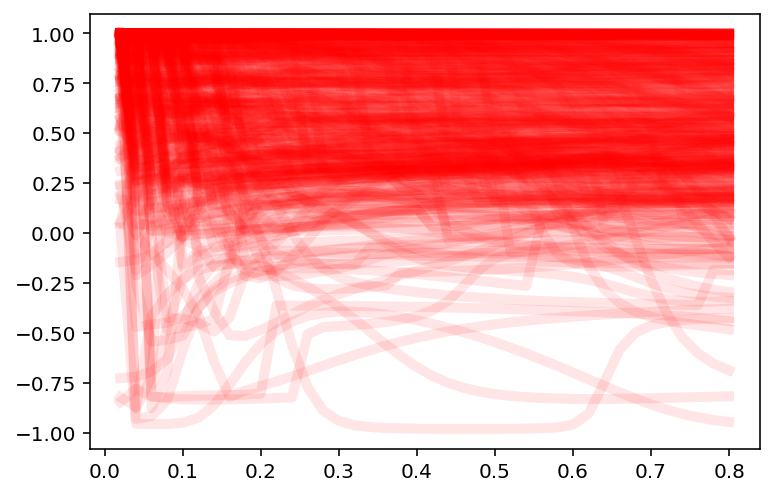

In [168]:
num_seeds=np.shape(ov)[0]
for batch_seed in range(num_seeds):
    plt.plot(nudges,ov[batch_seed], color='r', 
             linewidth=5,alpha=0.1)
plt.show()

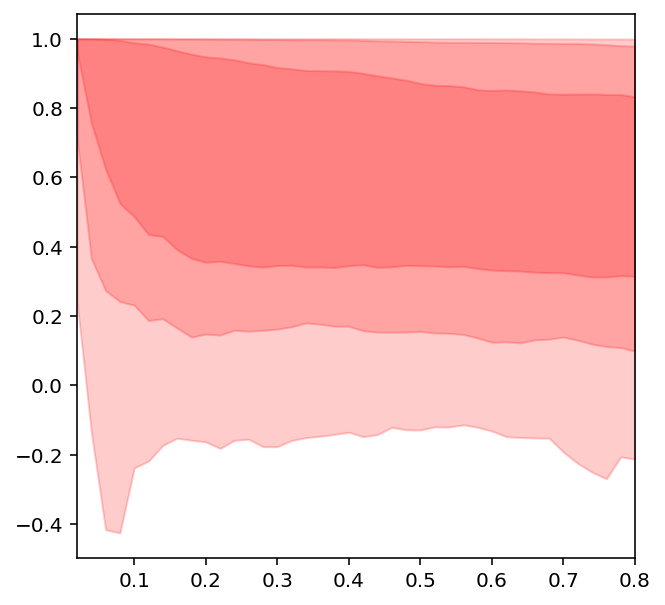

In [169]:
plt.figure(figsize=(5,5))

confidence_interval1 = 95
confidence_interval2 = 80
confidence_interval3 = 50
x = nudges

for ci in [confidence_interval1, confidence_interval2, confidence_interval3]:
    low = np.percentile(ov, 50 - ci / 2, axis=0)
    high = np.percentile(ov, 50 + ci / 2, axis=0)
    plt.fill_between(x, low, high, color='r', alpha=0.2)
plt.margins(x=0)
plt.savefig("overlap_dist_vs_nudge_05_27_testgradient2.pdf")
plt.show()

# Re-check performance of old example

In [ ]:
n_test_samples=200
x_test_samples,y_test_samples=sample_batch_cluster_Ising_phase_sensor(n_test_samples)
test_samples=(x_test_samples,y_test_samples)

In [185]:
learning_rate=0.01
finite_nudging=0.1

# set up phase sensor (Hamiltonian terms etc)
N_sys=8
N_sens=2
phase_sensor = prepare_cluster_Ising_phase_sensor(N_sys,N_sens)

phase_sensor['sens_couplings']=np.array([-0.72409815,  0.13361044, -1.2278023 , -0.23840915, -0.34486133,
         0.9616242 , -0.36160976,  0.22029133, -0.4727352 , -0.17914465,
        -0.5347069 ,  0.34962335,  0.5396543 ,  0.07494976, -1.4591793 ],
       dtype='float32')
phase_sensor['sys_sens_couplings']=np.array([ 0.35675517,  0.04082463,  1.5253701 , -0.00945119, -0.01447352,
         0.63034874,  0.45206785,  0.5270429 ,  0.5116578 , -0.20654808,
        -0.12500209, -0.8324649 ,  0.64224327, -0.01931623,  0.71782416,
        -0.02047032,  0.5561105 ,  0.2355093 , -0.87676615, -0.68635577,
        -0.8949578 ,  0.20799667,  0.586686  , -0.23261307, -1.0705415 ,
        -0.5875825 , -0.68197066, -0.02554226, -0.18870065, -2.0603201 ,
        -0.2983112 , -0.21890749,  0.7560498 ,  0.4405442 , -0.5765182 ,
        -1.8238018 ], dtype='float32')

phase_sensor = initialize_phase_sensor_parameters(phase_sensor,optax.adam(learning_rate),skip_random_init=True)

In [186]:
acc,cost=eval_test_phase_sensor(phase_sensor,None,cost_function_mse,test_samples)

print("Accuracy: ", acc)
print("Cost: ", cost)

Accuracy:  0.98
Cost:  0.03259647373848332


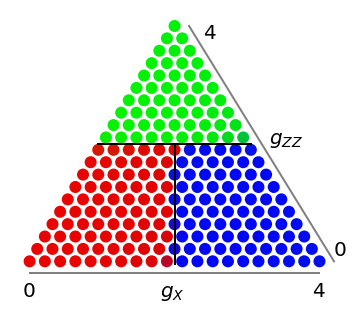

In [187]:
x_grid_samples=get_cluster_Ising_grid_samples(20)
y_pred_grid=evaluate_phase_sensor_on_batch(phase_sensor,x_grid_samples)

plot_cluster_Ising_results_inside_phase_triangle(x_grid_samples,y_pred_grid,show=True)
#plt.savefig("/tmp/results_clusterIsing_trainEverywhere_grid_finite_nudging.pdf")

In [188]:
# continue training for a while:
batch_size=10
num_batches=200

phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples),
                                                nonsparse=False,
                                                finite_nudging=finite_nudging)


Acc: 96.5 %: 100%|████████████████████████████| 200/200 [03:32<00:00,  1.06s/it]


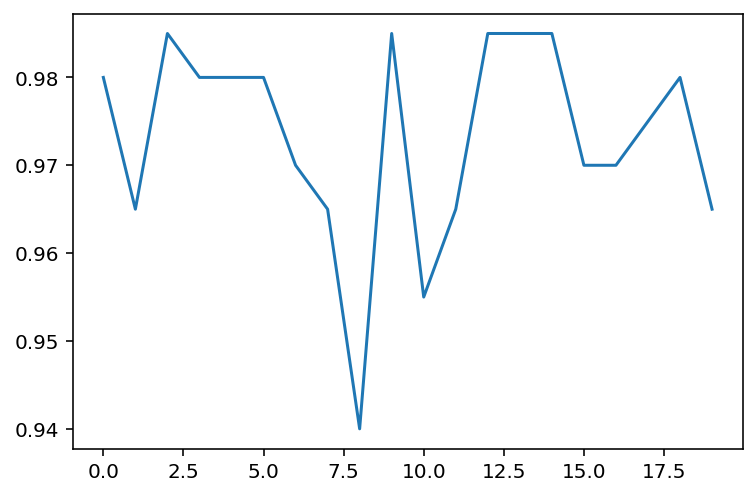

In [189]:
plt.plot(training_history['accuracy'])
plt.show()

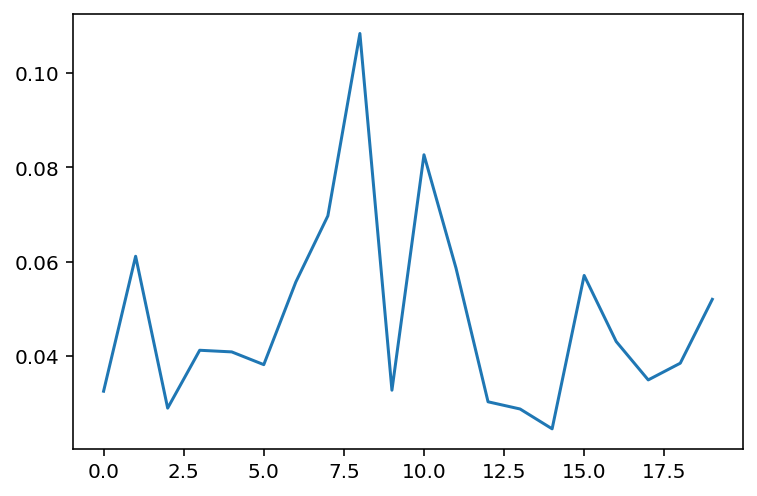

In [190]:
plt.plot(training_history['cost'])
plt.show()

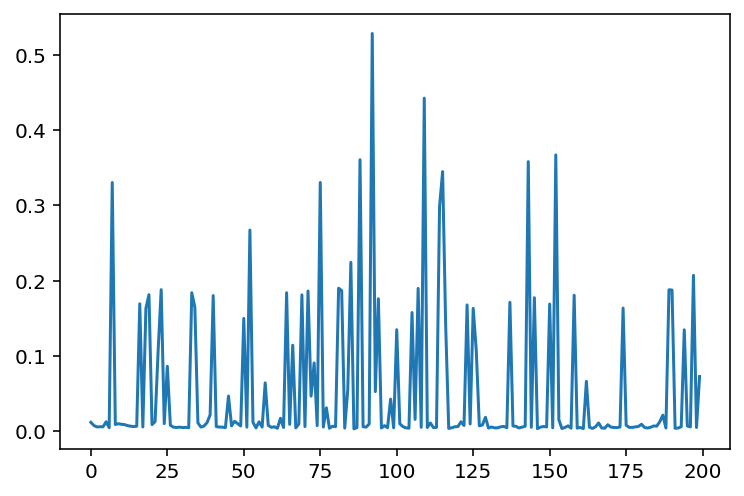

In [191]:
plt.plot(training_history['training_cost'])

In [197]:
phase_sensor,training_history=train_phase_sensor(phase_sensor,
                            sample_batch_cluster_Ising_phase_sensor,
                            cost_function_mse,grad_cost_function_mse,
                                learning_rate,batch_size,num_batches,
                            test_step=10,test_samples=(x_test_samples,y_test_samples),
                                                nonsparse=False,
                                                finite_nudging=finite_nudging,
                                                alternative_accuracies=True)

Acc: 97.5 %: 100%|████████████████████████████| 200/200 [05:06<00:00,  1.53s/it]


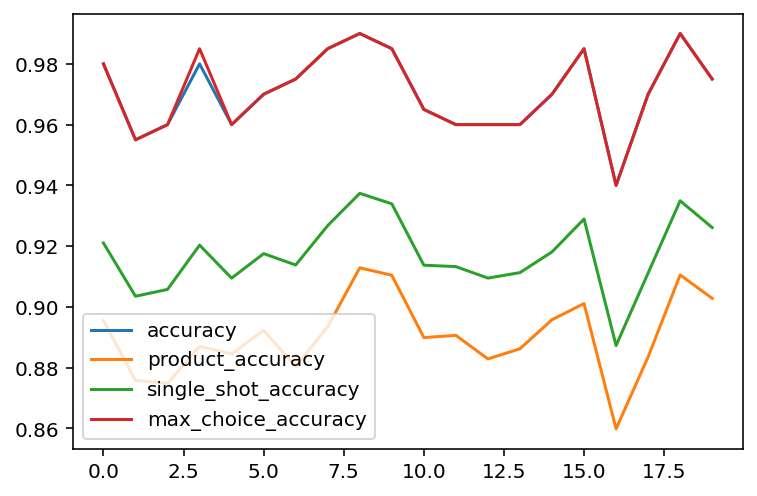

In [198]:
for what in ['accuracy','product_accuracy','single_shot_accuracy','max_choice_accuracy']:
    plt.plot(training_history[what], label=what)
plt.legend()
plt.show()
